# Insurance in Ireland - Snapshot of Motor Insurance and predictive models to mitigate impact of claims on financials

In [285]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import datetime as dt 
import cdsapi
import cfgrib
import os
import xarray as xr
from functools import reduce
import datetime as dt
from datetime import datetime, timedelta
import csv  
import seaborn as sns
from ipyparallel import Client
import sklearn
import warnings

In [286]:
# to simplify the visualization of the code, all python libraries warnings are going to be ignored
warnings.simplefilter('ignore')

Due to the execution time of ERA5 data (data gathering stage) all the code performed from this section to "Weather Data" was code in another notebook.
The file can be found in the following link (add link). Everything was "copy pasted" from there.

# CA1 - Insurance in the Republic of Ireland

# Table of Contents

- [Insurance in Ireland - Snapshot of Motor Insurance and predictive models to mitigate impact of claims on financials](#insurance-in-ireland-snapshot-of-motor-insurance-and-predictive-models-to-mitigate-impact-of-claims-on-financials)
- [CA1 - Insurance in the Republic of Ireland](#ca1---insurance-in-the-republic-of-ireland)
- [Understanding general data](#understanding-general-data)
- [Analyzing Databases](#analyzing-databases)
- [Data Gathering](#data-gathering)
- [Data Cleaning and Univariate analysis](#data-cleaning-and-univariate-analysis)
  - [Univariate Analysis - Non graphical methods](#univariate-analysis---non-graphical-methods)
- [Statistics calculations](#statistics-calculations)
  - [Statistics Frequency Categorical](#statistics-frequency-categorical)
  - [Statistics analysis](#statistics-analysis)
  - [Statistics interpretation](#statistics-interpretation)
  - [Statistics actionables](#statistics-actionables)
- [I Charts](#i-charts)
- [QQ Plot - rescaling](#qq-plot---rescaling)
- [Descrete Distributions](#descrete-distributions)
  - [Poisson](#poisson)
  - [Binomial](#binomial)
  - [Normal distribution](#normal-distribution)
- [Variable transformation](#variable-transformation)
- [Bivariate and multivariate analysis](#bivariate-and-multivariate-analysis)
  - [Pearson/Sperman](#pearson-sperman)
  - [Absolute correlation](#absolute-correlation)
  - [Cross-Correlation Magnitudes](#cross-correlation-magnitudes)
  - [Cross-Correlation Levels](#cross-correlation-levels)
  - [Categorical to numerical](#categorical-to-numerical)
  - [Categorical vs Categorical](#categorical-vs-categorical)
  - [Correlation target feature to many](#correlation-target-feature-to-many)
  - [Heatmap - cross correlation target feature to many](#heatmap---cross-correlation-target-feature-to-many)
  - [heatmap many to many](#heatmap-many-to-many)
- [outliers](#outliers)
- [Feature engineering](#feature-engineering)
- [Principal Component Analysis](#principal-component-analysis)
- [Model](#model)


A class is going to be created in order to be able to execute the data gathering section instead of running the pd.read_csv

In [287]:
class data_gathering: 
    def __init__(self, url: str): 
        self.url = url
        self.data = None 
    def load(self): 
        try:
            self.data = pd.read_csv(self.url)
            print('file loaded')
        except Exception as e:
            print(f'Error loading file: {e}')
            self.data = None
        return self.data
    def get_head(self, n=5):
        if self.data is not None:
            return self.data.head(n)
        else:
            print('No data loaded yet')
            return None

a function is going to be defined to certify that all the plots complies eith TURF principles

In [288]:
pallet = ['#0D3B66', '#145DA0', '#1976D2', '#4DA6FF', '#80BFFF']

In [289]:
def turf(ax=None, title=None, author=None, color_palette=pallet, force_legend=False, return_metrics=False):
    if ax is None:
        ax = plt.gca()
    axes = [ax] if not isinstance(ax, (list, np.ndarray)) else list(np.ravel(ax))
    metrics = []
    if title and len(axes) > 0:
        axes[0].set_title(title, fontsize=12, fontweight='bold')
    for idx, a in enumerate(axes):
        subplot_metrics = {}
        # Truthfull
        ymin, ymax = a.get_ylim()
        ydata = []
        for line in a.get_lines():
            ydata.extend(line.get_ydata())
        is_truthful_y = False
        if ydata and all(y >= 0 for y in ydata):
            data_range = max(ydata) - min(ydata)
            max_abs_val = max(abs(y) for y in ydata) if ydata else 0    
            if ymin > 0 or (max_abs_val > 0 and data_range / max_abs_val > 0.1):
                a.set_ylim(bottom=0)
                is_truthful_y = True
        subplot_metrics['set_ymin_zero'] = is_truthful_y
        try:
            x_values = a.get_xticks()
            numeric_x = [x for x in x_values if isinstance(x, (int, float))]
            is_truthful_x = False
            if all(2000 <= x <= 2030 for x in numeric_x) and numeric_x:
                current_xlim = a.get_xlim()
                if current_xlim[0] < 2016 and current_xlim[1] >= 2016:
                     a.set_xlim(left=2016, right=max(current_xlim[1], 2016))
                     is_truthful_x = True
                elif current_xlim[0] < 2016 and current_xlim[1] < 2016:
                     pass 
                else:
                    pass
            subplot_metrics['restricted_x_axis'] = is_truthful_x
        except Exception as e:
            subplot_metrics['restricted_x_axis'] = f'Error: {e}'

        # Undertability
        has_title = bool(axes[0].get_title()) 
        subplot_metrics['has_title'] = has_title
        has_xlabel = bool(a.get_xlabel())
        if not has_xlabel:
            a.set_xlabel('X-axis')
            has_xlabel = True
        subplot_metrics['has_xlabel'] = has_xlabel
        has_ylabel = bool(a.get_ylabel())
        if not has_ylabel:
            a.set_ylabel('Y-axis')
            has_ylabel = True
        subplot_metrics['has_ylabel'] = has_ylabel

        # Functionality
        lines = a.get_lines()
        n_lines = len(lines)
        legend_needed = n_lines > 1
        if color_palette and lines:
            for i, line in enumerate(lines):
                line.set_color(color_palette[i % len(color_palette)])
        legend = a.get_legend()
        has_legend = legend is not None
        a.grid(True, linestyle='--', alpha=0.5)
        a.tick_params(labelsize=9)
    
        subplot_metrics['n_lines'] = n_lines
        subplot_metrics['has_legend'] = has_legend
        subplot_metrics['legend_needed'] = legend_needed
        gridlines = len(a.get_xgridlines()) + len(a.get_ygridlines())
        subplot_metrics['grid_density'] = round(gridlines / (n_lines + 1), 2) if (n_lines + 1) else 0
        ink_area = sum([np.sum(~np.isnan(line.get_ydata())) for line in lines])
        bbox = a.get_position().bounds
        total_area = bbox[2] * bbox[3] * 10000
        subplot_metrics['data_ink_ratio'] = round(ink_area / total_area, 4) if total_area else None
        metrics.append(subplot_metrics)
    plt.tight_layout()
    
    # Printing the Metrics
    if return_metrics:
        print('\n' + '='*50)
        print('TURF Compliance Metrics')
        print('='*50)
        for idx, m in enumerate(metrics):
            print(f'\n--- Subplot {idx + 1} ---')
            for key, value in m.items():
                if isinstance(value, bool):
                    status = 'Yes' if value else 'No'
                    print(f'- {key.replace('_', ' ').title():<20}: {status}')
                elif isinstance(value, (float, int)):
                     print(f'- {key.replace('_', ' ').title():<20}: {value}')
                else:
                    print(f'- {key.replace('_', ' ').title():<20}: {value}')

        print('='*50 + '\n')

    return (axes, metrics) if return_metrics else axes

## Understanding general data

Core databases have been published by Ireland's central bank and the Central Office of Statistics. 
These core datasets are going to be use to have a snapshot of the industry and potential problems across the business sector.
This analysis is going to provide a subject of study to perform a deep data analysis of the insurance sector in Ireland.

### Analyzing Databases 

**ICA**

In [293]:
url = 'https://opendata.centralbank.ie/dataset/f4af4599-2954-42ce-a663-9b4f59653f05/resource/4279427f-fdbc-48ff-b9ff-70a45d1999e6/download/ica.csv'
loader = data_gathering(url)
loader.load()
df_ica = loader.data
df_ica

file loaded


,DATE,YEAR,STATISTIC,FLOW,COUNTERPART_AREA_DESC,UNIT,OBSERVATION,OBSERVATION_CURRENCY,UNIT_MULT_DESC,FREQUENCY,REFERENCE_AREA,ESA_CODE,REPORTING_SECTOR
0,31/12/2023,2023,A:IE:S128:L:W0:A:EUR,Claims incurred,"World (all entities, including reference area,...",All (head office and branches),70017.99,Euro,Millions,Annual,Ireland,S128,Insurance corporations
1,31/12/2023,2023,A:IE:S128:O:W0:A:EUR,Acquisition expenses,"World (all entities, including reference area,...",All (head office and branches),13516.37,Euro,Millions,Annual,Ireland,S128,Insurance corporations
2,31/12/2023,2023,A:IE:S128:P:W0:A:EUR,Premiums written,"World (all entities, including reference area,...",All (head office and branches),103613.41,Euro,Millions,Annual,Ireland,S128,Insurance corporations
3,31/12/2022,2022,A:IE:S128:L:W0:A:EUR,Claims incurred,"World (all entities, including reference area,...",All (head office and branches),68477.65,Euro,Millions,Annual,Ireland,S128,Insurance corporations
4,31/12/2022,2022,A:IE:S128:O:W0:A:EUR,Acquisition expenses,"World (all entities, including reference area,...",All (head office and branches),14526.19,Euro,Millions,Annual,Ireland,S128,Insurance corporations
5,31/12/2022,2022,A:IE:S128:P:W0:A:EUR,Premiums written,"World (all entities, including reference area,...",All (head office and branches),102386.56,Euro,Millions,Annual,Ireland,S128,Insurance corporations
6,31/12/2021,2021,A:IE:S128:L:W0:A:EUR,Claims incurred,"World (all entities, including reference area,...",All (head office and branches),64381.24,Euro,Millions,Annual,Ireland,S128,Insurance corporations
7,31/12/2021,2021,A:IE:S128:O:W0:A:EUR,Acquisition expenses,"World (all entities, including reference area,...",All (head office and branches),11937.22,Euro,Millions,Annual,Ireland,S128,Insurance corporations
8,31/12/2021,2021,A:IE:S128:P:W0:A:EUR,Premiums written,"World (all entities, including reference area,...",All (head office and branches),99254.70,Euro,Millions,Annual,Ireland,S128,Insurance corporations
9,31/12/2020,2020,A:IE:S128:L:W0:A:EUR,Claims incurred,"World (all entities, including reference area,...",All (head office and branches),58404.97,Euro,Millions,Annual,Ireland,S128,Insurance corporations


In [294]:
# graph by flow/year/amount
flow = df_ica['FLOW'].unique()
# Group by year/flow/amount and create the pivot table to compute
ica_agg = df_ica.groupby(['YEAR', 'FLOW'])['OBSERVATION'].sum().reset_index()
df_pivot = ica_agg.pivot(index='YEAR', columns='FLOW', values='OBSERVATION')
df_pivot

FLOW,Acquisition expenses,Claims incurred,Premiums written
YEAR,,,
2016,8242.86,50181.93,70905.26
2017,8376.42,48161.82,73406.67
2018,8647.05,46568.66,67780.24
2019,9547.15,54576.00,77789.52
2020,10565.40,58404.97,82110.26
2021,11937.22,64381.24,99254.70
2022,14526.19,68477.65,102386.56
2023,13516.37,70017.99,103613.41



TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : Yes
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 3
- Has Legend          : Yes
- Legend Needed       : Yes
- Grid Density        : 4.0
- Data Ink Ratio      : 0.004



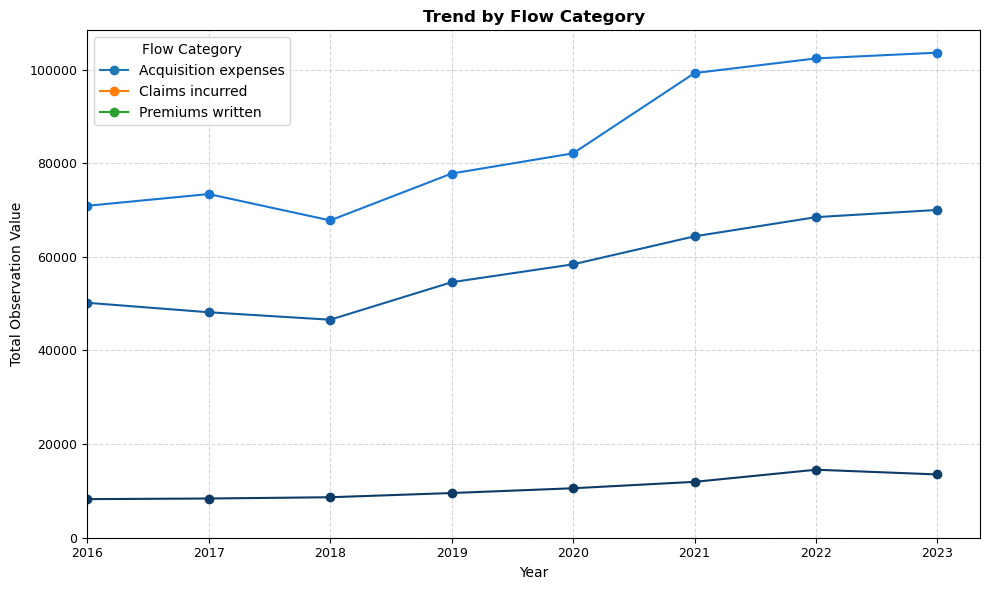

In [295]:
# plot 
plt.figure(figsize=(10, 6))
ax = plt.gca()
df_pivot.plot(kind='line', ax=ax, marker='o') 
plt.title('Trend by Flow Category')
plt.xlabel('Year')
plt.ylabel('Total Observation Value')
plt.legend(title='Flow Category')
axes, metrics_report = turf(ax, title='Trend by Flow Category', return_metrics=True)
plt.show()

In an 8 Year span, premiums written has seen a significant increase. in this study it will be explored what are the reasons for this growth

**Analyzing Databases - Premiums, Claims and aquisitions**
**Premiums**

for this file, a HTTP Error 403 was delivered while executing the code below. That error is the result of a server blocking the request. Hence, and in order to execute this withuot local files, the xls spreadsheet was uploaded to my personal google sheets acount to be consumed by any user original code was:

In [296]:
#url_claims = 'https://www.centralbank.ie/docs/default-source/statistics/data-and-analysis/insurance-corporations-statistics/insurance-corporations-statistics-data/premiums-claims-and-acquisition-expenses-statistics.xlsx'
#df_claims = pd.read_excel(url_claims, sheet_name='Premiums')
#df_claims.head()

In [297]:
# link from googlesheets (online published document from my personal account)
url = 'https://docs.google.com/spreadsheets/d/e/2PACX-1vT9315BBREwz7xS7bWynrxZ3jbDwm1ERO9uB3pkQwjCO3pjp16TKhsYnBvzoWVZjerRPLErqorMmTGO/pub?output=csv'
loader = data_gathering(url)
loader.load()
df_claims = loader.data
df_claims.head()

file loaded


,Year,Total Premiums,Domestic,Euro Area excl. Domestic,EEA Excl.Euro Area,Non-EEA
0,2016,"67,547","48,557","10,413","5,322","3,255"
1,2017,"73,390","53,832","11,267","4,982","3,309"
2,2018,"67,808","49,053","10,266","4,711","3,778"
3,2019,"75,050","53,450","11,650","5,740","4,192"
4,2020,"82,110","54,839","15,758",743,"10,770"


In [298]:
df_claims.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7 entries, 0 to 6
Data columns (total 6 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Year                      7 non-null      int64 
 1   Total Premiums            7 non-null      object
 2   Domestic                  7 non-null      object
 3   Euro Area excl. Domestic  7 non-null      object
 4   EEA Excl.Euro Area        7 non-null      object
 5   Non-EEA                   7 non-null      object
dtypes: int64(1), object(5)
memory usage: 468.0+ bytes


In [299]:
# all data are object type... the data is going to be change as a list and then run a for loop to make it faster and more efficient
columns = ['Total Premiums', 'Domestic', 'Euro Area excl. Domestic', 'EEA Excl.Euro Area','Non-EEA']
for col in columns:
    #firts data needs to be converted to string, afterwards commas can be remove from numbers to avoid any confussion. strip removes any unwanted space
    df_claims[col] = df_claims[col].astype(str).str.replace(',', '').str.strip()
    # string is converted to numbers and coerce is considerer to avoid cientific cognotation
    df_claims[col] = pd.to_numeric(df_claims[col], errors='coerce')


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : Yes
- Legend Needed       : No
- Grid Density        : 8.5
- Data Ink Ratio      : 0.0012

--- Subplot 2 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 3
- Has Legend          : Yes
- Legend Needed       : Yes
- Grid Density        : 4.5
- Data Ink Ratio      : 0.0035



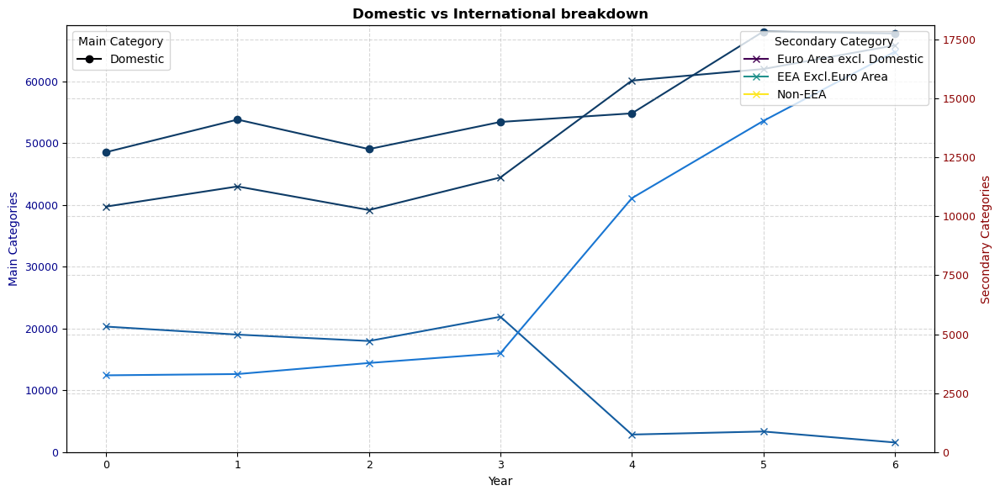

In [300]:
# plotting
# due to the big differences in the values, a secondary axis is going be plotted
PRIMARY_AXIS = ['Domestic']
SECONDARY_AXIS = ['Euro Area excl. Domestic', 'EEA Excl.Euro Area', 'Non-EEA']
fig, ax1 = plt.subplots(figsize=(12, 6))
# Create a new Axes with an invisible x-axis and an independent y-axis positioned opposite to the original one. 
ax2 = ax1.twinx()
# primary axis
df_claims[PRIMARY_AXIS].plot(kind='line', ax=ax1, marker='o', linestyle='-', colormap='inferno')
# Secondary axis
df_claims[SECONDARY_AXIS].plot(kind='line', ax=ax2, marker='x', linestyle='-', colormap='viridis')

# axis 1 design
ax1.set_ylabel('Main Categories', color='darkblue')
ax1.tick_params(axis='y', labelcolor='darkblue')
ax1.legend(loc='upper left', title='Main Category')

# Axis 2 design
ax2.set_ylabel('Secondary Categories', color='darkred')
ax2.tick_params(axis='y', labelcolor='darkred')
ax2.legend(loc='upper right', title='Secondary Category')

# Plot
ax1.set_xlabel('Year')
ax1.grid(True, linestyle='--', alpha=0.5)
axes, metrics_report = turf([ax1, ax2], title='Domestic vs International breakdown', return_metrics=True)
plt.show()

In [301]:
# growing percentage, and cap of the total growth per category is going to be analyzed 
last_year = df_claims.iloc[-1]
first_year = df_claims.iloc[0]
growth_rates = (last_year - first_year) / first_year
growth_rates_df = growth_rates.to_frame(name='Growth percentage')
# change values to percentages
growth_rates_df = (growth_rates_df['Growth percentage']*100).round(2)
growth_rates_df

Year                         0.30
Total Premiums              51.63
Domestic                    39.60
Euro Area excl. Domestic    65.68
EEA Excl.Euro Area         -92.35
Non-EEA                    421.63
Name: Growth percentage, dtype: float64

In [302]:
# Cap per category
total_increase = df_claims.iloc[-1] - df_claims.iloc[0]
total_premiums_increase = total_increase['Total Premiums']
cap = (total_increase / total_premiums_increase)
cap = cap.drop('Total Premiums')
cap_df = cap.to_frame(name='Contribution')
# Change value to percentage
cap_df = (cap_df['Contribution']*100).round(2)
cap_df

Year                         0.02
Domestic                    55.14
Euro Area excl. Domestic    19.61
EEA Excl.Euro Area         -14.09
Non-EEA                     39.35
Name: Contribution, dtype: float64

As analyzed above, organic growth is the biggest driver for the industry. Hence, we will look for a specific vertical to perform the study

**Assets and Liabilities**

for this file, a HTTP Error 403 was delivered while executing the code below. That error is the result of a server blocking the request. Hence, and in order to execute this withuot local files, the xls spreadsheet was uploaded to my personal google sheets acount to be consumed by any user
original code was:

In [303]:
#url_al = 'https://www.centralbank.ie/docs/default-source/statistics/data-and-analysis/insurance-corporations-statistics/insurance-corporations-statistics-data/balance-sheet-of-irish-insurance-corporations.xlsx?sfvrsn=ecfe681a_5'
#df_al = pd.read_excel(url_al, sheet_name='Table E')
#df_al.head()

In [304]:
url_al = 'https://docs.google.com/spreadsheets/d/e/2PACX-1vTv8vQer1eEx4RWdciHVIcpE_2qnwNAC3DQVGPWrN1XpUGyyeSPNuksFdho5W_vlIuJS3ZLbmBBvSMg/pub?output=xlsx'
df_al = pd.read_excel(url_al, sheet_name='Assets')
df_al.head()

,Quarter,Assets,Currency & deposits,Transferable deposits,Loans,Deposit guarantees in connection with reinsurance business,Debt securities,Insurance technical reserves and related claims,Equity,Listed Shares,Unlisted shares,Other equity,Investment Funds,MMF shares,Non-MMF shares,Financial derivatives,Non-financial assets,Remaining assets
0,2025-06-30 00:00:00,393242,20425,10967,17958,10022,67912,48462,52197,49063,1383,1750,165793,10949,154844,4626,4260,11609
1,30 Sept,388291,21211,11406,18160,14010,67397,47388,50688,47538,1344,1806,162227,11007,151220,5277,4229,11715
2,2025-12-31 00:00:00,386651,19182,9316,15609,11726,66958,46196,51709,48787,1308,1614,165902,10844,155058,5817,3984,11294
3,2025-03-31 00:00:00,404636,19287,9519,17307,13429,70908,47859,55249,52204,1393,1652,170492,10202,160289,5217,3954,14362
4,2025-06-30 00:00:00,417774,19315,9321,19014,14935,74373,49254,58642,55569,1320,1753,172978,9735,163244,5334,3801,15063


Assets are not going to be consider for further analysis, due to the type of data provided.
There's no access to detailed portafolio of each of the market competitors to determine the behavior or any other factual insight. Most of the components are financial derivatives or financial assets (FX, Stocks, bonds, etc) that needed detailed analysis and it's not sourced online! 
Furthermore, only the balance sheet is public, not the P&L. Profits cannot be analyzed in this context.

In [305]:
url_all = 'https://docs.google.com/spreadsheets/d/e/2PACX-1vTv8vQer1eEx4RWdciHVIcpE_2qnwNAC3DQVGPWrN1XpUGyyeSPNuksFdho5W_vlIuJS3ZLbmBBvSMg/pub?output=xlsx'
df_all = pd.read_excel(url_al, sheet_name='Liabilities')
df_all.head()

,Quarter,Liabilities,Loans,Deposit guarantees in connection with reinsurance business,Debt securities issued,Insurance technical reserves,Life insurance technical reserves,Unit linked,Non-unit linked,Non-life insurance technical reserves,Equity,Listed shares,Unlisted shares,Other equity,Financial derivatives,Remaining liabilities
0,2025-06-30 00:00:00,393241,7823,6046,906,333063,290694,244019,46675,42368,28401,-,28401,-,5448,17600
1,30 Sept,388291,7322,5469,919,327084,283212,239091,44121,43872,28418,-,28418,-,6243,18305
2,2025-12-31 00:00:00,386654,6978,5437,977,326318,286710,242929,43781,39608,28305,-,28305,-,6153,17923
3,2025-03-31 00:00:00,404636,6974,5473,1049,340992,296040,251983,44058,44952,29924,-,29924,-,5811,19886
4,2025-06-30 00:00:00,417774,7019,5610,1094,351417,303623,257863,45760,47794,30790,-,30790,-,6002,21452


increase or decrese on liabilities are going to be analyzed. For that a new tab from the original file is going to be imported to have a dataset from 2016 to 2024

In [306]:
url_all = 'https://docs.google.com/spreadsheets/d/e/2PACX-1vTv8vQer1eEx4RWdciHVIcpE_2qnwNAC3DQVGPWrN1XpUGyyeSPNuksFdho5W_vlIuJS3ZLbmBBvSMg/pub?output=xlsx'
df_all = pd.read_excel(url_al, sheet_name='Liabilities_det')
df_all.head()

,Unnamed: 0,Unnamed: 1,Liabilities,Loans,Deposit guarantees in connection with reinsurance business,Debt securities issued,Insurance technical reserves,Life insurance technical reserves,Unit linked,Non-unit linked,Non-life insurance technical reserves,Equity,Listed shares,Unlisted shares,Other equity,Financial derivatives,Remaining liabilities
0,2016.00,2016-09-30 00:00:00,298824,3954,3052,964,253449,226491,185966,40526,26957,22887,-,22887,-,2427,15144
1,NaN,31/09/2016,297450,4314,3407,1060,252715,227432,191622,35810,25283,23093,-,23093,-,2027,14240
2,2017.00,2017-03-31 00:00:00,304147,4372,3521,849,257539,230637,195055,35582,26902,22494,-,22494,-,2532,16360
3,NaN,2017-06-30 00:00:00,304195,4033,3336,813,258859,232376,197483,34893,26483,22411,-,22411,-,2558,15521
4,NaN,2017-09-29 00:00:00,307648,4030,3390,797,263374,236134,201519,34615,27240,22791,-,22791,-,2474,14181


the first 2 columns need to be addressed and merge (year-Quarter). Additionally date format needs to be standarized.
fillna methods can get the last valid observation... this is what we need to fill the NaN in column year.

In [307]:
# fill NaN with the previous observable value
df_all['Unnamed: 0'] = df_all['Unnamed: 0'].fillna(method='ffill')
# transform dates into standard format
df_all['Unnamed: 1'] = pd.to_datetime(df_all['Unnamed: 1'],format='%Y-%m-%d', errors='coerce')
df_all['Unnamed: 1']

0    2016-09-30
1           NaT
2    2017-03-31
3    2017-06-30
4    2017-09-29
5    2017-12-29
6    2018-03-29
7    2018-06-29
8    2018-09-28
9    2018-12-31
10   2019-01-29
11   2019-06-28
12   2019-09-30
13   2019-12-31
14   2020-03-31
15   2020-06-30
16   2020-09-30
17   2020-12-31
18   2021-03-31
19   2021-06-30
20   2021-09-30
21   2021-12-31
22   2022-03-31
23   2022-06-30
24   2022-09-30
25   2022-12-31
26   2023-03-31
27   2023-06-30
28   2023-09-30
29   2023-12-31
30   2024-03-31
Name: Unnamed: 1, dtype: datetime64[ns]

In [308]:
# Based on pandas documentation, a NaT value can be modified using fillna formula, which we will use since we know the value missing
df_all['Unnamed: 1'] = df_all['Unnamed: 1'].fillna(pd.to_datetime('2016-12-30'))
df_all['Unnamed: 1']

0    2016-09-30
1    2016-12-30
2    2017-03-31
3    2017-06-30
4    2017-09-29
5    2017-12-29
6    2018-03-29
7    2018-06-29
8    2018-09-28
9    2018-12-31
10   2019-01-29
11   2019-06-28
12   2019-09-30
13   2019-12-31
14   2020-03-31
15   2020-06-30
16   2020-09-30
17   2020-12-31
18   2021-03-31
19   2021-06-30
20   2021-09-30
21   2021-12-31
22   2022-03-31
23   2022-06-30
24   2022-09-30
25   2022-12-31
26   2023-03-31
27   2023-06-30
28   2023-09-30
29   2023-12-31
30   2024-03-31
Name: Unnamed: 1, dtype: datetime64[ns]

In [309]:
df_all.drop(columns='Unnamed: 0',inplace=True)
df_all.rename(columns={'Unnamed: 1': 'Date'}, inplace=True)
df_all.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31 entries, 0 to 30
Data columns (total 16 columns):
 #   Column                                                      Non-Null Count  Dtype         
---  ------                                                      --------------  -----         
 0   Date                                                        31 non-null     datetime64[ns]
 1   Liabilities                                                 31 non-null     int64         
 2   Loans                                                       31 non-null     int64         
 3   Deposit guarantees in connection with reinsurance business  31 non-null     int64         
 4   Debt securities issued                                      31 non-null     int64         
 5   Insurance technical reserves                                31 non-null     int64         
 6   Life insurance technical reserves                           31 non-null     int64         
 7   Unit linked                 

now the code will analize which variable is growing more among "Unit linked", "Non-unit linked" and "Non-life insurance technical reserves" to select the subject of our study. Since 2024 has data only from Q1 2024, the study is going to be from Q1 2017 to Q1 2024 in order to have consistency and avoid seasonality statistical noice.

In [310]:
interest_variables = ['Unit linked', 'Non-unit linked', 'Non-life insurance technical reserves']
df_all_iv = df_all[interest_variables]
last_year = df_all_iv.iloc[-1]
first_year = df_all_iv.iloc[2] #Q1 2024 is the third row, hence index 2
growth_rates_liabilities = (last_year - first_year) / first_year
growth_rates_liabilities_df= growth_rates_liabilities.to_frame(name='Growth percentage')
# change values to percentages
growth_rates_liabilities_df = (growth_rates_liabilities_df['Growth percentage']*100).round(2)
growth_rates_liabilities_df

Unit linked                             41.76
Non-unit linked                         43.98
Non-life insurance technical reserves   70.48
Name: Growth percentage, dtype: float64

Non-life insurance technical reserves presents the biggest growth. Based on that it is going to be selected as the subject of study.
7 components build this variable: Motor Vehicle Liability Insurance, Fire and Other Damage to Property, General Liability, Accident 
and Health Insurance, Credit and Suretyship Insurance, Marine, Aviation, and Transport Insurance; and Miscellaneous Financial Loss 
and Legal Expenses Insurance (Source: Bank of Ireland website) 
The only mandatory insurance is the Motor vehicle insurance (Road Traffic Act, 1961). Since the other types of insurance are voluntary or subject to 
contractual requirements, are not going to be analyzed to avoid assumptions or have a biased perspective.

**Subject of study: Motor Vehicle Insurance**

Many variables can be analized to define an hipotesis regarding the industry vertical and create a proper model for the task. In the academic paper, further details are going to be provided for the data selection. 
The variables used are going to be:
1. All vehicles licenced - source: CSO
2. Private Motor Insurance Data - Premiums - source: Bank of Ireland
3. Private Motor Insurance Data - Income and Expenditure - source: Bank of Ireland
4. Private Motor Insurance Data - Ultimate Claims - source: Bank of Ireland
5. Number of drivers with penalty points recorded by county - source: CSO
6. Vehicle Kilometers - source: CSO
7. Road Casualties and Collisions in Ireland - RSA
8. Fixed Charge Fines - Source: CSO
9. Weather - Source: Copernicus Climate Data Store

## Data Gathering

In [24]:
# Data from CSO is provided in json file, requests library is needed to perform this tasks
!pip install requests


[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


**Database: All vehicles licenced**

In [311]:
# All vehicles licenced CSO API
import requests
url_vl = 'https://ws.cso.ie/public/api.jsonrpc?data=%7B%22jsonrpc%22:%222.0%22,%22method%22:%22PxStat.Data.Cube_API.ReadDataset%22,%22params%22:%7B%22class%22:%22query%22,%22id%22:%5B%22C03788V04538%22,%22C02538V05016%22,%22C01841V02268%22%5D,%22dimension%22:%7B%22C03788V04538%22:%7B%22category%22:%7B%22index%22:%5B%22IE0%22%5D%7D%7D,%22C02538V05016%22:%7B%22category%22:%7B%22index%22:%5B%22-%22%5D%7D%7D,%22C01841V02268%22:%7B%22category%22:%7B%22index%22:%5B%22-%22%5D%7D%7D%7D,%22extension%22:%7B%22pivot%22:null,%22codes%22:false,%22language%22:%7B%22code%22:%22en%22%7D,%22format%22:%7B%22type%22:%22JSON-stat%22,%22version%22:%222.0%22%7D,%22matrix%22:%22TTA02%22%7D,%22version%22:%222.0%22%7D%7D'
response = requests.get(url_vl)
data_json = response.json()
data_json

{'jsonrpc': '2.0',
 'result': {'class': 'dataset',
  'dimension': {'STATISTIC': {'category': {'index': ['TTA02C01'],
     'label': {'TTA02C01': 'Vehicles Under Licence'},
     'unit': {'TTA02C01': {'decimals': 0,
       'label': 'Number',
       'position': 'end'}}},
    'label': 'Statistic'},
   'TLIST(A1)': {'category': {'index': ['2013',
      '2014',
      '2015',
      '2016',
      '2017',
      '2018',
      '2019',
      '2020',
      '2021',
      '2022',
      '2023',
      '2024'],
     'label': {'2013': '2013',
      '2014': '2014',
      '2015': '2015',
      '2016': '2016',
      '2017': '2017',
      '2018': '2018',
      '2019': '2019',
      '2020': '2020',
      '2021': '2021',
      '2022': '2022',
      '2023': '2023',
      '2024': '2024'}},
    'label': 'Year'},
   'C03788V04538': {'category': {'index': ['IE0'],
     'label': {'IE0': 'Ireland'}},
    'label': 'Licencing Authority',
    'link': {'enclosure': [{'type': 'application/geo+json',
       'href': 'https:/

In [312]:
# Due to its dim/coord functions, xarray will be used to transform the json into a dataframe
import xarray as xr
dataset = data_json['result']
dimensions = dataset['dimension']
values = dataset['value']

# the coord dictionary is  going to be built to begin the process
coords = {}
for key, dim_info in dimensions.items():
    # Use the dimension label as the coordinate name
    coord_name = dim_info['label']
    coords[coord_name] = list(dim_info['category']['label'].values())
# the shape of the data array is defined. use size, which we can be found in the line 16th line from bottom to top
shape = dataset['size']
# shape needs to be transform, since its a list numpy needs to transfor it into a 5d shape 
re_shape = np.array(values).reshape(shape)
print(shape, re_shape)

[1, 12, 1, 1, 1] [[[[[2482557.]]]


  [[[2515322.]]]


  [[[2570294.]]]


  [[[2624958.]]]


  [[[2675879.]]]


  [[[2717722.]]]


  [[[2805839.]]]


  [[[2860984.]]]


  [[[2890975.]]]


  [[[2919005.]]]


  [[[3002092.]]]


  [[[3143356.]]]]]


In [313]:
# Create array
data_array = xr.DataArray(data=re_shape, coords=coords, dims=list(coords.keys()))
# flatten data array
df_vl_final = data_array.stack(combined_index=list(coords.keys())).reset_index('combined_index')
# create df
df_vl_final = data_array.to_series().to_frame(name='Value').reset_index()
df_vl_final

,Statistic,Year,Licencing Authority,Taxation Class,Type of Fuel,Value
0,Vehicles Under Licence,2013,Ireland,Total Vehicles,All fuel types,2482557.00
1,Vehicles Under Licence,2014,Ireland,Total Vehicles,All fuel types,2515322.00
2,Vehicles Under Licence,2015,Ireland,Total Vehicles,All fuel types,2570294.00
3,Vehicles Under Licence,2016,Ireland,Total Vehicles,All fuel types,2624958.00
4,Vehicles Under Licence,2017,Ireland,Total Vehicles,All fuel types,2675879.00
5,Vehicles Under Licence,2018,Ireland,Total Vehicles,All fuel types,2717722.00
6,Vehicles Under Licence,2019,Ireland,Total Vehicles,All fuel types,2805839.00
7,Vehicles Under Licence,2020,Ireland,Total Vehicles,All fuel types,2860984.00
8,Vehicles Under Licence,2021,Ireland,Total Vehicles,All fuel types,2890975.00
9,Vehicles Under Licence,2022,Ireland,Total Vehicles,All fuel types,2919005.00


**Database: Drivers with penalties**

In [314]:
# drivers with penalties
import requests
url_dp = 'https://ws.cso.ie/public/api.jsonrpc?data=%7B%22jsonrpc%22:%222.0%22,%22method%22:%22PxStat.Data.Cube_API.ReadDataset%22,%22params%22:%7B%22class%22:%22query%22,%22id%22:%5B%22C03166V03820%22%5D,%22dimension%22:%7B%22C03166V03820%22:%7B%22category%22:%7B%22index%22:%5B%22X95%22%5D%7D%7D%7D,%22extension%22:%7B%22pivot%22:null,%22codes%22:false,%22language%22:%7B%22code%22:%22en%22%7D,%22format%22:%7B%22type%22:%22JSON-stat%22,%22version%22:%222.0%22%7D,%22matrix%22:%22PPA02%22%7D,%22version%22:%222.0%22%7D%7D'
response = requests.get(url_dp)
data_json = response.json()
data_json

{'jsonrpc': '2.0',
 'result': {'class': 'dataset',
  'dimension': {'STATISTIC': {'category': {'index': ['PPA02C01'],
     'label': {'PPA02C01': 'Penalty points recorded'},
     'unit': {'PPA02C01': {'decimals': 0,
       'label': 'Number',
       'position': 'end'}}},
    'label': 'Statistic'},
   'TLIST(A1)': {'category': {'index': ['2021', '2022', '2023'],
     'label': {'2021': '2021', '2022': '2022', '2023': '2023'}},
    'label': 'Year'},
   'C03166V03820': {'category': {'index': ['X95'],
     'label': {'X95': 'All drivers'}},
    'label': 'County',
    'link': {'enclosure': [{'type': 'application/geo+json',
       'href': 'https://ws.cso.ie/public/api.static/PxStat.Data.GeoMap_API.Read/893a6eb4f4a6f907410396ec8d8b738b'}]}}},
  'extension': {'matrix': 'PPA02',
   'reasons': ['Planned release'],
   'language': {'code': 'en', 'name': 'English'},
   'elimination': {'C03166V03820': 'X95'},
   'contact': {'name': 'Noreen Dorgan',
    'email': 'transport@cso.ie',
    'phone': '(+353) 21

Since the data structure of the json file is exactly the same as for licenced cars. A function is going to be created to execute this process from now on

In [315]:
def retrieve_data(data_json: dict):
    dataset = data_json['result']
    dimensions = dataset['dimension']
    values = dataset['value']
    # the coord dictionary is  going to be built to begin the process
    coords = {}
    for key, dim_info in dimensions.items():
        # Use the dimension label as the coordinate name
        coord_name = dim_info['label']
        coords[coord_name] = list(dim_info['category']['label'].values())
    # the shape of the data array is defined. use size, which we can be found in the line 16th line from bottom to top
    shape = dataset['size']
    # shape needs to be transform, since its a list numpy needs to transfor it into a 5d shape 
    re_shape = np.array(values).reshape(shape)
    data_array = xr.DataArray(data=re_shape, coords=coords, dims=list(coords.keys()))
    # flatten data array
    df_final = data_array.stack(combined_index=list(coords.keys())).reset_index('combined_index')
    # create df
    df_final = data_array.to_series().to_frame(name='Value').reset_index()
    return df_final
    

In [316]:
df_dp_final = retrieve_data(data_json)
df_dp_final

,Statistic,Year,County,Value
0,Penalty points recorded,2021,All drivers,542219.00
1,Penalty points recorded,2022,All drivers,544936.00
2,Penalty points recorded,2023,All drivers,541994.00


**Database: Vehicle Kilometer**

In [867]:
# Kms driven in Ireland yearly (more traffic more accidents?)
import requests
url_km = 'https://ws.cso.ie/public/api.jsonrpc?data=%7B%22jsonrpc%22:%222.0%22,%22method%22:%22PxStat.Data.Cube_API.ReadDataset%22,%22params%22:%7B%22class%22:%22query%22,%22id%22:%5B%22STATISTIC%22,%22C02875V03459%22%5D,%22dimension%22:%7B%22STATISTIC%22:%7B%22category%22:%7B%22index%22:%5B%22THA10C2%22%5D%7D%7D,%22C02875V03459%22:%7B%22category%22:%7B%22index%22:%5B%22-%22%5D%7D%7D%7D,%22extension%22:%7B%22pivot%22:null,%22codes%22:false,%22language%22:%7B%22code%22:%22en%22%7D,%22format%22:%7B%22type%22:%22JSON-stat%22,%22version%22:%222.0%22%7D,%22matrix%22:%22THA10%22%7D,%22version%22:%222.0%22%7D%7D'
response = requests.get(url_km)
data_json = response.json()
data_json

{'jsonrpc': '2.0',
 'result': {'class': 'dataset',
  'dimension': {'STATISTIC': {'category': {'index': ['THA10C2'],
     'label': {'THA10C2': 'Kilometres Travelled'},
     'unit': {'THA10C2': {'decimals': 0,
       'label': 'Million',
       'position': 'end'}}},
    'label': 'Statistic'},
   'TLIST(A1)': {'category': {'index': ['2000',
      '2001',
      '2002',
      '2003',
      '2004',
      '2005',
      '2006',
      '2007',
      '2008',
      '2009',
      '2010',
      '2011',
      '2012',
      '2013',
      '2014',
      '2015',
      '2016',
      '2017',
      '2018',
      '2019',
      '2020',
      '2021',
      '2022',
      '2023'],
     'label': {'2000': '2000',
      '2001': '2001',
      '2002': '2002',
      '2003': '2003',
      '2004': '2004',
      '2005': '2005',
      '2006': '2006',
      '2007': '2007',
      '2008': '2008',
      '2009': '2009',
      '2010': '2010',
      '2011': '2011',
      '2012': '2012',
      '2013': '2013',
      '2014': '2014',

As in the last 2 requests, datastructure is homogeneous from source. Same code can be used to create the dataframe

In [371]:
df_km_final = retrieve_data(data_json) 

In [372]:
# Value column name to be renamed properly 
column = {'Value': 'Km Driven - (MM)'}
df_km_final.rename(columns=column, inplace=True)
df_km_final

,Statistic,Year,Type of Vehicle,Km Driven - (MM)
0,Kilometres Travelled,2000,All vehicle types,30483.00
1,Kilometres Travelled,2001,All vehicle types,32272.00
2,Kilometres Travelled,2002,All vehicle types,33533.00
3,Kilometres Travelled,2003,All vehicle types,35606.00
4,Kilometres Travelled,2004,All vehicle types,38154.00
5,Kilometres Travelled,2005,All vehicle types,39777.00
6,Kilometres Travelled,2006,All vehicle types,41357.00
7,Kilometres Travelled,2007,All vehicle types,43368.00
8,Kilometres Travelled,2008,All vehicle types,43721.00
9,Kilometres Travelled,2009,All vehicle types,45110.00


In [373]:
# Private motor premiums 
url = 'https://opendata.centralbank.ie/dataset/e678991b-c2f2-4ed0-9102-dfcec0dd8247/resource/d0a2cf34-040a-486c-80f6-cf8a6e5081a2/download/ncid_open_data_mot_premium.csv'
df_private_premiums = pd.read_csv(url)
# monetary value is provided in  cienctific cognotation
df_private_premiums['Value'] = df_private_premiums['Value'].astype('float') 
pd.set_option('display.float_format', '{:.2f}'.format)
df_private_premiums

,Year,Quarter,Measure,CoverType,Value
0,2009,200903,Gross Earned Premium,Comprehensive,180078838.75
1,2009,200906,Gross Earned Premium,Comprehensive,178470920.66
2,2009,200909,Gross Earned Premium,Comprehensive,175242917.66
3,2009,200912,Gross Earned Premium,Comprehensive,173836110.60
4,2010,201003,Gross Earned Premium,Comprehensive,167598511.22
...,...,...,...,...,...
575,2022,202206,Written Policy Count,Third Party,48458.80
576,2022,202209,Written Policy Count,Third Party,50385.61
577,2022,202212,Written Policy Count,Third Party,39771.58
578,2023,202303,Written Policy Count,Third Party,38500.84


a snapchat of the dataframe is needed to understand concepts and information provided. Later in this analysis, the variable is going to be analyzed and selected properly

In [321]:
descriptive_df_premiums = df_private_premiums.groupby(['Measure', 'CoverType'])['Value'].mean().reset_index()
descriptive_df_premiums

,Measure,CoverType,Value
0,Earned Policy Count,Comprehensive,404196.44
1,Earned Policy Count,Third Party,73373.52
2,Earned Vehicle Years,Comprehensive,403569.97
3,Earned Vehicle Years,Third Party,73121.47
4,Gross Earned Premium,Comprehensive,218879096.45
5,Gross Earned Premium,Third Party,48559406.23
6,Gross Written Premium,Comprehensive,222879007.47
7,Gross Written Premium,Third Party,49347951.29
8,Written Policy Count,Comprehensive,407154.98
9,Written Policy Count,Third Party,72918.52


it is important to consider that some variables (counts) are units, and some others are monetary units (gross are money in €)

Database: Private motor income expenditure

In [322]:
url = 'https://opendata.centralbank.ie/dataset/321497e6-f5cf-4a46-ab6e-51ad376c992b/resource/314445b5-cfc5-45ae-a00d-d8a870df84be/download/ncid_private_motor_income_expenditure.csv'
df_pmie = pd.read_csv(url)
df_pmie

,Year,Measure,Value
0,2009,Gross Written Premium,729300801.20
1,2010,Gross Written Premium,752601318.90
2,2011,Gross Written Premium,786648707.50
3,2012,Gross Written Premium,849821497.80
4,2013,Gross Written Premium,802612705.10
...,...,...,...
239,2018,Gross Earned Premium - Direct Distribution,476134328.90
240,2019,Gross Earned Premium - Direct Distribution,464821096.30
241,2020,Gross Earned Premium - Direct Distribution,439564071.50
242,2021,Gross Earned Premium - Direct Distribution,449890277.70


as perfored before, this dataset needs to be preanalyzed

In [323]:
descriptive_df_pmie = df_private_premiums.groupby(['Measure'])['Value'].mean().reset_index()
descriptive_df_pmie

,Measure,Value
0,Earned Policy Count,238784.98
1,Earned Vehicle Years,238345.72
2,Gross Earned Premium,133719251.34
3,Gross Written Premium,136113479.38
4,Written Policy Count,240036.75


as expected, some variables are units and some others are monetary units in €. More analysis is needed to be done

**Database: Ultimate claims**

In [324]:
url = 'https://opendata.centralbank.ie/dataset/a2bf4bad-7f0e-4b52-978b-7f35ab74e20b/resource/53cf949a-1433-4661-8fc3-d567650bb84f/download/ncid_private_motor_ultimate_claims.csv'
df_uc = pd.read_csv(url)
df_uc

,AccidentQuarter,Measure,ClaimType,Value
0,200903,Ultimate Costs,Accidental Damage,51134823.85
1,200906,Ultimate Costs,Accidental Damage,34743749.72
2,200909,Ultimate Costs,Accidental Damage,32676745.82
3,200912,Ultimate Costs,Accidental Damage,52417339.72
4,201003,Ultimate Costs,Accidental Damage,38389351.44
...,...,...,...,...
779,202112,Ultimate Numbers (incl. nils),Windscreen,14145.51
780,202203,Ultimate Numbers (incl. nils),Windscreen,17212.50
781,202206,Ultimate Numbers (incl. nils),Windscreen,18526.91
782,202209,Ultimate Numbers (incl. nils),Windscreen,17739.75


In [325]:
descriptive_df_uc = df_uc.groupby(['Measure', 'ClaimType'])['Value'].mean().reset_index()
descriptive_df_uc

,Measure,ClaimType,Value
0,Ultimate Costs,Accidental Damage,26146940.52
1,Ultimate Costs,Fire and Theft,4611908.24
2,Ultimate Costs,Third Party Damage,19575448.40
3,Ultimate Costs,Third Party Injury (<=250k),82855363.00
4,Ultimate Costs,Third Party Injury (>250k),34867235.78
5,Ultimate Costs,Third Party Injury (Total),117722598.78
6,Ultimate Costs,Windscreen,4171602.86
7,Ultimate Numbers (incl. nils),Accidental Damage,15329.26
8,Ultimate Numbers (incl. nils),Fire and Theft,3150.61
9,Ultimate Numbers (incl. nils),Third Party Damage,11093.26


count and € measurements in the dataset

**Database: Claims Settlement**

In [326]:
url = 'https://opendata.centralbank.ie/dataset/ab87e2b3-b6e1-4039-9573-39cd44f59481/resource/67ac6517-f6f5-48a5-92af-4d101e778191/download/ncid_mot_settled_claims_settlement_cost_band.csv'
df_cs = pd.read_csv(url)
df_cs

,SettledYear,Measure,ClaimType,SettlementChannel,SettledCostBand,Value
0,2015,Number,Third Party Injury (Total),Direct,0 - 10000,2397.00
1,2015,Number,Third Party Injury (Total),Direct,10001 - 15000,1602.00
2,2015,Number,Third Party Injury (Total),Direct,15001 - 30000,1521.00
3,2015,Number,Third Party Injury (Total),Direct,30001 - 45000,248.00
4,2015,Number,Third Party Injury (Total),Direct,45001 - 60000,92.00
...,...,...,...,...,...,...
331,2022,Total Cost,Third Party Injury (Total),PIAB,15001 - 30000,7711265.97
332,2022,Total Cost,Third Party Injury (Total),PIAB,30001 - 45000,2272077.95
333,2022,Total Cost,Third Party Injury (Total),PIAB,45001 - 60000,1529690.86
334,2022,Total Cost,Third Party Injury (Total),PIAB,60001 - 100000,1983889.36


In [327]:
descriptive_df_cs = df_cs.groupby(['Measure', 'ClaimType', 'SettlementChannel'])['Value'].mean().reset_index()
descriptive_df_cs

,Measure,ClaimType,SettlementChannel,Value
0,Number,Third Party Injury (Total),Direct,739.98
1,Number,Third Party Injury (Total),Litigated,523.91
2,Number,Third Party Injury (Total),PIAB,257.73
3,Total Cost,Third Party Injury (Total),Direct,12336630.89
4,Total Cost,Third Party Injury (Total),Litigated,38836007.63
5,Total Cost,Third Party Injury (Total),PIAB,6249747.22


**Database: Road Casualties and Collisions in Ireland 2019**

The report is in PDF file. To navigate and extract information of interest (and the source of what it's going to be used as dataframe) it is needed to install and use tabula

Java 8+ is a requisit to run tabula. If the user doesn't have Java installed in the system, a URL with the document generated by tabula library is going to be provided

Due to issues creating the Path in my laptop enviroments, the table was copy and paste on excel and published online so it can be consume for terms of this project. The best practice would be use tabula or any similar python library in order to avoid tabulation mistakes

In [328]:
url = 'https://docs.google.com/spreadsheets/d/e/2PACX-1vR_OsEIwwlGJqtnmG6DYJk2nOEG8s0rQOT0GKczgTGoonFlMF3ueA1J3XzesEJIWELv0m0XGjH_bZty/pub?output=csv'
df_rsa = pd.read_csv(url)
df_rsa

,Collision\n Type,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019
0,Fatal,185,172,152,179,178,155,172,140,128,129
1,Injury,"5,595","5,058","5,458","4,797","5,618","5,676","5,706","5,867","5,928","5,699"
2,Damage,"21,305","21,863","20,561","21,734","33,510","35,997","37,085","40,702","41,389","43,015"
3,TOTAL,"27,085","27,093","26,171","26,710","39,306","41,828","42,963","46,709","47,445","48,843"
4,Vehicles current licences,"2,416,000","2,425,000","2,403,000","2,483,000","2,515,000","2,570,000","2,625,000","2,676,000","2,718,000","2,806,000"


the dataframe is needeed to be transposed

In [329]:
df_rsa_transposed = df_rsa.transpose().reset_index()
df_rsa_transposed

,index,0,1,2,3,4
0,Collision\n Type,Fatal,Injury,Damage,TOTAL,Vehicles current licences
1,2010,185,"5,595","21,305","27,085","2,416,000"
2,2011,172,"5,058","21,863","27,093","2,425,000"
3,2012,152,"5,458","20,561","26,171","2,403,000"
4,2013,179,"4,797","21,734","26,710","2,483,000"
5,2014,178,"5,618","33,510","39,306","2,515,000"
6,2015,155,"5,676","35,997","41,828","2,570,000"
7,2016,172,"5,706","37,085","42,963","2,625,000"
8,2017,140,"5,867","40,702","46,709","2,676,000"
9,2018,128,"5,928","41,389","47,445","2,718,000"


In [330]:
# headers are needed to change
df_rsa_transposed.columns = df_rsa_transposed.iloc[0]
df_rsa_transposed

,Collision\n Type,Fatal,Injury,Damage,TOTAL,Vehicles current licences
0,Collision\n Type,Fatal,Injury,Damage,TOTAL,Vehicles current licences
1,2010,185,"5,595","21,305","27,085","2,416,000"
2,2011,172,"5,058","21,863","27,093","2,425,000"
3,2012,152,"5,458","20,561","26,171","2,403,000"
4,2013,179,"4,797","21,734","26,710","2,483,000"
5,2014,178,"5,618","33,510","39,306","2,515,000"
6,2015,155,"5,676","35,997","41,828","2,570,000"
7,2016,172,"5,706","37,085","42,963","2,625,000"
8,2017,140,"5,867","40,702","46,709","2,676,000"
9,2018,128,"5,928","41,389","47,445","2,718,000"


In [331]:
# change collision to Year
column = {'Collision\n  Type': 'Year'}
df_rsa_transposed.rename(columns= column, inplace=True)
df_rsa_transposed

,Year,Fatal,Injury,Damage,TOTAL,Vehicles current licences
0,Collision\n Type,Fatal,Injury,Damage,TOTAL,Vehicles current licences
1,2010,185,"5,595","21,305","27,085","2,416,000"
2,2011,172,"5,058","21,863","27,093","2,425,000"
3,2012,152,"5,458","20,561","26,171","2,403,000"
4,2013,179,"4,797","21,734","26,710","2,483,000"
5,2014,178,"5,618","33,510","39,306","2,515,000"
6,2015,155,"5,676","35,997","41,828","2,570,000"
7,2016,172,"5,706","37,085","42,963","2,625,000"
8,2017,140,"5,867","40,702","46,709","2,676,000"
9,2018,128,"5,928","41,389","47,445","2,718,000"


In [332]:
# Drop index 0 (former headers)
df_rsa_transposed.drop(index=0, inplace=True)
df_rsa_transposed.reset_index(drop=True, inplace=True)
df_rsa_transposed

,Year,Fatal,Injury,Damage,TOTAL,Vehicles current licences
0,2010,185,"5,595","21,305","27,085","2,416,000"
1,2011,172,"5,058","21,863","27,093","2,425,000"
2,2012,152,"5,458","20,561","26,171","2,403,000"
3,2013,179,"4,797","21,734","26,710","2,483,000"
4,2014,178,"5,618","33,510","39,306","2,515,000"
5,2015,155,"5,676","35,997","41,828","2,570,000"
6,2016,172,"5,706","37,085","42,963","2,625,000"
7,2017,140,"5,867","40,702","46,709","2,676,000"
8,2018,128,"5,928","41,389","47,445","2,718,000"
9,2019,129,"5,699","43,015","48,843","2,806,000"


**Database: Fixed Charge Fines**

In [333]:
# fixed charge fines - Gardai
url_gardai = 'https://ws.cso.ie/public/api.jsonrpc?data=%7B%22jsonrpc%22:%222.0%22,%22method%22:%22PxStat.Data.Cube_API.ReadDataset%22,%22params%22:%7B%22class%22:%22query%22,%22id%22:%5B%5D,%22dimension%22:%7B%7D,%22extension%22:%7B%22pivot%22:null,%22codes%22:false,%22language%22:%7B%22code%22:%22en%22%7D,%22format%22:%7B%22type%22:%22JSON-stat%22,%22version%22:%222.0%22%7D,%22matrix%22:%22RCD11%22%7D,%22version%22:%222.0%22%7D%7D' 
response = requests.get(url_gardai)
data_json = response.json()
data_json

{'jsonrpc': '2.0',
 'result': {'class': 'dataset',
  'dimension': {'STATISTIC': {'category': {'index': ['RCD11C01'],
     'label': {'RCD11C01': 'Fixed Payment Notice offences'},
     'unit': {'RCD11C01': {'decimals': 0,
       'label': 'Number',
       'position': 'end'}}},
    'label': 'Statistic'},
   'TLIST(A1)': {'category': {'index': ['2015',
      '2016',
      '2017',
      '2018',
      '2019',
      '2020',
      '2021',
      '2022',
      '2023'],
     'label': {'2015': '2015',
      '2016': '2016',
      '2017': '2017',
      '2018': '2018',
      '2019': '2019',
      '2020': '2020',
      '2021': '2021',
      '2022': '2022',
      '2023': '2023'}},
    'label': 'Year'},
   'C03879V04630': {'category': {'index': ['1a',
      '1b',
      '2a',
      '2b',
      '2c',
      '2d',
      '3a',
      '3b',
      '3c',
      '4a',
      '4b',
      '5a',
      '5b',
      '5c',
      '5d',
      '6a',
      '6b'],
     'label': {'1a': 'Public order offences',
      '1b': 'Breac

As all the jsons analyzed before, the source of gardai tickets is CSO, which has the same data structure as noticed. 
the Function created to retrieve the data is going to be used

In [334]:
df_gardai_final = retrieve_data(data_json)
df_gardai_final

,Statistic,Year,Fixed Charge Offences,Value
0,Fixed Payment Notice offences,2015,Public order offences,5914.00
1,Fixed Payment Notice offences,2015,Breaches of public health restrictions,0.00
2,Fixed Payment Notice offences,2015,Drink driving offences,956.00
3,Fixed Payment Notice offences,2015,Speeding offences,209950.00
4,Fixed Payment Notice offences,2015,Holding a mobile phone while driving,28129.00
...,...,...,...,...
148,Fixed Payment Notice offences,2023,Motorway offences,79.00
149,Fixed Payment Notice offences,2023,Parking offences,25924.00
150,Fixed Payment Notice offences,2023,Other driving offences,15868.00
151,Fixed Payment Notice offences,2023,Cycling offences,562.00


In [335]:
# Statistics column can be dropped. Fixed charge offence is going to be gruped to have a glimpse of the informationabs
df_gardai_summary = df_gardai_final.groupby(['Year', 'Fixed Charge Offences'])['Value'].sum().reset_index()
df_gardai_summary

,Year,Fixed Charge Offences,Value
0,2015,Breaches of public health restrictions,0.00
1,2015,"Carriage of goods (HGV etc), trailers, taxis, ...",705.00
2,2015,Cycling offences,528.00
3,2015,Drink driving offences,956.00
4,2015,Failing to display L or N plates,4166.00
...,...,...,...
148,2023,Public order offences,5217.00
149,2023,Seat belt (incl. child restraint) offences,5154.00
150,2023,Speeding offences,148451.00
151,2023,Unaccompanied learner driver,8427.00


Notice that value is amount of fines, not a monetary measure.

**Database: Weather Data (Precipitation, Snow, Cloud Coverage)**

One variable to consider in motor insurance claims is weather. Hence, data of weather is gathered from ERAs 5 databases, from the Copernicus Climate Data Store
This API requires an API key, and an <u>**specific file type installed in the user's computer (cannot be executed through GitHub)**</u>. 
The code is provided below. *If the user doesn't want to install the keys, this step MUST BE SKIPPED. Additionally, the process takes around (118 hours)*. Execution time dependns on the Eras server, so it might take longer in "rush hours" 
<u>A copy of the data gathered is going to be provided for assessment use, in addition to  the "parallel" code to execute it</u>

A library is needed to create the API key in the user's computer. Pathlib has been selected for this purpouse

In [47]:
!pip install pathlib


In [2]:
import os
from pathlib import Path

Since the .csdsrc is already installed in my laptop, "skipping creation" is going to be the output.
CDS API keys belong to my personal account dmoling1111@gmail.com registerd at the Copernicus website.

In [3]:
# My keys for ERAs 5 DBs
CDS_API_URL = 'https://cds.climate.copernicus.eu/api/v2'
CDS_API_KEY = '6e606444-3b6f-4b28-8be6-6ffe5d0b53d8'
# Home directory path
cdsrc_path = Path.home() / '.cdsrc'
# Content to be written
cdsrc_content = f'url: {CDS_API_URL}\nkey: {CDS_API_KEY}'
# Verify if the path or key already exist, if not create the keys as required in APIs documentation
if not cdsrc_path.exists() or '6e606444-3b6f-4b28-8be6-6ffe5d0b53d8' in CDS_API_KEY:
    try:
        with open(cdsrc_path, 'w') as f:
            f.write(cdsrc_content)
        print(f'SUCCESS: .cdsrc file written to {cdsrc_path}')
    except Exception as e:
        print(f'ERROR: Could not write .cdsrc file. Please create it manually. Error: {e}')
else:
    print('.cdsrc file already exists. Skipping creation.')

.cdsrc file already exists. Skipping creation.


The Era5 DB delivers a grib file (.grib is only used for climate related reports). xarray is needed to read it and create the dataframe
Additionally CDSAPI and CFGRIB are required to request to the API

In [4]:
!pip install cdsapi
!pip install cfgrib
!pip install xarray


A multiprocessing library is required to execute the requests as a bulk/batch. Multiprocessing is not supported in Jupiter Notebook and Pytorch was not selected due to complexity (IT Must be installed first by the user, and makes the process more complicated and susceptible to errors.
In order to have an efficient process and minimize execution risks, Ipyparallel was selected

In [14]:
pip install Ipyparallel

Note: you may need to restart the kernel to use updated packages.


In [ ]:
# As stated in the final line of the output, the kernel may need to be restarted to update packages
os._exit(00)

**Function to extract, modify(from grib to a dataframe) preprocess and store in a CSV file all data extracted from ERA5 DB**

Disclosure: the following 2 blocks of functions (process_single_day and get_all_dates) are recycled from a personal project i've been working since february. It has been deeply tested under different coordinates, and grid sizes. If in the metadata of the github, it looks weird that it was excecuted in just a few tests, that's the whole reason of it. Any further evidence that this code was generated by me in the past and only addapted for the porpouses of this CA, please notify me and i can share everything that i've done alongside this period.
Additionally, that's is the reason that xarray has been the procedure of selection for the manipulation of json files. GRIB gave me a deep understanding of the tool (the only way to manipulate a grib) and provides more benefits that are going to be discloused in the academic paper.

Github repository with all the original codes i have been working can be found [here](https://github.com/2025388/Weather_Project/tree/main)

a sample of how the grib file was analyzed and its representation is shown after the execution of the patch process

In [144]:
def process_single_day(date_tuple):
    import cdsapi
    import cfgrib
    import pandas as pd
    import os
    import numpy as np
    import xarray as xr
    from functools import reduce
    import datetime as dt
    from datetime import datetime, timedelta
    import csv  
    import matplotlib.pyplot as plt
    import seaborn as sns
    from ipyparallel import Client
    year, month, day = date_tuple
    year_str, month_str, day_str = f"{year}", f"{month:02d}", f"{day:02d}"
    
    # Initialize CDS API client
    client = cdsapi.Client()

    # Define the GRIB file name
    grib_file = f"{year_str}_{month_str}_{day_str}_era5.grib"
    # GRIB file execution 
    dataset = "reanalysis-era5-single-levels"
    request = {
        "product_type": ["reanalysis"],
        "variable": [
            "total_precipitation",
            "total_cloud_cover",
            "snowfall"
        ],
        "year": [str(year)],
        "month": [str(month).zfill(2)],
        "day": [str(day).zfill(2)],
        "time": [
            "00:00", "01:00", "02:00",
            "03:00", "04:00", "05:00",
            "06:00", "07:00", "08:00",
            "09:00", "10:00", "11:00",
            "12:00", "13:00", "14:00",
            "15:00", "16:00", "17:00",
            "18:00", "19:00", "20:00",
            "21:00", "22:00", "23:00"
        ],
        "data_format": "grib",
        "download_format": "unarchived",
        "area": [55.5, -11, 51, -5], 
        'grid:': [4.0, 4.0],    
    }
    # Download GRIB file
    client.retrieve(dataset, request).download(grib_file)
    dataset = cfgrib.open_datasets(grib_file)
    # xarray info provided the perspective of the grib file. This step is excluded in 
    # this code, due to execution as a bulk using multiprocessing functions
    # Code:
    # ds = cfgrib.open_datasets(grib_file)
    # print(ds)
    #Initialize a list to store DataFrames
    dfs = []
    # Removing unnecesary information from de CDX file created from the GRIB
    for ds in dataset:
        if "step" in ds.dims:
            ds = ds.mean(dim="step") #this line is unecessary for this specific task since the grib is unidimentional. It becomes relevant if another gribfile with forecasts comes to play. dims is going to take the average of the multidimentional variable in different forecast scenarios providing a mean for the dataset
        if "valid_time" in ds.coords:
            ds = ds.drop_vars("valid_time")
        if "number" in ds.coords:
            ds = ds.drop_vars("number")
        try:
            df = ds.to_dataframe().reset_index()
            dfs.append(df)
        except Exception as e:
            print(f"Failed converting a dataset: {e}")
    for ds in dataset:#Grib files MUST be closed to be deleted in the lines below! open files are not possible to erase!
        ds.close()
    del dataset

    # Merge all DataFrames on ['time', 'latitude', 'longitude']
    if dfs:
        merged_df = reduce(lambda left, right: pd.merge(
            left, right,
            on=["time", "latitude", "longitude"],
            how="outer",
            suffixes=('', '_dup')  
        ), dfs)
        # Drop duplicated columns if created
        merged_df = merged_df.loc[:, ~merged_df.columns.str.endswith('_dup')]
    else:
        merged_df = pd.DataFrame()
    # preprocess the merged DataFrame
    dfm = merged_df.copy()
    dfm['coordinates'] = dfm['latitude'].astype(str) + ',' + dfm['longitude'].astype(str)
    dfm['time'] = pd.to_datetime(dfm['time'], format='%Y-%m-%dT%H:%M:%S.%fZ')
    dfm['day'] = dfm['time'].dt.day
    dfm['month'] = dfm['time'].dt.month
    dfm['year'] = dfm['time'].dt.year
    dfm['hour'] = dfm['time'].dt.hour
    dfm['day of the year'] = dfm['time'].dt.dayofyear
    new_order = ['time', 'day of the year', 'day', 'month', 'year', 'hour', 'latitude', 'longitude', 'coordinates'] + [col for col in dfm.columns if col not in ['time', 'day', 'month', 'year', 'hour', 'latitude', 'longitude', 'coordinates']]
    dfm = dfm[new_order]
    #drop days that don't belong to the day being analyzed
    merged_df.sort_values(by='time')
    if dfm['day'].iloc[0] != dfm['day'].iloc[-1]:
        dfm.dropna(subset=['sf'], inplace=True)
        dfm.dropna(subset=['step'], inplace=True)
    merged_df = dfm
    dfm['tp'] = dfm['tp'] * 1000 #convert total precipitation to milimeters
    dfm['sf'] = dfm['sf'] * 1000 #convert snow fall to milimeters    
    dfm['lat_weight'] = np.cos(np.deg2rad(dfm['latitude'])) #since the earth is NOT FLAT, weights per latitud must be assigned

    # list of variables to be analyzed
    weather = ['tp', 'tcc', 'sf']

    
    def weighted_mean(series, weights): #due to geometry rules, and Earth being an sphere, the mean cannot be calculated streighforward, it must be weighted.
        weighted_mean = (series * weights).sum() / weights.sum()
        return weighted_mean

    aggregations = {}
    # Regularized the info for further analysis in aggregation
    for col in weather:
        if col in ['tp', 'sf']: #both variables are the accumulation in a 24 period span, it is needed to analyzed separately to cloud coverage, which is situational.
            span = dfm.groupby(['latitude', 'longitude'])[col].sum().reset_index(name=f'{col}_daily')
            weights_map = dfm.drop_duplicates(subset=['latitude', 'longitude']).set_index(['latitude', 'longitude'])['lat_weight']
            span = span.set_index(['latitude', 'longitude']).join(weights_map)
            series = span[f'{col}_daily']
            weights = span['lat_weight']
        elif col == 'tcc':
            series = dfm.groupby(['latitude', 'longitude'])[col].mean()
            weights = dfm.drop_duplicates(subset=['latitude', 'longitude']).set_index(['latitude', 'longitude'])['lat_weight']
            
        else:
            continue # just for validation, avoiding inconsistencies if the xarray delivers something different at the time the df is created
        # Aggregations    
        aggregations[f'{col}_wmean'] = weighted_mean(series, weights)
        aggregations[f'{col}_min'] = series.min()
        aggregations[f'{col}_max'] = series.max()
        aggregations[f'{col}_std'] = series.std()
        aggregations[f'{col}_median'] = series.median()
        aggregations[f'{col}_range'] = series.max() - series.min()
    # Final data frrame containing all calculations stored in the aggregations dictionary 
    summary_df = pd.DataFrame(aggregations, index=[0])
    summary_df['Date'] = dfm['time'].iloc[0].date() 
    summary_df['day of the year'] = pd.to_datetime(summary_df['Date']).dt.dayofyear
    cols = ['Date', 'day of the year'] + [col for col in summary_df.columns if col not in ['Date', 'day of the year']]
    summary_df = summary_df[cols]

    #store summary_df in a csv file(BEST PRACTICE IS a DB, budget and infrasturcture restrictions = improvisation)
    file = 'weather_ireland.csv'

    # Check if the file already exists
    file_exists = os.path.exists(file)
    # Store information on CSV File
    if not file_exists:
        summary_df.to_csv(file, mode='w', header=True, index=False)
    else:
        summary_df.to_csv(file, mode='a', header=False, index=False)
       
    # Delete GRIB file if it exists
    if os.path.exists(grib_file):
        try:
            os.remove(grib_file)
        except Exception as e:
            print(f"Error deleting {grib_file}: {e}")
        pass
        

Function to get all dates included in this study. Due to time/storage restrictions the data comes from 1980 to date. Since it's not a regional analysis, the grid is 4x4 (see code where api is called). The ideal would be executing this in a, at least, 1x1 grid

In [1]:
# Get dates to be gathered in the analysis, and the convertion to the nomenclature needed for the GRIB request
def get_all_dates(start_date='1980-01-01', end_date='2024-12-31'):
    if end_date is None:
        end_date = datetime.today().strftime('%Y-%m-%d')
    start = datetime.strptime(start_date, '%Y-%m-%d')
    end = datetime.strptime(end_date, '%Y-%m-%d')
    delta = end - start
    return [(d.year, d.month, d.day) for d in (start + timedelta(days=i) for i in range(delta.days + 1))]


Multiprocess to execute the last 2 functions as a bulk/start and connect cluster 

In [4]:
import ipyparallel as ipp
# Create and initialization of clusters for paralleling processes 
cluster = ipp.Cluster(n=6)   # request 6 engines
rc = cluster.start_and_connect_sync()
print('Engines started:', len(rc))

Starting 6 engines with <class 'ipyparallel.cluster.launcher.LocalEngineSetLauncher'>


  0%|          | 0/6 [00:00<?, ?engine/s]

Engines started: 6


In [ ]:
import cdsapi
import cfgrib
import pandas as pd
import os
import numpy as np
import xarray as xr
from functools import reduce
import datetime as dt
from datetime import datetime, timedelta
import csv  
import matplotlib.pyplot as plt
import seaborn as sns
from ipyparallel import Client
# create instance to balance the workload
lview = rc.load_balanced_view()
all_dates = get_all_dates()
# Execute the multiprocessing
results = lview.map_sync(process_single_day, all_dates)
print('All tasks completed.')


Process started on Oct 6th at 4.15PM
process finished on Oct 12th at 2.06PM

In [6]:
# stop whole cluster/ since a syncrunus process is being used, await cluster.stop_cluster() cannot be used (carefull with this for future executions)
cluster.stop_cluster_sync()
print('Cluster stopped')

Cluster stopped


Due to the duration of the parallel process on ERA 5 DB and some connectivity issues during the gathering process, It is going to be checked if no dates are missed

In [45]:
#csv is uploaded in github/this file already has the missing dates,it is not needed to re run codes below to get missing dates 
csv = pd.read_csv('https://docs.google.com/spreadsheets/d/e/2PACX-1vQ23e0zqiqLInfDSND5z_QcqPgspB0Uw5gStnjlT_zsc3kzb_1Pk5ntII1dd0Ef_HNGPKA9v9tIELhp/pub?output=csv')
#list of all dates for validation
begining_date = dt.date(1980,1,1)
end_date = dt.date(2024,12,31)
time_delta = end_date - begining_date
total_days = time_delta.days + 1
#the format is needed to be change to dd/mm/yyyy
date_list = [(begining_date + dt.timedelta(days=x)).strftime('%d/%m/%Y') for x in range(total_days)]
# only the first 5 elements are going to be printed
date_list[:5]

['01/01/1980', '02/01/1980', '03/01/1980', '04/01/1980', '05/01/1980']

In [46]:
# now we validate that all dates are part of the csv fFileExistsError
csv.head()

,Date,day of the year,tp_wmean,tp_min,tp_max,tp_std,tp_median,tp_range,tcc_wmean,tcc_min,tcc_max,tcc_std,tcc_median,tcc_range,sf_wmean,sf_min,sf_max,sf_std,sf_median,sf_range
0,01/01/1980,1.00,0.74,0.03,1.38,0.60,0.81,1.34,0.92,0.85,0.99,0.07,0.92,0.14,0.00,0.00,0.00,0.00,0.00,0.00
1,02/01/1980,2.00,0.58,0.28,0.79,0.23,0.63,0.51,0.97,0.89,1.00,0.05,1.00,0.11,0.00,0.00,0.00,0.00,0.00,0.00
2,31/12/1979,365.00,0.36,0.00,0.72,0.36,0.33,0.72,0.77,0.56,0.90,0.17,0.79,0.34,0.00,0.00,0.00,0.00,0.00,0.00
3,03/01/1980,3.00,0.41,0.13,0.68,0.23,0.41,0.55,0.67,0.57,0.75,0.07,0.68,0.18,0.00,0.00,0.00,0.00,0.00,0.00
4,04/01/1980,4.00,0.19,0.03,0.59,0.26,0.08,0.55,0.66,0.56,0.79,0.11,0.66,0.23,0.00,0.00,0.00,0.00,0.00,0.00


In [47]:
dates = csv['Date'].tolist()
# only the first 5 elements are going to be printed
dates[:5]

['01/01/1980', '02/01/1980', '31/12/1979', '03/01/1980', '04/01/1980']

In [48]:
missing_dates = [i for i in date_list if i not in dates]
missing_dates

[]

the cvs is missing 2 dates, we are going to execute ERAs 5 manually for this case (i change the kernell, now it shown non missing dates, originally there were 2 missing dates)

In [50]:
dataset = "reanalysis-era5-single-levels"
request = {
    "product_type": ["reanalysis"],
    "variable": [
        "total_precipitation",
        "total_cloud_cover",
        "snowfall"
    ],
    "year": ["2013"],
    "month": ["01"],
    "day": ["29"], 
    "time": [
        "00:00", "01:00", "02:00",
        "03:00", "04:00", "05:00",
        "06:00", "07:00", "08:00",
        "09:00", "10:00", "11:00",
        "12:00", "13:00", "14:00",
        "15:00", "16:00", "17:00",
        "18:00", "19:00", "20:00",
        "21:00", "22:00", "23:00"
    ],
    "data_format": "grib",
    "download_format": "unarchived",
    "area": [55.5, -11, 51, -5], 
    'grid:': [4.0, 4.0], 
}

client = cdsapi.Client()
client.retrieve(dataset, request).download()

2025-10-14 11:59:58,050 INFO Request ID is 1950a5ac-e52c-4b9a-b740-69e32cb5569c
2025-10-14 11:59:58,125 INFO status has been updated to accepted
2025-10-14 12:00:06,744 INFO status has been updated to successful


ef70834dfaf7b9783794b171a9c98aae.grib:   0%|          | 0.00/8.16k [00:00<?, ?B/s]

'ef70834dfaf7b9783794b171a9c98aae.grib'

In [51]:
dataset = cfgrib.open_datasets('ef70834dfaf7b9783794b171a9c98aae.grib')
print(dataset)

[<xarray.Dataset> Size: 2kB
Dimensions:     (time: 3, step: 12, latitude: 2, longitude: 2)
Coordinates:
    number      int64 8B 0
  * time        (time) datetime64[ns] 24B 2013-01-28T18:00:00 ... 2013-01-29T...
  * step        (step) timedelta64[ns] 96B 01:00:00 02:00:00 ... 12:00:00
    surface     float64 8B 0.0
  * latitude    (latitude) float64 16B 55.0 51.0
  * longitude   (longitude) float64 16B -11.0 -7.0
    valid_time  (time, step) datetime64[ns] 288B 2013-01-28T19:00:00 ... 2013...
Data variables:
    sf          (time, step, latitude, longitude) float32 576B ...
    tp          (time, step, latitude, longitude) float32 576B ...
Attributes:
    GRIB_edition:            1
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts, <xarray.Dataset> Size: 824B
Dimensions:     (ti

C:\Users\dmoli\anaconda3\Lib\site-packages\cfgrib\xarray_plugin.py:132: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(
C:\Users\dmoli\anaconda3\Lib\site-packages\cfgrib\xarray_plugin.py:132: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(
C:\Users\dmoli\anaconda3\Lib\site-packages\cfgrib\xarray_plugin.py:132: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variab

In [139]:
#Initialize a list to store DataFrames
from functools import reduce
import os
dfs = []
for ds in dataset:
        if "step" in ds.dims:
            ds = ds.mean(dim="step") #this line is unecessary for this specific task since the grib is unidimentional. It becomes relevant if another gribfile with forecasts comes to play. dims is going to take the average of the multidimentional variable in different forecast scenarios providing a mean for the dataset
        if "valid_time" in ds.coords:
            ds = ds.drop_vars("valid_time")
        if "number" in ds.coords:
            ds = ds.drop_vars("number")
        try:
            df = ds.to_dataframe().reset_index()
            dfs.append(df)
        except Exception as e:
            print(f"Failed converting a dataset: {e}")
for ds in dataset:#Grib files MUST be closed to be deleted in the lines below! open files are not possible to erase!
    ds.close()
del dataset

# Merge all DataFrames on ['time', 'latitude', 'longitude']
if dfs:
    merged_df = reduce(lambda left, right: pd.merge(
        left, right,
        on=["time", "latitude", "longitude"],
        how="outer",
        suffixes=('', '_dup')  
    ), dfs)
    # Drop duplicated columns if created
    merged_df = merged_df.loc[:, ~merged_df.columns.str.endswith('_dup')]
else:
    merged_df = pd.DataFrame()
merged_df

,time,latitude,longitude,surface,sf,tp,step,tcc
0,2013-01-28 18:00:00,51.00,-11.00,0.00,0.00,0.00,NaT,NaN
1,2013-01-28 18:00:00,51.00,-7.00,0.00,0.00,0.00,NaT,NaN
2,2013-01-28 18:00:00,55.00,-11.00,0.00,0.00,0.00,NaT,NaN
3,2013-01-28 18:00:00,55.00,-7.00,0.00,0.00,0.00,NaT,NaN
4,2013-01-29 00:00:00,51.00,-11.00,NaN,NaN,NaN,0 days,1.00
...,...,...,...,...,...,...,...,...
95,2013-01-29 22:00:00,55.00,-7.00,NaN,NaN,NaN,0 days,0.27
96,2013-01-29 23:00:00,51.00,-11.00,NaN,NaN,NaN,0 days,0.15
97,2013-01-29 23:00:00,51.00,-7.00,NaN,NaN,NaN,0 days,0.99
98,2013-01-29 23:00:00,55.00,-11.00,NaN,NaN,NaN,0 days,0.87


In [142]:
#drop date if it comes from different day (as it can be noticed, there's data from a different day do to the way the API provides information)
dfm = merged_df.copy()
dfm['coordinates'] = dfm['latitude'].astype(str) + ',' + dfm['longitude'].astype(str)
dfm['time'] = pd.to_datetime(dfm['time'], format='%Y-%m-%dT%H:%M:%S.%fZ')
dfm['day'] = dfm['time'].dt.day
dfm['month'] = dfm['time'].dt.month
dfm['year'] = dfm['time'].dt.year
dfm['hour'] = dfm['time'].dt.hour
dfm['day of the year'] = dfm['time'].dt.dayofyear
new_order = ['time', 'day of the year', 'day', 'month', 'year', 'hour', 'latitude', 'longitude', 'coordinates'] + [col for col in dfm.columns if col not in ['time', 'day', 'month', 'year', 'hour', 'latitude', 'longitude', 'coordinates']]
dfm = dfm[new_order]
merged_df.sort_values(by='time')
if dfm['day'].iloc[0] != dfm['day'].iloc[-1]:
    dfm.dropna(subset=['sf'], inplace=True)
    dfm.dropna(subset=['step'], inplace=True)
merged_df = dfm
dfm

,time,day of the year,day of the year,day,month,year,hour,latitude,longitude,coordinates,day of the year,day of the year,surface,sf,tp,step,tcc,day of the year,day of the year
28,2013-01-29 06:00:00,29,29,29,1,2013,6,51.00,-11.00,"51.0,-11.0",29,29,0.00,0.00,0.00,0 days,1.00,29,29
29,2013-01-29 06:00:00,29,29,29,1,2013,6,51.00,-7.00,"51.0,-7.0",29,29,0.00,0.00,0.00,0 days,1.00,29,29
30,2013-01-29 06:00:00,29,29,29,1,2013,6,55.00,-11.00,"55.0,-11.0",29,29,0.00,0.00,0.00,0 days,1.00,29,29
31,2013-01-29 06:00:00,29,29,29,1,2013,6,55.00,-7.00,"55.0,-7.0",29,29,0.00,0.00,0.00,0 days,1.00,29,29
76,2013-01-29 18:00:00,29,29,29,1,2013,18,51.00,-11.00,"51.0,-11.0",29,29,0.00,0.00,0.00,0 days,1.00,29,29
77,2013-01-29 18:00:00,29,29,29,1,2013,18,51.00,-7.00,"51.0,-7.0",29,29,0.00,0.00,0.00,0 days,1.00,29,29
78,2013-01-29 18:00:00,29,29,29,1,2013,18,55.00,-11.00,"55.0,-11.0",29,29,0.00,0.00,0.00,0 days,0.26,29,29
79,2013-01-29 18:00:00,29,29,29,1,2013,18,55.00,-7.00,"55.0,-7.0",29,29,0.00,0.00,0.00,0 days,0.28,29,29


In [143]:
# preprocess the merged DataFrame

dfm['tp'] = dfm['tp'] * 1000 #convert total precipitation to milimeters
dfm['sf'] = dfm['sf'] * 1000 #convert snow fall to milimeters    
dfm['lat_weight'] = np.cos(np.deg2rad(dfm['latitude'])) #since the earth is NOT FLAT, weights per latitud must be assigned

# list of variables to be analyzed
weather = ['tp', 'tcc', 'sf']


def weighted_mean(series, weights): #due to geometry rules, and Earth being an sphere, the mean cannot be calculated streighforward, it must be weighted.
    weighted_mean = (series * weights).sum() / weights.sum()
    return weighted_mean

aggregations = {}
# Regularized the info for further analysis in aggregation
for col in weather:
    if col in ['tp', 'sf']: #both variables are the accumulation in a 24 period span, it is needed to analyzed separately to cloud coverage, which is situational.
        span = dfm.groupby(['latitude', 'longitude'])[col].sum().reset_index(name=f'{col}_daily')
        weights_map = dfm.drop_duplicates(subset=['latitude', 'longitude']).set_index(['latitude', 'longitude'])['lat_weight']
        span = span.set_index(['latitude', 'longitude']).join(weights_map)
        series = span[f'{col}_daily']
        weights = span['lat_weight']
    elif col == 'tcc':
        series = dfm.groupby(['latitude', 'longitude'])[col].mean()
        weights = dfm.drop_duplicates(subset=['latitude', 'longitude']).set_index(['latitude', 'longitude'])['lat_weight']
        
    else:
        continue # just for validation, avoiding inconsistencies if the xarray delivers something different at the time the df is created
    # Aggregations    
    aggregations[f'{col}_wmean'] = weighted_mean(series, weights)
    aggregations[f'{col}_min'] = series.min()
    aggregations[f'{col}_max'] = series.max()
    aggregations[f'{col}_std'] = series.std()
    aggregations[f'{col}_median'] = series.median()
    aggregations[f'{col}_range'] = series.max() - series.min()
# Final data frrame containing all calculations stored in the aggregations dictionary 
summary_df = pd.DataFrame(aggregations, index=[0])
summary_df['Date'] = dfm['time'].iloc[0].date() 
summary_df['day of the year'] = pd.to_datetime(summary_df['Date']).dt.dayofyear
cols = ['Date', 'day of the year'] + [col for col in summary_df.columns if col not in ['Date', 'day of the year']]
summary_df = summary_df[cols]

#store summary_df in a csv file(BEST PRACTICE IS a DB, budget and infrasturcture restrictions = improvisation)
file = 'weather_ireland.csv'

# Check if the file already exists
file_exists = os.path.exists(file)
# Store information on CSV File
if not file_exists:
    summary_df.to_csv(file, mode='w', header=True, index=False)
else:
    summary_df.to_csv(file, mode='a', header=False, index=False)
summary_df

,Date,day of the year,tp_wmean,tp_min,tp_max,tp_std,tp_median,tp_range,tcc_wmean,tcc_min,tcc_max,tcc_std,tcc_median,tcc_range,sf_wmean,sf_min,sf_max,sf_std,sf_median,sf_range
0,2013-01-29,29,0.59,0.29,1.06,0.33,0.50,0.77,0.83,0.63,1.00,0.21,0.82,0.37,0.00,0.00,0.00,0.00,0.00,0.00


In [146]:
dataset = "reanalysis-era5-single-levels"
request = {
    "product_type": ["reanalysis"],
    "variable": [
        "total_precipitation",
        "total_cloud_cover",
        "snowfall"
    ],
    "year": ["2024"],
    "month": ["12"],
    "day": ["31"], #based om API documentation, date must be date of interest +1
    "time": [
        "00:00", "01:00", "02:00",
        "03:00", "04:00", "05:00",
        "06:00", "07:00", "08:00",
        "09:00", "10:00", "11:00",
        "12:00", "13:00", "14:00",
        "15:00", "16:00", "17:00",
        "18:00", "19:00", "20:00",
        "21:00", "22:00", "23:00"
    ],
    "data_format": "grib",
    "download_format": "unarchived",
    "area": [55.5, -11, 51, -5], 
    'grid:': [4.0, 4.0], 
}

client = cdsapi.Client()
client.retrieve(dataset, request).download()

2025-10-13 12:54:26,279 INFO Request ID is fd70c2a7-87ae-4d2c-a106-235c4dc18d66
2025-10-13 12:54:26,399 INFO status has been updated to accepted
2025-10-13 12:54:40,994 INFO status has been updated to successful


d3d7409cbda887f5a432f928e39b7fb9.grib:   0%|          | 0.00/8.16k [00:00<?, ?B/s]

'd3d7409cbda887f5a432f928e39b7fb9.grib'

In [147]:
dataset = cfgrib.open_datasets('d3d7409cbda887f5a432f928e39b7fb9.grib')
#Initialize a list to store DataFrames
from functools import reduce
import os
dfs = []
for ds in dataset:
        if "step" in ds.dims:
            ds = ds.mean(dim="step") #this line is unecessary for this specific task since the grib is unidimentional. It becomes relevant if another gribfile with forecasts comes to play. dims is going to take the average of the multidimentional variable in different forecast scenarios providing a mean for the dataset
        if "valid_time" in ds.coords:
            ds = ds.drop_vars("valid_time")
        if "number" in ds.coords:
            ds = ds.drop_vars("number")
        try:
            df = ds.to_dataframe().reset_index()
            dfs.append(df)
        except Exception as e:
            print(f"Failed converting a dataset: {e}")
for ds in dataset:#Grib files MUST be closed to be deleted in the lines below! open files are not possible to erase!
    ds.close()
del dataset

# Merge all DataFrames on ['time', 'latitude', 'longitude']
if dfs:
    merged_df = reduce(lambda left, right: pd.merge(
        left, right,
        on=["time", "latitude", "longitude"],
        how="outer",
        suffixes=('', '_dup')  
    ), dfs)
    # Drop duplicated columns if created
    merged_df = merged_df.loc[:, ~merged_df.columns.str.endswith('_dup')]
else:
    merged_df = pd.DataFrame()
dfm = merged_df.copy()
dfm['coordinates'] = dfm['latitude'].astype(str) + ',' + dfm['longitude'].astype(str)
dfm['time'] = pd.to_datetime(dfm['time'], format='%Y-%m-%dT%H:%M:%S.%fZ')
dfm['day'] = dfm['time'].dt.day
dfm['month'] = dfm['time'].dt.month
dfm['year'] = dfm['time'].dt.year
dfm['hour'] = dfm['time'].dt.hour
dfm['day of the year'] = dfm['time'].dt.dayofyear
new_order = ['time', 'day of the year', 'day', 'month', 'year', 'hour', 'latitude', 'longitude', 'coordinates'] + [col for col in dfm.columns if col not in ['time', 'day', 'month', 'year', 'hour', 'latitude', 'longitude', 'coordinates']]
dfm = dfm[new_order]
merged_df.sort_values(by='time')
if dfm['day'].iloc[0] != dfm['day'].iloc[-1]:
    dfm.dropna(subset=['sf'], inplace=True)
    dfm.dropna(subset=['step'], inplace=True)
merged_df = dfm
dfm['tp'] = dfm['tp'] * 1000 #convert total precipitation to milimeters
dfm['sf'] = dfm['sf'] * 1000 #convert snow fall to milimeters    
dfm['lat_weight'] = np.cos(np.deg2rad(dfm['latitude'])) #since the earth is NOT FLAT, weights per latitud must be assigned

# list of variables to be analyzed
weather = ['tp', 'tcc', 'sf']


def weighted_mean(series, weights): #due to geometry rules, and Earth being an sphere, the mean cannot be calculated streighforward, it must be weighted.
    weighted_mean = (series * weights).sum() / weights.sum()
    return weighted_mean

aggregations = {}
# Regularized the info for further analysis in aggregation
for col in weather:
    if col in ['tp', 'sf']: #both variables are the accumulation in a 24 period span, it is needed to analyzed separately to cloud coverage, which is situational.
        span = dfm.groupby(['latitude', 'longitude'])[col].sum().reset_index(name=f'{col}_daily')
        weights_map = dfm.drop_duplicates(subset=['latitude', 'longitude']).set_index(['latitude', 'longitude'])['lat_weight']
        span = span.set_index(['latitude', 'longitude']).join(weights_map)
        series = span[f'{col}_daily']
        weights = span['lat_weight']
    elif col == 'tcc':
        series = dfm.groupby(['latitude', 'longitude'])[col].mean()
        weights = dfm.drop_duplicates(subset=['latitude', 'longitude']).set_index(['latitude', 'longitude'])['lat_weight']
        
    else:
        continue # just for validation, avoiding inconsistencies if the xarray delivers something different at the time the df is created
    # Aggregations    
    aggregations[f'{col}_wmean'] = weighted_mean(series, weights)
    aggregations[f'{col}_min'] = series.min()
    aggregations[f'{col}_max'] = series.max()
    aggregations[f'{col}_std'] = series.std()
    aggregations[f'{col}_median'] = series.median()
    aggregations[f'{col}_range'] = series.max() - series.min()
# Final data frrame containing all calculations stored in the aggregations dictionary 
summary_df = pd.DataFrame(aggregations, index=[0])
summary_df['Date'] = dfm['time'].iloc[0].date() 
summary_df['day of the year'] = pd.to_datetime(summary_df['Date']).dt.dayofyear
cols = ['Date', 'day of the year'] + [col for col in summary_df.columns if col not in ['Date', 'day of the year']]
summary_df = summary_df[cols]

#store summary_df in a csv file(BEST PRACTICE IS a DB, budget and infrasturcture restrictions = improvisation)
file = 'weather_ireland.csv'

# Check if the file already exists
file_exists = os.path.exists(file)
# Store information on CSV File
if not file_exists:
    summary_df.to_csv(file, mode='w', header=True, index=False)
else:
    summary_df.to_csv(file, mode='a', header=False, index=False)

C:\Users\dmoli\anaconda3\Lib\site-packages\cfgrib\xarray_plugin.py:132: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(
C:\Users\dmoli\anaconda3\Lib\site-packages\cfgrib\xarray_plugin.py:132: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variables(
C:\Users\dmoli\anaconda3\Lib\site-packages\cfgrib\xarray_plugin.py:132: FutureWarning: In a future version of xarray decode_timedelta will default to False rather than None. To silence this warning, set decode_timedelta to True, False, or a 'CFTimedeltaCoder' instance.
  vars, attrs, coord_names = xr.conventions.decode_cf_variab

All databases are preprocessed and ready to be analyzed. as final step for this stage variables for the subject of study are going to be selected

## Data Cleaning and Univariate analysis

**All Vehicles dataframe**

In [336]:
df_vl_final.head(5)

,Statistic,Year,Licencing Authority,Taxation Class,Type of Fuel,Value
0,Vehicles Under Licence,2013,Ireland,Total Vehicles,All fuel types,2482557.00
1,Vehicles Under Licence,2014,Ireland,Total Vehicles,All fuel types,2515322.00
2,Vehicles Under Licence,2015,Ireland,Total Vehicles,All fuel types,2570294.00
3,Vehicles Under Licence,2016,Ireland,Total Vehicles,All fuel types,2624958.00
4,Vehicles Under Licence,2017,Ireland,Total Vehicles,All fuel types,2675879.00


In [337]:
df_vl_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Statistic            12 non-null     object 
 1   Year                 12 non-null     object 
 2   Licencing Authority  12 non-null     object 
 3   Taxation Class       12 non-null     object 
 4   Type of Fuel         12 non-null     object 
 5   Value                12 non-null     float64
dtypes: float64(1), object(5)
memory usage: 708.0+ bytes


year must need to be converted to integer/licenced vehicles is a discrete variable, hence it needs to be converted to integer

In [338]:
df_vl_final['Year'] = df_vl_final['Year'].astype('int64')
df_vl_final['Value'] = df_vl_final['Value'].astype('int64')
df_vl_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12 entries, 0 to 11
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Statistic            12 non-null     object
 1   Year                 12 non-null     int64 
 2   Licencing Authority  12 non-null     object
 3   Taxation Class       12 non-null     object
 4   Type of Fuel         12 non-null     object
 5   Value                12 non-null     int64 
dtypes: int64(2), object(4)
memory usage: 708.0+ bytes


In [339]:
df_vl_final.describe()

,Year,Value
count,12.00,12.00
mean,2018.50,2767415.25
std,3.61,204400.89
min,2013.00,2482557.00
25%,2015.75,2611292.00
50%,2018.50,2761780.50
75%,2021.25,2897982.50
max,2024.00,3143356.00


In [340]:
df_vl_final['Year'].tolist()

[2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024]


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : Yes
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 9.0
- Data Ink Ratio      : 0.002



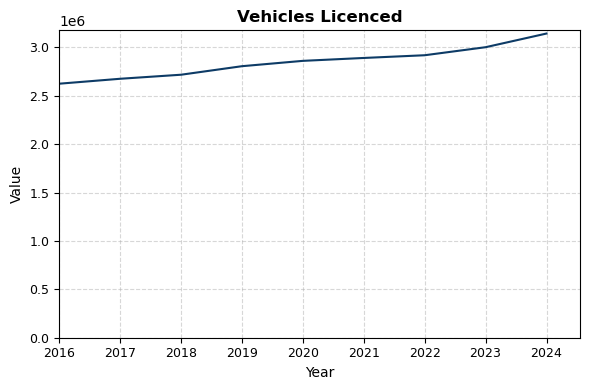

In [341]:
# plotting data
fig, ax = plt.subplots(figsize=(6,4))
sns.lineplot(data=df_vl_final, x='Year', y='Value', ax=ax)
ax.set_xlabel('Year')
ax.set_ylabel('Value')
axes, metrics_report = turf(ax, title='Vehicles Licenced', return_metrics=True)
plt.show()

Data Distribution


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : No
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 6
- Has Legend          : No
- Legend Needed       : Yes
- Grid Density        : 1.43
- Data Ink Ratio      : 0.0092

--- Subplot 2 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 8.0
- Data Ink Ratio      : 0.0461



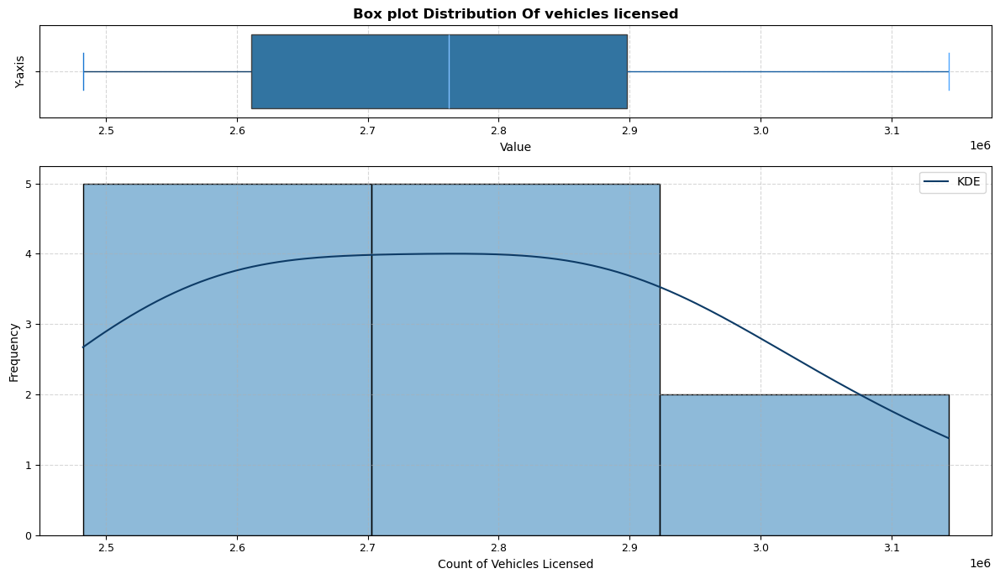

In [344]:
# Plotting distribution
#heigh ratios are modified to .2/.8 because it looks bad using 50/50
fig, (ax_box, ax_hist) = plt.subplots(2, figsize=(12, 7), gridspec_kw={'height_ratios': (.2, .8)})
sns.boxplot(x=df_vl_final['Value'], ax=ax_box)
#calculating # of bins for histogram
q25 = np.percentile(df_vl_final['Value'], 25)
q75 = np.percentile(df_vl_final['Value'], 75)
iqr = q75 - q25
n = len(df_vl_final['Value'])
bin_width = 2 * iqr / (n ** (1/3))
# statistical formula to calculate bins/it must be an integer
num_bins = int(np.ceil((df_vl_final['Value'].max() - df_vl_final['Value'].min()) / bin_width))
sns.histplot(data=df_vl_final, x='Value', ax=ax_hist, kde=True, bins=num_bins)
kde_line = ax_hist.lines[0]
kde_line.set_label('KDE')
ax_hist.set_xlabel('Count of Vehicles Licensed')
ax_hist.set_ylabel('Frequency')
axes, metrics_report = turf([ax_box,ax_hist], title='Box plot Distribution Of vehicles licensed', return_metrics=True)
ax_hist.legend()
ax_hist.set_xlabel('Count of Vehicles Licensed')
ax_hist.set_ylabel('Frequency')
plt.show()


The last 3 plots are going to become a functions, since it's a step that is performed for all the variables

In [362]:
def plot_scatter(df, x_col='Year', y_col=''):
    fig, ax = plt.subplots(figsize=(10,6))
    ax.scatter(df[x_col], df[y_col])
    ax.set_xlabel(x_col)
    ax.set_ylabel(y_col)
    title_text = y_col
    plt.suptitle(title_text, fontweight='bold')
    plt.show()
    return ax

In [412]:
def plot_histo(df, x_col='Year', y_col=''): 
    fig, (ax_box, ax_hist) = plt.subplots(2, figsize=(12, 7), gridspec_kw={'height_ratios': (.2, .8)}) 
    sns.boxplot(x=df[y_col], ax=ax_box) 
    ax_box.set_title(f'Boxplot of {y_col}', fontsize=12, fontweight='bold')
    #calculating # of bins for histogram 
    q25 = np.percentile(df[y_col], 25) 
    q75 = np.percentile(df[y_col], 75) 
    iqr = q75 - q25 
    n = len(df[y_col]) 
    bin_width = 2 * iqr / (n ** (1/3)) 
    # statistical formula to calculate bins/it must be an integer 
    num_bins = int(np.ceil((df[y_col].max() - df[y_col].min()) / bin_width)) 
    sns.histplot(data=df, x=y_col, ax=ax_hist, kde=True, bins=num_bins) 
    ax_hist.set_title(f'histogram of {y_col}', fontsize=12, fontweight='bold')
    kde_line = ax_hist.lines[0]
    kde_line.set_label('KDE')
    title_text = y_col
    plt.suptitle(title_text, fontweight='bold') 
    ax_hist.set_xlabel('Count') 
    ax_hist.set_ylabel('Frequency') 
    ax_hist.legend()
    plt.suptitle(f'Histogram and boxplot of {y_col}', fontweight='bold', fontsize=14)
    plt.show() 
    return fig, (ax_box, ax_hist)

In [59]:
!pip install scipy


[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [347]:
# best distribution is going to be selected for further analysis
import scipy.stats as st
from scipy.stats import chisquare
distributions_discr = [st.poisson, st.binom, st.nbinom, st.geom] 
# distribution analysis
dist_r = []
#the loops needs to extract arguments, loc and scale in order to be able to perform log-likehood
# the variable is Vehicles licenced is descrete (the code is modified since originally was mistakenly code for continous variables, 
# recicle it for fuction, the code is modified again, K-S cannot be used for discrete variables. Chi squared is going to be used instead)
# chi square cannot be used due to the size of the dataset NaN is going to be the output all the time
for distribution in distributions_discr:
    name = distribution.name
    n_obs = len(df_vl_final['Value'])
    mean = np.mean(df_vl_final['Value'])
    var = np.var(df_vl_final['Value'])
    if name == 'poisson':
        params = (mean,)      
    elif name == 'binom':
        n = np.ceil(df_vl_final['Value'].max() * 1.1)
        p = mean / n
        if 0 < p < 1:   
            params = (int(round(n)), p)
        else:
            raise ValueError('Invalid probability')     
    elif name == 'nbinom':
        # number of successes and success prob
        if var <= mean:
            raise ValueError('Variance bigger than mean')
        p = mean / var
        r = mean * p / (1 - p)
        params = (r, p)     
    elif name == 'geom':
        p = 1 / mean
        params = (p,)
    if params is not None:
        if name == 'nbinom' and params[0] <= 0:
            raise ValueError('Values not capable of calculation')
        log_likelihood = np.sum(distribution.logpmf(df_vl_final['Value'], *params))
    if params is not None and not np.isnan(log_likelihood):
        k = len(params)
        aic = 2 * len(params) - 2 * log_likelihood
        bic = k * np.log(n_obs) - 2 * log_likelihood
        dist_r.append({'Distribution': name, 'AIC': aic, 'BIC': bic, 'LogLik': log_likelihood, 'Params': params})
disti_results_df = pd.DataFrame(dist_r).sort_values('AIC')
disti_results_df

,Distribution,AIC,BIC,LogLik,Params
2,nbinom,330.35,331.32,-163.18,"(199.987581615708, 7.225989324674342e-05)"
3,geom,382.00,382.49,-190.00,"(3.6134801237364e-07,)"
0,poisson,165603.23,165603.72,-82800.62,"(2767415.25,)"
1,binom,869682.32,869683.29,-434839.16,"(3457692, 0.8003648821236825)"


Chi cannot be calculated due to the lenght of the variable (it is calculating millions). having a small probability and a big n value produce a mathematical error. for this it is needed to use the central limit theorem. This is going to be analysed in Univariate analysis of this notebook and justified in the academic paper.

This code is going to be used for all variables. Hence a function is going to be created to simplify the coding process

In [348]:
def dist_type(df, x_col='Year', y_col='Value'):
    distributions = [st.norm, st.expon, st.gamma, st.beta, st.lognorm, st.uniform, st.t, st.chi2, st.genlogistic, st.logistic, st.laplace]
    # discreate variables might be used for other datasets, so it is going to be defined here to use in the future if needed
    distributions_discr = [st.poisson, st.binom, st.nbinom, st.geom]  
    # distribution analysis
    dist_r = []
    kind = df[y_col].dtype.kind
    #identy if feature is descrete or not i = signed integer, u = unsigned integer
    discrete = kind in ('i', 'u')  
    if discrete:
    # for discreate features
    #chi squared test is discarded do to the size of the dataset... NaN is going to be the result all the time
        for distribution in distributions_discr:
            name = distribution.name
            mean = np.mean(df[y_col])
            n_obs = len(df[y_col])
            var = np.var(df[y_col])
            #nbinomial error will stop the loop. use try to avoid this
            try:
                if name == 'poisson':
                    params = (mean,)      
                elif name == 'binom':
                    n = np.ceil(df[y_col].max() * 1.1)
                    p = mean / n
                    if 0 < p < 1:   
                        params = (int(round(n)), p)
                    else:
                        raise ValueError('Invalid probability')     
                elif name == 'nbinom':
                    # number of successes and success prob
                    if var <= mean:
                        raise ValueError('Variance bigger than mean')
                    else:
                        p = mean / var
                        r = mean * p / (1 - p)
                        params = (r, p)     
                elif name == 'geom':
                    p = 1 / mean
                    params = (p,)
                if params is not None:
                    if name == 'nbinom' and params[0] <= 0:
                        raise ValueError('Values not capable of calculation')
                    else:
                        log_likelihood = np.sum(distribution.logpmf(df[y_col], *params))
                if params is not None and not np.isnan(log_likelihood):
                    k = len(params)
                    aic = 2 * len(params) - 2 * log_likelihood  
                    bic = k * np.log(n_obs) - 2 * log_likelihood
                    dist_r.append({'Distribution': name, 'AIC': aic, 'BIC': bic, 'LogLik': log_likelihood, 'Params': params})
            except Exception as e: 
                dist_r.append({'Distribution': name, 'AIC': np.nan, 'BIC': np.nan, 'LogLik': np.nan, 'Params': None})
    else:
    # for continous features
    #the loops needs to extract arguments, loc and scale in order to be able to perform log-likehood 
        for distribution in distributions:
            # some parameters might raise exceptions, since this is not being assess line by line to notice it, except procedure is needed
            try:
                parameters = distribution.fit(df[y_col])
                arg = parameters[:-2]
                loc = parameters[-2]
                scale = parameters[-1]
                #kolgomorov-smirov test 
                ks_stat, ks_p = st.kstest(df[y_col], distribution.name, args=parameters)
                # Log-likelihood 
                log_likelihood = np.sum(distribution.logpdf(df[y_col], *arg, loc=loc, scale=scale))
                k = len(parameters)
                aic = 2*k - 2*log_likelihood
                dist_r.append({'Distribution': distribution.name, 'AIC': aic, 'KS_stat': ks_stat, 'KS_p': ks_p, 'Params': parameters})
            except Exception as e:
                #skip errors/failures to fit
                dist_r.append({'Distribution': distribution.name, 'AIC': np.nan, 'KS_stat': np.nan, 'KS_p': np.nan, 'Params': None, 'Error': str(e)})
                continue
    disti_results_df = pd.DataFrame(dist_r).sort_values('AIC')
    return disti_results_df


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : Yes
- Legend Needed       : No
- Grid Density        : 9.0
- Data Ink Ratio      : 262.3532



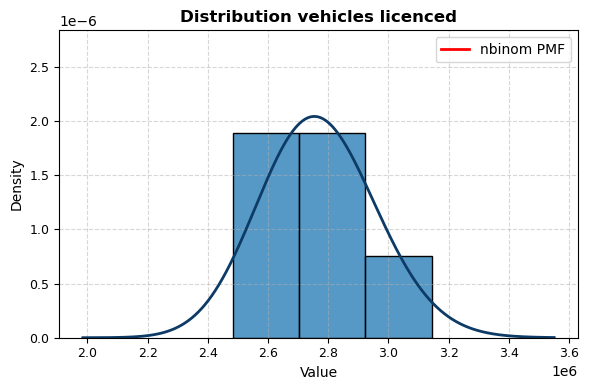

In [350]:
#distribution is going to be ploted
#stat = 'density' is needed because a pdf curve and a histogram are being compared, both must be in the same scale
dist_name = disti_results_df.iloc[0]['Distribution']
params_best = disti_results_df.iloc[0]['Params']
best_dist = getattr(st, dist_name)
fig, ax_hist = plt.subplots(figsize=(6, 4))
#calculating # of bins for histogram
q25 = np.percentile(df_vl_final['Value'], 25)
q75 = np.percentile(df_vl_final['Value'], 75)
iqr = q75 - q25
n = len(df_vl_final['Value'])
bin_width = 2 * iqr / (n ** (1/3))
bins = int((df_vl_final['Value'].max() - df_vl_final['Value'].min()) / bin_width)
bins = max(5, min(num_bins, 100))
# statistical formula to calculate bins/it must be an integer
sns.histplot(data=df_vl_final, x='Value', ax=ax_hist, kde=False, bins=num_bins, stat='density')
# get data from the bests model
mean = np.mean(df_vl_final['Value'])
std = np.std(df_vl_final['Value'])
support = np.arange(int(mean - 4*std), int(mean + 4*std) + 1)
pmf = best_dist.pmf(support, *params_best)
dist_name = disti_results_df.iloc[0]['Distribution']
params_best = disti_results_df.iloc[0]['Params']
best_dist = getattr(st, dist_name)
#.stem is needed because A stem plot draws lines perpendicular to a baseline at each location locs from the baseline to heads, 
#and places a marker there
ax_hist.plot(support, pmf, 'r-', linewidth=2, label=f'{dist_name} PMF')
# set Y limits to vizualise the graph properly
hist_heights, _ = np.histogram(df_vl_final['Value'], bins=bins, density=True)
#as it can seen in the cell bellow, if pdf is printed, a scale mismatch is going to be seen. Hence, a limit to the Y scale must be set
max_hist_density = hist_heights.max() if len(hist_heights) > 0 else 1e-5
ax_hist.set_ylim(0, max_hist_density * 1.5) 
ax_hist.legend()
axes, metrics_report = turf(ax_hist, title='Distribution vehicles licenced', return_metrics=True)
plt.show()


plotting the distribution is going to be used for all variables. Hence it is going to be used as a function

In [645]:
def plot_best_dist(df, x_col='Year', y_col=''):
    fig, ax_hist = plt.subplots(figsize=(10, 6))
    disti_results_df = dist_type(df, x_col=x_col, y_col=y_col)
    q25 = np.percentile(df[y_col], 25)
    q75 = np.percentile(df[y_col], 75)
    iqr = q75 - q25
    n = len(df[y_col])
    bin_width = 2 * iqr / (n ** (1/3))
    num_bins = int(np.ceil((df[y_col].max() - df[y_col].min()) / bin_width))
    dist_name = disti_results_df.iloc[0]['Distribution']
    params_best = disti_results_df.iloc[0]['Params']
    best_dist = getattr(st, dist_name)
    sns.histplot(data=df, x=y_col, ax=ax_hist, kde=False, bins=num_bins, stat='density', color='skyblue', edgecolor='black', label='Empirical Distribution')
    ax_hist.set_title(f'Histogram of {y_col}', fontsize=12, fontweight='bold')
    ax_hist.set_xlabel(y_col)
    ax_hist.set_ylabel('Density')
    ax_hist.legend(['Empirical Distribution'])
    kind = df[y_col].dtype.kind
    #identy if feature is descrete or not i = signed integer, u = unsigned integer
    discrete = kind in ('i', 'u')  
    if discrete:
        mean = np.mean(df[y_col])
        std = np.std(df[y_col])
        support = np.arange(int(mean - 4*std), int(mean + 4*std) + 1)
        pmf = best_dist.pmf(support, *params_best)
        ax_hist.plot(support, pmf, 'r-', linewidth=2, label=f'{dist_name} PMF')
        ax_hist.set_title(f'Distribution Fit: {y_col}', fontsize=12, fontweight='bold')
        ax_hist.set_ylabel('Density')
    else:
        x = np.linspace(min(df[y_col]), max(df[y_col]), 1000)
        arg = params_best[:-2]
        loc = params_best[-2]
        scale = params_best[-1]
        pdf = best_dist.pdf(x, *arg, loc=loc, scale=scale)
        ax_hist.plot(x, pdf, 'r-', linewidth=2, label=f'{dist_name} PDF')
        ax_hist.set_title(f'Distribution Fit: {y_col}', fontsize=12, fontweight='bold')
        ax_hist.set_ylabel('Density')
    hist_heights, _ = np.histogram(df[y_col], bins=num_bins, density=True)
    max_hist_density = hist_heights.max() if len(hist_heights) > 0 else 1e-5
    ax_hist.set_ylim(0, max_hist_density * 1.3)
    ax_hist.set_xlabel(y_col)
    ax_hist.legend()
    plt.suptitle(f'Best fit distribution: {dist_name} Distribution', fontsize=14, fontweight='bold')
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()
    return fig, ax_hist

the subject of study dataset is provided from 2016 to 2024. 2013-2015 data is going to be dropped to standarized years

In [352]:
yearstokeep_vl = df_vl_final['Year'] >= 2016
df_vl_final = df_vl_final[yearstokeep_vl]
df_vl_final
        

,Statistic,Year,Licencing Authority,Taxation Class,Type of Fuel,Value
3,Vehicles Under Licence,2016,Ireland,Total Vehicles,All fuel types,2624958
4,Vehicles Under Licence,2017,Ireland,Total Vehicles,All fuel types,2675879
5,Vehicles Under Licence,2018,Ireland,Total Vehicles,All fuel types,2717722
6,Vehicles Under Licence,2019,Ireland,Total Vehicles,All fuel types,2805839
7,Vehicles Under Licence,2020,Ireland,Total Vehicles,All fuel types,2860984
8,Vehicles Under Licence,2021,Ireland,Total Vehicles,All fuel types,2890975
9,Vehicles Under Licence,2022,Ireland,Total Vehicles,All fuel types,2919005
10,Vehicles Under Licence,2023,Ireland,Total Vehicles,All fuel types,3002092
11,Vehicles Under Licence,2024,Ireland,Total Vehicles,All fuel types,3143356


The variable of interest from this dataframe is Vehicles under licence

**KM Driven dataframe**

In [778]:
df_km_final.head()

,Statistic,Year,Type of Vehicle,Km Driven - (MM)
16,Kilometres Travelled,2016,All vehicle types,47775.00
17,Kilometres Travelled,2017,All vehicle types,48754.00
18,Kilometres Travelled,2018,All vehicle types,47545.00
19,Kilometres Travelled,2019,All vehicle types,47072.00
20,Kilometres Travelled,2020,All vehicle types,36237.00


In [779]:
df_km_final.info()

<class 'pandas.core.frame.DataFrame'>
Index: 8 entries, 16 to 23
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Statistic         8 non-null      object 
 1   Year              8 non-null      int64  
 2   Type of Vehicle   8 non-null      object 
 3   Km Driven - (MM)  8 non-null      float64
dtypes: float64(1), int64(1), object(2)
memory usage: 320.0+ bytes


In [780]:
df_km_final.describe()

,Year,Km Driven - (MM)
count,8.00,8.00
mean,2019.50,45520.12
std,2.45,4292.66
min,2016.00,36237.00
25%,2017.75,45773.50
50%,2019.50,47420.50
75%,2021.25,47646.75
max,2023.00,48754.00


In [781]:
# validate that all years needed are in the dataset
df_km_final['Year'].tolist()

[2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023]

some years needs to be dropped. additionaly 2024 is missing
data form 2004 to 2015 is going to be droped

In [782]:
df_km_final['Year'] = df_km_final['Year'].astype('int64')
yearstokeep_km = df_km_final['Year'] >= 2016
df_km_final = df_km_final[yearstokeep_km]
df_km_final

,Statistic,Year,Type of Vehicle,Km Driven - (MM)
16,Kilometres Travelled,2016,All vehicle types,47775.00
17,Kilometres Travelled,2017,All vehicle types,48754.00
18,Kilometres Travelled,2018,All vehicle types,47545.00
19,Kilometres Travelled,2019,All vehicle types,47072.00
20,Kilometres Travelled,2020,All vehicle types,36237.00
21,Kilometres Travelled,2021,All vehicle types,41878.00
22,Kilometres Travelled,2022,All vehicle types,47604.00
23,Kilometres Travelled,2023,All vehicle types,47296.00


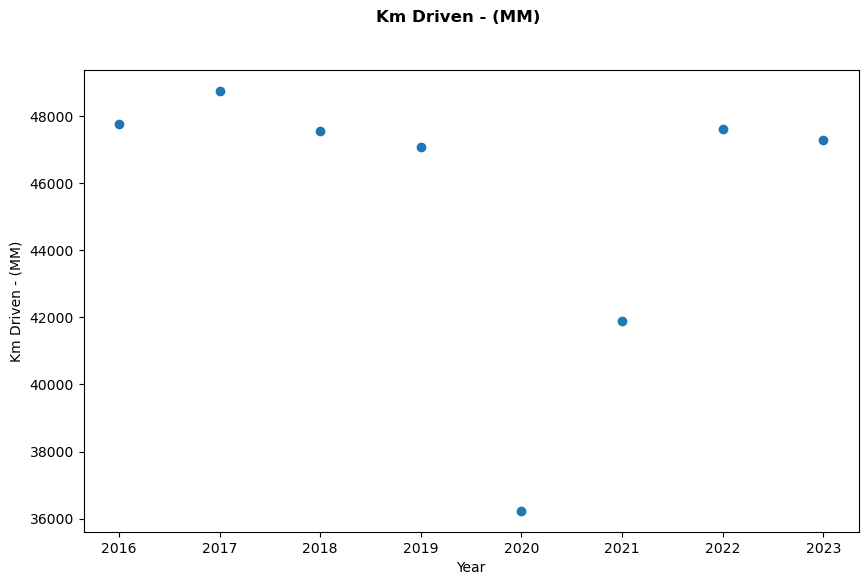

In [783]:
df = df_km_final
ax = plot_scatter(df, y_col = 'Km Driven - (MM)')


due to covid restriccion 2020 and 2021 KMs are lower than the trend. Since this is a special statistical reason, SARIMAX is going to be used to predict 2024. See code for Private premiums, where some challenges found during the planning are addressed (by mistake i skept some steps for this dataframe that were identify after processing private premiums)

a copy of the dataset is done to provide data integrity and if a mistake is done, only specific parts of the code are needed to re run

In [784]:
df_km_final_1 = df_km_final.copy()
df_km_final_1.drop(columns=['Statistic', 'Type of Vehicle'], inplace=True)
df_km_final_1 = df_km_final_1.reset_index()

In [785]:
df_km_final_1.drop(columns=['index'], inplace=True)
df_km_final_1

,Year,Km Driven - (MM)
0,2016,47775.00
1,2017,48754.00
2,2018,47545.00
3,2019,47072.00
4,2020,36237.00
5,2021,41878.00
6,2022,47604.00
7,2023,47296.00


In [459]:
!pip install statsmodels
!pip install scikit-learn


[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [786]:
# gathering GDP
gdp = 'https://docs.google.com/spreadsheets/d/e/2PACX-1vRULxKp994Oy6zp-koRPQNqKJIJGh9nOc7IQCfZuljecV4b7yMwJJuDZJzHw7lPiwFzh1xDh9AuyOR7/pub?output=csv'
df_gdp = pd.read_csv(gdp)
df_gdp

,Year,GDP
0,2016,"306,000,000,000.00"
1,2017,"349,000,000,000.00"
2,2018,"395,000,000,000.00"
3,2019,"407,000,000,000.00"
4,2020,"437,000,000,000.00"
5,2021,"531,000,000,000.00"
6,2022,"549,000,000,000.00"
7,2023,"551,000,000,000.00"
8,2024,"577,000,000,000.00"


In [787]:
# dataframe merge 
df_km_final_1['Year'] = df_km_final_1['Year'].astype(int)
df_gdp['Year'] = df_gdp['Year'].astype(int)
df_km_final_1 = pd.merge(df_km_final_1, df_gdp, on='Year', how='left')
#Sarimax is going to to use a covid dummy as exogen variable. the dataframe is created as follow
covid_validation = df_km_final_1['Year'].tolist()
covid_dummy = []
for i in covid_validation:
    if i == 2020 or i == 2021:
        covid_dummy.append(1)
    else:
        covid_dummy.append(0)
df_covid = pd.DataFrame({'Year': covid_validation, 'Covid Dummy': covid_dummy})
df_covid

,Year,Covid Dummy
0,2016,0
1,2017,0
2,2018,0
3,2019,0
4,2020,1
5,2021,1
6,2022,0
7,2023,0


In [788]:
#merging Dataframes
df_km_final_1 = pd.merge(df_km_final_1, df_covid, on='Year', how='left')
df_km_final_1

,Year,Km Driven - (MM),GDP,Covid Dummy
0,2016,47775.00,"306,000,000,000.00",0
1,2017,48754.00,"349,000,000,000.00",0
2,2018,47545.00,"395,000,000,000.00",0
3,2019,47072.00,"407,000,000,000.00",0
4,2020,36237.00,"437,000,000,000.00",1
5,2021,41878.00,"531,000,000,000.00",1
6,2022,47604.00,"549,000,000,000.00",0
7,2023,47296.00,"551,000,000,000.00",0


In [789]:
# Changing names and dropping missprocessed columns
df_km_final_1 = df_km_final_1[df_km_final_1['Year'] >= 2016].reset_index(drop=True)
df_km_final_1

,Year,Km Driven - (MM),GDP,Covid Dummy
0,2016,47775.00,"306,000,000,000.00",0
1,2017,48754.00,"349,000,000,000.00",0
2,2018,47545.00,"395,000,000,000.00",0
3,2019,47072.00,"407,000,000,000.00",0
4,2020,36237.00,"437,000,000,000.00",1
5,2021,41878.00,"531,000,000,000.00",1
6,2022,47604.00,"549,000,000,000.00",0
7,2023,47296.00,"551,000,000,000.00",0


SARIMAX is going to be performed with 2 exogenus variables

In [790]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import train_test_split
# numerical types are going to be standarized
df_km_final_1['Km Driven - (MM)'] = pd.to_numeric(df_km_final_1['Km Driven - (MM)'], errors='coerce')
#since it has commas, it is needed to convert it to string first, then remove the commas, and afterwards modify it to number
df_km_final_1['GDP'] = (df_km_final_1['GDP'].astype(str).str.replace(',', '', regex=False))
df_km_final_1['GDP'] = pd.to_numeric(df_km_final_1['GDP'],errors='coerce')                
y = df_km_final_1['Km Driven - (MM)']
X = df_km_final_1[['GDP', 'Covid Dummy']] #exogenous variables
# Split the data set into Training and Testing parts
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.1, random_state = 0)
#based on Time Series Analysis: With Applications in R, cronological split must be inplace to train data
split_year = 2021
y_train = y.loc[y.index < split_year]
y_test = y.loc[y.index >= split_year]
X_train = X.loc[X.index < split_year]
X_test = X.loc[X.index >= split_year]
X_train, X_test, y_train, y_test

(              GDP  Covid Dummy
 0 306000000000.00            0
 1 349000000000.00            0
 2 395000000000.00            0
 3 407000000000.00            0
 4 437000000000.00            1
 5 531000000000.00            1
 6 549000000000.00            0
 7 551000000000.00            0,
 Empty DataFrame
 Columns: [GDP, Covid Dummy]
 Index: [],
 0   47775.00
 1   48754.00
 2   47545.00
 3   47072.00
 4   36237.00
 5   41878.00
 6   47604.00
 7   47296.00
 Name: Km Driven - (MM), dtype: float64,
 Series([], Name: Km Driven - (MM), dtype: float64))

In [791]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
#test data 
adfuller = adfuller(y)
#p-value is the result of interest, return index 1 is p-value 
adfuller[1]

np.float64(0.41064364382181817)

p-value higher than .05, H1 is proven rejected...d can be assigned as 1


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : No
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 2
- Has Legend          : No
- Legend Needed       : Yes
- Grid Density        : 5.67
- Data Ink Ratio      : 0.0029

--- Subplot 2 ---
- Set Ymin Zero       : No
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 2
- Has Legend          : No
- Legend Needed       : Yes
- Grid Density        : 6.33
- Data Ink Ratio      : 0.0022



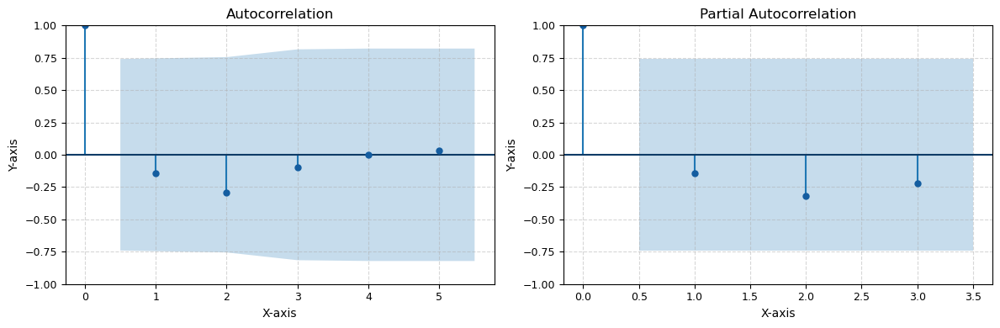

In [792]:
d = 1
# plotting
plot = y.diff().dropna() if d > 0 else y
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
plot_acf(plot, ax=axes[0], lags=5) # acf stands for autocorrelation function
plot_pacf(plot, ax=axes[1], lags=3) # pacf for partial autocorrelation function
axes, metrics_report = turf(axes, return_metrics=True)
plt.show()


as determined by the graphical representation of autocorrelation and partial autocorrleation, P and Q are 0

In [793]:
p = 0
q = 0
model = SARIMAX(endog=y, exog=X, order=(p, d, q), enforce_stationarity=False, enforce_invertibility=False)
forecast = model.fit(disp=False)
forecast.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:       Km Driven - (MM)   No. Observations:                    8
Model:               SARIMAX(0, 1, 0)   Log Likelihood                 -58.288
Date:                Thu, 30 Oct 2025   AIC                            122.576
Time:                        19:06:16   BIC                            121.951
Sample:                             0   HQIC                           120.075
                                  - 8                                         
Covariance Type:                  opg                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
GDP           2.75e-08   1.12e-07      0.245      0.807   -1.93e-07    2.48e-07
Covid Dummy -8445.5219   1.29e-19  -6.56e+22      0.000   -8445.522   -8445.522
sigma2       3.694e+07   8.55e-25   4.32e+31      0.000    3.69e+07    3.69e+07
===================================================================================
Ljung-Box (L1) (Q):                   4.74   Jarque-Bera (JB):                 0.85
Prob(Q):                              0.03   Prob(JB):                         0.65
Heteroskedasticity (H):               1.55   Skew:                             0.90
Prob(H) (two-sided):                  0.79   Kurtosis:                         2.60
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.56e+50. Standard errors may be unstable.
"""

p-value above treshold which makes the model suitable for prediction.

In [794]:
gdp_24 = [549000000000.00]
year = [2024]
dummy = [0]
predict_km_df = pd.DataFrame({'Year': year, 'GDP': gdp_24, 'Covid Dummy': dummy})
predict_km_df

,Year,GDP,Covid Dummy
0,2024,549000000000.00,0


In [795]:
steps = len(predict_km_df)
results_km = forecast.get_forecast(steps=steps, exog = predict_km_df[['GDP', 'Covid Dummy']])
results_km

In [796]:
forecast_mean_km = results_km.predicted_mean
forecast_ci_km = results_km.conf_int()
df_forecast_km = pd.DataFrame({'Year': predict_km_df['Year'], 'GDP': predict_km_df['GDP'], 'Km Driven - (MM)': forecast_mean_km.values, 'Covid Dummy': predict_km_df['Covid Dummy']})
df_km_1_final = pd.concat([df_km_final_1, df_forecast_km], ignore_index=True)
df_km_1_final

,Year,Km Driven - (MM),GDP,Covid Dummy
0,2016,47775.00,306000000000.00,0
1,2017,48754.00,349000000000.00,0
2,2018,47545.00,395000000000.00,0
3,2019,47072.00,407000000000.00,0
4,2020,36237.00,437000000000.00,1
5,2021,41878.00,531000000000.00,1
6,2022,47604.00,549000000000.00,0
7,2023,47296.00,551000000000.00,0
8,2024,47240.99,549000000000.00,0



TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : No
- Restricted X Axis   : Yes
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 0
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 19.0
- Data Ink Ratio      : 0.0



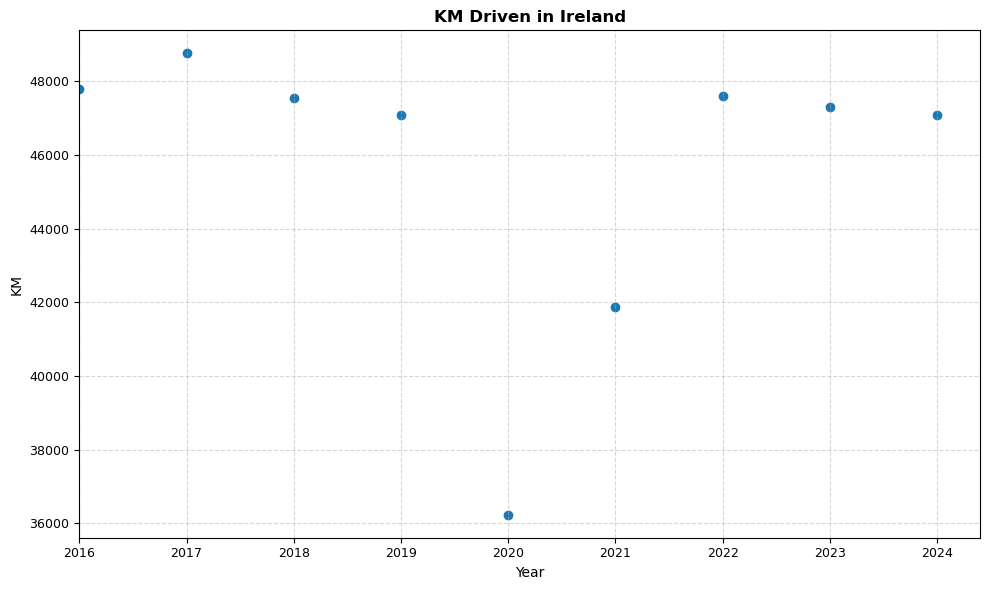

In [472]:
# plotting data
fig, ax = plt.subplots(figsize=(10,6))
ax.scatter(df_km_1_final['Year'], df_km_1_final['Km Driven - (MM)'])
ax.set_xlabel('Year')
ax.set_ylabel('KM')
axes, metrics_report = turf(ax, title='KM Driven in Ireland', return_metrics=True)
plt.show()

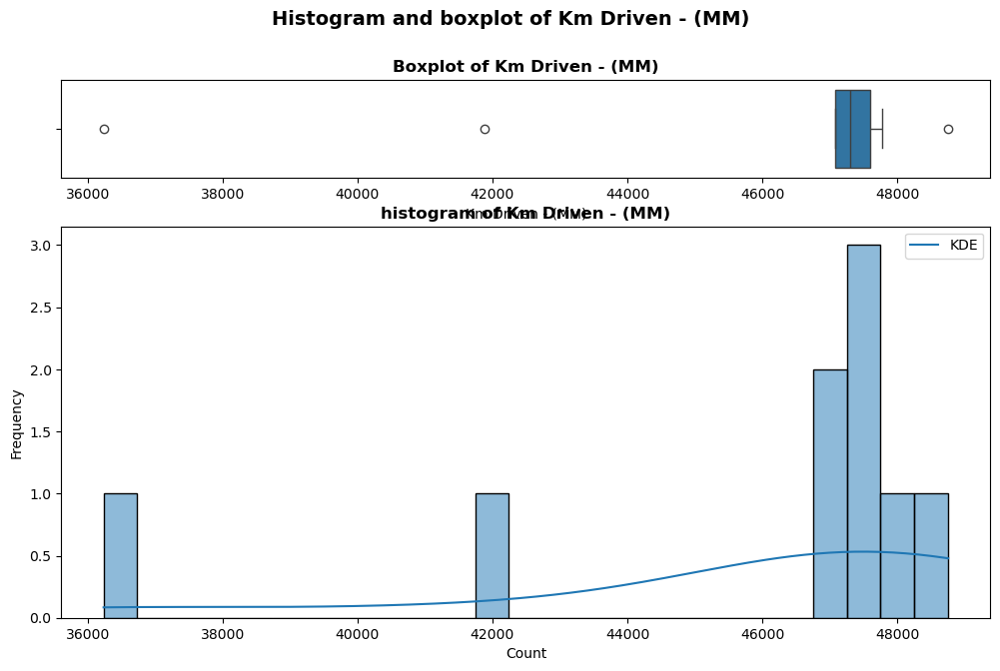

In [473]:
# please consider that the function request the user to manually type the title of the chart
df = df_km_1_final.copy()
ax = plot_histo(df, y_col='Km Driven - (MM)')

In [474]:
#before analyzing distributions, it is needed to confirm that dtypes are correct since this is a continous feature, it must be float
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Year              9 non-null      int64  
 1   Km Driven - (MM)  9 non-null      float64
 2   GDP               9 non-null      float64
 3   Covid Dummy       9 non-null      int64  
dtypes: float64(2), int64(2)
memory usage: 420.0 bytes


In [476]:
dist_type(df, y_col='Km Driven - (MM)')

,Distribution,AIC,KS_stat,KS_p,Params
3,beta,152.09,0.29,0.38,"(33.85196455043025, 0.6769644924541629, -10332..."
8,genlogistic,168.47,0.89,0.00,"(2.675768080814486e-09, 48754.000155203445, 8...."
4,lognorm,171.34,0.51,0.01,"(10.968787526565896, 36236.99999999999, 215.21..."
10,laplace,172.64,0.29,0.37,"(47296.0, 2156.0023437843174)"
5,uniform,173.83,0.64,0.00,"(36237.0, 12517.0)"
9,logistic,176.70,0.35,0.18,"(46569.340574234586, 1846.4338012567432)"
0,norm,177.99,0.42,0.06,"(45694.2198784379, 3817.6613667019624)"
6,t,179.99,0.42,0.06,"(303719.98346036545, 45694.2400605766, 3817.63..."
2,gamma,180.58,0.41,0.07,"(300.36785658311135, -24229.562815051642, 232...."
7,chi2,182.30,0.43,0.05,"(37.988702673449495, 25199.584699511528, 536.3..."


beta distribution is selected for this variable

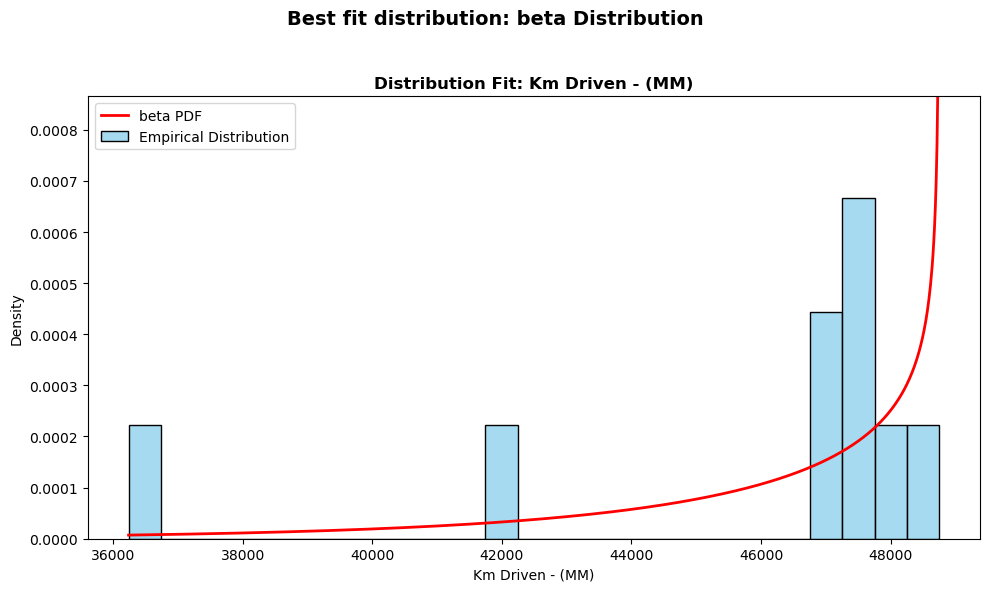

(<Figure size 1000x600 with 1 Axes>,
 <Axes: title={'center': 'Distribution Fit: Km Driven - (MM)'}, xlabel='Km Driven - (MM)', ylabel='Density'>)

In [477]:
plot_best_dist(df, y_col='Km Driven - (MM)')

**Private premiums Database**

In [478]:
df_private_premiums_1 = df_private_premiums.copy()
df_private_premiums_1.head()

,Year,Quarter,Measure,CoverType,Value
0,2009,200903,Gross Earned Premium,Comprehensive,180078838.75
1,2009,200906,Gross Earned Premium,Comprehensive,178470920.66
2,2009,200909,Gross Earned Premium,Comprehensive,175242917.66
3,2009,200912,Gross Earned Premium,Comprehensive,173836110.60
4,2010,201003,Gross Earned Premium,Comprehensive,167598511.22


For this study, it is being analyzed the exposure of liabilities to insurance companies. Gross earned premiums measures true income and exposure for financial reporting and calculating loss ratios. this is the variable of interest for this dataset. All else is going to be dropped.

In [798]:
df_private_premiums_1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7 entries, 0 to 6
Data columns (total 3 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Year    7 non-null      int64  
 1   Value   7 non-null      float64
 2   GDP     7 non-null      float64
dtypes: float64(2), int64(1)
memory usage: 300.0 bytes


In [479]:
measuretokeep_p = df_private_premiums_1['Measure'] == 'Gross Earned Premium'
df_private_premiums_1 = df_private_premiums_1[measuretokeep_p]
df_private_premiums_1

,Year,Quarter,Measure,CoverType,Value
0,2009,200903,Gross Earned Premium,Comprehensive,180078838.75
1,2009,200906,Gross Earned Premium,Comprehensive,178470920.66
2,2009,200909,Gross Earned Premium,Comprehensive,175242917.66
3,2009,200912,Gross Earned Premium,Comprehensive,173836110.60
4,2010,201003,Gross Earned Premium,Comprehensive,167598511.22
...,...,...,...,...,...
111,2022,202206,Gross Earned Premium,Third Party,34178593.17
112,2022,202209,Gross Earned Premium,Third Party,31956772.29
113,2022,202212,Gross Earned Premium,Third Party,29649912.27
114,2023,202303,Gross Earned Premium,Third Party,27845426.23


For liabilities the study is going to be focused on end of the year figures. Hence, all quarters not belonging to Q4 are going to be droped. GES is a commulative report per Q. Hence Q4 represents the global figure of the year

In [480]:
# the last 2 digits of Quarter are going to be extracted in order to identify Q4s
df_private_premiums_1['Q'] = df_private_premiums_1['Quarter'].astype(str).str[-2:].astype(int)
df_private_premiums_1

,Year,Quarter,Measure,CoverType,Value,Q
0,2009,200903,Gross Earned Premium,Comprehensive,180078838.75,3
1,2009,200906,Gross Earned Premium,Comprehensive,178470920.66,6
2,2009,200909,Gross Earned Premium,Comprehensive,175242917.66,9
3,2009,200912,Gross Earned Premium,Comprehensive,173836110.60,12
4,2010,201003,Gross Earned Premium,Comprehensive,167598511.22,3
...,...,...,...,...,...,...
111,2022,202206,Gross Earned Premium,Third Party,34178593.17,6
112,2022,202209,Gross Earned Premium,Third Party,31956772.29,9
113,2022,202212,Gross Earned Premium,Third Party,29649912.27,12
114,2023,202303,Gross Earned Premium,Third Party,27845426.23,3


In [481]:
qtokeep_p = df_private_premiums_1['Q'] == 12
#the dataframe starts in 2009, data prior to 2016 need to be removed
ytokeep_p = df_private_premiums_1['Year'] >= 2016
df_private_premiums_1 = df_private_premiums_1[qtokeep_p]
df_private_premiums_1 = df_private_premiums_1[ytokeep_p]
df_private_premiums_1

,Year,Quarter,Measure,CoverType,Value,Q
31,2016,201612,Gross Earned Premium,Comprehensive,235677263.43,12
35,2017,201712,Gross Earned Premium,Comprehensive,264798890.92,12
39,2018,201812,Gross Earned Premium,Comprehensive,264204445.89,12
43,2019,201912,Gross Earned Premium,Comprehensive,273093883.72,12
47,2020,202012,Gross Earned Premium,Comprehensive,289122514.58,12
51,2021,202112,Gross Earned Premium,Comprehensive,290908680.01,12
55,2022,202212,Gross Earned Premium,Comprehensive,283572812.59,12
89,2016,201612,Gross Earned Premium,Third Party,60373232.16,12
93,2017,201712,Gross Earned Premium,Third Party,69878961.47,12
97,2018,201812,Gross Earned Premium,Third Party,67158948.29,12


as noticed, the dataframe is missing 2023 and 2024. The way to forecast these figures is provided as follow:

In [482]:
df_private_premiums_1 = df_private_premiums_1.groupby(['Year', 'Q'])['Value'].sum().reset_index()
df_private_premiums_1

,Year,Q,Value
0,2016,12,296050495.59
1,2017,12,334677852.39
2,2018,12,331363394.18
3,2019,12,334585248.04
4,2020,12,339774078.04
5,2021,12,330167746.20
6,2022,12,313222724.86



TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : No
- Restricted X Axis   : Yes
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 0
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 15.0
- Data Ink Ratio      : 0.0



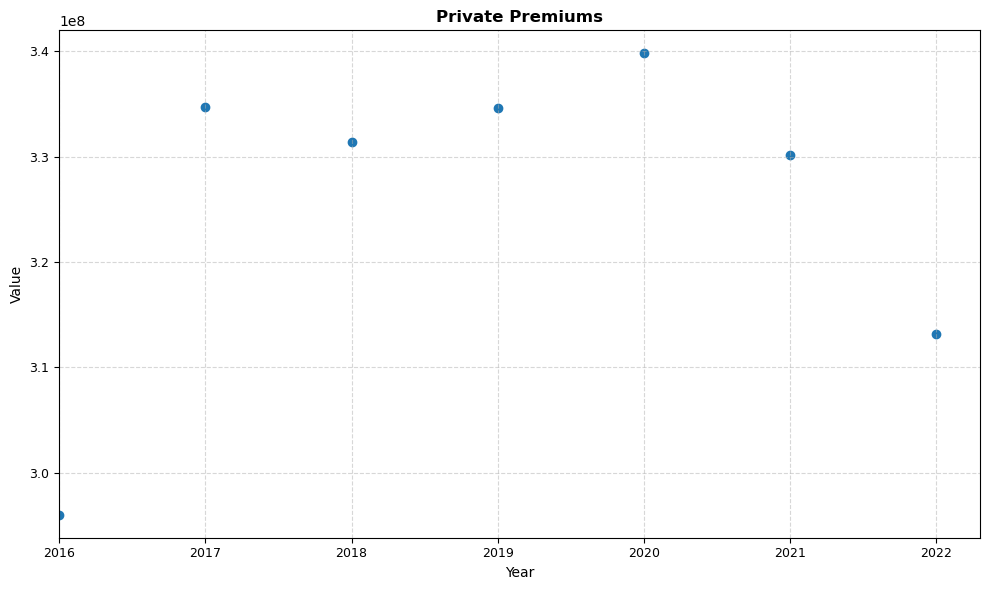

In [483]:
# plotting data
fig, ax = plt.subplots(figsize=(10,6))
ax.scatter(df_private_premiums_1['Year'], df_private_premiums_1['Value'])
ax.set_xlabel('Year')
ax.set_ylabel('Value')
axes, metrics_report = turf(ax, title='Private Premiums', return_metrics=True)
plt.show()

Arimax model is going to be used to forecast 2023 and 2024. The dataset is influece by external factors such as pricing or economic cycle.
In the academic paper the justification of the model is going to be analyzed and justified.

Considerations: pyflux is not longer supported
statmodels is going to be used instead (pmd arima and sklearn are needed too)

In [484]:
#!pip install statsmodels
#update needed to avoid errors while intaling pmdarima
#!C:\Users\dmoli\anaconda3\python.exe -m pip install --upgrade pip setuptools wheel #not possible to install in Jupiter notebook
#!pip install pmdarima # not possible to install in Jupiter notebook
#!pip install scikit-learn

the libraries above where installed through anaconda promt

In [485]:
#pip install --only-binary=:all: pmdarima


![printscreen](forgeA.png)

An exogenous variable is needed for arimax models. Irish GDP is going to be selected as exogenous variable. GDP is a measure of economic activity, hence it influence market conditions as pricing, inflation and new cars (one of its verticals). Further justification is going to be provided in the academic paper

GDP Source: https://data.worldbank.org/indicator/NY.GDP.MKTP.CD?end=2024&locations=IE&start=2016

In [486]:
# gathering GDP
gdp = 'https://docs.google.com/spreadsheets/d/e/2PACX-1vRULxKp994Oy6zp-koRPQNqKJIJGh9nOc7IQCfZuljecV4b7yMwJJuDZJzHw7lPiwFzh1xDh9AuyOR7/pub?output=csv'
df_gdp = pd.read_csv(gdp)
df_gdp

,Year,GDP
0,2016,"306,000,000,000.00"
1,2017,"349,000,000,000.00"
2,2018,"395,000,000,000.00"
3,2019,"407,000,000,000.00"
4,2020,"437,000,000,000.00"
5,2021,"531,000,000,000.00"
6,2022,"549,000,000,000.00"
7,2023,"551,000,000,000.00"
8,2024,"577,000,000,000.00"


In [487]:
# dataframe merge 
df_private_premiums_1 = pd.merge(df_private_premiums_1, df_gdp, on='Year', how='left')
df_private_premiums_1

,Year,Q,Value,GDP
0,2016,12,296050495.59,"306,000,000,000.00"
1,2017,12,334677852.39,"349,000,000,000.00"
2,2018,12,331363394.18,"395,000,000,000.00"
3,2019,12,334585248.04,"407,000,000,000.00"
4,2020,12,339774078.04,"437,000,000,000.00"
5,2021,12,330167746.20,"531,000,000,000.00"
6,2022,12,313222724.86,"549,000,000,000.00"


after identifying the exogenous variable, it is possible to proceed predicting private premiums for 2023 and 2024

In this case Covid_Dummy is not used as Exogenous variable, due to economic packages executed by the government of Ireland and the ECB, and the impact this money inflow paints a better picture of the impact of COVID on the Irish GDP (and globally)

In [799]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.model_selection import train_test_split
# numerical types are going to be standarized
df_private_premiums_1['Value'] = pd.to_numeric(df_private_premiums_1['Value'], errors='coerce')
#sine it has commas, it is needed to convert it to string first, then remove the commas, and afterwards modify it to number
df_private_premiums_1['GDP'] = (df_private_premiums_1['GDP'].astype(str).str.replace(',', '', regex=False))
df_private_premiums_1['GDP'] = pd.to_numeric(df_private_premiums_1['GDP'],errors='coerce')                
y = df_private_premiums_1['Value']
X = df_private_premiums_1['GDP'] #exogenous variable
# Split the data set into Training and Testing parts
#Cronological split
split_year = 2021
y__train = y.loc[y.index < split_year]
y_test = y.loc[y.index >= split_year]
X_train = X.loc[X.index < split_year]
X_test = X.loc[X.index >= split_year]
X_train, X_test, y_train, y_test

(0   306000000000.00
 1   349000000000.00
 2   395000000000.00
 3   407000000000.00
 4   437000000000.00
 5   531000000000.00
 6   549000000000.00
 Name: GDP, dtype: float64,
 Series([], Name: GDP, dtype: float64),
 0   47775.00
 1   48754.00
 2   47545.00
 3   47072.00
 4   36237.00
 5   41878.00
 6   47604.00
 7   47296.00
 Name: Km Driven - (MM), dtype: float64,
 Series([], Name: Value, dtype: float64))

In [800]:
# find p, d, q 
#import pmdarima as pm
#auto_model = pm.auto_arima(y=y_train, exogenous=X_train, seasonal=False, stepwise=True, suppress_warnings=True, error_action='ignore', max_p=3, max_q=3, d=None)
#print(f'Best ARIMAX Order: {auto_model.order}')

It was impossible to install or make pmdarima to run in my computer, hence using SARIAMX, p, d and q are going to be calculated manually

In [801]:
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
#test data 
adfuller = adfuller(y)
#p-value is the result of interest, return index 1 is p-value 
adfuller[1]

np.float64(0.0033344541163385874)

p-value lower than .05, H0 is proven rejected...d can be assigned as 0


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : No
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 2
- Has Legend          : No
- Legend Needed       : Yes
- Grid Density        : 5.67
- Data Ink Ratio      : 0.0029

--- Subplot 2 ---
- Set Ymin Zero       : No
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 2
- Has Legend          : No
- Legend Needed       : Yes
- Grid Density        : 6.33
- Data Ink Ratio      : 0.0022



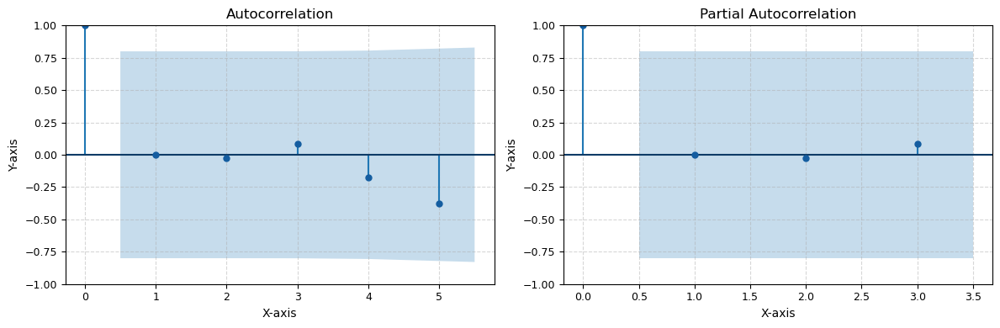

In [802]:
d = 1
# plotting
plot = y.diff().dropna() if d > 0 else y
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
plot_acf(plot, ax=axes[0], lags=5) # acf stands for autocorrelation function
plot_pacf(plot, ax=axes[1], lags=3) # pacf for partial autocorrelation function
axes, metrics_report = turf(axes, return_metrics=True)
plt.show()



as determined by the graphical representation of autocorrelation and partial autocorrleation, P and Q are 0

In [803]:
p = 0
q = 0
model = SARIMAX(endog=y, exog=X, order=(p, d, q), enforce_stationarity=False, enforce_invertibility=False)
forecast = model.fit(disp=False)
forecast.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                  Value   No. Observations:                    7
Model:               SARIMAX(0, 1, 0)   Log Likelihood                 -92.633
Date:                Thu, 30 Oct 2025   AIC                            189.266
Time:                        19:13:15   BIC                            188.485
Sample:                             0   HQIC                           187.170
                                  - 7                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
GDP        -9.965e-05      0.005     -0.020      0.984      -0.010       0.010
sigma2      1.902e+15   1.53e-21   1.25e+36      0.000     1.9e+15     1.9e+15
===================================================================================
Ljung-Box (L1) (Q):                   0.19   Jarque-Bera (JB):                 0.87
Prob(Q):                              0.66   Prob(JB):                         0.65
Heteroskedasticity (H):              10.87   Skew:                            -1.01
Prob(H) (two-sided):                  0.17   Kurtosis:                         2.70
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 5.5e+52. Standard errors may be unstable.
"""

In [493]:
df_private_premiums_1.drop(columns='Q', inplace=True)
df_private_premiums_1

,Year,Value,GDP
0,2016,296050495.59,306000000000.00
1,2017,334677852.39,349000000000.00
2,2018,331363394.18,395000000000.00
3,2019,334585248.04,407000000000.00
4,2020,339774078.04,437000000000.00
5,2021,330167746.20,531000000000.00
6,2022,313222724.86,549000000000.00


In [494]:
#predicting 2023 and 2024 data and append to the table 
gdp_2324 = [551000000000.00, 549000000000.00]
year = [2023, 2024]
predict_df = pd.DataFrame({'Year': year, 'GDP': gdp_2324})
predict_df

,Year,GDP
0,2023,551000000000.00
1,2024,549000000000.00


In [495]:
steps = len(predict_df)
results = forecast.get_forecast(steps=steps, exog = predict_df['GDP'])
results

In [496]:
# the output is a wrapped object. we are interested in the mean 
forecast_mean = results.predicted_mean
forecast_ci = results.conf_int()

In [497]:
forecast_mean

7   395235230.45
8   393800619.81
Name: predicted_mean, dtype: float64

In [498]:
forecast_ci

,lower Value,upper Value
7,78034707.24,712435753.66
8,76600096.60,711001143.02


In [500]:
# creation of dataframe to append to main dataframe 
df_forecast = pd.DataFrame({'Year': predict_df['Year'], 'GDP': predict_df['GDP'], 'Value': forecast_mean.values})
df_private_premiums_1_final = pd.concat([df_private_premiums_1, df_forecast], ignore_index=True)
df_private_premiums_1_final

,Year,Value,GDP
0,2016,296050495.59,306000000000.00
1,2017,334677852.39,349000000000.00
2,2018,331363394.18,395000000000.00
3,2019,334585248.04,407000000000.00
4,2020,339774078.04,437000000000.00
5,2021,330167746.20,531000000000.00
6,2022,313222724.86,549000000000.00
7,2023,395235230.45,551000000000.00
8,2024,393800619.81,549000000000.00


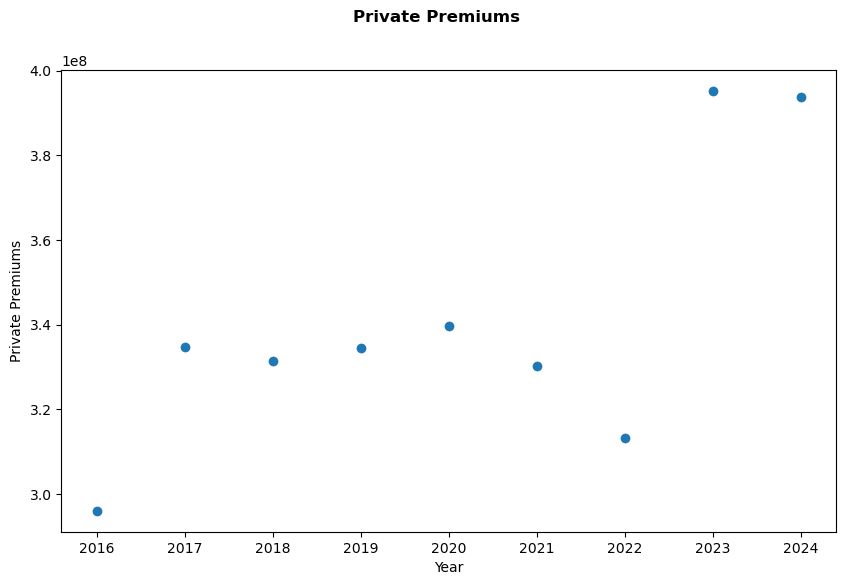

<Axes: xlabel='Year', ylabel='Private Premiums'>

In [503]:
df = df_private_premiums_1_final.copy()
df.rename(columns={'Value': 'Private Premiums'}, inplace=True)
plot_scatter(df, y_col= 'Private Premiums')

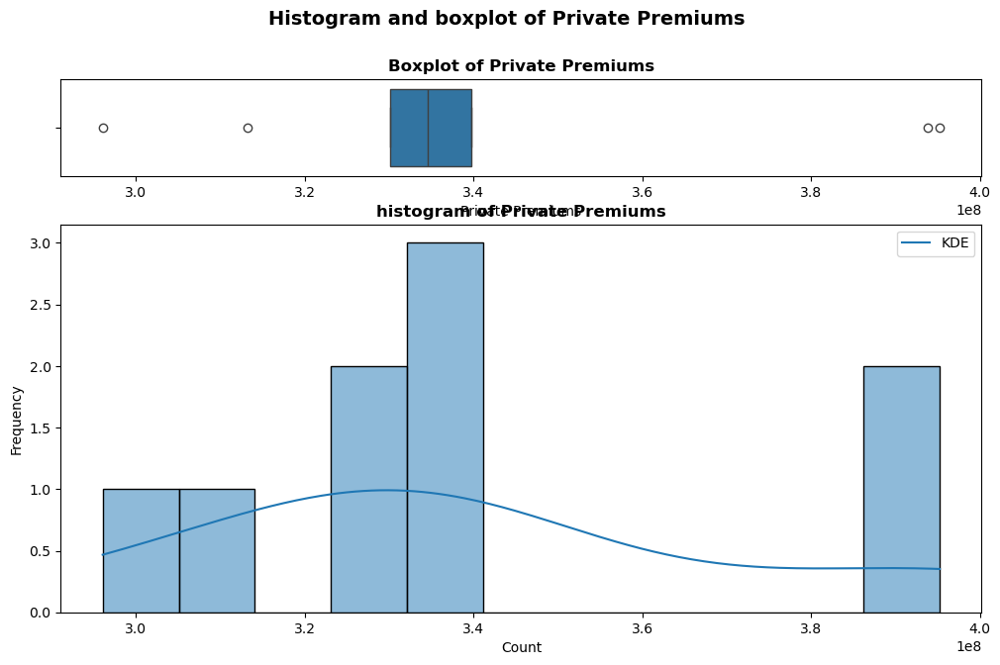

(<Figure size 1200x700 with 2 Axes>,
 (<Axes: title={'center': 'Boxplot of Private Premiums'}, xlabel='Private Premiums'>,
  <Axes: title={'center': 'histogram of Private Premiums'}, xlabel='Count', ylabel='Frequency'>))

In [504]:
plot_histo(df, y_col= 'Private Premiums')

In [505]:
#validation that datatype is float since a continous variable is being studied
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 3 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Year              9 non-null      int64  
 1   Private Premiums  9 non-null      float64
 2   GDP               9 non-null      float64
dtypes: float64(2), int64(1)
memory usage: 348.0 bytes


In [506]:
dist_type(df, y_col= 'Private Premiums')

,Distribution,AIC,KS_stat,KS_p,Params
4,lognorm,322.50,0.49,0.01,"(10.768241662596616, 296050495.59142494, 97250..."
3,beta,322.58,0.43,0.05,"(0.6338535334241457, 1.7000293616384656, 29605..."
5,uniform,335.42,0.34,0.21,"(296050495.591425, 99184734.8583864)"
10,laplace,338.30,0.19,0.84,"(334585248.042851, 21409268.87279571)"
1,expon,339.17,0.31,0.29,"(296050495.591425, 44935881.02626753)"
0,norm,340.20,0.29,0.35,"(340986376.61769253, 31294696.634030465)"
9,logistic,340.34,0.24,0.59,"(337180116.16687626, 17495488.071227502)"
2,gamma,340.80,0.22,0.70,"(3.2957063398342985, 282382247.50505626, 17781..."
8,genlogistic,340.91,0.22,0.69,"(342.1538223322967, 182655724.86322975, 246675..."
6,t,385.31,0.81,0.00,"(227838.65557289866, -736121.095711572, 342786..."


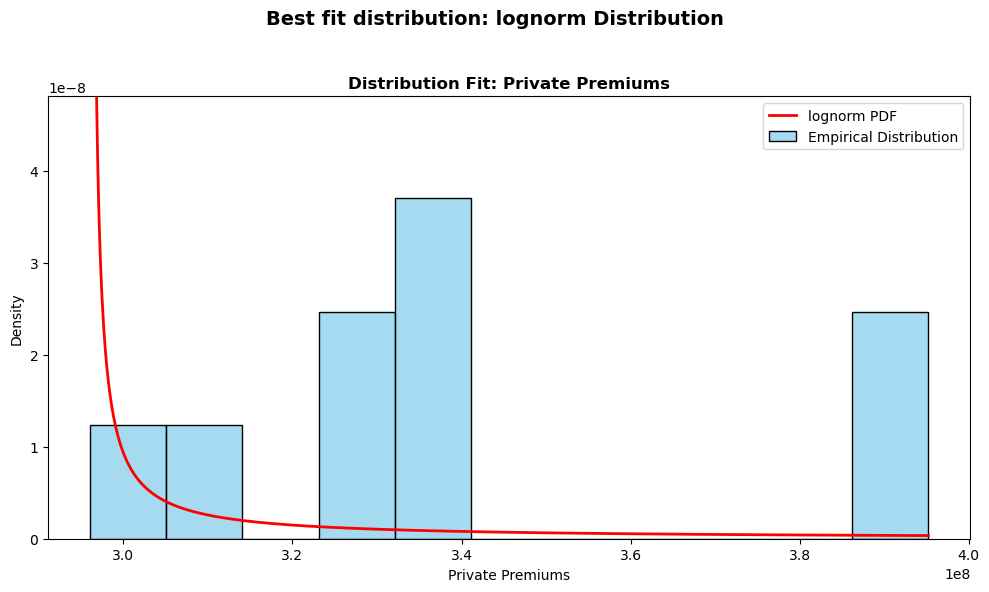

(<Figure size 1000x600 with 1 Axes>,
 <Axes: title={'center': 'Distribution Fit: Private Premiums'}, xlabel='Private Premiums', ylabel='Density'>)

In [507]:
plot_best_dist(df, y_col= 'Private Premiums')

**Penalty points Dataframe**

In [508]:
df_dp_final.head()

,Statistic,Year,County,Value
0,Penalty points recorded,2021,All drivers,542219.00
1,Penalty points recorded,2022,All drivers,544936.00
2,Penalty points recorded,2023,All drivers,541994.00


In [509]:
df_dp_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3 entries, 0 to 2
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Statistic  3 non-null      object 
 1   Year       3 non-null      object 
 2   County     3 non-null      object 
 3   Value      3 non-null      float64
dtypes: float64(1), object(3)
memory usage: 228.0+ bytes


penalty points is correlated with fines. as RSA website states: "Penalty points are essentially a formal reprimand by the Gardai endorsed on your driving licence record that shows you are guilty of a specific driving offence and are designed to encourage safe driving and reduce casualties on our roads." proper citation is going to be given in the academic paper

Fines Dataset

In [510]:
df_gardai_final.head()

,Statistic,Year,Fixed Charge Offences,Value
0,Fixed Payment Notice offences,2015,Public order offences,5914.00
1,Fixed Payment Notice offences,2015,Breaches of public health restrictions,0.00
2,Fixed Payment Notice offences,2015,Drink driving offences,956.00
3,Fixed Payment Notice offences,2015,Speeding offences,209950.00
4,Fixed Payment Notice offences,2015,Holding a mobile phone while driving,28129.00


In [511]:
df_gardai_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 153 entries, 0 to 152
Data columns (total 4 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Statistic              153 non-null    object 
 1   Year                   153 non-null    object 
 2   Fixed Charge Offences  153 non-null    object 
 3   Value                  153 non-null    float64
dtypes: float64(1), object(3)
memory usage: 4.9+ KB


as noticed, Fixed Charge Offences needs to be grouped

In [512]:
# year needs to be change to integer since it's a year
df_gardai_final['Year'] = df_gardai_final['Year'].astype('int64')
df_gardai_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 153 entries, 0 to 152
Data columns (total 4 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   Statistic              153 non-null    object 
 1   Year                   153 non-null    int64  
 2   Fixed Charge Offences  153 non-null    object 
 3   Value                  153 non-null    float64
dtypes: float64(1), int64(1), object(2)
memory usage: 4.9+ KB


In [513]:
df_gardai_final['Year'].tolist()

[2015,
 2015,
 2015,
 2015,
 2015,
 2015,
 2015,
 2015,
 2015,
 2015,
 2015,
 2015,
 2015,
 2015,
 2015,
 2015,
 2015,
 2016,
 2016,
 2016,
 2016,
 2016,
 2016,
 2016,
 2016,
 2016,
 2016,
 2016,
 2016,
 2016,
 2016,
 2016,
 2016,
 2016,
 2017,
 2017,
 2017,
 2017,
 2017,
 2017,
 2017,
 2017,
 2017,
 2017,
 2017,
 2017,
 2017,
 2017,
 2017,
 2017,
 2017,
 2018,
 2018,
 2018,
 2018,
 2018,
 2018,
 2018,
 2018,
 2018,
 2018,
 2018,
 2018,
 2018,
 2018,
 2018,
 2018,
 2018,
 2019,
 2019,
 2019,
 2019,
 2019,
 2019,
 2019,
 2019,
 2019,
 2019,
 2019,
 2019,
 2019,
 2019,
 2019,
 2019,
 2019,
 2020,
 2020,
 2020,
 2020,
 2020,
 2020,
 2020,
 2020,
 2020,
 2020,
 2020,
 2020,
 2020,
 2020,
 2020,
 2020,
 2020,
 2021,
 2021,
 2021,
 2021,
 2021,
 2021,
 2021,
 2021,
 2021,
 2021,
 2021,
 2021,
 2021,
 2021,
 2021,
 2021,
 2021,
 2022,
 2022,
 2022,
 2022,
 2022,
 2022,
 2022,
 2022,
 2022,
 2022,
 2022,
 2022,
 2022,
 2022,
 2022,
 2022,
 2022,
 2023,
 2023,
 2023,
 2023,
 2023,
 2023,
 2023,

In [514]:
df_gardai_final.describe(include='all')

,Statistic,Year,Fixed Charge Offences,Value
count,153,153.00,153,153.00
unique,1,NaN,17,NaN
top,Fixed Payment Notice offences,NaN,Public order offences,NaN
freq,153,NaN,9,NaN
mean,NaN,2019.00,NaN,18512.33
std,NaN,2.59,NaN,37519.06
min,NaN,2015.00,NaN,0.00
25%,NaN,2017.00,NaN,1178.00
50%,NaN,2019.00,NaN,5653.00
75%,NaN,2021.00,NaN,20785.00


In [515]:
df_gardai_final['Fixed Charge Offences'].unique()

array(['Public order offences', 'Breaches of public health restrictions',
       'Drink driving offences', 'Speeding offences',
       'Holding a mobile phone while driving',
       'Seat belt (incl. child restraint) offences', 'No tax',
       'No insurance', 'No NCT', 'Failing to display L or N plates',
       'Unaccompanied learner driver', 'Vehicle roadworthiness offences',
       'Motorway offences', 'Parking offences', 'Other driving offences',
       'Cycling offences',
       'Carriage of goods (HGV etc), trailers, taxis, Luas offences'],
      dtype=object)

Breaches of public health restrictions is going to be dropped. It's was a fine related to drivers breaching lockdowns. Public order offences are related to behaviour in public spaces, not driving related (source:  Criminal Justice (Public Order) Act 1994). These are not values with impact on the driving skills or risk of accident, hence it has 0 value to the study and it can be considered statistical noise.

In [516]:
values_to_drop = ['Public order offences', 'Breaches of public health restrictions']
#Boolean Logic to compute True/False on each element of an array, and then we can work with elements of an array which return either True or False
# ~ is needed to be use, since we want 'it is not matching' results
mask_to_keep = ~df_gardai_final['Fixed Charge Offences'].isin(values_to_drop)
df_gardai_final = df_gardai_final[mask_to_keep]
df_gardai_final['Fixed Charge Offences'].unique()

array(['Drink driving offences', 'Speeding offences',
       'Holding a mobile phone while driving',
       'Seat belt (incl. child restraint) offences', 'No tax',
       'No insurance', 'No NCT', 'Failing to display L or N plates',
       'Unaccompanied learner driver', 'Vehicle roadworthiness offences',
       'Motorway offences', 'Parking offences', 'Other driving offences',
       'Cycling offences',
       'Carriage of goods (HGV etc), trailers, taxis, Luas offences'],
      dtype=object)

In [517]:
# it is needed to group by year, since we don't need detailed fixed charge offences
df_gardai_final_1 = df_gardai_final.groupby('Year')['Value'].sum().reset_index()
df_gardai_final_1

,Year,Value
0,2015,354320.00
1,2016,309086.00
2,2017,295457.00
3,2018,299515.00
4,2019,293959.00
5,2020,320350.00
6,2021,311945.00
7,2022,291217.00
8,2023,273241.00


In [518]:
#a backup of the dataframe is going to be created 
df_gardai_final_m = df_gardai_final_1.copy()


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : No
- Restricted X Axis   : Yes
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 0
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 20.0
- Data Ink Ratio      : 0.0



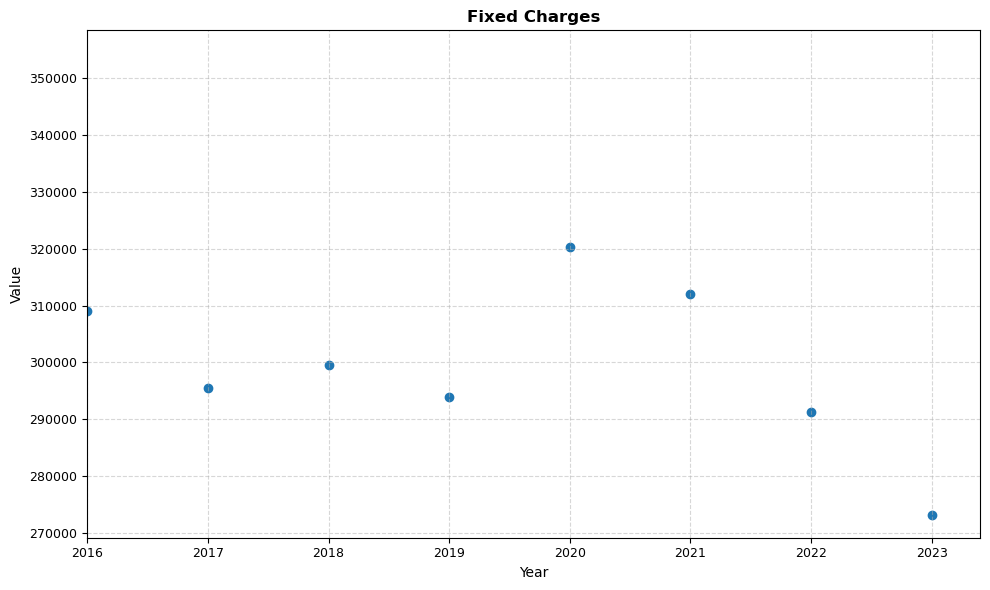

In [519]:
# plotting data
fig, ax = plt.subplots(figsize=(10,6))
ax.scatter(df_gardai_final_1['Year'], df_gardai_final_1['Value'])
ax.set_xlabel('Year')
ax.set_ylabel('Value')
axes, metrics_report = turf(ax, title='Fixed Charges', return_metrics=True)
plt.show()

2024 is needed to be forescasted

a downtrend is evident in the scatter plot. Covid related scenarios (impacting driving skills) are creating statistical noise. Noise Reduction: SMA provides a simple, equally-weighted average of the most recent observations, which is effective at filtering out white noise (random fluctuations) to better estimate the underlying local mean or trend.

In [521]:
#calculation of 2024 based on 2SMA
# SMA is going to be 2, a window is needed to apply 2SMA
window = 2
forecas_24 = df_gardai_final_m['Value'].tail(window)
forecas_24

7   291217.00
8   273241.00
Name: Value, dtype: float64

In [522]:
sma_forecas = forecas_24.mean()
sma_2024 = pd.DataFrame({'Year': 2024,  'Value': sma_forecas}, index=[0])
sma_2024


,Year,Value
0,2024,282229.00


In [523]:
df_gardai_final_m1 = pd.concat([df_gardai_final_m, sma_2024], ignore_index=True)
df_gardai_final_m1

,Year,Value
0,2015,354320.00
1,2016,309086.00
2,2017,295457.00
3,2018,299515.00
4,2019,293959.00
5,2020,320350.00
6,2021,311945.00
7,2022,291217.00
8,2023,273241.00
9,2024,282229.00


In [524]:
# 2015 is going to be dropped to standarized all dataset
ytokeep_p = df_gardai_final_m1['Year'] >= 2016
df_gardai_final_m1 =df_gardai_final_m1[ytokeep_p]
df_gardai_final_m1

,Year,Value
1,2016,309086.00
2,2017,295457.00
3,2018,299515.00
4,2019,293959.00
5,2020,320350.00
6,2021,311945.00
7,2022,291217.00
8,2023,273241.00
9,2024,282229.00


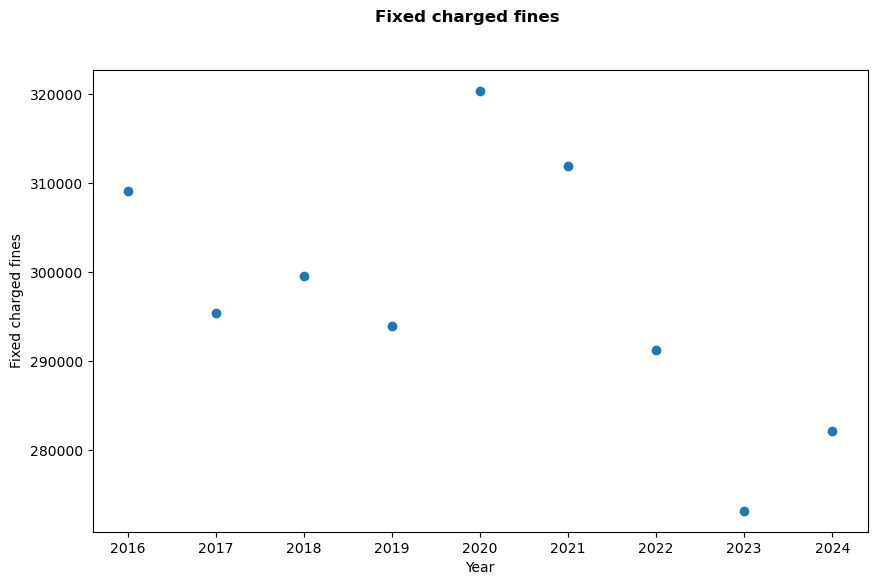

<Axes: xlabel='Year', ylabel='Fixed charged fines'>

In [525]:
df = df_gardai_final_m1
df.rename(columns={'Value': 'Fixed charged fines'}, inplace=True)
plot_scatter(df, y_col='Fixed charged fines')

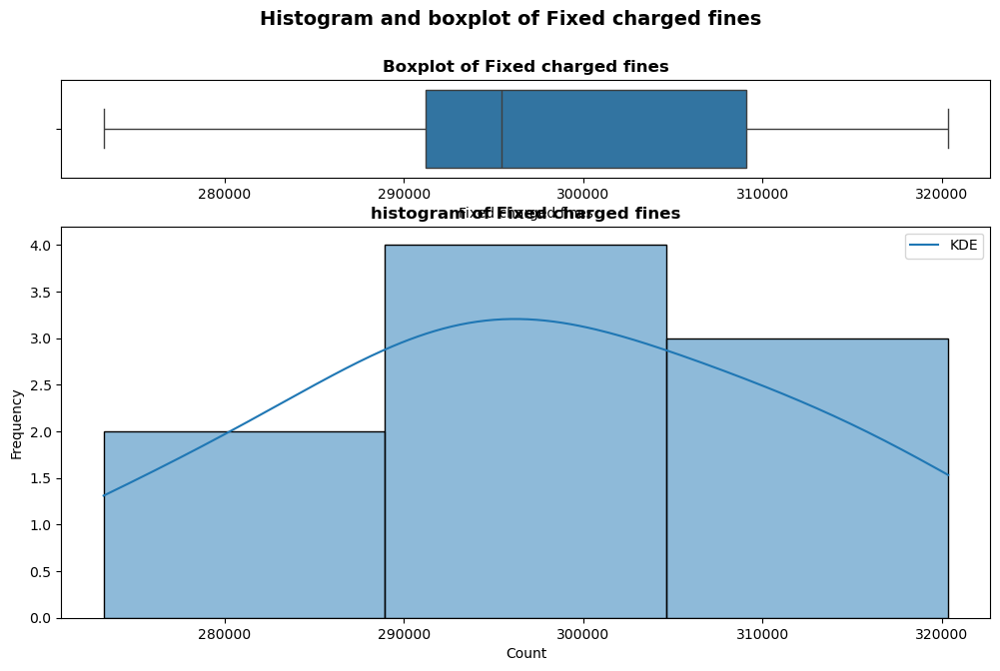

(<Figure size 1200x700 with 2 Axes>,
 (<Axes: title={'center': 'Boxplot of Fixed charged fines'}, xlabel='Fixed charged fines'>,
  <Axes: title={'center': 'histogram of Fixed charged fines'}, xlabel='Count', ylabel='Frequency'>))

In [526]:
plot_histo(df, y_col='Fixed charged fines')

In [527]:
dist_type(df, y_col='Fixed charged fines')

,Distribution,AIC,KS_stat,KS_p,Params
4,lognorm,188.56,0.49,0.02,"(10.591995936533044, 273240.99999999994, 580.0..."
3,beta,189.09,0.28,0.39,"(1.5814463897573097, 0.7688508467881893, 26472..."
5,uniform,197.68,0.16,0.95,"(273241.0, 47109.0)"
0,norm,201.30,0.13,0.99,"(297444.3333333333, 13932.134709209337)"
9,logistic,201.83,0.14,0.99,"(297463.5354765555, 8217.51496340775)"
10,laplace,202.20,0.19,0.86,"(295457.0, 11138.888888888889)"
6,t,203.30,0.13,0.99,"(16104280.026871288, 297444.33378612535, 13932..."
2,gamma,203.31,0.13,0.99,"(1781.747526887627, -291666.15428294125, 330.6..."
1,expon,203.70,0.30,0.32,"(273241.0, 24203.333333333314)"
8,genlogistic,203.81,0.14,0.99,"(1.2761472844501291, 294261.1525975686, 8876.0..."


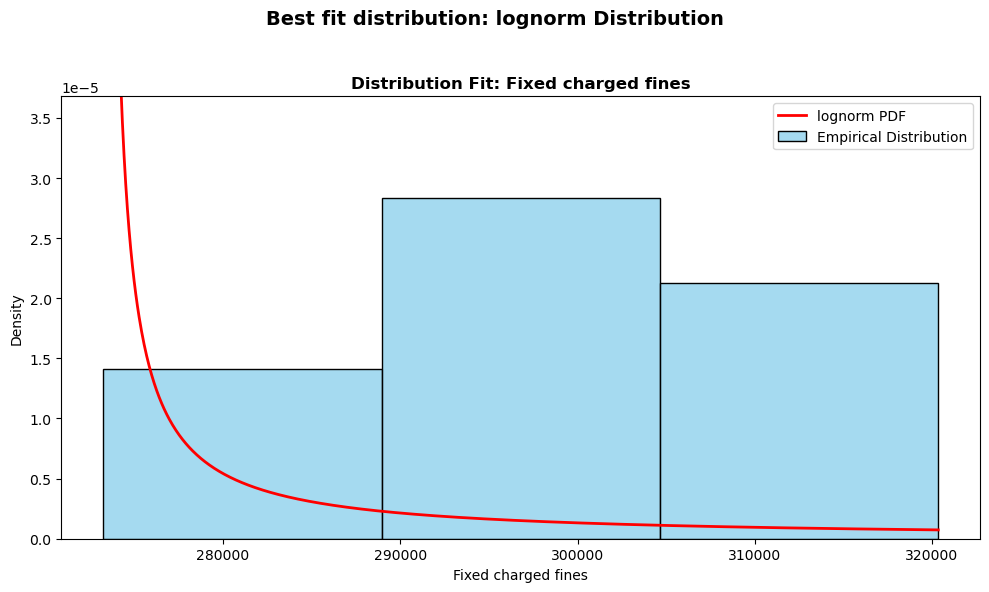

(<Figure size 1000x600 with 1 Axes>,
 <Axes: title={'center': 'Distribution Fit: Fixed charged fines'}, xlabel='Fixed charged fines', ylabel='Density'>)

In [528]:
plot_best_dist(df, y_col='Fixed charged fines')

**Ultimate Claims Dataframe**

In [529]:
df_uc.head()

,AccidentQuarter,Measure,ClaimType,Value
0,200903,Ultimate Costs,Accidental Damage,51134823.85
1,200906,Ultimate Costs,Accidental Damage,34743749.72
2,200909,Ultimate Costs,Accidental Damage,32676745.82
3,200912,Ultimate Costs,Accidental Damage,52417339.72
4,201003,Ultimate Costs,Accidental Damage,38389351.44


In [530]:
df_uc.tail()

,AccidentQuarter,Measure,ClaimType,Value
779,202112,Ultimate Numbers (incl. nils),Windscreen,14145.51
780,202203,Ultimate Numbers (incl. nils),Windscreen,17212.50
781,202206,Ultimate Numbers (incl. nils),Windscreen,18526.91
782,202209,Ultimate Numbers (incl. nils),Windscreen,17739.75
783,202212,Ultimate Numbers (incl. nils),Windscreen,15167.15


In [531]:
df_uc.describe(include= 'all')

,AccidentQuarter,Measure,ClaimType,Value
count,784.00,784,784,784.00
unique,NaN,2,7,NaN
top,NaN,Ultimate Costs,Accidental Damage,NaN
freq,NaN,392,112,NaN
mean,201557.50,NaN,NaN,20714617.43
std,403.38,NaN,NaN,35590581.77
min,200903.00,NaN,NaN,37.12
25%,201208.25,NaN,NaN,3836.82
50%,201557.50,NaN,NaN,806372.33
75%,201906.75,NaN,NaN,24405937.38


In [532]:
df_uc['Measure'].unique()

array(['Ultimate Costs', 'Ultimate Numbers (incl. nils)'], dtype=object)

In [533]:
df_uc['ClaimType'].unique()

array(['Accidental Damage', 'Fire and Theft', 'Third Party Damage',
       'Third Party Injury (<=250k)', 'Third Party Injury (>250k)',
       'Third Party Injury (Total)', 'Windscreen'], dtype=object)

Since this study is focusing on liabilities, Monetary units are needed. from measures ultimate number is going to be dropped

In [534]:
df_uc_1 = df_uc.copy()
values_to_drop = ['Ultimate Numbers (incl. nils)']
#Boolean Logic to compute True/False on each element of an array, and then we can work with elements of an array which return either True or False
# ~ is needed to be use, since we want 'it is not matching' results
mask_to_keep = ~df_uc_1['Measure'].isin(values_to_drop)
df_uc_1 = df_uc_1[mask_to_keep]
df_uc_1['Measure'].unique()

array(['Ultimate Costs'], dtype=object)

In [535]:
df_uc_1.describe(include= 'all')

,AccidentQuarter,Measure,ClaimType,Value
count,392.00,392,392,392.00
unique,NaN,1,7,NaN
top,NaN,Ultimate Costs,Accidental Damage,NaN
freq,NaN,392,56,NaN
mean,201557.50,NaN,NaN,41421585.37
std,403.64,NaN,NaN,40949582.50
min,200903.00,NaN,NaN,1585805.52
25%,201208.25,NaN,NaN,5904292.64
50%,201557.50,NaN,NaN,24520827.82
75%,201906.75,NaN,NaN,71450048.58


In [536]:
df_uc_1['ClaimType'].unique()

array(['Accidental Damage', 'Fire and Theft', 'Third Party Damage',
       'Third Party Injury (<=250k)', 'Third Party Injury (>250k)',
       'Third Party Injury (Total)', 'Windscreen'], dtype=object)

Due to the nature of the data, the dataset is going to be converted into categorical variables

The skewness is needed to be calculated in order to define if the mean or the median is used as "average claim"

In [537]:
skewness_by_category = df_uc_1.groupby('ClaimType')['Value'].skew()
skewness_by_category

ClaimType
Accidental Damage              1.14
Fire and Theft                 0.59
Third Party Damage             0.49
Third Party Injury (<=250k)   -0.74
Third Party Injury (>250k)     0.59
Third Party Injury (Total)    -0.59
Windscreen                     0.82
Name: Value, dtype: float64

Most categories have a moderate to high skewness (left if negative, right if possitive). hence is recomended to use median for further analysises 

Accidetal Damage, Fire and Theft and Windscreen is going to be grouped into a "Own Damage" category, since is damage impacting the asset

In [538]:
categories_to_merge = ['Accidental Damage', 'Fire and Theft', 'Windscreen']
# a lambda function is needed to execute the grouping as needed
df_uc_1['final_claim_type'] = df_uc_1['ClaimType'].apply(lambda x: 'Asset Damage' if x in categories_to_merge else x) 
df_uc_1

,AccidentQuarter,Measure,ClaimType,Value,final_claim_type
0,200903,Ultimate Costs,Accidental Damage,51134823.85,Asset Damage
1,200906,Ultimate Costs,Accidental Damage,34743749.72,Asset Damage
2,200909,Ultimate Costs,Accidental Damage,32676745.82,Asset Damage
3,200912,Ultimate Costs,Accidental Damage,52417339.72,Asset Damage
4,201003,Ultimate Costs,Accidental Damage,38389351.44,Asset Damage
...,...,...,...,...,...
387,202112,Ultimate Costs,Windscreen,3826947.21,Asset Damage
388,202203,Ultimate Costs,Windscreen,4686009.88,Asset Damage
389,202206,Ultimate Costs,Windscreen,5090315.20,Asset Damage
390,202209,Ultimate Costs,Windscreen,4889588.74,Asset Damage


In [539]:
df_uc_1['final_claim_type'].unique()

array(['Asset Damage', 'Third Party Damage',
       'Third Party Injury (<=250k)', 'Third Party Injury (>250k)',
       'Third Party Injury (Total)'], dtype=object)

In [540]:
# third party injuries variables are needed to be understood, a graphic is going to help to understand how the data is presented
# a new dataframe is going to be created considering only third party injuries
categories = ['Third Party Injury (<=250k)', 'Third Party Injury (>250k)', 'Third Party Injury (Total)']
b_plot = df_uc_1[df_uc_1['final_claim_type'].isin(categories)].copy()
b_plot

,AccidentQuarter,Measure,ClaimType,Value,final_claim_type
168,200903,Ultimate Costs,Third Party Injury (<=250k),75076184.24,Third Party Injury (<=250k)
169,200906,Ultimate Costs,Third Party Injury (<=250k),77931521.96,Third Party Injury (<=250k)
170,200909,Ultimate Costs,Third Party Injury (<=250k),76554599.84,Third Party Injury (<=250k)
171,200912,Ultimate Costs,Third Party Injury (<=250k),84826804.78,Third Party Injury (<=250k)
172,201003,Ultimate Costs,Third Party Injury (<=250k),65629957.28,Third Party Injury (<=250k)
...,...,...,...,...,...
331,202112,Ultimate Costs,Third Party Injury (Total),130159513.91,Third Party Injury (Total)
332,202203,Ultimate Costs,Third Party Injury (Total),103553772.09,Third Party Injury (Total)
333,202206,Ultimate Costs,Third Party Injury (Total),124742809.19,Third Party Injury (Total)
334,202209,Ultimate Costs,Third Party Injury (Total),105401864.16,Third Party Injury (Total)



TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : No
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 168
- Has Legend          : Yes
- Legend Needed       : Yes
- Grid Density        : 0.39
- Data Ink Ratio      : 0.0



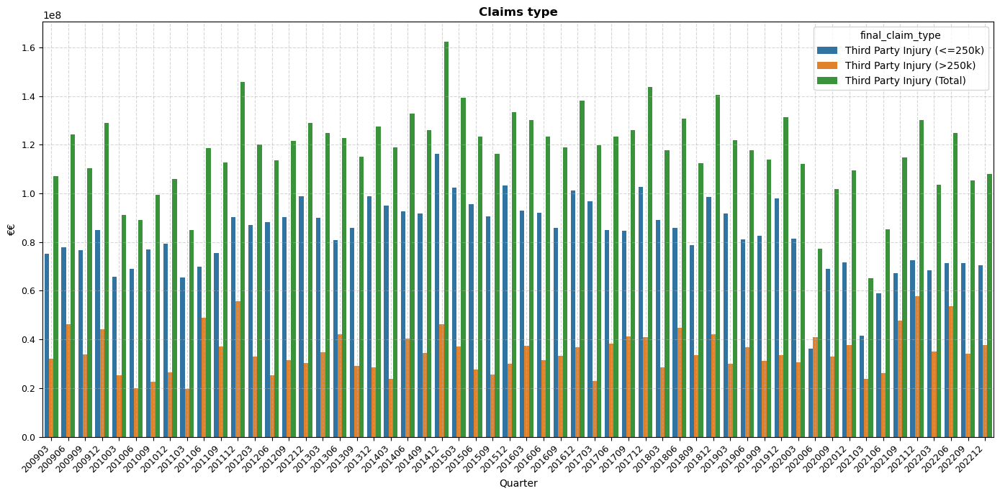

In [541]:
# size is adjusted to have a better visualization
plt.figure(figsize=(14, 7))
sns.barplot(data=b_plot, x='AccidentQuarter', y='Value', hue='final_claim_type')
ax = plt.gca()
plt.title('Claims')
plt.xlabel('Quarter')
plt.ylabel('€€')
# x label is not aligned
plt.xticks(rotation=45, ha='right')
axes, metrics_report = turf(ax, title='Claims type', return_metrics=True)
plt.show()

Third party injury total is the addition of <=250 + > 250... hence this data is going to be dropped

In [542]:
values_to_drop = ['Third Party Injury (Total)']
#Boolean Logic to compute True/False on each element of an array, and then we can work with elements of an array which return either True or False
# ~ is needed to be use, since we want 'it is not matching' results
mask_to_keep = ~df_uc_1['ClaimType'].isin(values_to_drop)
df_uc_1 = df_uc_1[mask_to_keep]
df_uc_1['final_claim_type'].unique()

array(['Asset Damage', 'Third Party Damage',
       'Third Party Injury (<=250k)', 'Third Party Injury (>250k)'],
      dtype=object)

now it is possible to add the categorical value for each year from 2016 to 2012. 2009 to 2015 is going to be used as baseline, median is going to measure and "average year", +/- 1 std is going to be consider above or below average tresholds

In [543]:
# The dataframe is going to be aggregated in order to get yearly figures.
# create the year column, since is a standard nomenclature the last digit of the year is index number 3 in the datatype
df_uc_1['Year'] = df_uc_1['AccidentQuarter'].astype(str).str[:4]
df_uc_1

,AccidentQuarter,Measure,ClaimType,Value,final_claim_type,Year
0,200903,Ultimate Costs,Accidental Damage,51134823.85,Asset Damage,2009
1,200906,Ultimate Costs,Accidental Damage,34743749.72,Asset Damage,2009
2,200909,Ultimate Costs,Accidental Damage,32676745.82,Asset Damage,2009
3,200912,Ultimate Costs,Accidental Damage,52417339.72,Asset Damage,2009
4,201003,Ultimate Costs,Accidental Damage,38389351.44,Asset Damage,2010
...,...,...,...,...,...,...
387,202112,Ultimate Costs,Windscreen,3826947.21,Asset Damage,2021
388,202203,Ultimate Costs,Windscreen,4686009.88,Asset Damage,2022
389,202206,Ultimate Costs,Windscreen,5090315.20,Asset Damage,2022
390,202209,Ultimate Costs,Windscreen,4889588.74,Asset Damage,2022


In [544]:
# columns that are not needed are going to be dropped and the columns are going to be order properly
drop_columns = ['AccidentQuarter', 'Measure', 'ClaimType'] 
df_uc_1 = df_uc_1.drop(columns=drop_columns)
df_uc_1

,Value,final_claim_type,Year
0,51134823.85,Asset Damage,2009
1,34743749.72,Asset Damage,2009
2,32676745.82,Asset Damage,2009
3,52417339.72,Asset Damage,2009
4,38389351.44,Asset Damage,2010
...,...,...,...
387,3826947.21,Asset Damage,2021
388,4686009.88,Asset Damage,2022
389,5090315.20,Asset Damage,2022
390,4889588.74,Asset Damage,2022


In [545]:
new_order = ['Year', 'final_claim_type', 'Value']
df_uc_1 = df_uc_1[new_order]
df_uc_1

,Year,final_claim_type,Value
0,2009,Asset Damage,51134823.85
1,2009,Asset Damage,34743749.72
2,2009,Asset Damage,32676745.82
3,2009,Asset Damage,52417339.72
4,2010,Asset Damage,38389351.44
...,...,...,...
387,2021,Asset Damage,3826947.21
388,2022,Asset Damage,4686009.88
389,2022,Asset Damage,5090315.20
390,2022,Asset Damage,4889588.74


In [546]:
# grouped by year/final_claim_type
df_uc_1_f = df_uc_1.groupby(['Year', 'final_claim_type'])['Value'].sum().reset_index() 
df_uc_1_f



,Year,final_claim_type,Value
0,2009,Asset Damage,226659432.55
1,2009,Third Party Damage,107308545.93
2,2009,Third Party Injury (<=250k),314389110.82
3,2009,Third Party Injury (>250k),156132068.17
4,2010,Asset Damage,170787111.72
5,2010,Third Party Damage,79099072.94
6,2010,Third Party Injury (<=250k),290765175.67
7,2010,Third Party Injury (>250k),94567459.45
8,2011,Asset Damage,146608128.72
9,2011,Third Party Damage,67989399.54


In [547]:
types = ['Asset Damage', 'Third Party Damage', 'Third Party Injury (<=250k)', 'Third Party Injury (>250k)'] 
aggregations = ['median', 'std']
#year is a string it needs to be converted to int
df_uc_1_f['Year'] = df_uc_1_f['Year'].astype('int64')
#create a temporary dataframe to analyze 2009 to 2015 as baseline
ytokeep_p = df_uc_1_f['Year'] < 2016
df_temp = df_uc_1_f[ytokeep_p]
df_temp

,Year,final_claim_type,Value
0,2009,Asset Damage,226659432.55
1,2009,Third Party Damage,107308545.93
2,2009,Third Party Injury (<=250k),314389110.82
3,2009,Third Party Injury (>250k),156132068.17
4,2010,Asset Damage,170787111.72
5,2010,Third Party Damage,79099072.94
6,2010,Third Party Injury (<=250k),290765175.67
7,2010,Third Party Injury (>250k),94567459.45
8,2011,Asset Damage,146608128.72
9,2011,Third Party Damage,67989399.54


In [548]:
type_column = 'final_claim_type'
df_filtered = df_temp[df_temp[type_column].isin(types)]
baseline_metrics = df_filtered.groupby(type_column)['Value'].agg(aggregations)
baseline_metrics.reset_index()

,final_claim_type,median,std
0,Asset Damage,141263189.93,34747812.22
1,Third Party Damage,73395306.41,13402808.97
2,Third Party Injury (<=250k),355543084.82,42927344.43
3,Third Party Injury (>250k),134607203.11,23391508.99


In [549]:
#now that a baseline for each of the componets is defined, is time to add the categorical variables for the components
# first data prior to 2016 is going to be dropped
ytokeep_p = df_uc_1_f['Year'] >= 2016
df_uc_1_f =df_uc_1_f[ytokeep_p].reset_index()

In [550]:
df_uc_1_f

,index,Year,final_claim_type,Value
0,28,2016,Asset Damage,111319504.06
1,29,2016,Third Party Damage,69625782.46
2,30,2016,Third Party Injury (<=250k),371932928.57
3,31,2016,Third Party Injury (>250k),138925686.07
4,32,2017,Asset Damage,107523428.05
5,33,2017,Third Party Damage,70852196.12
6,34,2017,Third Party Injury (<=250k),369175502.32
7,35,2017,Third Party Injury (>250k),143650943.31
8,36,2018,Asset Damage,114164747.25
9,37,2018,Third Party Damage,75381597.82


In [159]:
df_uc_1_f = df_uc_1_f.drop(columns=['index'])
df_uc_1_f

,Year,final_claim_type,Value
0,2016,Asset Damage,111319504.06
1,2016,Third Party Damage,69625782.46
2,2016,Third Party Injury (<=250k),371932928.57
3,2016,Third Party Injury (>250k),138925686.07
4,2017,Asset Damage,107523428.05
5,2017,Third Party Damage,70852196.12
6,2017,Third Party Injury (<=250k),369175502.32
7,2017,Third Party Injury (>250k),143650943.31
8,2018,Asset Damage,114164747.25
9,2018,Third Party Damage,75381597.82


In [160]:
# it is needed to transpose data into the order needed. for that pivot table in built function is goong to be needed
df_uc_pivot = df_uc_1_f.pivot_table(index='Year', columns='final_claim_type', values='Value')
#step needed to avoid final_claim_type becoming a header
df_uc_pivot.columns.name = None
df_uc_pivot.reset_index()

,Year,Asset Damage,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (>250k)
0,2016,111319504.06,69625782.46,371932928.57,138925686.07
1,2017,107523428.05,70852196.12,369175502.32,143650943.31
2,2018,114164747.25,75381597.82,351919820.55,149246404.21
3,2019,118590016.67,82812573.43,353502069.40,131662173.50
4,2020,98637367.13,60956202.28,258371360.11,142081458.45
5,2021,127194140.30,79791184.19,240175215.96,155360381.86
6,2022,197573921.59,111473066.26,281393289.07,160289903.42


In [551]:
# to predict 2023 and 2024 SARIMAX since a exogenous variable is already analyzed in the data gathering
df_rsa_transposed

,Year,Fatal,Injury,Damage,TOTAL,Vehicles current licences
0,2010,185,"5,595","21,305","27,085","2,416,000"
1,2011,172,"5,058","21,863","27,093","2,425,000"
2,2012,152,"5,458","20,561","26,171","2,403,000"
3,2013,179,"4,797","21,734","26,710","2,483,000"
4,2014,178,"5,618","33,510","39,306","2,515,000"
5,2015,155,"5,676","35,997","41,828","2,570,000"
6,2016,172,"5,706","37,085","42,963","2,625,000"
7,2017,140,"5,867","40,702","46,709","2,676,000"
8,2018,128,"5,928","41,389","47,445","2,718,000"
9,2019,129,"5,699","43,015","48,843","2,806,000"


RSA change the way they report yearly data. now it is a presentation, so manually 2020-2022 is collected. Source: https://www.rsa.ie/docs/default-source/road-safety/r2---statistics/road-collision-annual-reports/trend-analysis-of-fatalities-(2020-2024)-and-serious-injuries-(2020-2023).pdf?sfvrsn=c861e180_1

In [552]:
url = 'https://docs.google.com/spreadsheets/d/e/2PACX-1vTL9parp_eTpc-_evywQryKJJ1PfeM_guI9BDHEXJeoGe0oyqxKMzULiZSOmWmWEIM6Xa8OprEkNQtx/pub?output=csv'
rsa_2020 = pd.read_csv(url)
rsa_2020

,Year,Fatal,Injury,Damage,TOTAL
0,2020,141,6084,"45,926","52,151"
1,2021,132,6320,"47,710","54,162"
2,2022,152,6559,"49,518","56,229"


In [555]:
df_rsa_transposed_f = pd.concat([df_rsa_transposed, rsa_2020], ignore_index=True)
df_rsa_transposed_f

,Year,Fatal,Injury,Damage,TOTAL,Vehicles current licences
0,2010,185,"5,595","21,305","27,085","2,416,000"
1,2011,172,"5,058","21,863","27,093","2,425,000"
2,2012,152,"5,458","20,561","26,171","2,403,000"
3,2013,179,"4,797","21,734","26,710","2,483,000"
4,2014,178,"5,618","33,510","39,306","2,515,000"
5,2015,155,"5,676","35,997","41,828","2,570,000"
6,2016,172,"5,706","37,085","42,963","2,625,000"
7,2017,140,"5,867","40,702","46,709","2,676,000"
8,2018,128,"5,928","41,389","47,445","2,718,000"
9,2019,129,"5,699","43,015","48,843","2,806,000"


In [556]:
df_rsa_transposed_f = df_rsa_transposed_f.drop(columns='Vehicles current licences', inplace=False)
df_rsa_transposed_f

,Year,Fatal,Injury,Damage,TOTAL
0,2010,185,"5,595","21,305","27,085"
1,2011,172,"5,058","21,863","27,093"
2,2012,152,"5,458","20,561","26,171"
3,2013,179,"4,797","21,734","26,710"
4,2014,178,"5,618","33,510","39,306"
5,2015,155,"5,676","35,997","41,828"
6,2016,172,"5,706","37,085","42,963"
7,2017,140,"5,867","40,702","46,709"
8,2018,128,"5,928","41,389","47,445"
9,2019,129,"5,699","43,015","48,843"


In [557]:
df_rsa_transposed_f.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13 entries, 0 to 12
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Year    13 non-null     object
 1   Fatal   13 non-null     object
 2   Injury  13 non-null     object
 3   Damage  13 non-null     object
 4   TOTAL   13 non-null     object
dtypes: object(5)
memory usage: 652.0+ bytes


In [558]:
# an error of the dataframe in the cell below was identify, source of problem was data type, hence is converted to integer
df_rsa_transposed_f['Year'] = df_rsa_transposed_f['Year'].astype(int)

In [559]:
# merge both datasets
df_uc_pivot_f = pd.merge(df_uc_pivot, df_rsa_transposed_f, how='left', on='Year') 
df_uc_pivot_f

,Year,Asset Damage,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (>250k),Fatal,Injury,Damage,TOTAL
0,2016,111319504.06,69625782.46,371932928.57,138925686.07,172,"5,706","37,085","42,963"
1,2017,107523428.05,70852196.12,369175502.32,143650943.31,140,"5,867","40,702","46,709"
2,2018,114164747.25,75381597.82,351919820.55,149246404.21,128,"5,928","41,389","47,445"
3,2019,118590016.67,82812573.43,353502069.40,131662173.50,129,"5,699","43,015","48,843"
4,2020,98637367.13,60956202.28,258371360.11,142081458.45,141,6084,"45,926","52,151"
5,2021,127194140.30,79791184.19,240175215.96,155360381.86,132,6320,"47,710","54,162"
6,2022,197573921.59,111473066.26,281393289.07,160289903.42,152,6559,"49,518","56,229"


In [560]:
# drop total since it is not going to be useful
df_uc_pivot_f = df_uc_pivot_f.drop(columns='TOTAL', inplace=False)
df_uc_pivot_f

,Year,Asset Damage,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (>250k),Fatal,Injury,Damage
0,2016,111319504.06,69625782.46,371932928.57,138925686.07,172,"5,706","37,085"
1,2017,107523428.05,70852196.12,369175502.32,143650943.31,140,"5,867","40,702"
2,2018,114164747.25,75381597.82,351919820.55,149246404.21,128,"5,928","41,389"
3,2019,118590016.67,82812573.43,353502069.40,131662173.50,129,"5,699","43,015"
4,2020,98637367.13,60956202.28,258371360.11,142081458.45,141,6084,"45,926"
5,2021,127194140.30,79791184.19,240175215.96,155360381.86,132,6320,"47,710"
6,2022,197573921.59,111473066.26,281393289.07,160289903.42,152,6559,"49,518"


In [561]:
#SARIMAX model to predic 2023 and 2024
# numerical types are going to be standarized
integ_columns = ['Year', 'Fatal', 'Injury', 'Damage']
fl_columns = ['Asset Damage', 'Third Party Damage', 'Third Party Injury (<=250k)', 'Third Party Injury (>250k)']
dic_changes = {}
for col in integ_columns:
    dic_changes[col] = 'Int64'
for col in fl_columns:
    dic_changes[col] = 'float64'
for col, dtype in dic_changes.items():
    if df_uc_pivot_f[col].dtype == 'object':
            df_uc_pivot_f[col] = df_uc_pivot_f[col].astype(str)
            df_uc_pivot_f[col] = df_uc_pivot_f[col].str.replace(r'[^\d\.\-]', '', regex=True)
    if dtype == 'Int64':
        df_uc_pivot_f[col] = pd.to_numeric(df_uc_pivot_f[col], errors='coerce').astype(dtype)
    else: 
        df_uc_pivot_f[col] = pd.to_numeric(df_uc_pivot_f[col], errors='coerce').astype(dtype)
df_uc_pivot_f.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7 entries, 0 to 6
Data columns (total 8 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   Year                         7 non-null      Int64  
 1   Asset Damage                 7 non-null      float64
 2   Third Party Damage           7 non-null      float64
 3   Third Party Injury (<=250k)  7 non-null      float64
 4   Third Party Injury (>250k)   7 non-null      float64
 5   Fatal                        7 non-null      Int64  
 6   Injury                       7 non-null      Int64  
 7   Damage                       7 non-null      Int64  
dtypes: Int64(4), float64(4)
memory usage: 608.0 bytes


In [562]:
# after standarizing data as needed, SARIMAX can be applied
y = df_uc_pivot_f[['Asset Damage', 'Third Party Damage', 'Third Party Injury (<=250k)', 'Third Party Injury (>250k)']]	
X = df_uc_pivot_f[['Fatal', 'Injury', 'Damage']] #exogenous variable
# Split the data set into Training and Testing parts
split_year = 2020
y_train = y.loc[y.index < split_year]
y_test = y.loc[y.index >= split_year]
X_train = X.loc[X.index < split_year]
X_test = X.loc[X.index >= split_year]
X_train, X_test, y_train, y_test

(   Fatal  Injury  Damage
 0    172    5706   37085
 1    140    5867   40702
 2    128    5928   41389
 3    129    5699   43015
 4    141    6084   45926
 5    132    6320   47710
 6    152    6559   49518,
 Empty DataFrame
 Columns: [Fatal, Injury, Damage]
 Index: [],
    Asset Damage  Third Party Damage  Third Party Injury (<=250k)  \
 0  111319504.06         69625782.46                 371932928.57   
 1  107523428.05         70852196.12                 369175502.32   
 2  114164747.25         75381597.82                 351919820.55   
 3  118590016.67         82812573.43                 353502069.40   
 4   98637367.13         60956202.28                 258371360.11   
 5  127194140.30         79791184.19                 240175215.96   
 6  197573921.59        111473066.26                 281393289.07   
 
    Third Party Injury (>250k)  
 0                138925686.07  
 1                143650943.31  
 2                149246404.21  
 3                131662173.50  
 4       

In [563]:
#test data 
# a notable difference in comparison to previous executions of this code, is that there are 3 target variables. A loop is needed to evaluate each
from statsmodels.tsa.stattools import adfuller
# i used list as a variable somewhere in my code(look where and fix it). temporary solution delete the content and rerun it
adf = {}
for column in y.columns:    
    data = y[column]
    ad_results = adfuller(data)
    p_value = ad_results[1]
    adf[column] = p_value

adf_df = pd.DataFrame(list(adf.items()),columns=['Time Series', 'ADF p-value'])
adf_df     

,Time Series,ADF p-value
0,Asset Damage,0.63
1,Third Party Damage,0.16
2,Third Party Injury (<=250k),0.75
3,Third Party Injury (>250k),0.74


p-values above .05 treshold, d gets a value of 1

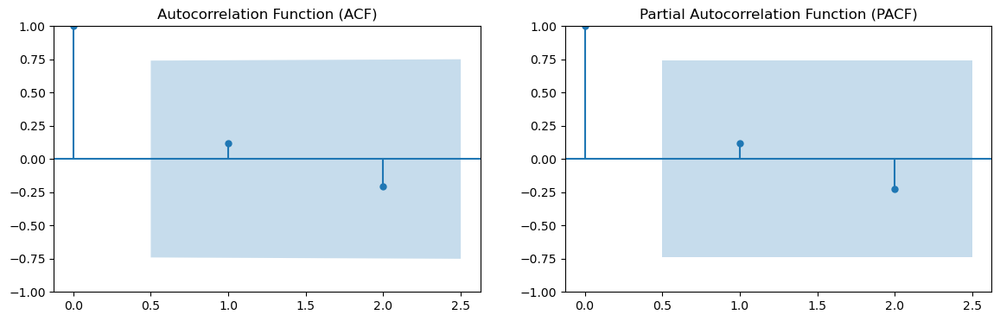

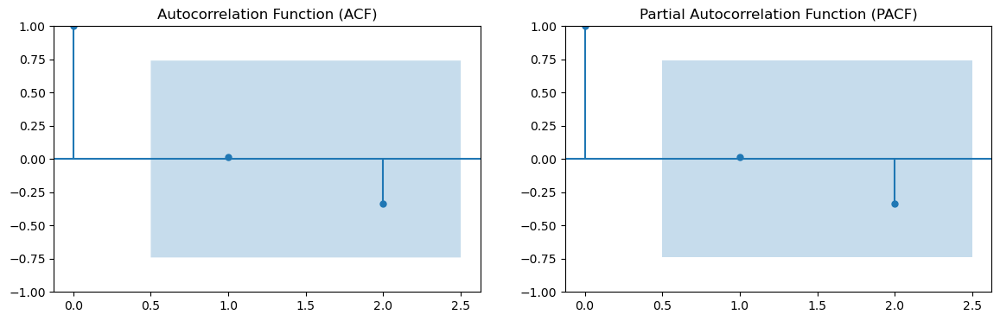

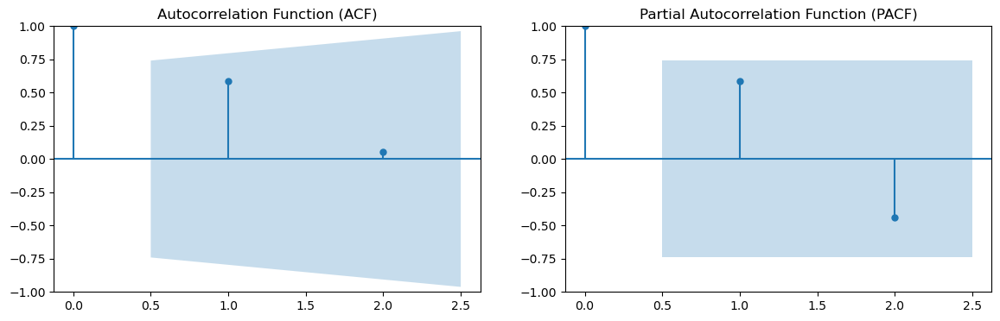

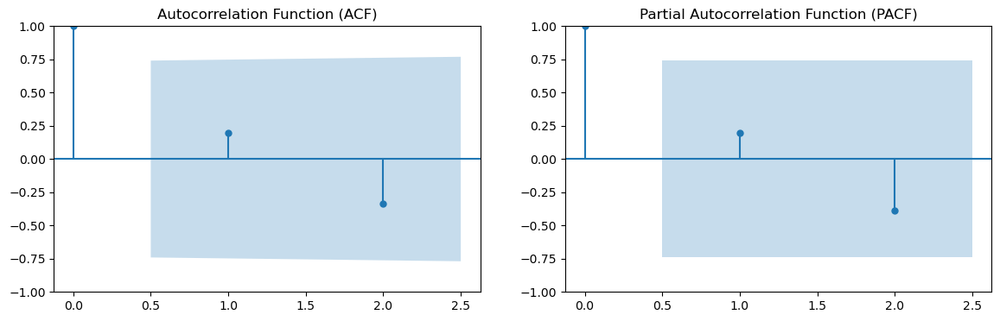

In [564]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
d = 1
# loop to plot acf and pacf for each y 
for column in y.columns:
    plot_data = y[column]
    fig, axes = plt.subplots(1, 2, figsize=(14, 4))
    #a max lag is defined since we are working with more than 1 plot
    max_lags = max(1, len(plot_data) // 2 - 1)
    plot_acf(plot_data, ax=axes[0], lags=max_lags)
    axes[0].set_title('Autocorrelation Function (ACF)')
    plot_pacf(plot_data, ax=axes[1], lags=max_lags, method='ywm')
    axes[1].set_title('Partial Autocorrelation Function (PACF)')
    plt.show()


for all variables p and q are 0

In [565]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
p = 0
q = 0
#a loop is needed to perform SARIMAX in all columns
models = {}
for column in y.columns:
    #error Pandas data cast to numpy dtype of object force to convert all data to float
    y_train_fl = y_train[column].astype('float64')
    X_train_fl = X_train.astype('float64')
    model = SARIMAX(endog=y_train_fl, exog=X_train_fl, order=(p, d, q), enforce_stationarity=False, enforce_invertibility=False)
    forecast = model.fit(disp=False)
    models[column] = {'model_fit': forecast, 'summary': forecast.summary()}

In [566]:
models

{'Asset Damage': {'model_fit': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x22837720470>,
  'summary': <class 'statsmodels.iolib.summary.Summary'>
  """
                                 SARIMAX Results                                
  Dep. Variable:           Asset Damage   No. Observations:                    7
  Model:               SARIMAX(0, 1, 0)   Log Likelihood                 -95.406
  Date:                Thu, 30 Oct 2025   AIC                            198.813
  Time:                        16:29:28   BIC                            197.251
  Sample:                             0   HQIC                           194.620
                                    - 7                                         
  Covariance Type:                  opg                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
  ------------------------------------------------------------------------------
  Fatal       6.953

In [567]:
#reruning sarimax model (1,1,1)
d = 1
p = 1
q = 1
for column in y.columns:
    #error Pandas data cast to numpy dtype of object force to convert all data to float
    y_train_fl = y_train[column].astype('float64')
    X_train_fl = X_train.astype('float64')
    model = SARIMAX(endog=y_train_fl, exog=X_train_fl, order=(p, d, q), enforce_stationarity=False, enforce_invertibility=False)
    forecast = model.fit(disp=False)
    models[column] = {'model_fit': forecast, 'summary': forecast.summary()}

In [568]:
models

{'Asset Damage': {'model_fit': <statsmodels.tsa.statespace.sarimax.SARIMAXResultsWrapper at 0x2282e07fb60>,
  'summary': <class 'statsmodels.iolib.summary.Summary'>
  """
                                 SARIMAX Results                                
  Dep. Variable:           Asset Damage   No. Observations:                    7
  Model:               SARIMAX(1, 1, 1)   Log Likelihood                 -70.566
  Date:                Thu, 30 Oct 2025   AIC                            153.132
  Time:                        16:29:32   BIC                            149.450
  Sample:                             0   HQIC                           145.052
                                    - 7                                         
  Covariance Type:                  opg                                         
                   coef    std err          z      P>|z|      [0.025      0.975]
  ------------------------------------------------------------------------------
  Fatal       6.953

d = 1; p = 0; q = 1 is providing out of the roof p-values. as it can be noticed above for (1,1,1) all pvalues are 0. It might indicate that the model is not capable of calculating errors due to unstability. For educational purposes, the forecast is going to be coded, THE MODEL is DISCARDED 

In [569]:
#predicting 2023 and 2024 data and append to the table 
Fatal_2324 = [179, 172] 
Injury = [1696, 1458] 
Damage = [51025, 52220]
predict_df = pd.DataFrame({'Fatal_2324': Fatal_2324, 'Injury': Injury, 'Damage': Damage})
predict_df

,Fatal_2324,Injury,Damage
0,179,1696,51025
1,172,1458,52220


In [570]:
all_forcasts = {}
for column in y.columns:
    model_fit = models[column]['model_fit']
    results = model_fit.get_forecast(steps=len(predict_df), exog=predict_df)
    all_forcasts[column] = results.predicted_mean.values
forcast_df = pd.DataFrame(all_forcasts, index=predict_df.index)
forcast_df


,Asset Damage,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (>250k)
0,156605944.49,162398102.58,684024296.54,-135470704.12
1,154729029.80,169071705.26,700844344.00,-151280643.06


as the SARIMAX analysis predicted, the model is not reliable. third part injuries, out of nowhere is negative

In [571]:
!pip install statsmodels


[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [572]:
from statsmodels.tsa.api import Holt
forecast_results = {}
# Forecast for 2023 and 2024
steps = 2 
for column in df_uc_pivot.columns:
    model = Holt(df_uc_pivot[column], damped_trend=True, initialization_method='estimated').fit(smoothing_level=0.8, smoothing_trend=0.2)
    fit = model.forecast(steps)
    forecast_results[column] = fit.values
df_holt = pd.DataFrame(forecast_results)
df_holt
    

,Year,Asset Damage,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (>250k)
0,2022.98,195815056.39,111394939.53,258172666.98,163632636.94
1,2023.96,208850392.35,117935076.45,246790811.99,167725675.29


In [573]:
# Holt might be used again so it will become a function
def holt_forecast(df, cols):
    forecast_results = {}
    # Forecast for 2023 and 2024
    steps = 2 
    for cols in df.columns:
        data = pd.to_numeric(df[cols], errors='coerce').fillna(method='ffill')
        # skip non-numeric or empty series
        if data.empty or not np.issubdtype(data.dtype, np.number):
            continue
        model = Holt(data, damped_trend=True, initialization_method='estimated').fit(smoothing_level=0.8, smoothing_trend=0.2)
        fit = model.forecast(steps)
        forecast_results[cols] = fit.values
    holt = pd.DataFrame(forecast_results)
    return holt
    

In [574]:
df_holt = pd.DataFrame(forecast_results).reset_index(drop=True)
df_holt['Year'] = [2023, 2024]
df_holt

,Year,Asset Damage,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (>250k)
0,2023,195815056.39,111394939.53,258172666.98,163632636.94
1,2024,208850392.35,117935076.45,246790811.99,167725675.29


In [575]:
new_order = ['Year', 'Asset Damage', 'Third Party Damage', 'Third Party Injury (<=250k)', 'Third Party Injury (>250k)']
df_holt = df_holt[new_order]
df_holt

,Year,Asset Damage,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (>250k)
0,2023,195815056.39,111394939.53,258172666.98,163632636.94
1,2024,208850392.35,117935076.45,246790811.99,167725675.29


In [576]:
df_uc_pivot = df_uc_pivot.reset_index()

In [577]:
df_uc_pivot_features = pd.concat([df_uc_pivot, df_holt], ignore_index=True)
df_uc_pivot_features

,index,Year,Asset Damage,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (>250k)
0,0.00,2016,111319504.06,69625782.46,371932928.57,138925686.07
1,1.00,2017,107523428.05,70852196.12,369175502.32,143650943.31
2,2.00,2018,114164747.25,75381597.82,351919820.55,149246404.21
3,3.00,2019,118590016.67,82812573.43,353502069.40,131662173.50
4,4.00,2020,98637367.13,60956202.28,258371360.11,142081458.45
5,5.00,2021,127194140.30,79791184.19,240175215.96,155360381.86
6,6.00,2022,197573921.59,111473066.26,281393289.07,160289903.42
7,NaN,2023,195815056.39,111394939.53,258172666.98,163632636.94
8,NaN,2024,208850392.35,117935076.45,246790811.99,167725675.29


In [578]:
# now that all the data needed is considered in the dataframe, it is possible to proceed to create the categoricar variables
baseline_metrics.transpose()
baseline_metrics = baseline_metrics.reset_index()
baseline_metrics

,final_claim_type,median,std
0,Asset Damage,141263189.93,34747812.22
1,Third Party Damage,73395306.41,13402808.97
2,Third Party Injury (<=250k),355543084.82,42927344.43
3,Third Party Injury (>250k),134607203.11,23391508.99


In [579]:
# define range
index = [0, 1, 2, 3]
year = year = list(range(2016, 2025))
limits = []
for i in index:
    name = baseline_metrics['final_claim_type'][i]
    median = baseline_metrics['median'][i]
    std = baseline_metrics['std'][i]
    average_year = median
    high_instance_year = median + std * 2
    extreme_instance_year = median + std * 3
    low_instance_year = median - std * 2
    slight_instance_year = median - std * 3
    limits.append({'Claim Type': name, 'Average (Median)': average_year, 'Low (-2 STD)': low_instance_year, 'Slight (-3 STD)': slight_instance_year,'High (+2 STD)': high_instance_year, 'Extreme (+3 STD)': extreme_instance_year})
limits_df = pd.DataFrame(limits)
limits_df

,Claim Type,Average (Median),Low (-2 STD),Slight (-3 STD),High (+2 STD),Extreme (+3 STD)
0,Asset Damage,141263189.93,71767565.48,37019753.26,210758814.38,245506626.60
1,Third Party Damage,73395306.41,46589688.48,33186879.51,100200924.34,113603733.30
2,Third Party Injury (<=250k),355543084.82,269688395.96,226761051.52,441397773.68,484325118.11
3,Third Party Injury (>250k),134607203.11,87824185.14,64432676.15,181390221.08,204781730.07


In [580]:
col_name = ['Asset Damage', 'Third Party Damage', 'Third Party Injury (<=250k)', 'Third Party Injury (>250k)']
index = [0, 1, 2, 3] 

for col in index:
    current_col_name = col_name[col]
    median = limits_df.loc[col, 'Average (Median)']
    median_upper = median * 1.03 # Median + 3%
    median_lower = median * 0.97 # Median - 3%
    low= limits_df.loc[col, 'Low (-2 STD)']
    slight = limits_df.loc[col, 'Slight (-3 STD)']
    high = limits_df.loc[col, 'High (+2 STD)']
    extreme = limits_df.loc[col, 'Extreme (+3 STD)']
    counter = df_uc_pivot_features[current_col_name]
    conditions = [(counter <= median_upper) & (counter >= median_lower),
    (counter >= extreme),
    (counter > median_upper) & (counter < extreme),
    (counter <= slight),
    (counter < median_lower) & (counter > slight)]
    selection = ['Average', 'Extreme', 'High', 'Slight', 'Low']
    #for no.select, order matters, be careful with that. 
    cat_col_name = f'{current_col_name} categorical'
    df_uc_pivot_features[cat_col_name] = np.select(conditions, selection, default='Unclassified')
category_columns = [col for col in df_uc_pivot_features.columns if 'categorical' in col]
display_columns = ['Year'] + col_name + category_columns
df_uc_pivot_features[display_columns]

,Year,Asset Damage,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (>250k),Asset Damage categorical,Third Party Damage categorical,Third Party Injury (<=250k) categorical,Third Party Injury (>250k) categorical
0,2016,111319504.06,69625782.46,371932928.57,138925686.07,Low,Low,High,High
1,2017,107523428.05,70852196.12,369175502.32,143650943.31,Low,Low,High,High
2,2018,114164747.25,75381597.82,351919820.55,149246404.21,Low,Average,Average,High
3,2019,118590016.67,82812573.43,353502069.40,131662173.50,Low,High,Average,Average
4,2020,98637367.13,60956202.28,258371360.11,142081458.45,Low,Low,Low,High
5,2021,127194140.30,79791184.19,240175215.96,155360381.86,Low,High,Low,High
6,2022,197573921.59,111473066.26,281393289.07,160289903.42,High,High,Low,High
7,2023,195815056.39,111394939.53,258172666.98,163632636.94,High,High,Low,High
8,2024,208850392.35,117935076.45,246790811.99,167725675.29,High,Extreme,Low,High


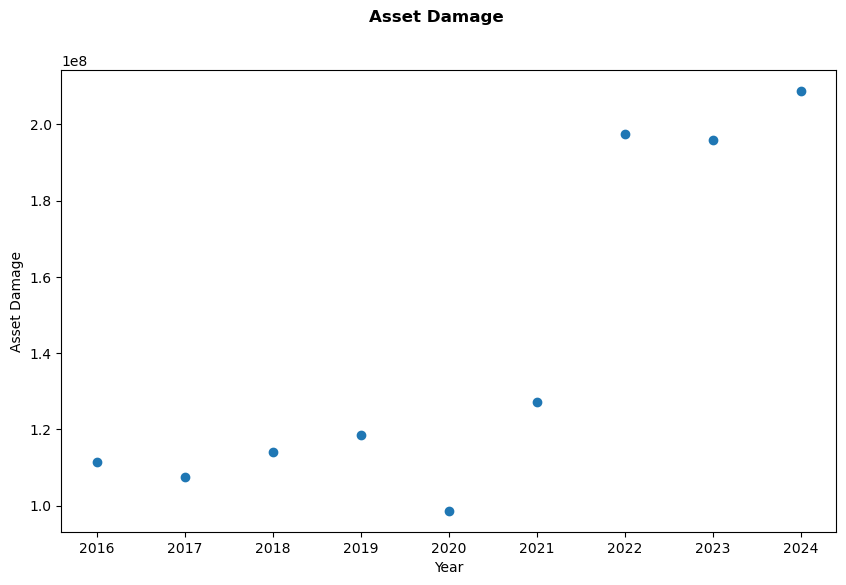

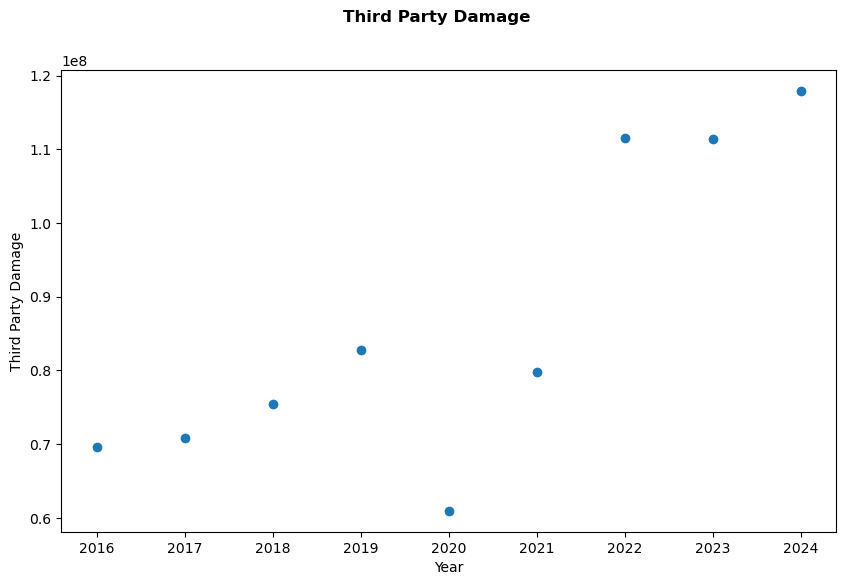

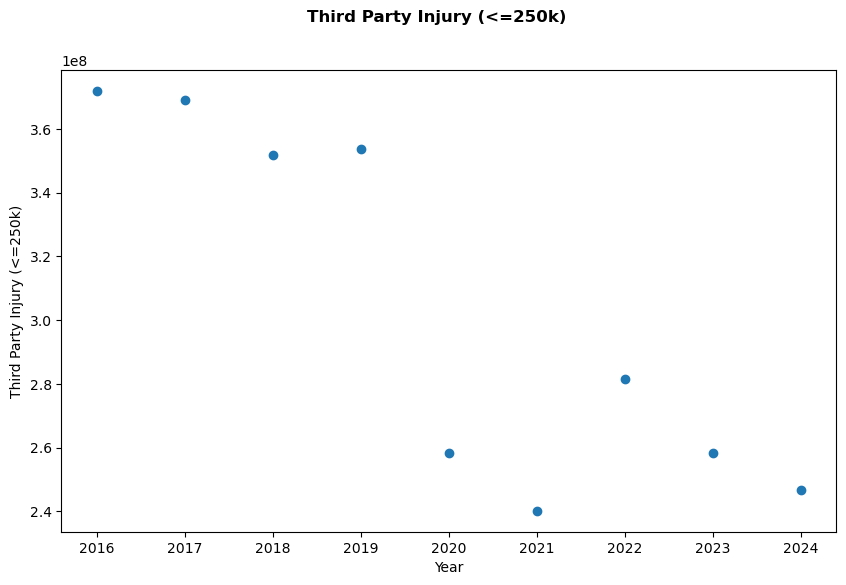

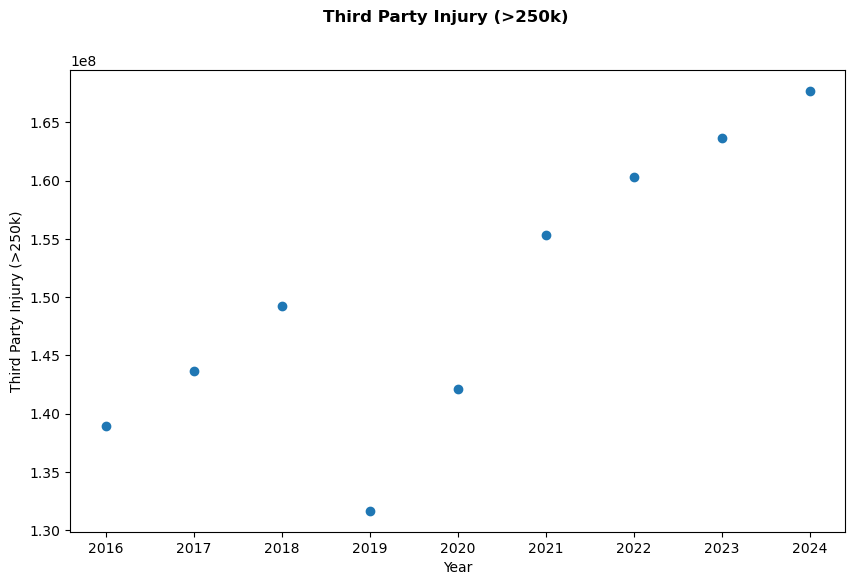

In [581]:
df = df_uc_pivot_features 
cols = ['Asset Damage', 'Third Party Damage','Third Party Injury (<=250k)', 'Third Party Injury (>250k)']
for i in cols:
    plot_scatter(df, y_col= i)

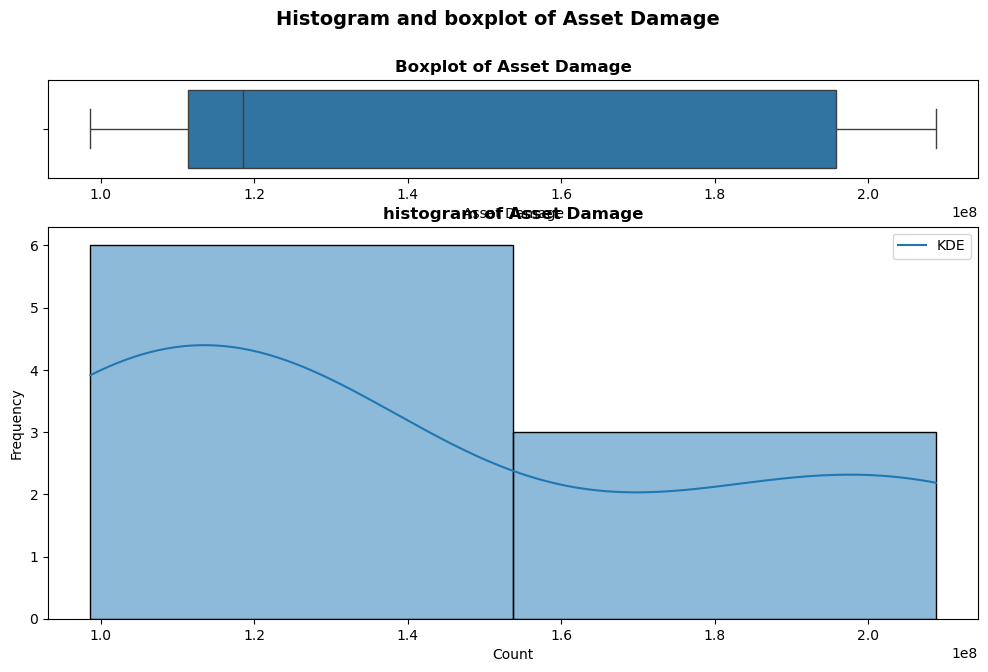

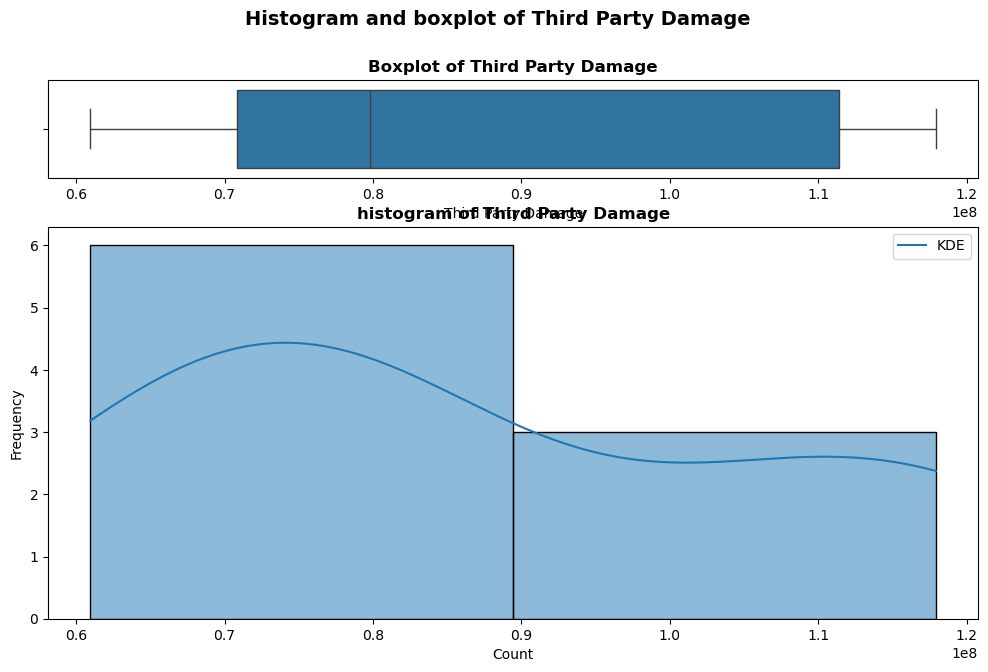

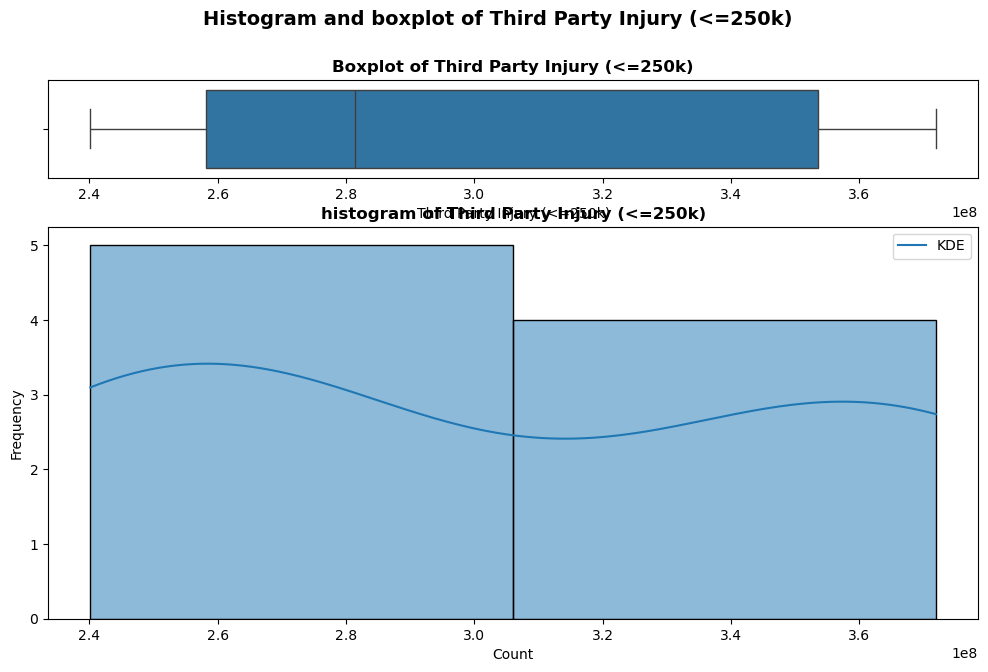

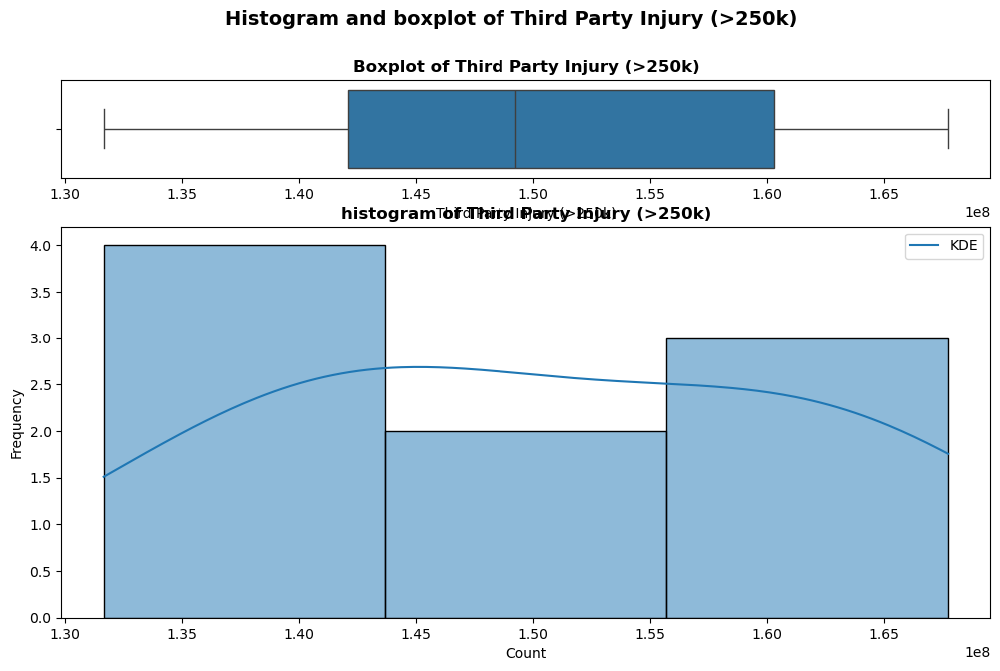

In [582]:
df = df_uc_pivot_features 
cols = ['Asset Damage', 'Third Party Damage','Third Party Injury (<=250k)', 'Third Party Injury (>250k)']
for i in cols:
    plot_histo(df, y_col= i)

In [583]:
df = df_uc_pivot_features 
cols = ['Asset Damage', 'Third Party Damage','Third Party Injury (<=250k)', 'Third Party Injury (>250k)']
for i in cols:
    print(f'\n=== Distribution Fit Results for {i} ===')
    result = dist_type(df, y_col=i)
    #print is going to print <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001EF55E97530>, use display instead
    display(result.head(10))
    


=== Distribution Fit Results for Asset Damage ===


,Distribution,AIC,KS_stat,KS_p,Params
3,beta,293.08,0.42,0.06,"(0.08399090202596712, 0.15240331598847937, 986..."
2,gamma,314.34,0.32,0.26,"(0.5451491988592647, 98637367.13387398, 457520..."
4,lognorm,315.29,0.48,0.02,"(11.129588673825978, 98637367.13387398, 630487..."
5,uniform,337.32,0.41,0.07,"(98637367.133874, 110213025.21311557)"
1,expon,338.61,0.23,0.67,"(98637367.133874, 43548029.95512584)"
8,genlogistic,345.42,0.25,0.54,"(1889.129273144923, -101478874.59061056, 29740..."
0,norm,345.57,0.31,0.30,"(142185397.08899984, 42170913.53282152)"
10,laplace,346.14,0.28,0.38,"(118590016.673489, 33087607.126432616)"
9,logistic,346.45,0.26,0.51,"(136664778.51469183, 25634708.842858717)"
6,t,359.88,0.64,0.00,"(32485864410.43879, 70111551.30618712, 8120860..."



=== Distribution Fit Results for Third Party Damage ===


,Distribution,AIC,KS_stat,KS_p,Params
3,beta,248.91,0.31,0.29,"(0.28206206308357457, 0.44252635575377564, 609..."
2,gamma,295.75,0.65,0.00,"(0.23332335403267723, 60956202.28020799, 35337..."
4,lognorm,308.74,0.49,0.01,"(11.226215673043754, 60956202.28020799, 434424..."
5,uniform,325.45,0.28,0.39,"(60956202.280208, 56978874.1708507)"
1,expon,329.14,0.19,0.83,"(60956202.280208, 25735199.77895709)"
0,norm,332.13,0.24,0.58,"(86691402.05916509, 19987632.70126241)"
8,genlogistic,332.93,0.23,0.65,"(977.8751630367735, -29408216.71124371, 154938..."
9,logistic,333.02,0.23,0.64,"(84789817.88949981, 12189107.48738121)"
10,laplace,333.41,0.26,0.49,"(79791184.194482, 16311097.444887089)"
6,t,334.13,0.24,0.58,"(2632885243.7938695, 86691402.70031765, 199876..."



=== Distribution Fit Results for Third Party Injury (<=250k) ===


,Distribution,AIC,KS_stat,KS_p,Params,Error
4,lognorm,322.33,0.46,0.03,"(11.036083948550548, 240175215.95709798, 93996...",NaN
5,uniform,340.54,0.31,0.30,"(240175215.957098, 131757712.610075)",NaN
1,expon,345.35,0.27,0.44,"(240175215.957098, 63317413.48199457)",NaN
0,norm,349.81,0.26,0.49,"(303492629.4390926, 53382114.14789835)",NaN
9,logistic,351.07,0.26,0.50,"(301687930.60717607, 34012944.83494537)",NaN
8,genlogistic,351.35,0.28,0.41,"(1067.3462377351589, -26044760.693569012, 4351...",NaN
2,gamma,351.51,0.28,0.40,"(20.576883226080497, 66587286.20518446, 114219...",NaN
6,t,351.81,0.26,0.49,"(106241504798.14304, 303492310.4909669, 533819...",NaN
10,laplace,353.29,0.33,0.24,"(281393289.074391, 49224473.97724839)",NaN
7,chi2,inf,1.00,0.00,"(0.8892186687827263, 424192744.4434391, 4.3907...",NaN



=== Distribution Fit Results for Third Party Injury (>250k) ===


,Distribution,AIC,KS_stat,KS_p,Params
4,lognorm,306.09,0.49,0.01,"(10.930906588009668, 131662173.50449897, 38502..."
3,beta,314.85,0.11,1.00,"(0.8899453786112488, 0.9582568665231638, 13166..."
5,uniform,317.21,0.13,0.99,"(131662173.50449899, 36063501.78158215)"
0,norm,322.23,0.16,0.94,"(150286140.3390247, 11529793.825583505)"
9,logistic,323.09,0.16,0.94,"(150204551.640589, 7049461.596783185)"
1,expon,323.32,0.21,0.74,"(131662173.50449899, 18623966.834525704)"
2,gamma,324.23,0.16,0.94,"(437363.4994649902, -7474705271.886084, 17433...."
6,t,324.23,0.16,0.94,"(37410527417.34332, 150286140.7976128, 1152979..."
10,laplace,324.74,0.17,0.91,"(149246404.205858, 10076481.796166055)"
8,genlogistic,324.76,0.14,0.98,"(9.09188093006982, 123645005.2206811, 9857803...."


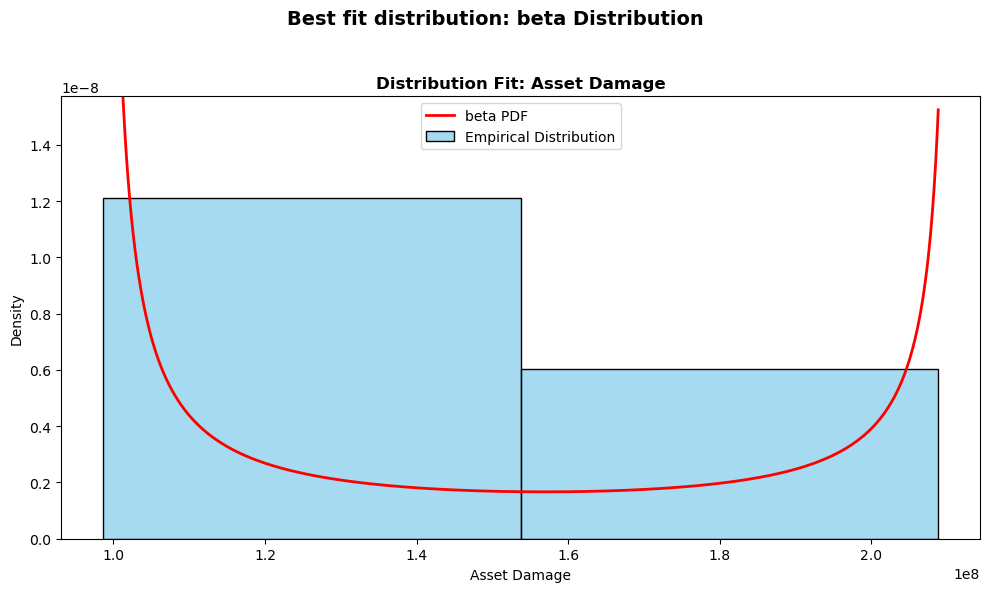

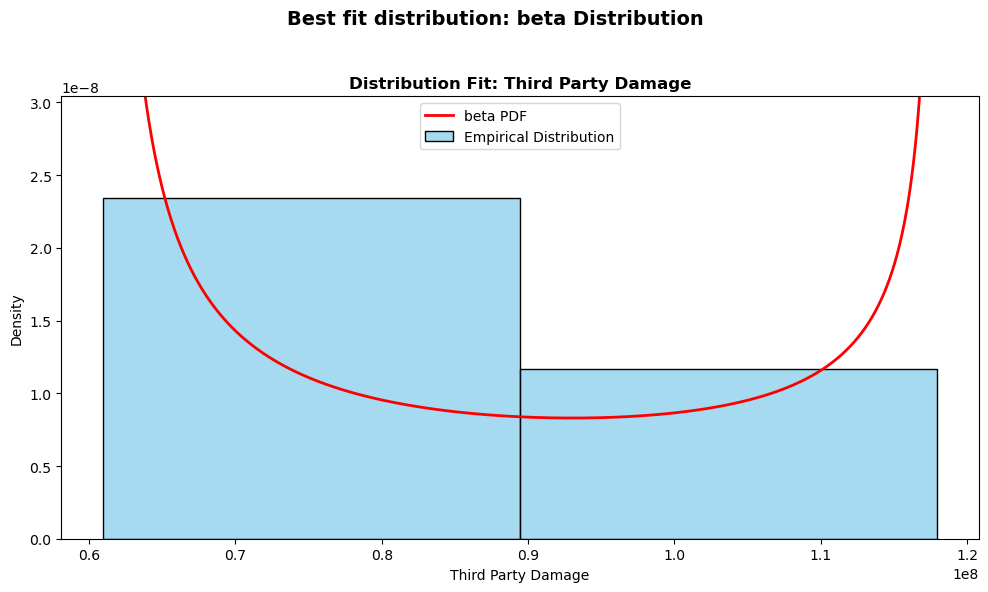

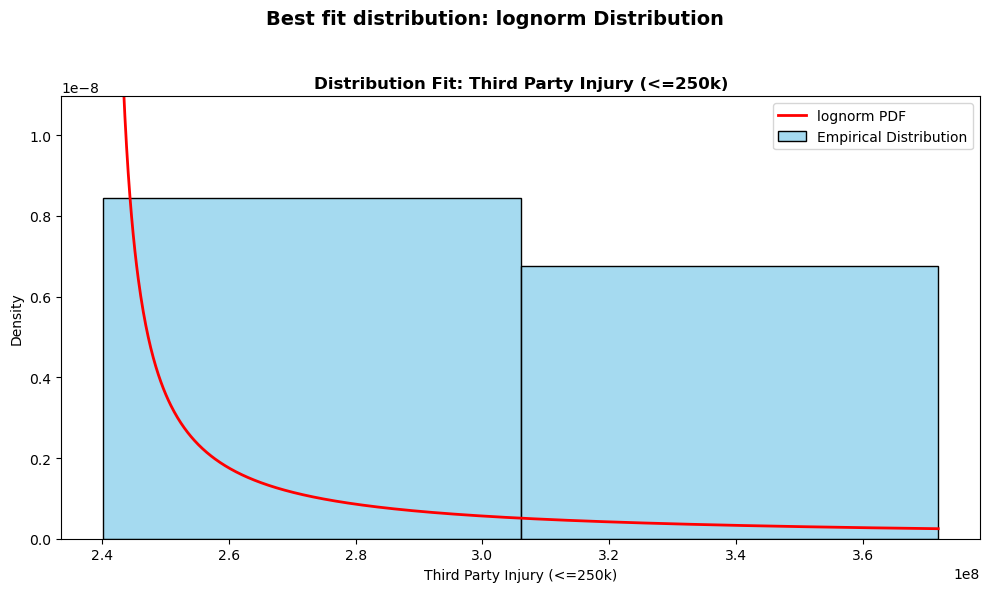

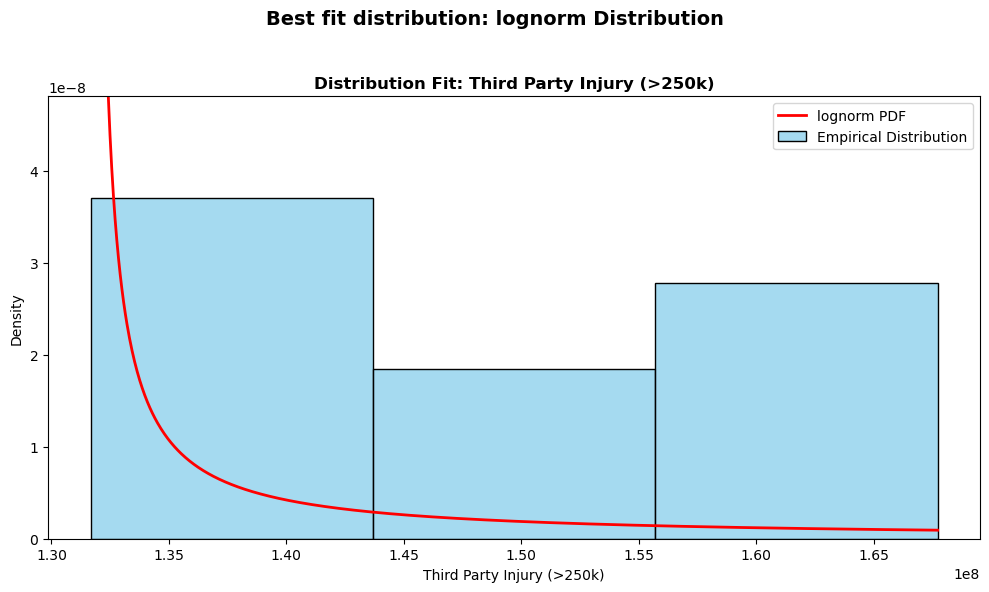

In [584]:
df = df_uc_pivot_features 
cols = ['Asset Damage', 'Third Party Damage','Third Party Injury (<=250k)', 'Third Party Injury (>250k)']
for i in cols:
    plot_best_dist(df, y_col= i)

**Claims settlement Dataframe**

In [585]:
df_cs.head()

,SettledYear,Measure,ClaimType,SettlementChannel,SettledCostBand,Value
0,2015,Number,Third Party Injury (Total),Direct,0 - 10000,2397.00
1,2015,Number,Third Party Injury (Total),Direct,10001 - 15000,1602.00
2,2015,Number,Third Party Injury (Total),Direct,15001 - 30000,1521.00
3,2015,Number,Third Party Injury (Total),Direct,30001 - 45000,248.00
4,2015,Number,Third Party Injury (Total),Direct,45001 - 60000,92.00


In [586]:
df_cs.tail()

,SettledYear,Measure,ClaimType,SettlementChannel,SettledCostBand,Value
331,2022,Total Cost,Third Party Injury (Total),PIAB,15001 - 30000,7711265.97
332,2022,Total Cost,Third Party Injury (Total),PIAB,30001 - 45000,2272077.95
333,2022,Total Cost,Third Party Injury (Total),PIAB,45001 - 60000,1529690.86
334,2022,Total Cost,Third Party Injury (Total),PIAB,60001 - 100000,1983889.36
335,2022,Total Cost,Third Party Injury (Total),PIAB,>100001,1335349.49


In [587]:
df_cs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 336 entries, 0 to 335
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   SettledYear        336 non-null    int64  
 1   Measure            336 non-null    object 
 2   ClaimType          336 non-null    object 
 3   SettlementChannel  336 non-null    object 
 4   SettledCostBand    336 non-null    object 
 5   Value              336 non-null    float64
dtypes: float64(1), int64(1), object(4)
memory usage: 15.9+ KB


In [588]:
df_cs['SettlementChannel'].unique()

array(['Direct', 'Litigated', 'PIAB'], dtype=object)

In [589]:
df_cs['Measure'].unique()

array(['Number', 'Total Cost'], dtype=object)

this is study is targeting monetary impact, hence number is going to be dropped

In [590]:
df_cs_1 = df_cs.copy()
values_to_drop = ['Number']
#Boolean Logic to compute True/False on each element of an array, and then we can work with elements of an array which return either True or False
# ~ is needed to be use, since we want 'it is not matching' results
mask_to_keep = ~df_cs_1['Measure'].isin(values_to_drop)
df_cs_1 = df_cs_1[mask_to_keep]
df_cs_1['Measure'].unique()

array(['Total Cost'], dtype=object)

In [591]:
df_cs_1.head()

,SettledYear,Measure,ClaimType,SettlementChannel,SettledCostBand,Value
168,2015,Total Cost,Third Party Injury (Total),Direct,0 - 10000,12549457.01
169,2015,Total Cost,Third Party Injury (Total),Direct,10001 - 15000,19975642.51
170,2015,Total Cost,Third Party Injury (Total),Direct,15001 - 30000,29719728.02
171,2015,Total Cost,Third Party Injury (Total),Direct,30001 - 45000,8816018.99
172,2015,Total Cost,Third Party Injury (Total),Direct,45001 - 60000,4665477.10


In [592]:
df_cs_1['SettlementChannel'].unique()

array(['Direct', 'Litigated', 'PIAB'], dtype=object)

In [593]:
df_cs_1['ClaimType'].unique()

array(['Third Party Injury (Total)'], dtype=object)

In [594]:
df_cs_1.info()

<class 'pandas.core.frame.DataFrame'>
Index: 168 entries, 168 to 335
Data columns (total 6 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   SettledYear        168 non-null    int64  
 1   Measure            168 non-null    object 
 2   ClaimType          168 non-null    object 
 3   SettlementChannel  168 non-null    object 
 4   SettledCostBand    168 non-null    object 
 5   Value              168 non-null    float64
dtypes: float64(1), int64(1), object(4)
memory usage: 9.2+ KB


In [595]:
# the percentage change for each settlement channel is going to be added to the graphic to have a better perspective of what's going on
# pivot function was selected over group by, due to efficiency, group by requires addicional steps to achieve the same process, additional to a lambda function
df_pivot_cs = df_cs_1.pivot_table(index='SettledYear', columns='SettlementChannel', values='Value', aggfunc='sum')
pct_change = df_pivot_cs.pct_change() * 100
pct_change

SettlementChannel,Direct,Litigated,PIAB
SettledYear,,,
2015,NaN,NaN,NaN
2016,7.20,-2.22,5.14
2017,0.38,19.05,-5.17
2018,-0.39,-7.79,-17.20
2019,11.55,1.57,4.18
2020,-11.11,-14.48,-19.44
2021,-21.11,3.02,-19.93
2022,-38.78,-13.62,-33.85


In [596]:
#Return a reshaped DataFrame or Series having a multi-level index with one or more new inner-most levels compared to the current DataFrame. 
#The new inner-most levels are created by pivoting the columns of the current dataframe
pct_df = pct_change.stack().reset_index(name='PctChange')
pct_df

,SettledYear,SettlementChannel,PctChange
0,2016,Direct,7.20
1,2016,Litigated,-2.22
2,2016,PIAB,5.14
3,2017,Direct,0.38
4,2017,Litigated,19.05
5,2017,PIAB,-5.17
6,2018,Direct,-0.39
7,2018,Litigated,-7.79
8,2018,PIAB,-17.20
9,2019,Direct,11.55


In [597]:
rename_cols = {'YEAR': 'SettledYear'}
pct_df.rename(columns=rename_cols, inplace=True)
pct_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21 entries, 0 to 20
Data columns (total 3 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   SettledYear        21 non-null     int64  
 1   SettlementChannel  21 non-null     object 
 2   PctChange          21 non-null     float64
dtypes: float64(1), int64(1), object(1)
memory usage: 636.0+ bytes


In [598]:
df_cs_merged = pd.merge(df_cs_1, pct_df, on=['SettledYear', 'SettlementChannel'], how='left')
df_cs_merged

,SettledYear,Measure,ClaimType,SettlementChannel,SettledCostBand,Value,PctChange
0,2015,Total Cost,Third Party Injury (Total),Direct,0 - 10000,12549457.01,NaN
1,2015,Total Cost,Third Party Injury (Total),Direct,10001 - 15000,19975642.51,NaN
2,2015,Total Cost,Third Party Injury (Total),Direct,15001 - 30000,29719728.02,NaN
3,2015,Total Cost,Third Party Injury (Total),Direct,30001 - 45000,8816018.99,NaN
4,2015,Total Cost,Third Party Injury (Total),Direct,45001 - 60000,4665477.10,NaN
...,...,...,...,...,...,...,...
163,2022,Total Cost,Third Party Injury (Total),PIAB,15001 - 30000,7711265.97,-33.85
164,2022,Total Cost,Third Party Injury (Total),PIAB,30001 - 45000,2272077.95,-33.85
165,2022,Total Cost,Third Party Injury (Total),PIAB,45001 - 60000,1529690.86,-33.85
166,2022,Total Cost,Third Party Injury (Total),PIAB,60001 - 100000,1983889.36,-33.85



TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : No
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 0
- Has Legend          : Yes
- Legend Needed       : No
- Grid Density        : 14.0
- Data Ink Ratio      : 0.0

--- Subplot 2 ---
- Set Ymin Zero       : No
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 3
- Has Legend          : No
- Legend Needed       : Yes
- Grid Density        : 4.25
- Data Ink Ratio      : 0.0035



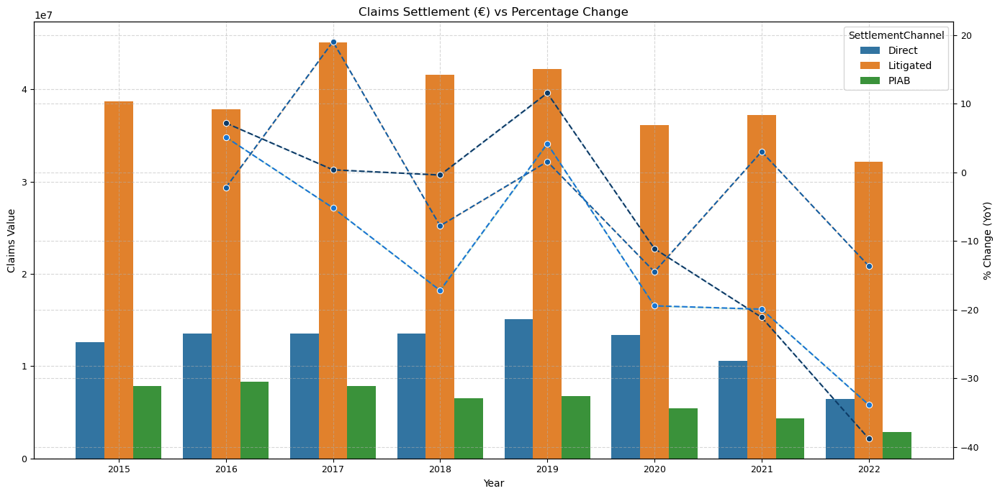

In [599]:
# the percentage change for each settlement channel is going to be added to the graphic to have a better perspective of what's going on
df_cs_merged['SettledYear'] = df_cs_merged['SettledYear'].astype(str)
fig, ax1 = plt.subplots(figsize=(14, 7))
sns.barplot(data=df_cs_merged, x='SettledYear', y='Value', hue='SettlementChannel', errorbar=None, ax=ax1)
ax2 = ax1.twinx()
sns.lineplot(data=df_cs_merged, x='SettledYear', y='PctChange', hue='SettlementChannel', marker='o', linestyle='--', dashes=False, ax=ax2, legend=False,)
ax1.set_title('Claims Settlement (€) vs Percentage Change',)
ax1.set_ylabel('Claims Value')
ax1.tick_params(axis='y')
ax2.set_ylabel('% Change (YoY)')
ax2.tick_params(axis='y')
ax1.set_xlabel('Year')
axes, metrics_report = turf([ax1, ax2], return_metrics=True)
plt.show()

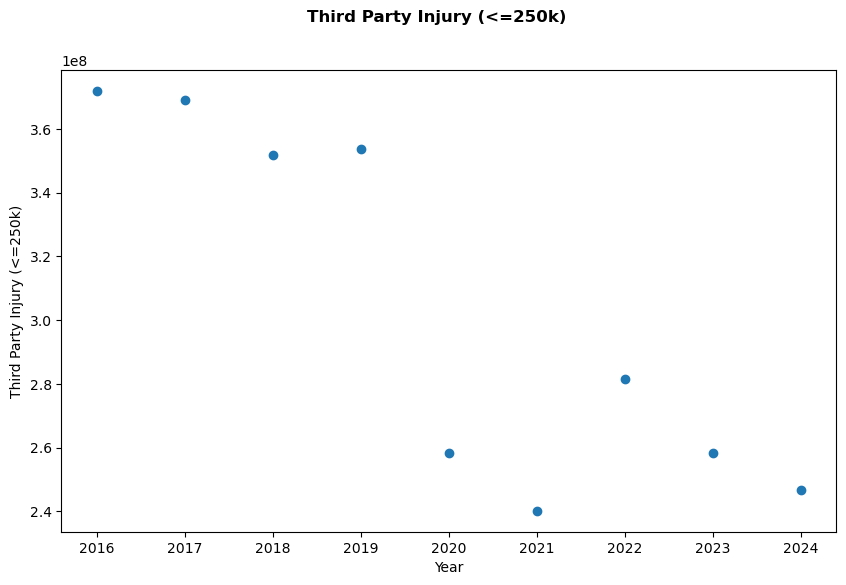

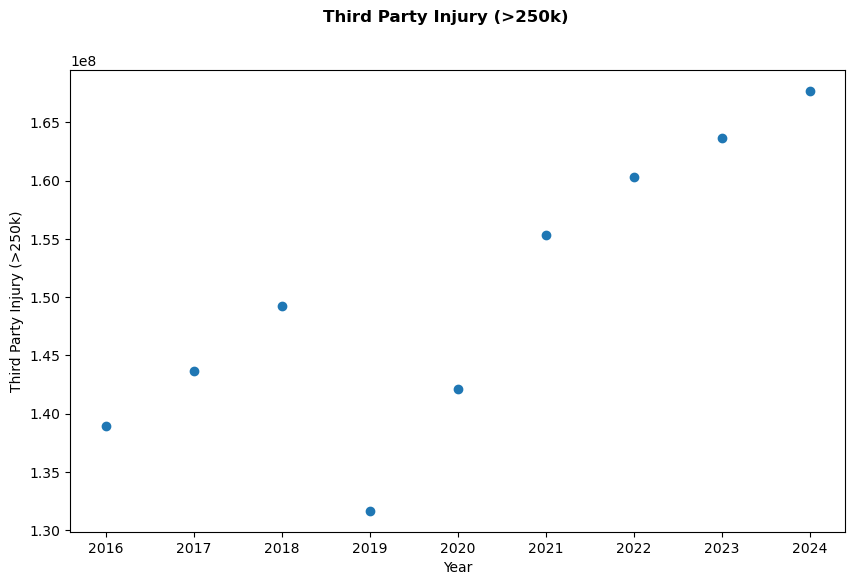

In [600]:
df = df_uc_pivot_features 
cols = ['Third Party Injury (<=250k)', 'Third Party Injury (>250k)']
for i in cols:
    plot_scatter(df, y_col= i)


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : No
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 0
- Has Legend          : Yes
- Legend Needed       : No
- Grid Density        : 16.0
- Data Ink Ratio      : 0.0

--- Subplot 2 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 9.5
- Data Ink Ratio      : 0.0015

--- Subplot 3 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 10.0
- Data Ink Ratio      : 0.0015



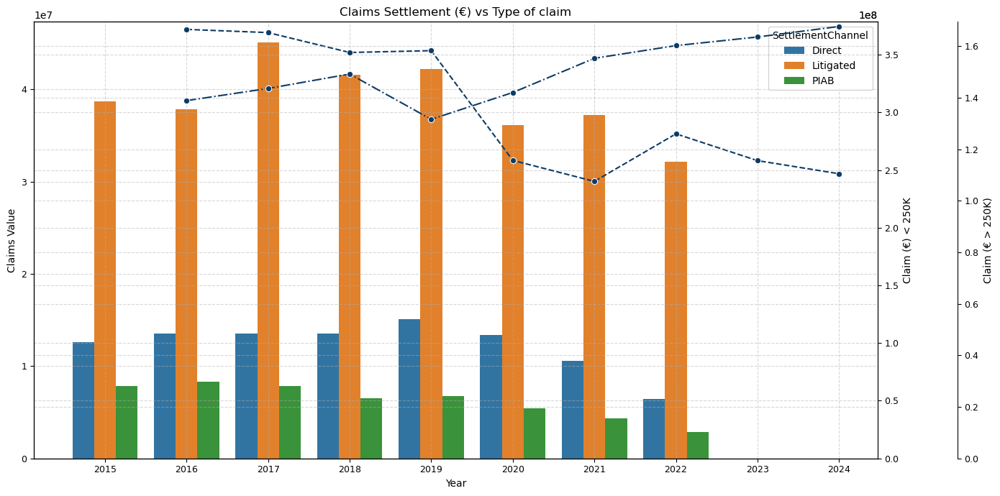

In [601]:
# the percentage change for each settlement channel is going to be added to the graphic to have a better perspective of what's going on
df_uc_pivot_features['Year'] = df_uc_pivot_features['Year'].astype(str)
df_cs_merged['SettledYear'] = df_cs_merged['SettledYear'].astype(str)
fig, ax1 = plt.subplots(figsize=(14, 7))
sns.barplot(data=df_cs_merged, x='SettledYear', y='Value', hue='SettlementChannel', errorbar=None, ax=ax1)
ax2 = ax1.twinx()
sns.lineplot(data=df_uc_pivot_features, x='Year', y='Third Party Injury (<=250k)', marker='o', linestyle='--', dashes=False, ax=ax2, legend=False, color='blue', label='Third Party Injury (<=250k)')
ax3 = ax1.twinx()
ax3.spines['right'].set_position(('outward', 80))
sns.lineplot(data=df_uc_pivot_features, x='Year', y='Third Party Injury (>250k)', palette='magma', marker='o', linestyle='-.', dashes=False, ax=ax3, legend=False, color='yellow', label='Third Party Injury (>250k)' )
ax1.set_title('Claims Settlement (€) vs Type of claim',)
ax1.set_ylabel('Claims Value')
ax1.tick_params(axis='y')
ax2.set_ylabel('Claim (€) < 250K')
ax2.tick_params(axis='y')
ax2.tick_params(axis='y')
ax3.set_ylabel('Claim (€ > 250K)')
ax3.tick_params(axis='y')
ax3.tick_params(axis='y')
ax1.set_xlabel('Year')
axes, metrics_report = turf([ax1, ax2, ax3], return_metrics=True)
plt.show()

PIAB claims and direct claims are downtrending, as well as thirdparty injuries below 250K 
since this might be relevant for the model. we are going to manipulate the data in order to get the features needed for the final dataframe

In [602]:
df_cs_final = (df_cs_merged.pivot_table(index=['SettledYear', 'SettledCostBand'], columns='SettlementChannel', values='Value', aggfunc='sum').reset_index())
df_cs_final.head(20)


SettlementChannel,SettledYear,SettledCostBand,Direct,Litigated,PIAB
0,2015,0 - 10000,12549457.01,1274494.95,867678.33
1,2015,10001 - 15000,19975642.51,4031122.08,4807600.29
2,2015,15001 - 30000,29719728.02,27057062.55,29237563.28
3,2015,30001 - 45000,8816018.99,25795243.39,10703243.68
4,2015,45001 - 60000,4665477.10,20386885.56,3918584.17
5,2015,60001 - 100000,6663040.42,51676620.20,3422024.04
6,2015,>100001,5841958.88,140681937.15,2174029.99
7,2016,0 - 10000,11004433.36,1194577.40,634142.32
8,2016,10001 - 15000,19902288.33,3401505.68,4694114.51
9,2016,15001 - 30000,34950668.04,22286045.80,29907409.05


In [603]:
df_cs_final.columns

Index(['SettledYear', 'SettledCostBand', 'Direct', 'Litigated', 'PIAB'], dtype='object', name='SettlementChannel')

In [604]:
#settlement channel is the index name. it wasn't dropped in the code above
df_cs_final = df_cs_final.rename(columns={'SettledYear': 'Year'})
df_cs_final.head()

SettlementChannel,Year,SettledCostBand,Direct,Litigated,PIAB
0,2015,0 - 10000,12549457.01,1274494.95,867678.33
1,2015,10001 - 15000,19975642.51,4031122.08,4807600.29
2,2015,15001 - 30000,29719728.02,27057062.55,29237563.28
3,2015,30001 - 45000,8816018.99,25795243.39,10703243.68
4,2015,45001 - 60000,4665477.10,20386885.56,3918584.17


Due to the nature of the date, Holt is going to be used to predict missing data from 2023 and 2024

In [605]:
# if the function is executed as it comes, it is going to predict only 2023 and 2024 with NaN bands. a loop must be implemented
all_bands = []
settle_band = df_cs_final['SettledCostBand'].unique().tolist()
cols = ['Direct', 'Litigated', 'PIAB']
for band in settle_band:
    #assign data to subset
    df_band_cs = df_cs_final[df_cs_final['SettledCostBand'] == band].sort_values('Year')
    df_numeric = df_band_cs[cols]
    forecast = holt_forecast(df_numeric, cols)
    forecast['SettledCostBand'] = band
    forecast['Year'] = [2023, 2024]
    all_bands.append(forecast)
df_forecast_cs = pd.concat(all_bands, ignore_index=True)
df_forecast_cs = df_forecast_cs[['Year', 'SettledCostBand'] + cols]
df_forecast_cs

,Year,SettledCostBand,Direct,Litigated,PIAB
0,2023,0 - 10000,8133378.84,692537.51,2140731.60
1,2024,0 - 10000,7774558.05,638560.10,2335210.09
2,2023,10001 - 15000,6166829.79,1971986.89,2974148.40
3,2024,10001 - 15000,4573088.63,1727690.03,2851276.94
4,2023,15001 - 30000,12466787.71,8144733.94,5902879.71
5,2024,15001 - 30000,9647886.84,5654088.44,3174730.54
6,2023,30001 - 45000,7602041.21,19831540.02,1767893.53
7,2024,30001 - 45000,6938209.56,18747614.60,717973.01
8,2023,45001 - 60000,3515055.64,19497099.42,1421254.05
9,2024,45001 - 60000,3148943.95,19009659.69,1132190.93


In [606]:
df_forecast_cs = df_forecast_cs.sort_values('Year')
df_forecast_cs

,Year,SettledCostBand,Direct,Litigated,PIAB
0,2023,0 - 10000,8133378.84,692537.51,2140731.60
2,2023,10001 - 15000,6166829.79,1971986.89,2974148.40
6,2023,30001 - 45000,7602041.21,19831540.02,1767893.53
4,2023,15001 - 30000,12466787.71,8144733.94,5902879.71
10,2023,60001 - 100000,4148623.16,34150335.23,2114914.79
12,2023,>100001,2635938.19,136702208.82,1281548.71
8,2023,45001 - 60000,3515055.64,19497099.42,1421254.05
3,2024,10001 - 15000,4573088.63,1727690.03,2851276.94
7,2024,30001 - 45000,6938209.56,18747614.60,717973.01
5,2024,15001 - 30000,9647886.84,5654088.44,3174730.54


In [607]:
df_cs_pivot_features = pd.concat([df_cs_final, df_forecast_cs], ignore_index=True)
df_cs_pivot_features.tail()

,Year,SettledCostBand,Direct,Litigated,PIAB
65,2024,15001 - 30000,9647886.84,5654088.44,3174730.54
66,2024,0 - 10000,7774558.05,638560.10,2335210.09
67,2024,45001 - 60000,3148943.95,19009659.69,1132190.93
68,2024,60001 - 100000,3595104.72,31932224.58,1905966.63
69,2024,>100001,2106128.61,133716019.71,1138142.19


In [608]:
df_cs_final.shape

(56, 5)

In [609]:
df_forecast_cs.shape

(14, 5)

In [610]:
df_cs_pivot_features['Year'] = df_cs_pivot_features['Year'].astype('int64')
df_cs_pivot_features = df_cs_pivot_features[df_cs_pivot_features['Year'] > 2015]
df_cs_pivot_features

,Year,SettledCostBand,Direct,Litigated,PIAB
7,2016,0 - 10000,11004433.36,1194577.40,634142.32
8,2016,10001 - 15000,19902288.33,3401505.68,4694114.51
9,2016,15001 - 30000,34950668.04,22286045.80,29907409.05
10,2016,30001 - 45000,11129671.63,28973673.48,11713886.06
11,2016,45001 - 60000,6033313.24,22979495.40,4092672.45
...,...,...,...,...,...
65,2024,15001 - 30000,9647886.84,5654088.44,3174730.54
66,2024,0 - 10000,7774558.05,638560.10,2335210.09
67,2024,45001 - 60000,3148943.95,19009659.69,1132190.93
68,2024,60001 - 100000,3595104.72,31932224.58,1905966.63


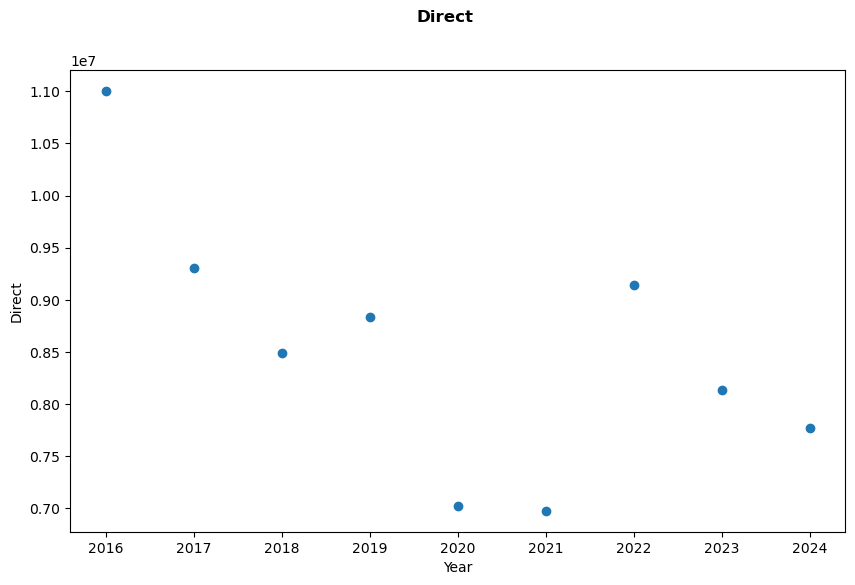

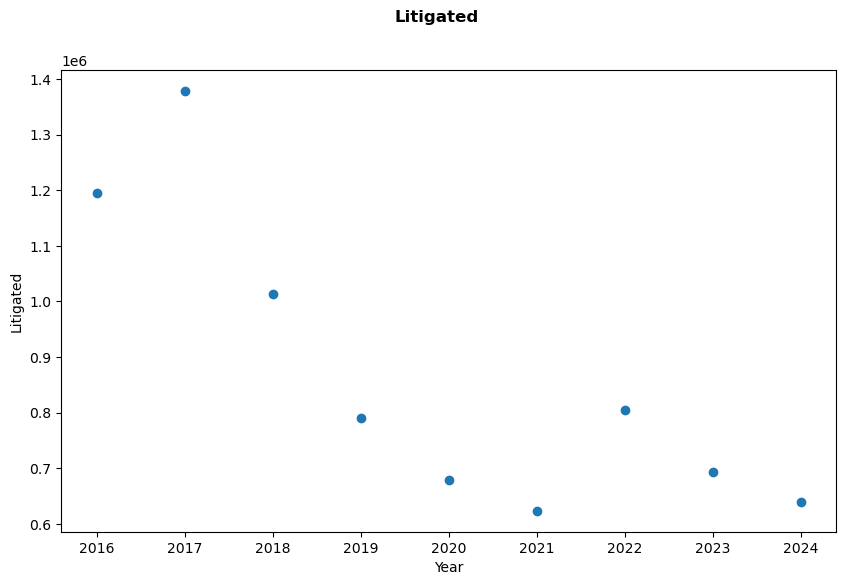

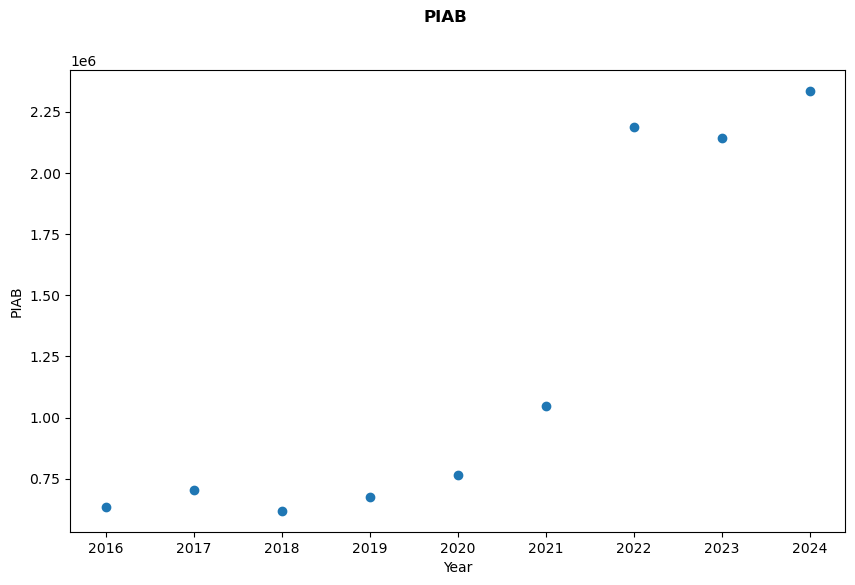

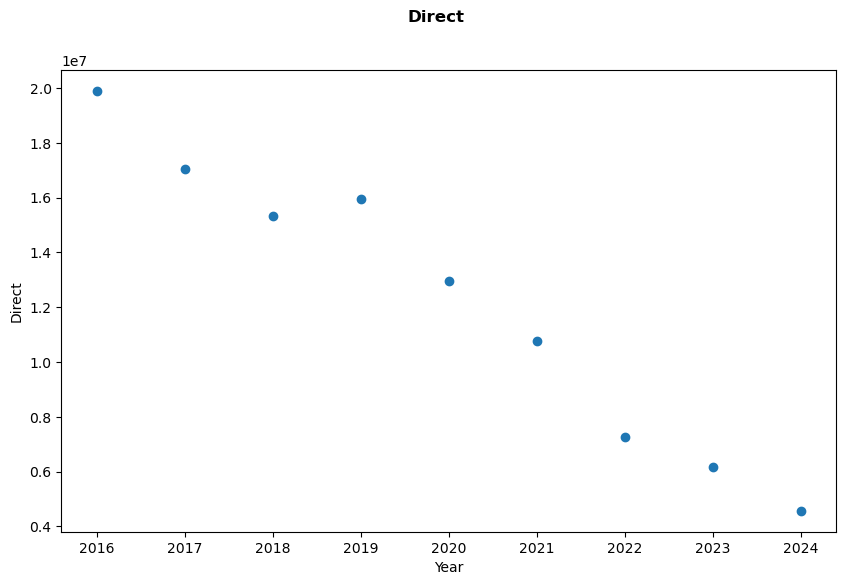

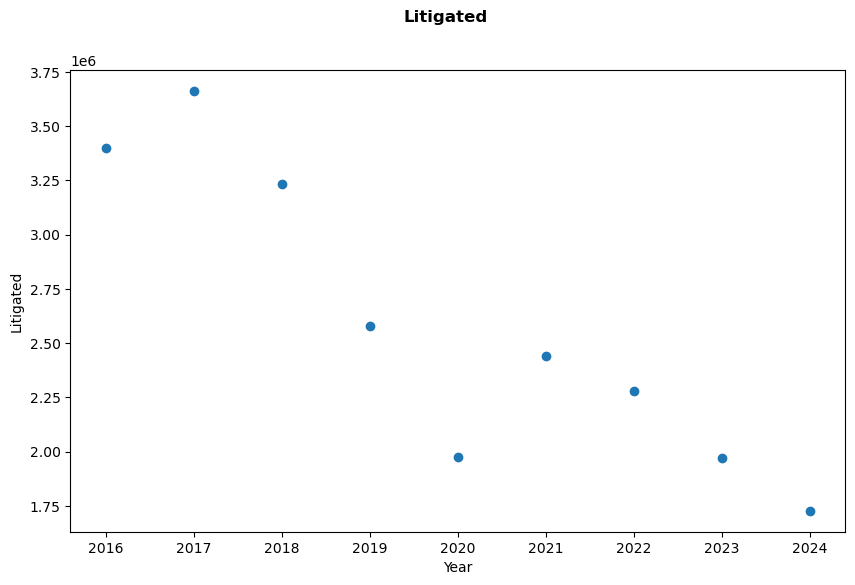

...

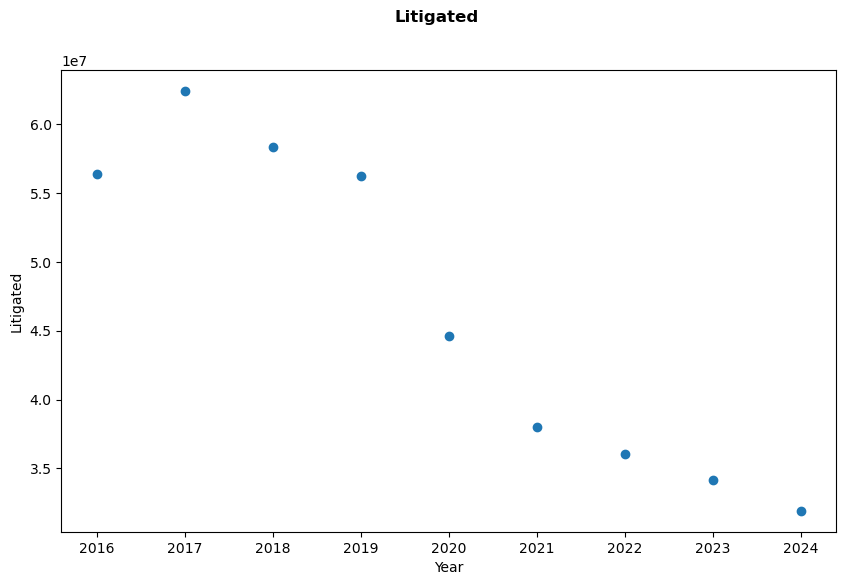

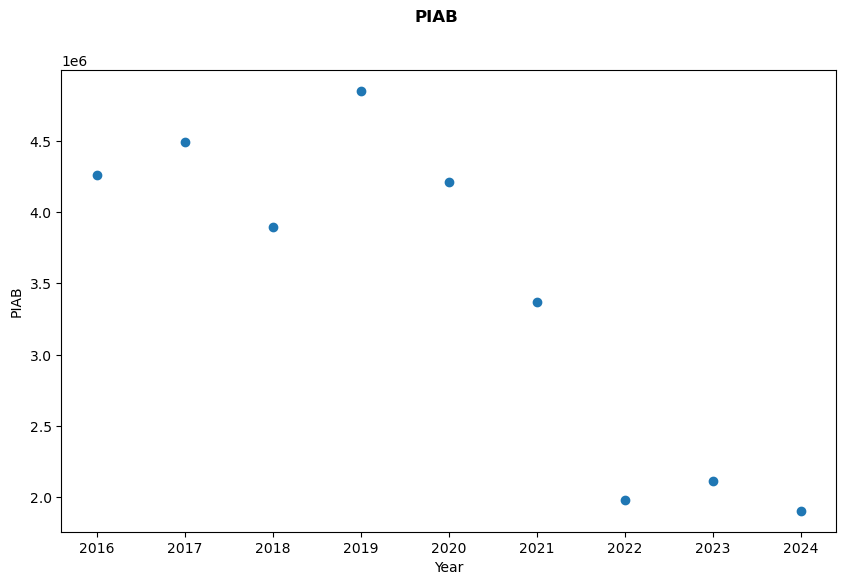

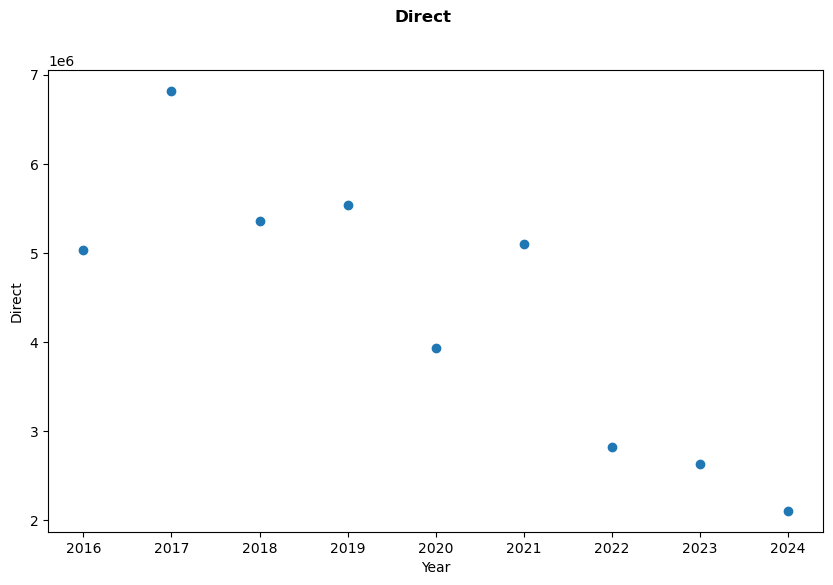

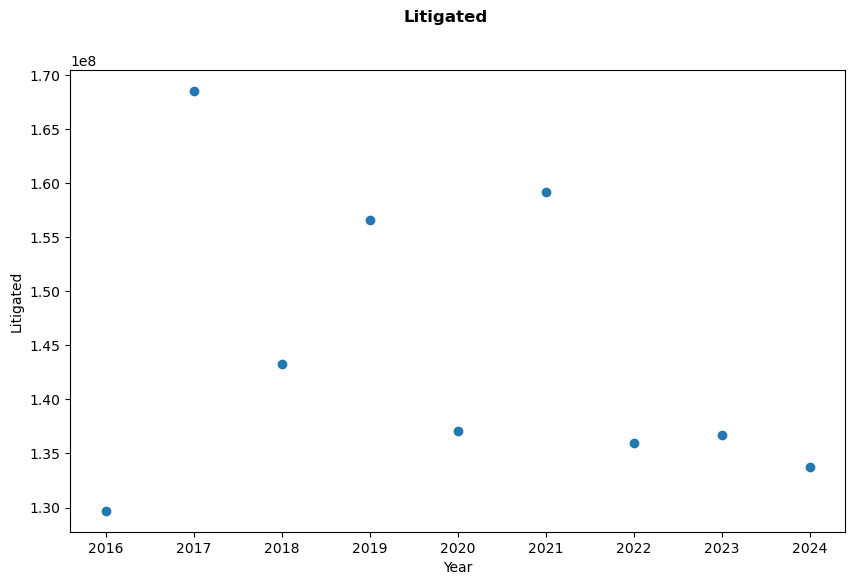

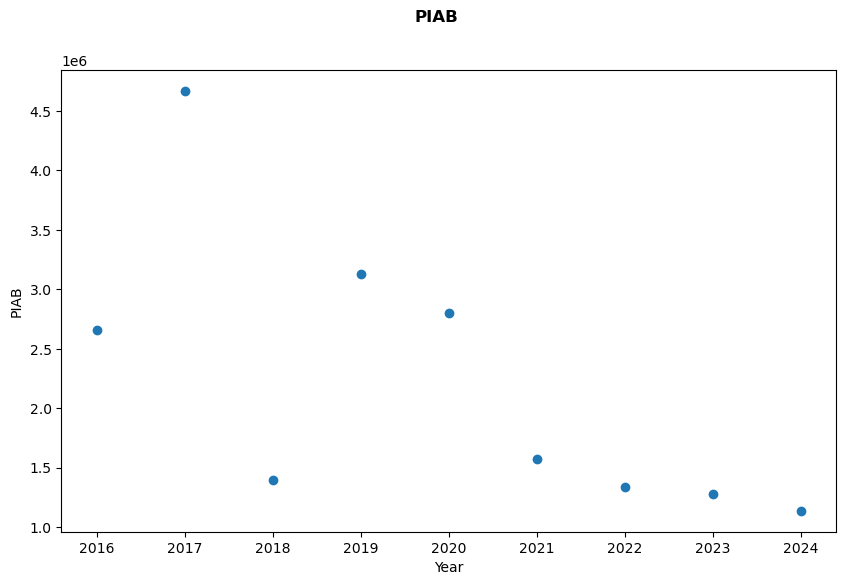

In [611]:
df = df_cs_pivot_features
y = ['Direct', 'Litigated', 'PIAB']
bands = df_cs_pivot_features['SettledCostBand'].unique().tolist()
year = 'Year'
for band in bands:
    df = df_cs_pivot_features[df_cs_pivot_features['SettledCostBand'] == band].sort_values('Year')
    for j in y:
        plot_scatter(df, x_col= 'Year', y_col=j)
    
    

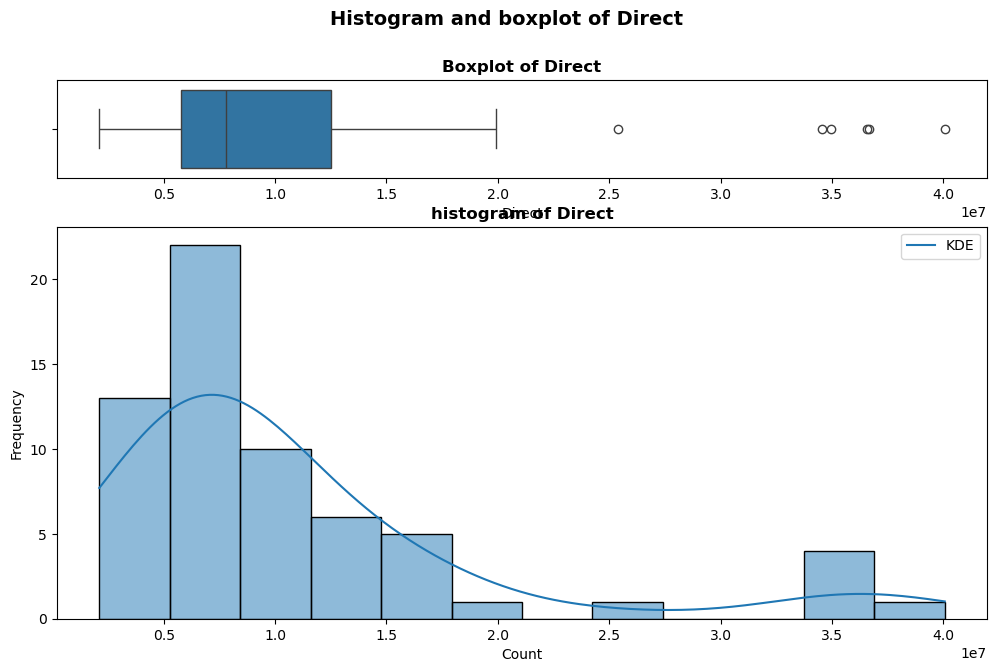

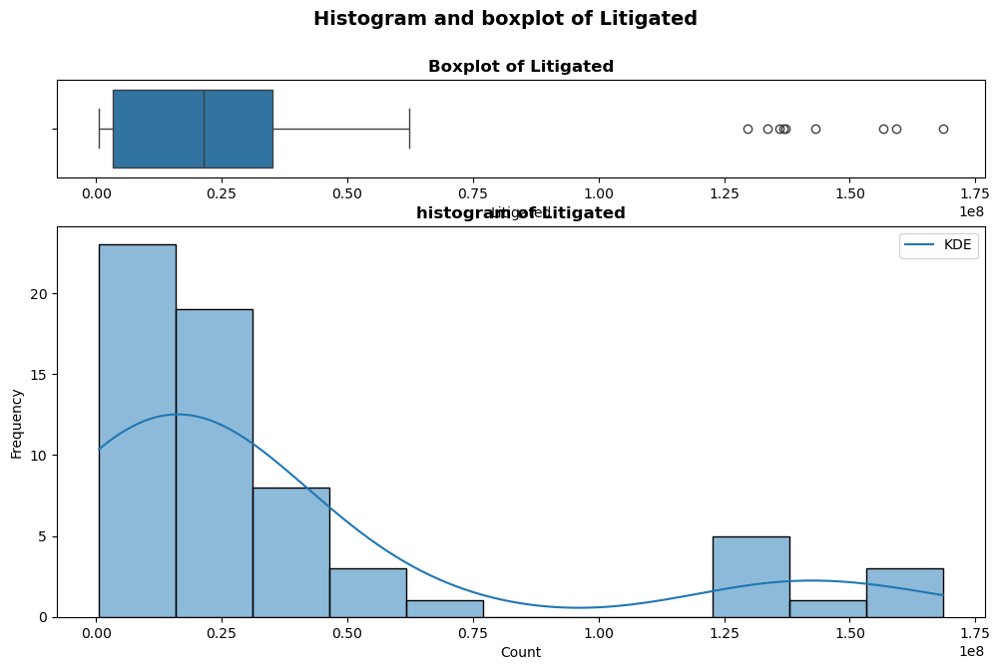

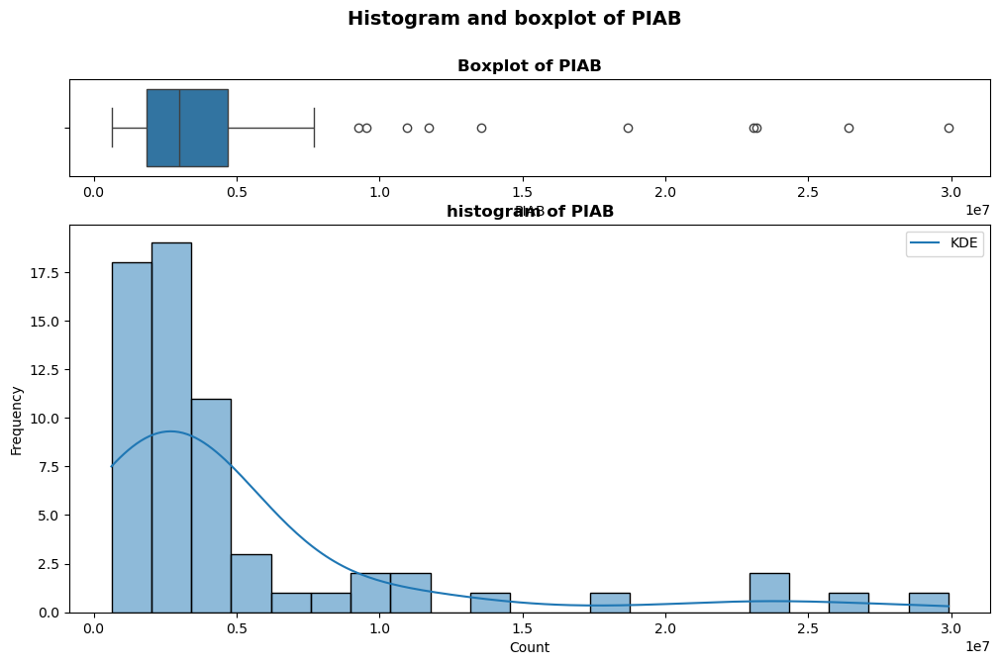

In [612]:
df = df_cs_pivot_features
y = ['Direct', 'Litigated', 'PIAB']
year = 'Year'
for j in y:
    plot_histo(df, x_col= 'Year', y_col=j)

In [613]:
df = df_cs_pivot_features
y = ['Direct', 'Litigated', 'PIAB']
year = 'Year'
for j in y:
    print(f'\n=== Distribution Fit Results for {j} ===')
    result = dist_type(df, y_col=j)
    #print is going to print <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001EF55E97530>, use display instead
    display(result.head(10))


=== Distribution Fit Results for Direct ===


,Distribution,AIC,KS_stat,KS_p,Params
3,beta,2135.52,0.15,0.12,"(0.6222240241894073, 2.227983345727699, 210612..."
4,lognorm,2142.81,0.08,0.82,"(0.8031407208466561, 1219497.6420523962, 69835..."
1,expon,2144.31,0.11,0.41,"(2106128.612314295, 8768039.355077134)"
2,gamma,2145.32,0.10,0.56,"(1.236020955542521, 2059449.8594318903, 713152..."
8,genlogistic,2160.31,0.15,0.13,"(1394.759298613616, -28213765.11633569, 493147..."
10,laplace,2170.57,0.18,0.03,"(7774558.0451719295, 5399512.426526818)"
9,logistic,2182.64,0.15,0.11,"(9193252.951100567, 4062987.883322112)"
0,norm,2197.24,0.21,0.01,"(10874167.96739143, 8777612.771435168)"
5,uniform,2202.95,0.50,0.00,"(2106128.612314295, 37958310.5276857)"
6,t,2254.08,0.58,0.00,"(4.876158865080328, -24300.669435477237, 10939..."



=== Distribution Fit Results for Litigated ===


,Distribution,AIC,KS_stat,KS_p,Params
3,beta,2245.85,0.17,0.04,"(0.24015126686311392, 0.7776564195961624, 6237..."
2,gamma,2281.16,0.31,0.00,"(0.4878875159018663, 623738.5699999998, 386103..."
4,lognorm,2318.84,0.23,0.00,"(2.0593456562442856, 563377.0129839969, 110127..."
1,expon,2323.88,0.21,0.01,"(623738.57, 36460854.449054584)"
8,genlogistic,2372.43,0.17,0.05,"(2156.549077658402, -180092461.325701, 2588604..."
10,laplace,2382.81,0.24,0.00,"(21436328.17, 29101721.523977034)"
5,uniform,2390.30,0.56,0.00,"(623738.57, 167903877.13001)"
9,logistic,2398.04,0.23,0.00,"(27104283.311642434, 22415125.49241048)"
0,norm,2407.91,0.27,0.00,"(37084593.019054584, 46720687.80231986)"
6,t,2413.61,0.51,0.00,"(1.414301094326902, -49265.21626300506, 220993..."



=== Distribution Fit Results for PIAB ===


,Distribution,AIC,KS_stat,KS_p,Params
2,gamma,2031.49,0.17,0.05,"(0.5006959084746446, 619099.8699999999, 820082..."
3,beta,2051.49,0.23,0.00,"(0.6266402406946672, 336.60280010758436, 61909..."
4,lognorm,2059.35,0.09,0.67,"(1.1556686319917628, 425821.41771886527, 25025..."
1,expon,2061.69,0.17,0.04,"(619099.87, 4550963.331445622)"
8,genlogistic,2104.27,0.19,0.02,"(2338.9611383051206, -20205519.969213188, 2984..."
10,laplace,2111.90,0.25,0.00,"(2974148.396617653, 3389674.7546009496)"
9,logistic,2132.94,0.23,0.00,"(3799551.880715934, 2632592.6252705725)"
0,norm,2155.45,0.30,0.00,"(5170063.201445622, 6299893.86797212)"
6,t,2160.10,0.56,0.00,"(1.8990155596021507, -6110.277766045447, 36297..."
5,uniform,2170.28,0.63,0.00,"(619099.87, 29288309.18)"


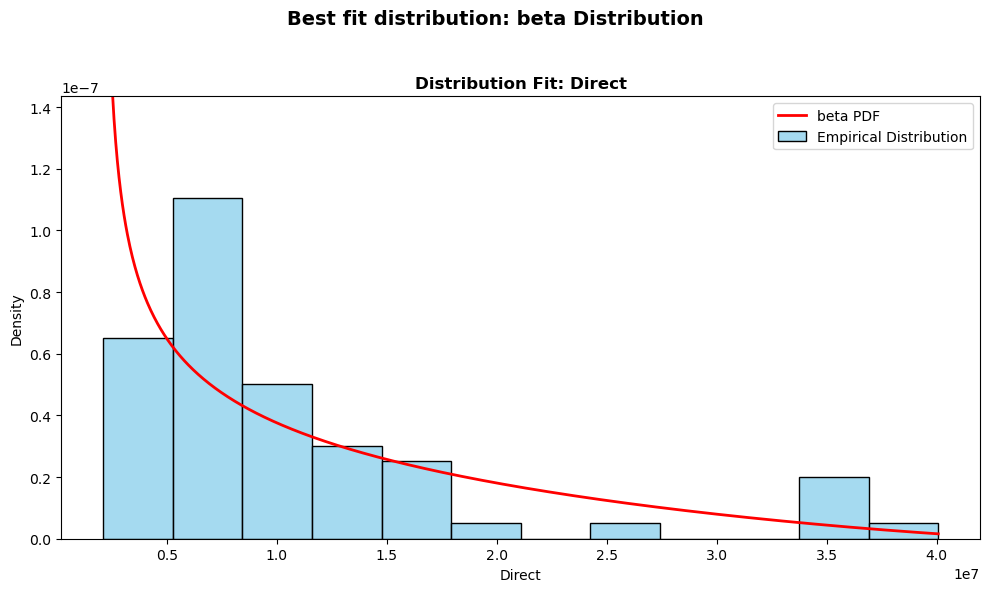

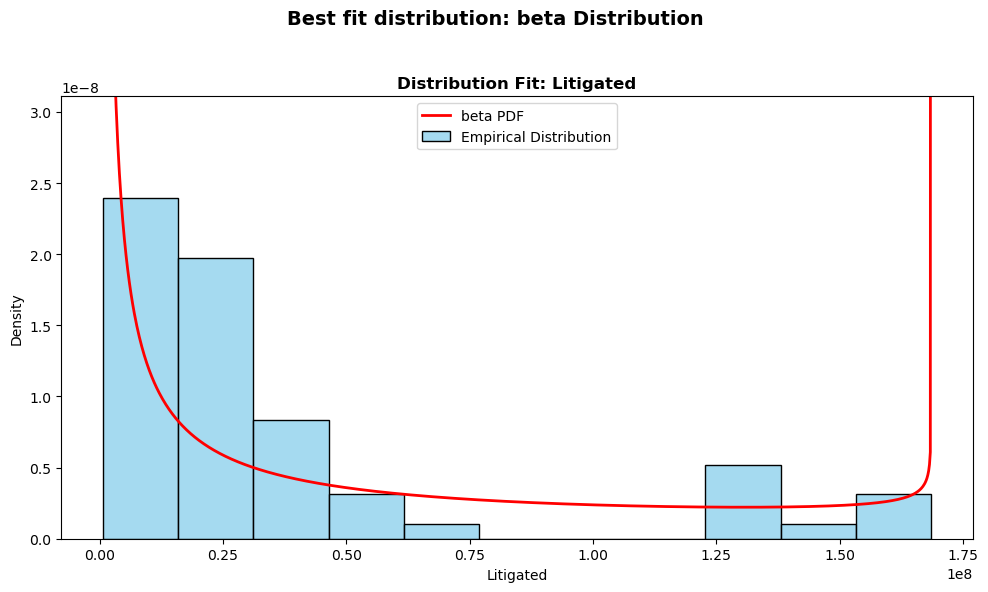

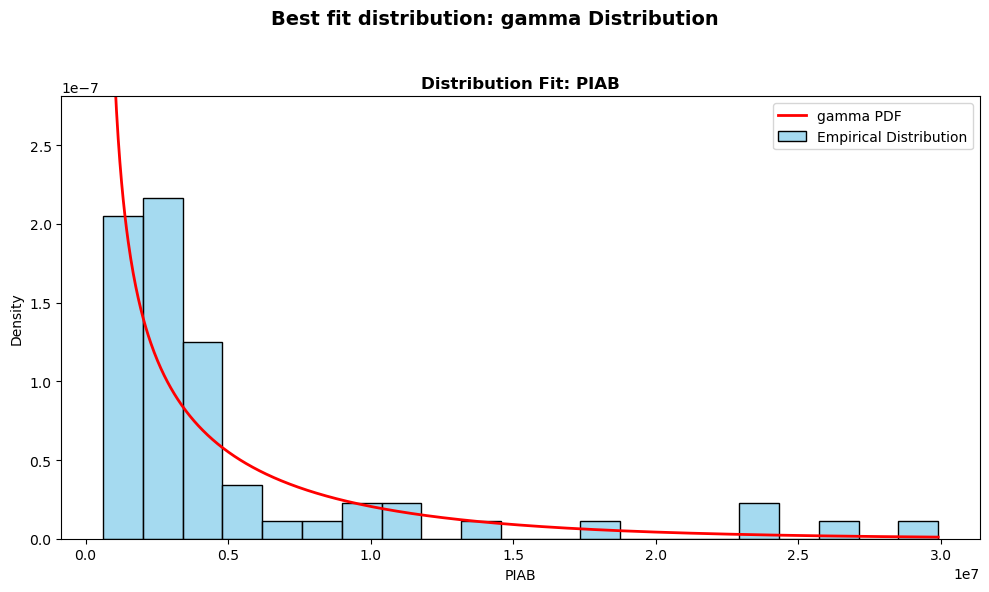

In [614]:
df = df_cs_pivot_features
y = ['Direct', 'Litigated', 'PIAB']
for j in y:
    plot_best_dist(df, y_col= j)

to match the subject of study dataframe, this dataframe is going to be pivoted in order to get the same data df structure

In [615]:
df_cs_pivot_features
df_cs_pivot_features_final = (df_cs_pivot_features.pivot_table(index='Year', columns=['SettledCostBand'], values=['Direct', 'Litigated', 'PIAB'], aggfunc='sum').reset_index())
df_cs_pivot_features_final

Year      Direct                                            \
SettledCostBand         0 - 10000 10001 - 15000 15001 - 30000 30001 - 45000   
0                2016 11004433.36   19902288.33   34950668.04   11129671.63   
1                2017  9309516.86   17033164.86   34531953.64   12548677.84   
2                2018  8488453.94   15333433.05   36682607.61   13721520.34   
3                2019  8838411.55   15965012.50   40064439.14   17004023.85   
4                2020  7019459.02   12951653.31   36560808.57   16860337.59   
5                2021  6978455.45   10763745.91   25379284.57   13617967.90   
6                2022  9139722.74    7246152.25   12165006.47    6490721.82   
7                2023  8133378.84    6166829.79   12466787.71    7602041.21   
8                2024  7774558.05    4573088.63    9647886.84    6938209.56   

                                                         Litigated  \
SettledCostBand 45001 - 60000 60001 - 100000    >100001  0 - 10000   
0                  6033313.24     6528660.38 5031867.41 1194577.40   
1                  7100195.01     7593285.45 6819329.84 1378849.19   
2                  7349166.18     7641627.08 5353316.86 1014222.45   
3                  8093327.30     9999137.15 5532286.60  789728.60   
4                  7988065.89     8458266.06 3935448.64  678567.45   
5                  6664845.09     5470245.49 5101554.36  623738.57   
6                  2993134.70     4425986.70 2825355.47  805641.98   
7                  3515055.64     4148623.16 2635938.19  692537.51   
8                  3148943.95     3595104.72 2106128.61  638560.10   

                               ...                                            \
SettledCostBand 10001 - 15000  ... 45001 - 60000 60001 - 100000      >100001   
0                  3401505.68  ...   22979495.40    56357572.33 129702176.67   
1                  3663208.82  ...   25386624.55    62420394.12 168527615.70   
2                  3234945.85  ...   29375952.14    58329174.82 143229835.87   
3                  2577306.80  ...   27091516.76    56219803.97 156623134.35   
4                  1977237.84  ...   24909383.96    44588791.35 137101303.84   
5                  2440807.32  ...   23103078.14    38013864.08 159198048.57   
6                  2280416.33  ...   18941148.95    36031101.90 136003344.04   
7                  1971986.89  ...   19497099.42    34150335.23 136702208.82   
8                  1727690.03  ...   19009659.69    31932224.58 133716019.71   

                      PIAB                                            \
SettledCostBand  0 - 10000 10001 - 15000 15001 - 30000 30001 - 45000   
0                634142.32    4694114.51   29907409.05   11713886.06   
1                704985.63    3727100.45   26418833.63   10967412.31   
2                619099.87    3010264.65   23203473.85    9547363.01   
3                673665.84    3549900.61   23081000.71    9250335.83   
4                766296.90    2721476.12   18685512.34    6621599.05   
5               1048889.77    2948511.14   13566149.11    5404586.18   
6               2186120.69    3210311.40    7711265.97    2272077.95   
7               2140731.60    2974148.40    5902879.71    1767893.53   
8               2335210.09    2851276.94    3174730.54     717973.01   

                                                         
SettledCostBand 45001 - 60000 60001 - 100000    >100001  
0                  4092672.45     4261125.82 2659150.05  
1                  3983826.42     4495165.69 4668915.58  
2                  3838584.58     3893203.33 1398370.67  
3                  2873159.36     4851463.76 3131667.40  
4                  2389131.50     4208342.12 2801810.58  
5                  2670470.18     3371575.29 1571771.14  
6                  1529690.86     1983889.36 1335349.49  
7                  1421254.05     2114914.79 1281548.71  
8                  1132190.93     1905966.63 1138142.19  

[9 rows x 22 columns]

In [616]:
#renaming columns
index_cols = df_cs_pivot_features_final.columns[1:]
new_names = ['Year'] + [f'{col[0]}_{col[1]}'.replace(' ', '').replace('-', '_')for col in index_cols]
df_cs_pivot_features_final.columns = new_names
df_cs_pivot_features_final

,Year,Direct_0_10000,Direct_10001_15000,Direct_15001_30000,Direct_30001_45000,Direct_45001_60000,Direct_60001_100000,Direct_>100001,Litigated_0_10000,Litigated_10001_15000,...,Litigated_45001_60000,Litigated_60001_100000,Litigated_>100001,PIAB_0_10000,PIAB_10001_15000,PIAB_15001_30000,PIAB_30001_45000,PIAB_45001_60000,PIAB_60001_100000,PIAB_>100001
0,2016,11004433.36,19902288.33,34950668.04,11129671.63,6033313.24,6528660.38,5031867.41,1194577.40,3401505.68,...,22979495.40,56357572.33,129702176.67,634142.32,4694114.51,29907409.05,11713886.06,4092672.45,4261125.82,2659150.05
1,2017,9309516.86,17033164.86,34531953.64,12548677.84,7100195.01,7593285.45,6819329.84,1378849.19,3663208.82,...,25386624.55,62420394.12,168527615.70,704985.63,3727100.45,26418833.63,10967412.31,3983826.42,4495165.69,4668915.58
2,2018,8488453.94,15333433.05,36682607.61,13721520.34,7349166.18,7641627.08,5353316.86,1014222.45,3234945.85,...,29375952.14,58329174.82,143229835.87,619099.87,3010264.65,23203473.85,9547363.01,3838584.58,3893203.33,1398370.67
3,2019,8838411.55,15965012.50,40064439.14,17004023.85,8093327.30,9999137.15,5532286.60,789728.60,2577306.80,...,27091516.76,56219803.97,156623134.35,673665.84,3549900.61,23081000.71,9250335.83,2873159.36,4851463.76,3131667.40
4,2020,7019459.02,12951653.31,36560808.57,16860337.59,7988065.89,8458266.06,3935448.64,678567.45,1977237.84,...,24909383.96,44588791.35,137101303.84,766296.90,2721476.12,18685512.34,6621599.05,2389131.50,4208342.12,2801810.58
5,2021,6978455.45,10763745.91,25379284.57,13617967.90,6664845.09,5470245.49,5101554.36,623738.57,2440807.32,...,23103078.14,38013864.08,159198048.57,1048889.77,2948511.14,13566149.11,5404586.18,2670470.18,3371575.29,1571771.14
6,2022,9139722.74,7246152.25,12165006.47,6490721.82,2993134.70,4425986.70,2825355.47,805641.98,2280416.33,...,18941148.95,36031101.90,136003344.04,2186120.69,3210311.40,7711265.97,2272077.95,1529690.86,1983889.36,1335349.49
7,2023,8133378.84,6166829.79,12466787.71,7602041.21,3515055.64,4148623.16,2635938.19,692537.51,1971986.89,...,19497099.42,34150335.23,136702208.82,2140731.60,2974148.40,5902879.71,1767893.53,1421254.05,2114914.79,1281548.71
8,2024,7774558.05,4573088.63,9647886.84,6938209.56,3148943.95,3595104.72,2106128.61,638560.10,1727690.03,...,19009659.69,31932224.58,133716019.71,2335210.09,2851276.94,3174730.54,717973.01,1132190.93,1905966.63,1138142.19


**weather dataframe**

In [617]:
weather_features = pd.read_csv('https://docs.google.com/spreadsheets/d/e/2PACX-1vQ23e0zqiqLInfDSND5z_QcqPgspB0Uw5gStnjlT_zsc3kzb_1Pk5ntII1dd0Ef_HNGPKA9v9tIELhp/pub?output=csv')
weather_features.head()

,Date,day of the year,tp_wmean,tp_min,tp_max,tp_std,tp_median,tp_range,tcc_wmean,tcc_min,tcc_max,tcc_std,tcc_median,tcc_range,sf_wmean,sf_min,sf_max,sf_std,sf_median,sf_range
0,01/01/1980,1,0.74,0.03,1.38,0.60,0.81,1.34,0.92,0.85,0.99,0.07,0.92,0.14,0.00,0.00,0.00,0.00,0.00,0.00
1,02/01/1980,2,0.58,0.28,0.79,0.23,0.63,0.51,0.97,0.89,1.00,0.05,1.00,0.11,0.00,0.00,0.00,0.00,0.00,0.00
2,31/12/1979,365,0.36,0.00,0.72,0.36,0.33,0.72,0.77,0.56,0.90,0.17,0.79,0.34,0.00,0.00,0.00,0.00,0.00,0.00
3,03/01/1980,3,0.41,0.13,0.68,0.23,0.41,0.55,0.67,0.57,0.75,0.07,0.68,0.18,0.00,0.00,0.00,0.00,0.00,0.00
4,04/01/1980,4,0.19,0.03,0.59,0.26,0.08,0.55,0.66,0.56,0.79,0.11,0.66,0.23,0.00,0.00,0.00,0.00,0.00,0.00


In [618]:
weather_features.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16438 entries, 0 to 16437
Data columns (total 20 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Date             16438 non-null  object 
 1   day of the year  16438 non-null  int64  
 2   tp_wmean         16438 non-null  float64
 3   tp_min           16438 non-null  float64
 4   tp_max           16438 non-null  float64
 5   tp_std           16438 non-null  float64
 6   tp_median        16438 non-null  float64
 7   tp_range         16438 non-null  float64
 8   tcc_wmean        16438 non-null  float64
 9   tcc_min          16438 non-null  float64
 10  tcc_max          16438 non-null  float64
 11  tcc_std          16438 non-null  float64
 12  tcc_median       16438 non-null  float64
 13  tcc_range        16438 non-null  float64
 14  sf_wmean         16438 non-null  float64
 15  sf_min           16438 non-null  float64
 16  sf_max           16438 non-null  float64
 17  sf_std      

as analyzed in the previous stage and confirmed with info we have no missing data and NaN values for this dataset. Dates analyzed are form 01/01/1980 to 31/12/2024. 
1. Based on NOAA and Met Eireann guidelines, due to the objetive of this dataframe, which is identify anomalies on rain and snow conditions, the baseline is going to 1990 to 2010. The previous paradigm of using 1980-2000 is frequently used but for other type of weather analysis.


In [619]:
weather_features['Date'] = pd.to_datetime(weather_features['Date'],format='%d/%m/%Y')
start_date = '1990-01-01'
end_date = '2011-01-01'
#creation of boolean mask
baseline_mask = (weather_features['Date'] >= start_date) & (weather_features['Date'] < end_date)
weather_features_baseline = weather_features[baseline_mask].copy()
weather_features_baseline

,Date,day of the year,tp_wmean,tp_min,tp_max,tp_std,tp_median,tp_range,tcc_wmean,tcc_min,tcc_max,tcc_std,tcc_median,tcc_range,sf_wmean,sf_min,sf_max,sf_std,sf_median,sf_range
3654,1990-01-01,1,0.92,0.26,1.59,0.62,0.89,1.33,0.76,0.63,0.99,0.17,0.71,0.37,0.00,0.00,0.00,0.00,0.00,0.00
3655,1990-01-02,2,0.14,0.07,0.22,0.06,0.15,0.15,0.64,0.50,0.78,0.16,0.64,0.28,0.00,0.00,0.00,0.00,0.00,0.00
3656,1990-01-03,3,0.33,0.04,0.51,0.20,0.39,0.46,0.81,0.67,0.98,0.14,0.82,0.30,0.00,0.00,0.00,0.00,0.00,0.00
3657,1990-01-05,5,0.26,0.03,0.74,0.33,0.13,0.72,0.55,0.46,0.68,0.09,0.53,0.22,0.00,0.00,0.00,0.00,0.00,0.00
3658,1990-01-06,6,0.62,0.26,1.11,0.38,0.55,0.85,0.75,0.60,0.85,0.12,0.76,0.26,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11319,2010-12-28,362,0.22,0.08,0.39,0.13,0.21,0.30,0.92,0.72,1.00,0.13,0.98,0.27,0.00,0.00,0.00,0.00,0.00,0.00
11320,2010-12-29,363,0.10,0.02,0.28,0.12,0.05,0.26,0.95,0.90,1.00,0.04,0.94,0.10,0.00,0.00,0.00,0.00,0.00,0.00
11321,2010-12-21,355,0.08,0.01,0.18,0.07,0.07,0.18,0.46,0.17,0.68,0.26,0.50,0.51,0.01,0.00,0.02,0.01,0.00,0.02
11322,2010-12-30,364,0.10,0.06,0.14,0.04,0.10,0.08,0.98,0.97,1.00,0.01,0.98,0.03,0.00,0.00,0.00,0.00,0.00,0.00



TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 4
- Has Legend          : Yes
- Legend Needed       : Yes
- Grid Density        : 2.6
- Data Ink Ratio      : 0.1914


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 4
- Has Legend          : Yes
- Legend Needed       : Yes
- Grid Density        : 2.2
- Data Ink Ratio      : 0.1332


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 4
- Has Legend          : Yes
- Legend Needed       : Yes
- Grid Density        : 2.4
- Data Ink Ratio      : 0.1375



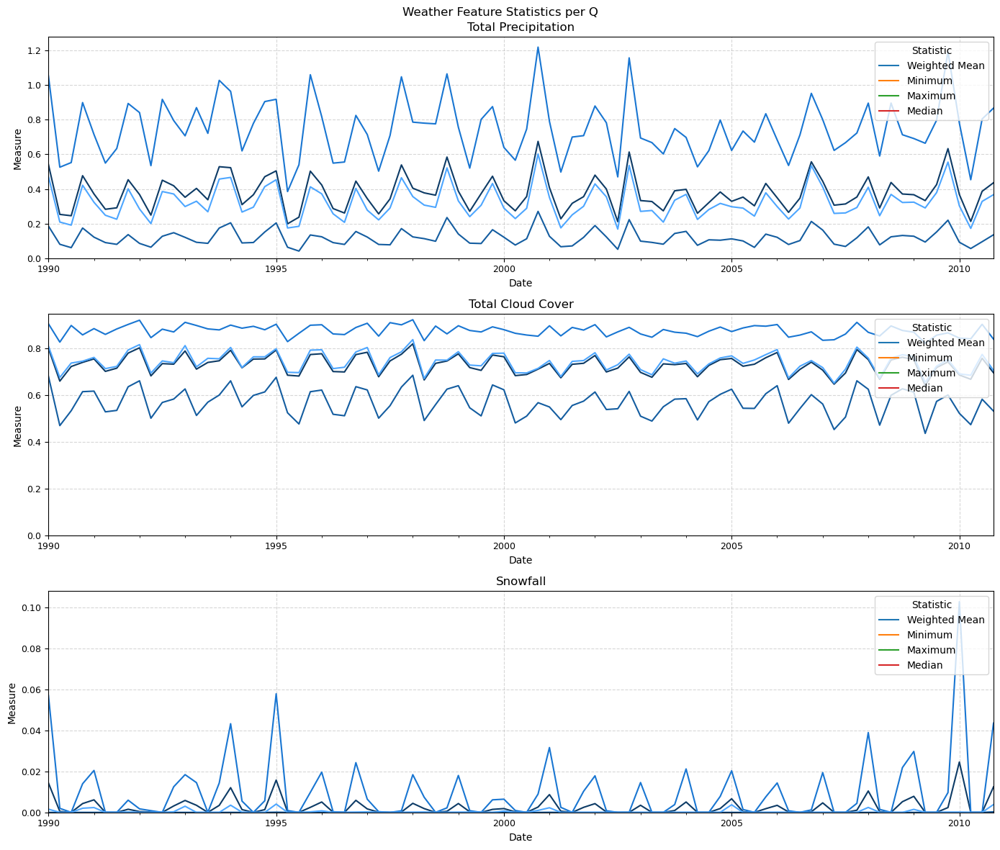

In [620]:
#ploting data
#due to the amount of data, the line plot overlaps and is not visualized as needed. it is needed to use resample to adress this
#to use resample Date must be the index
weather_features_1 = weather_features_baseline.set_index('Date')
weather_features_q = weather_features_1.resample('Q').mean()
x_axis = weather_features_q.index
plot_subset = {'Total Precipitation': ['tp_wmean', 'tp_min', 'tp_max', 'tp_median'], 'Total Cloud Cover': ['tcc_wmean', 'tcc_min', 'tcc_max', 'tcc_median'], 'Snowfall': ['sf_wmean', 'sf_min', 'sf_max', 'sf_median']}
fig, axes = plt.subplots(3, 1, figsize=(14, 12))
fig.suptitle('Weather Feature Statistics per Q')
# to avoid the title issues It has been seen in previous chart (that are going to fix by the end of the project) the zip builtin can be used to adress this situtation
for ax, (title, columns) in zip(axes, plot_subset.items()):
    weather_features_q.plot(y=columns, ax=ax, kind='line')
    ax.set_title(title)
    ax.set_ylabel('Measure')
    ax.legend(['Weighted Mean', 'Minimum', 'Maximum', 'Median'], title='Statistic', loc='upper right')
    axes, metrics_report = turf(ax, return_metrics=True)
plt.show()

it can be noticed many seasonalities, which makes sence based on how the season of the year impact the amount of precipitation. For snow it can be noticed a stagering increase in the max amount of snow produced by winter storms from Siberia (The beast from the east) and in 2018 another spike is going to be noticed! 

at a glance there's no change of trends on the graphics. just statistical noice produced by weather anomalies. in the statistic section I charts are going to be used to identify if this analysis is correct

to define if the median or the mean is going to be used as a baseline parameter, test normality is going to be performed using D’Agostino’s K² due to the size of the time series

In [621]:
from scipy.stats import normaltest
stats = ['tp_wmean', 'tcc_wmean', 'sf_wmean']
results = []
for i in stats:
    stat, p = normaltest(weather_features_baseline[i])
    if p < 0.05:
        f_stat = 'Median'
    else:
        f_stat = 'Mean'
    results.append(f_stat)
results

['Median', 'Median', 'Median']

as denoted by normal test... the baseline for this study is going to be the Median

In [622]:
medians = ['tp_median', 'tcc_median', 'sf_median']
baseline_stats ={}
for i in medians:
    base_line = weather_features_baseline[i].mean()
    std = weather_features_baseline[i].std()
    baseline_stats[i] = {'baseline': base_line, 'std': std,}
baseline_stats = pd.DataFrame(baseline_stats)
baseline_stats

,tp_median,tcc_median,sf_median
baseline,0.32,0.74,0.00
std,0.37,0.18,0.01


In [623]:
baseline_stats = baseline_stats.transpose()
baseline_stats

,baseline,std
tp_median,0.32,0.37
tcc_median,0.74,0.18
sf_median,0.00,0.01


In [624]:
start_date = '2016-01-01'
end_date = '2025-01-01'
#creation of boolean mask
baseline_mask = (weather_features['Date'] >= start_date) & (weather_features['Date'] < end_date)
weather_features_analysis = weather_features[baseline_mask].copy()
weather_features_analysis

,Date,day of the year,tp_wmean,tp_min,tp_max,tp_std,tp_median,tp_range,tcc_wmean,tcc_min,tcc_max,tcc_std,tcc_median,tcc_range,sf_wmean,sf_min,sf_max,sf_std,sf_median,sf_range
13148,2016-01-01,1,1.34,0.60,2.28,0.81,1.24,1.69,0.96,0.94,0.99,0.02,0.96,0.05,0.00,0.00,0.00,0.00,0.00,0.00
13149,2016-01-02,2,1.34,0.52,1.91,0.58,1.45,1.39,0.76,0.65,0.87,0.10,0.76,0.23,0.00,0.00,0.00,0.00,0.00,0.00
13151,2016-01-06,6,1.04,0.41,1.75,0.57,1.03,1.34,0.62,0.55,0.69,0.07,0.62,0.15,0.00,0.00,0.00,0.00,0.00,0.00
13152,2016-01-04,4,0.76,0.10,2.29,1.04,0.28,2.19,0.71,0.42,0.99,0.24,0.72,0.57,0.00,0.00,0.00,0.00,0.00,0.00
13153,2016-01-03,3,1.05,0.53,1.68,0.49,0.96,1.15,0.67,0.56,0.75,0.08,0.69,0.20,0.00,0.00,0.00,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16432,2024-12-28,363,0.04,0.01,0.16,0.08,0.01,0.16,0.79,0.62,0.99,0.20,0.80,0.37,0.00,0.00,0.00,0.00,0.00,0.00
16433,2024-12-27,362,0.10,0.02,0.16,0.06,0.11,0.14,0.80,0.54,0.94,0.18,0.87,0.39,0.00,0.00,0.00,0.00,0.00,0.00
16434,2024-12-29,364,0.72,0.01,2.45,1.15,0.27,2.44,0.88,0.71,1.00,0.14,0.92,0.29,0.00,0.00,0.00,0.00,0.00,0.00
16435,2024-12-30,365,0.95,0.06,2.19,0.89,0.75,2.12,0.93,0.79,1.00,0.10,0.96,0.21,0.00,0.00,0.00,0.00,0.00,0.00


for the dataset of interest, normal test is going to be perform using D'agostion again

In [625]:
stats = ['tp_wmean', 'tcc_wmean', 'sf_wmean']
results = []
for i in stats:
    stat, p = normaltest(weather_features_analysis[i])
    if p < 0.05:
        f_stat = 'Median'
    else:
        f_stat = 'Mean'
    results.append(f_stat)
results

['Median', 'Median', 'Median']

In [626]:
#drop all unnecesary columns
columns_to_keep = ['Date', 'day of the year', 'tp_median', 'tcc_median', 'sf_median', 'tp_max', 'sf_max']
weather_features_analysis_1 = weather_features_analysis[columns_to_keep].reset_index()
weather_features_analysis_1

,index,Date,day of the year,tp_median,tcc_median,sf_median,tp_max,sf_max
0,13148,2016-01-01,1,1.24,0.96,0.00,2.28,0.00
1,13149,2016-01-02,2,1.45,0.76,0.00,1.91,0.00
2,13151,2016-01-06,6,1.03,0.62,0.00,1.75,0.00
3,13152,2016-01-04,4,0.28,0.72,0.00,2.29,0.00
4,13153,2016-01-03,3,0.96,0.69,0.00,1.68,0.00
...,...,...,...,...,...,...,...,...
3283,16432,2024-12-28,363,0.01,0.80,0.00,0.16,0.00
3284,16433,2024-12-27,362,0.11,0.87,0.00,0.16,0.00
3285,16434,2024-12-29,364,0.27,0.92,0.00,2.45,0.00
3286,16435,2024-12-30,365,0.75,0.96,0.00,2.19,0.00


In [627]:
col_name = ['tp_median', 'tcc_median', 'sf_median']
index = [0, 1, 2] 

for j in col_name:
    median = float(baseline_stats.loc[j, 'baseline'])
    std = float(baseline_stats.loc[j, 'std'])
    median_upper = median * 1.03 # Median + 3%
    median_lower = median * 0.97 # Median - 3%
    low= median - (2 * std)
    slight = median - (3 * std)
    high = median + (2 * std)
    extreme = median + (3 * std)
    counter = weather_features_analysis[j]
    conditions = [(counter <= median_upper) & (counter >= median_lower),
    (counter >= extreme),
    (counter > median_upper) & (counter < extreme),
    (counter <= slight),
    (counter < median_lower) & (counter > slight)]
    selection = ['Average', 'Extreme', 'High', 'Slight', 'Low']
    #for no.select, order matters, be careful with that. 
    cat_col_name = f'{j}_categorical'
    weather_features_analysis_1[cat_col_name] = np.select(conditions, selection, default='Unclassified')
category_columns = [col for col in weather_features_analysis_1.columns if 'categorical' in col]
display_columns = ['Date'] + col_name + category_columns
weather_features_analysis_1[display_columns]

,Date,tp_median,tcc_median,sf_median,tp_median_categorical,tcc_median_categorical,sf_median_categorical
0,2016-01-01,1.24,0.96,0.00,High,High,Low
1,2016-01-02,1.45,0.76,0.00,Extreme,Average,Low
2,2016-01-06,1.03,0.62,0.00,High,Low,Low
3,2016-01-04,0.28,0.72,0.00,Low,Low,Low
4,2016-01-03,0.96,0.69,0.00,High,Low,Low
...,...,...,...,...,...,...,...
3283,2024-12-28,0.01,0.80,0.00,Low,High,Low
3284,2024-12-27,0.11,0.87,0.00,Low,High,Low
3285,2024-12-29,0.27,0.92,0.00,Low,High,Low
3286,2024-12-30,0.75,0.96,0.00,High,High,Low


In [628]:
# now we are going to calculate the categoricar variables by year to fit the subject of study data structure
weather_features_analysis_1['Year'] = weather_features_analysis_1['Date'].dt.year
weather_features_analysis_1.head()

,index,Date,day of the year,tp_median,tcc_median,sf_median,tp_max,sf_max,tp_median_categorical,tcc_median_categorical,sf_median_categorical,Year
0,13148,2016-01-01,1,1.24,0.96,0.00,2.28,0.00,High,High,Low,2016
1,13149,2016-01-02,2,1.45,0.76,0.00,1.91,0.00,Extreme,Average,Low,2016
2,13151,2016-01-06,6,1.03,0.62,0.00,1.75,0.00,High,Low,Low,2016
3,13152,2016-01-04,4,0.28,0.72,0.00,2.29,0.00,Low,Low,Low,2016
4,13153,2016-01-03,3,0.96,0.69,0.00,1.68,0.00,High,Low,Low,2016


In [629]:
category_columns = ['tp_median_categorical',	'tcc_median_categorical', 'sf_median_categorical']
yearly = []
for i in category_columns:
    counts = weather_features_analysis_1.groupby('Year')[i].value_counts().unstack(fill_value=0)
    counts.columns = [f'{i}_{cat}' for cat in counts.columns]
    yearly.append(counts)
weather_features_analysis_cat = pd.concat(yearly, axis=1)
weather_features_analysis_cat

,tp_median_categorical_Average,tp_median_categorical_Extreme,tp_median_categorical_High,tp_median_categorical_Low,tcc_median_categorical_Average,tcc_median_categorical_High,tcc_median_categorical_Low,tcc_median_categorical_Slight,sf_median_categorical_Extreme,sf_median_categorical_High,sf_median_categorical_Low
Year,,,,,,,,,,,
2016,8,6,126,226,27,184,154,1,0,1,365
2017,5,8,117,235,29,205,130,1,0,3,362
2018,5,4,138,218,35,188,137,5,7,7,351
2019,7,5,133,220,34,182,147,2,1,1,363
2020,6,13,138,209,34,180,152,0,1,5,360
2021,8,7,119,231,33,202,128,2,2,4,359
2022,8,10,111,236,26,185,150,4,0,3,362
2023,4,9,145,207,34,188,136,7,0,2,363
2024,2,11,117,236,36,199,130,1,1,1,364


snow days per year, rainy days per year and bad visibility days are going to be added to the dataframe

In [630]:
weather_features_analysis_1['rainy_days'] = (weather_features_analysis_1['tp_max'] > 0)
weather_features_analysis_1['snow_days'] = (weather_features_analysis_1['sf_max'] > 0)
weather_features_analysis_1['bad_visibility_days'] = ((weather_features_analysis_1['tcc_median_categorical'] == 'High') |(weather_features_analysis_1['tcc_median_categorical'] == 'Extreme'))
weather_features_analysis_1


,index,Date,day of the year,tp_median,tcc_median,sf_median,tp_max,sf_max,tp_median_categorical,tcc_median_categorical,sf_median_categorical,Year,rainy_days,snow_days,bad_visibility_days
0,13148,2016-01-01,1,1.24,0.96,0.00,2.28,0.00,High,High,Low,2016,True,False,True
1,13149,2016-01-02,2,1.45,0.76,0.00,1.91,0.00,Extreme,Average,Low,2016,True,False,False
2,13151,2016-01-06,6,1.03,0.62,0.00,1.75,0.00,High,Low,Low,2016,True,False,False
3,13152,2016-01-04,4,0.28,0.72,0.00,2.29,0.00,Low,Low,Low,2016,True,False,False
4,13153,2016-01-03,3,0.96,0.69,0.00,1.68,0.00,High,Low,Low,2016,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3283,16432,2024-12-28,363,0.01,0.80,0.00,0.16,0.00,Low,High,Low,2024,True,False,True
3284,16433,2024-12-27,362,0.11,0.87,0.00,0.16,0.00,Low,High,Low,2024,True,False,True
3285,16434,2024-12-29,364,0.27,0.92,0.00,2.45,0.00,Low,High,Low,2024,True,False,True
3286,16435,2024-12-30,365,0.75,0.96,0.00,2.19,0.00,High,High,Low,2024,True,False,True


In [631]:
conditions = weather_features_analysis_1.groupby('Year').agg(Rainy_Days=('rainy_days', 'sum'),Bad_Visibility_Days=('bad_visibility_days', 'sum'),Snow_Days=('snow_days', 'sum')).reset_index()
conditions

,Year,Rainy_Days,Bad_Visibility_Days,Snow_Days
0,2016,366,184,40
1,2017,364,205,26
2,2018,363,188,42
3,2019,362,182,20
4,2020,365,180,27
5,2021,363,202,36
6,2022,362,185,24
7,2023,364,188,20
8,2024,366,199,22


In [632]:
weather_features_analysis_cat
weather_features_final = pd.merge(weather_features_analysis_cat, conditions, on='Year', how='left')
weather_features_final

,Year,tp_median_categorical_Average,tp_median_categorical_Extreme,tp_median_categorical_High,tp_median_categorical_Low,tcc_median_categorical_Average,tcc_median_categorical_High,tcc_median_categorical_Low,tcc_median_categorical_Slight,sf_median_categorical_Extreme,sf_median_categorical_High,sf_median_categorical_Low,Rainy_Days,Bad_Visibility_Days,Snow_Days
0,2016,8,6,126,226,27,184,154,1,0,1,365,366,184,40
1,2017,5,8,117,235,29,205,130,1,0,3,362,364,205,26
2,2018,5,4,138,218,35,188,137,5,7,7,351,363,188,42
3,2019,7,5,133,220,34,182,147,2,1,1,363,362,182,20
4,2020,6,13,138,209,34,180,152,0,1,5,360,365,180,27
5,2021,8,7,119,231,33,202,128,2,2,4,359,363,202,36
6,2022,8,10,111,236,26,185,150,4,0,3,362,362,185,24
7,2023,4,9,145,207,34,188,136,7,0,2,363,364,188,20
8,2024,2,11,117,236,36,199,130,1,1,1,364,366,199,22


finally the number of floods per year is going to be calculated. due to the nature of this data (4x4 grid) the mm of rain per day cannot be used to identify a flood (and there's a lack of oficial reports of floods per year). Hence, temporal accumulation method is going to be use to have an approximate number of floods per year (This is not a thumb rule, many more factors have an impact on floods, this is solelly used to have a metric calculated based on metheorological principles that can back the feature).

In [633]:
rolling_sum_flood = weather_features_analysis_1.copy()
rolling_sum_flood = rolling_sum_flood.sort_values(by='Date').reset_index()
columns_to_keep = ['Date', 'day of the year', 'tp_median', 'Year', 'tp_median_categorical']
rolling_sum_flood = rolling_sum_flood[columns_to_keep]
rolling_sum_flood

,Date,day of the year,tp_median,Year,tp_median_categorical
0,2016-01-01,1,1.24,2016,High
1,2016-01-02,2,1.45,2016,Extreme
2,2016-01-03,3,0.96,2016,High
3,2016-01-04,4,0.28,2016,Low
4,2016-01-05,5,1.45,2016,Extreme
...,...,...,...,...,...
3283,2024-12-27,362,0.11,2024,Low
3284,2024-12-28,363,0.01,2024,Low
3285,2024-12-29,364,0.27,2024,Low
3286,2024-12-30,365,0.75,2024,High


In [634]:
rolling_sum_flood['tp_3day_sum'] = (rolling_sum_flood['tp_median'].rolling(window=3, min_periods=1).sum())
threshold = rolling_sum_flood['tp_3day_sum'].quantile(0.95)
rolling_sum_flood['flood_risk'] = (rolling_sum_flood['tp_3day_sum'] >= threshold)
rolling_sum_flood

,Date,day of the year,tp_median,Year,tp_median_categorical,tp_3day_sum,flood_risk
0,2016-01-01,1,1.24,2016,High,1.24,False
1,2016-01-02,2,1.45,2016,Extreme,2.69,True
2,2016-01-03,3,0.96,2016,High,3.66,True
3,2016-01-04,4,0.28,2016,Low,2.70,True
4,2016-01-05,5,1.45,2016,Extreme,2.70,True
...,...,...,...,...,...,...,...
3283,2024-12-27,362,0.11,2024,Low,0.62,False
3284,2024-12-28,363,0.01,2024,Low,0.20,False
3285,2024-12-29,364,0.27,2024,Low,0.39,False
3286,2024-12-30,365,0.75,2024,High,1.04,False


In [635]:
flood_days_df = rolling_sum_flood.groupby('Year').agg({'flood_risk': 'sum'}).reset_index()
flood_days_df

,Year,flood_risk
0,2016,14
1,2017,8
2,2018,17
3,2019,13
4,2020,32
5,2021,10
6,2022,15
7,2023,36
8,2024,20


now the data provides a glimpse of risk of flood (it cannot be scientiflicly proved) and it's going to be used as a guide for natural disasters impacting claims.

In [636]:
weather_final = pd.merge(weather_features_final, flood_days_df, on='Year', how='left')
weather_final

,Year,tp_median_categorical_Average,tp_median_categorical_Extreme,tp_median_categorical_High,tp_median_categorical_Low,tcc_median_categorical_Average,tcc_median_categorical_High,tcc_median_categorical_Low,tcc_median_categorical_Slight,sf_median_categorical_Extreme,sf_median_categorical_High,sf_median_categorical_Low,Rainy_Days,Bad_Visibility_Days,Snow_Days,flood_risk
0,2016,8,6,126,226,27,184,154,1,0,1,365,366,184,40,14
1,2017,5,8,117,235,29,205,130,1,0,3,362,364,205,26,8
2,2018,5,4,138,218,35,188,137,5,7,7,351,363,188,42,17
3,2019,7,5,133,220,34,182,147,2,1,1,363,362,182,20,13
4,2020,6,13,138,209,34,180,152,0,1,5,360,365,180,27,32
5,2021,8,7,119,231,33,202,128,2,2,4,359,363,202,36,10
6,2022,8,10,111,236,26,185,150,4,0,3,362,362,185,24,15
7,2023,4,9,145,207,34,188,136,7,0,2,363,364,188,20,36
8,2024,2,11,117,236,36,199,130,1,1,1,364,366,199,22,20


having plenty of categorical variables, it's time to identify distributions
for analysis and graphic purposes only Rainy_Days, Bad_Visibility_Days,	Snow_Days, flood_risk, other categorical variables are going to be considerer as support variables if needed for modeling

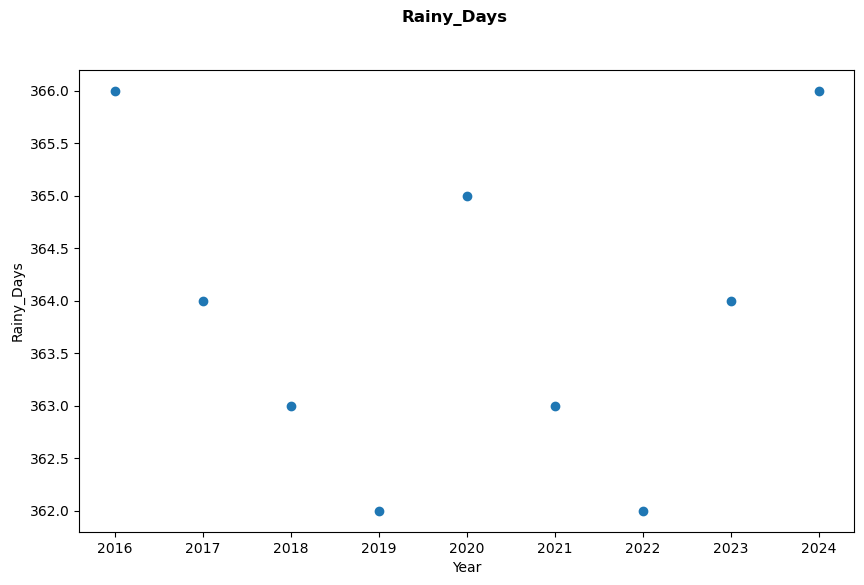

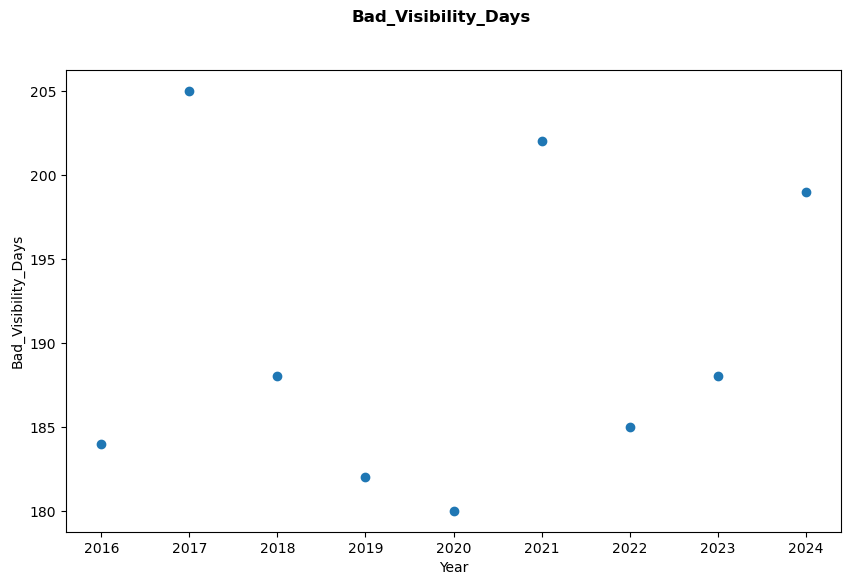

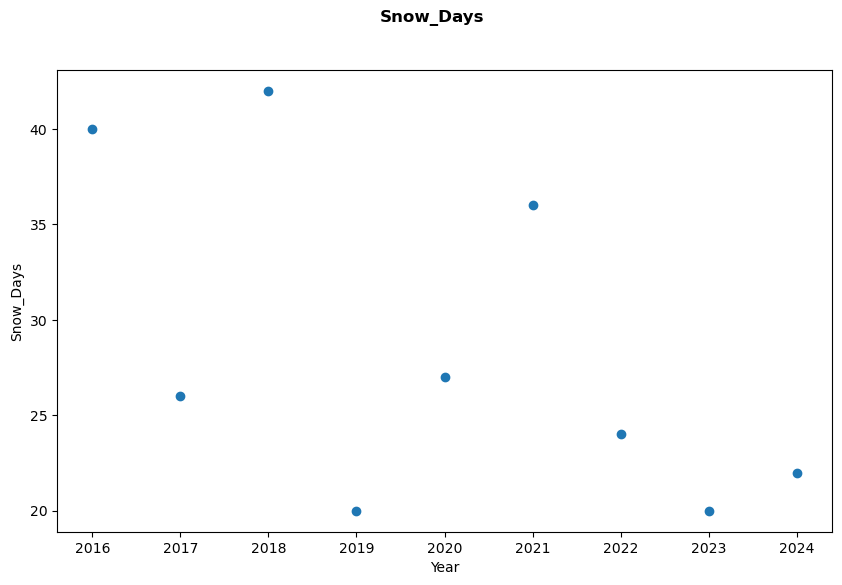

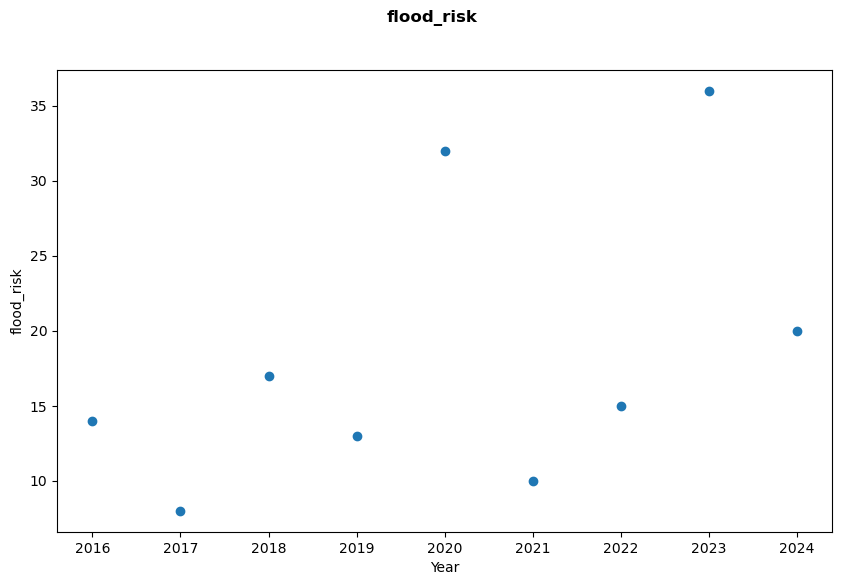

In [637]:
df = weather_final
y = ['Rainy_Days', 'Bad_Visibility_Days', 'Snow_Days', 'flood_risk']
year = 'Year'
for j in y:
    plot_scatter(df, x_col= 'Year', y_col=j)

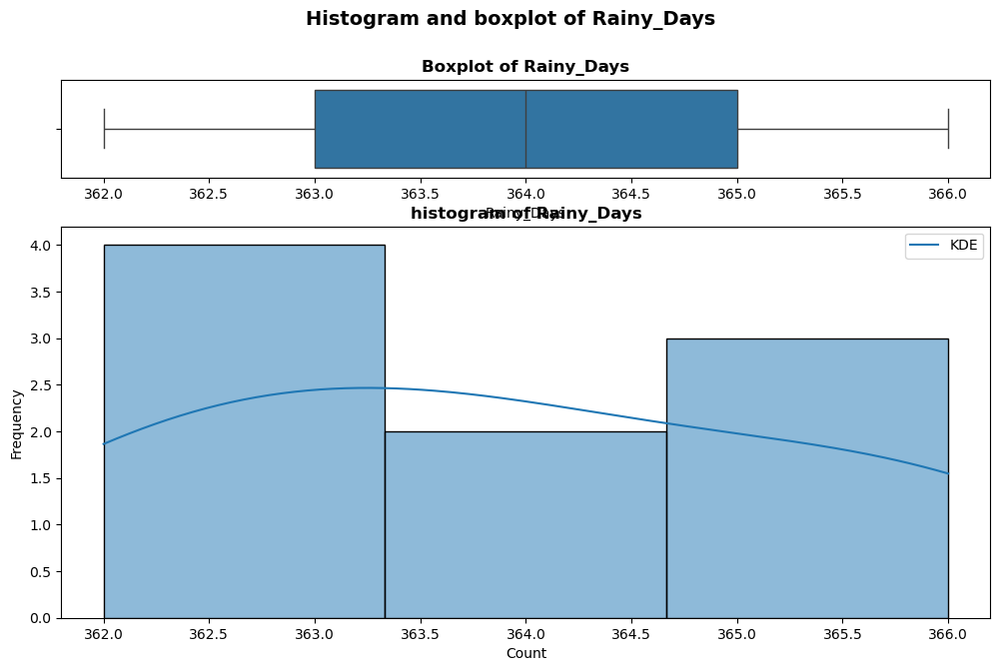

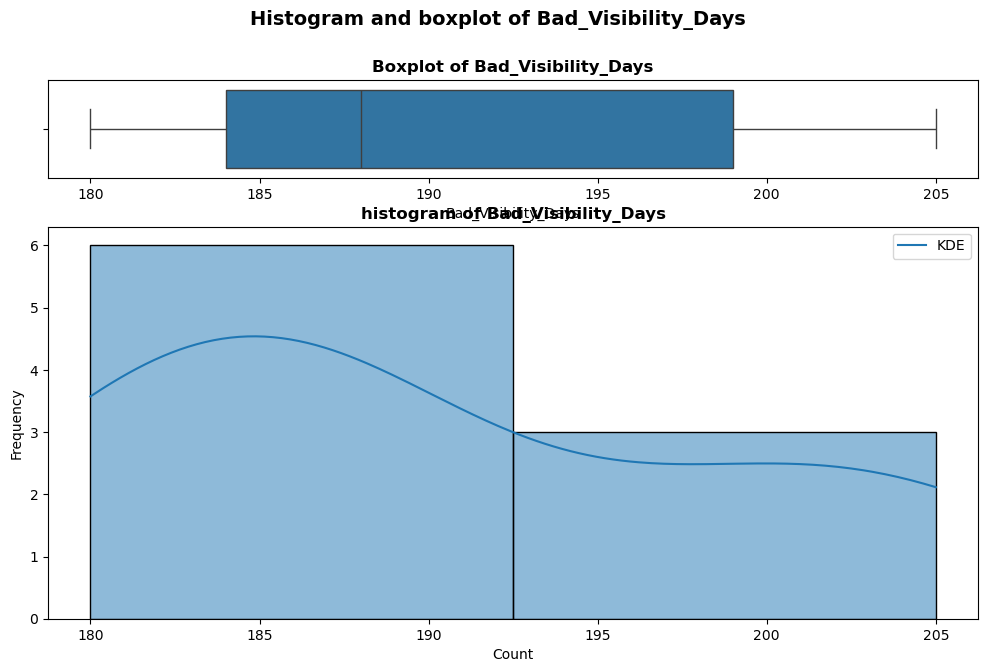

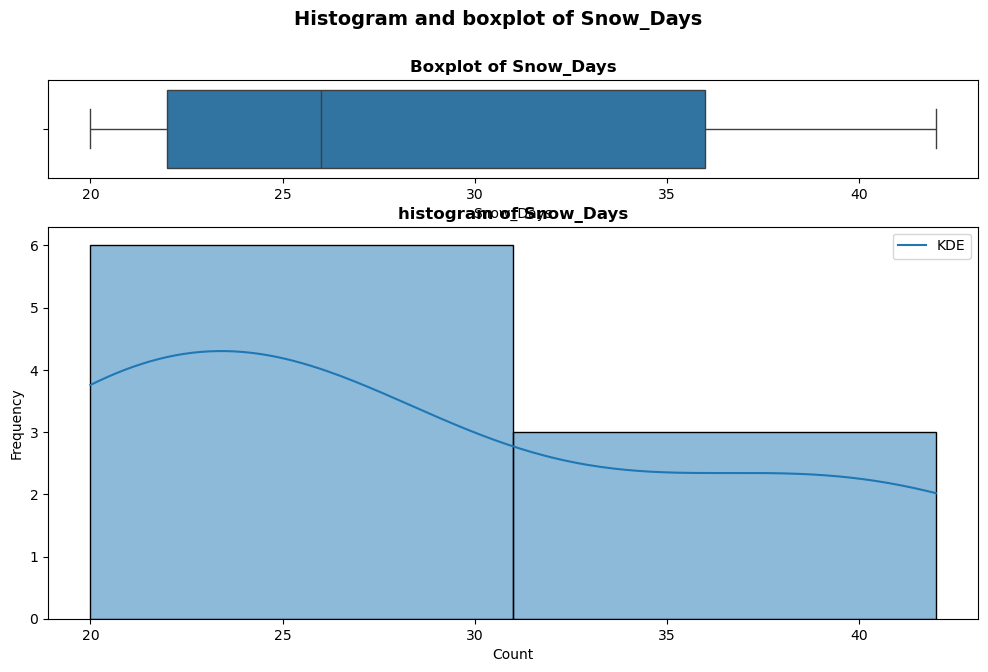

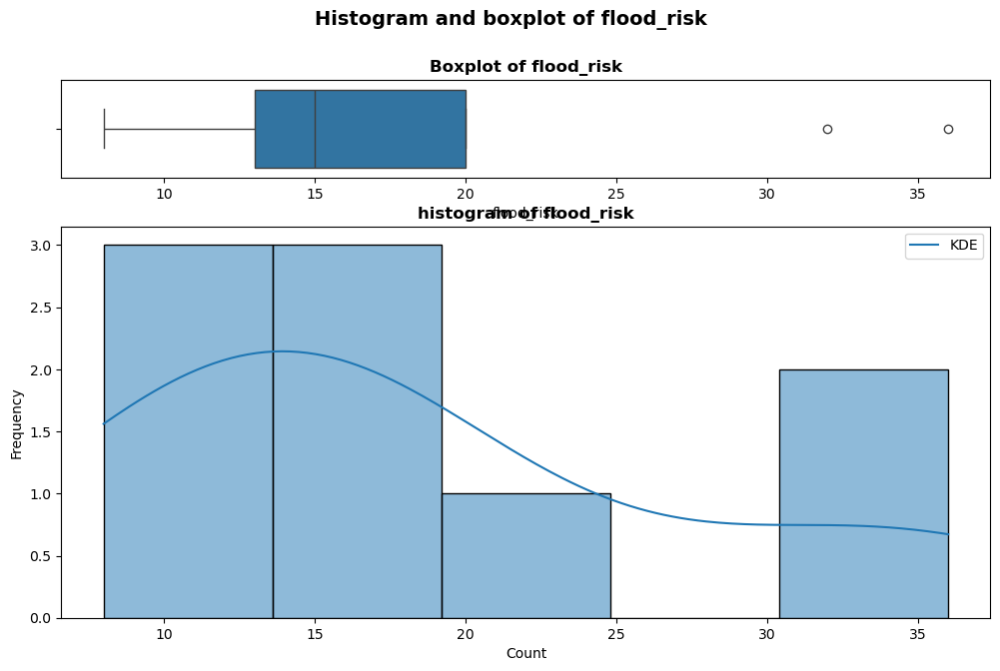

In [638]:
df = weather_final
y = ['Rainy_Days', 'Bad_Visibility_Days', 'Snow_Days', 'flood_risk']
year = 'Year'
for j in y:
    plot_histo(df, x_col= 'Year', y_col=j)

In [639]:
weather_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype
---  ------                          --------------  -----
 0   Year                            9 non-null      int32
 1   tp_median_categorical_Average   9 non-null      int64
 2   tp_median_categorical_Extreme   9 non-null      int64
 3   tp_median_categorical_High      9 non-null      int64
 4   tp_median_categorical_Low       9 non-null      int64
 5   tcc_median_categorical_Average  9 non-null      int64
 6   tcc_median_categorical_High     9 non-null      int64
 7   tcc_median_categorical_Low      9 non-null      int64
 8   tcc_median_categorical_Slight   9 non-null      int64
 9   sf_median_categorical_Extreme   9 non-null      int64
 10  sf_median_categorical_High      9 non-null      int64
 11  sf_median_categorical_Low       9 non-null      int64
 12  Rainy_Days                      9 non-null      int64
 13  Bad_Visib

In [640]:
df = weather_final
y = ['Rainy_Days', 'Bad_Visibility_Days', 'Snow_Days', 'flood_risk']
year = 'Year'
for j in y:
    print(f'\n=== Distribution Fit Results for {j} ===')
    # the function is designed to work with column name 'Value', a temporary df is created to adress this issue
    temp_df = weather_final[[year, j]].copy()
    temp_df = temp_df.rename(columns={j: 'Value'})
    result = dist_type(temp_df, y_col='Value')
    #print is going to print <statsmodels.tsa.statespace.mlemodel.PredictionResultsWrapper object at 0x000001EF55E97530>, use display instead
    display(result.head(10))


=== Distribution Fit Results for Rainy_Days ===


,Distribution,AIC,BIC,LogLik,Params
1,binom,53.19,53.58,-24.59,"(403, 0.9029500964984837)"
0,poisson,71.67,71.87,-34.83,"(363.8888888888889,)"
3,geom,126.12,126.32,-62.06,"(0.002748091603053435,)"
2,nbinom,NaN,NaN,NaN,None



=== Distribution Fit Results for Bad_Visibility_Days ===


,Distribution,AIC,BIC,LogLik,Params
0,poisson,69.33,69.53,-33.67,"(190.33333333333334,)"
1,binom,74.82,75.22,-35.41,"(226, 0.8421828908554573)"
3,geom,114.43,114.63,-56.22,"(0.005253940455341506,)"
2,nbinom,NaN,NaN,NaN,None



=== Distribution Fit Results for Snow_Days ===


,Distribution,AIC,BIC,LogLik,Params
2,nbinom,66.36,66.75,-31.18,"(22.291258859264264, 0.43840030326004553)"
0,poisson,68.27,68.46,-33.13,"(28.555555555555557,)"
3,geom,80.01,80.21,-39.01,"(0.03501945525291829,)"
1,binom,97.85,98.25,-46.93,"(47, 0.607565011820331)"



=== Distribution Fit Results for flood_risk ===


,Distribution,AIC,BIC,LogLik,Params
2,nbinom,67.08,67.47,-31.54,"(5.279232111692845, 0.22357723577235772)"
3,geom,71.86,72.05,-34.93,"(0.05454545454545455,)"
0,poisson,81.06,81.26,-39.53,"(18.333333333333332,)"
1,binom,119.26,119.65,-57.63,"(40, 0.4583333333333333)"


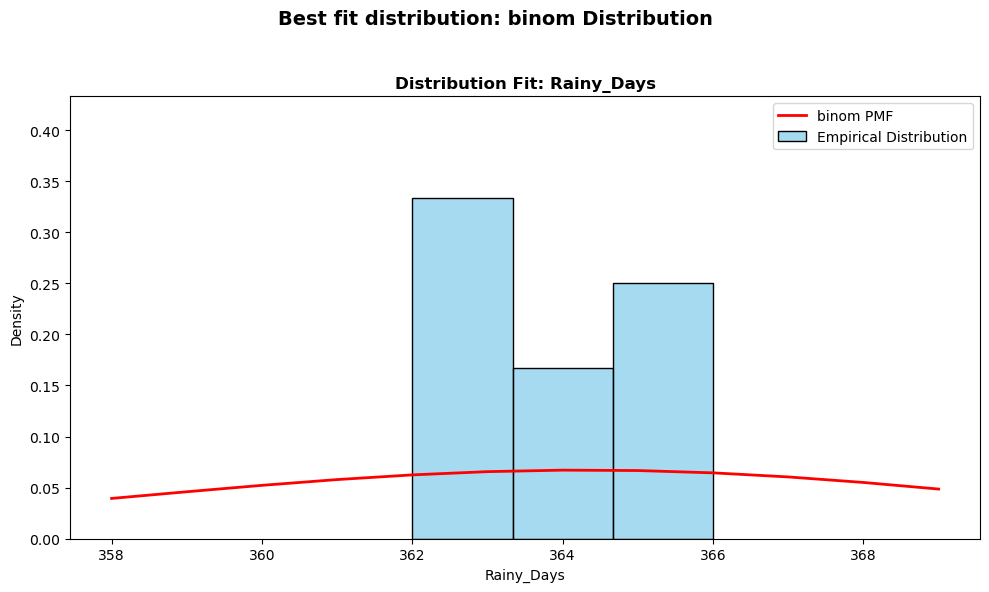

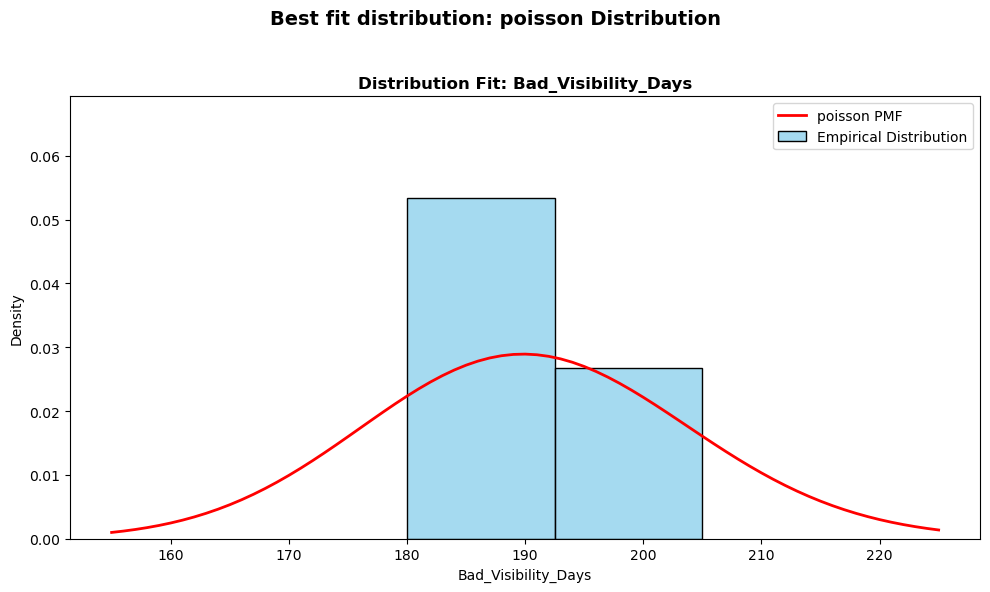

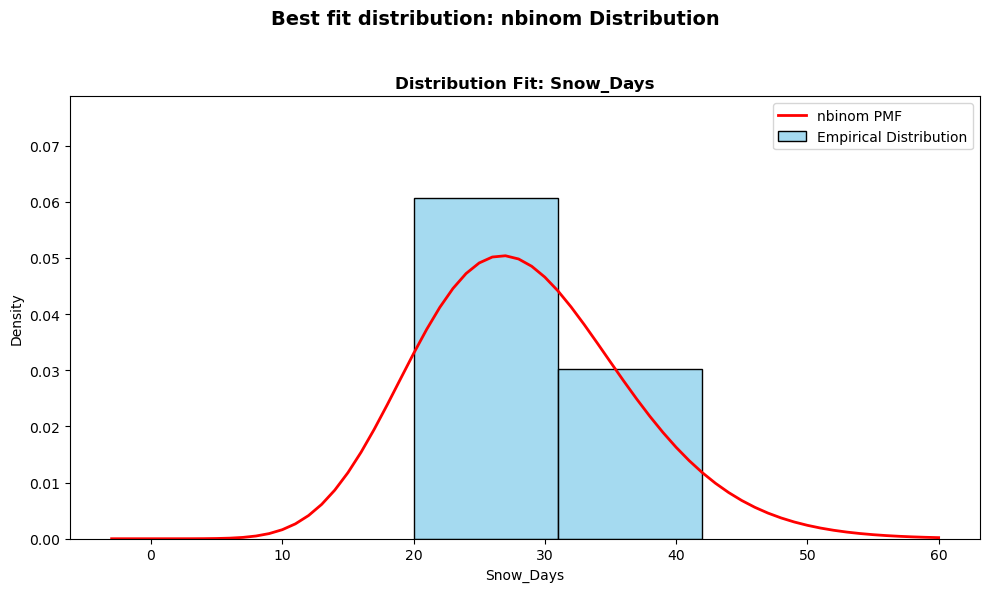

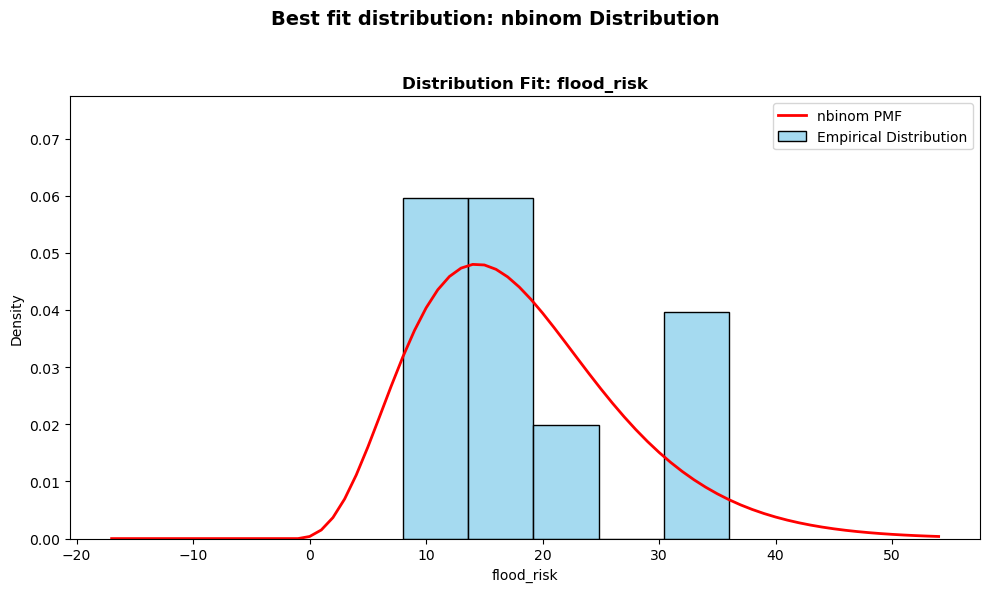

In [646]:
df = weather_final
y = ['Rainy_Days', 'Bad_Visibility_Days', 'Snow_Days', 'flood_risk']
year = 'Year'
for j in y:
    plot_best_dist(df, y_col= j)

now we are going to consolidate all the databases to have a unique dataframe in which we can performe all the analysis

dataframe from subject of study was never modified, since it was analyzed by quarter using indexes as references. since it is a comulative report no aggregation is needed, Q4 per year is going to be selected per year

In [647]:
df_all1 = df_all.rename(columns={'Date': 'Year'}) 
df_all1['Year'] = pd.to_datetime(df_all1['Year'])
df_all1['Q'] = df_all1['Year'].dt.month
# for 2023 september is going to be used, this is going to be justified in the academic pape
df_eoy = df_all1[df_all1['Q'] == 3].copy()
df_eoy['Year'] = df_all1['Year'].dt.year 
df_eoy = df_eoy.drop(columns=['Q'])
df_eoy.head(15)

,Year,Liabilities,Loans,Deposit guarantees in connection with reinsurance business,Debt securities issued,Insurance technical reserves,Life insurance technical reserves,Unit linked,Non-unit linked,Non-life insurance technical reserves,Equity,Listed shares,Unlisted shares,Other equity,Financial derivatives,Remaining liabilities
2,2017,304147,4372,3521,849,257539,230637,195055,35582,26902,22494,-,22494,-,2532,16360
6,2018,309270,3778,3118,815,264740,239053,205075,33977,25687,21411,-,21411,-,2639,15887
14,2020,337252,6249,4808,813,282853,250284,196010,54273,32569,24336,-,24336,-,4324,18676
18,2021,396207,7257,5666,791,336005,299966,243935,56031,36039,28206,-,28206,-,3844,20104
22,2022,416094,7657,5811,844,354041,314383,262397,51986,39658,30270,-,30270,-,4372,18911
26,2023,404636,6974,5473,1049,340992,296040,251983,44058,44952,29924,-,29924,-,5811,19886
30,2024,435577,6902,5310,1062,373608,327746,276514,51232,45862,30548,-,30548,-,3096,20362


2016 is missing since it is only analized until march 2024 and there's no data from March 2016.
if seasonalities doesn't have an huge impact in the data, data from september is going to be used for 2016, otherwise 2016 is going to be dropped from the analysis features

**Main DataFrame creation**

In [648]:
df_all1['Year'] = pd.to_datetime(df_all1['Year']).dt.year
df_all1

,Year,Liabilities,Loans,Deposit guarantees in connection with reinsurance business,Debt securities issued,Insurance technical reserves,Life insurance technical reserves,Unit linked,Non-unit linked,Non-life insurance technical reserves,Equity,Listed shares,Unlisted shares,Other equity,Financial derivatives,Remaining liabilities,Q
0,2016,298824,3954,3052,964,253449,226491,185966,40526,26957,22887,-,22887,-,2427,15144,9
1,2016,297450,4314,3407,1060,252715,227432,191622,35810,25283,23093,-,23093,-,2027,14240,12
2,2017,304147,4372,3521,849,257539,230637,195055,35582,26902,22494,-,22494,-,2532,16360,3
3,2017,304195,4033,3336,813,258859,232376,197483,34893,26483,22411,-,22411,-,2558,15521,6
4,2017,307648,4030,3390,797,263374,236134,201519,34615,27240,22791,-,22791,-,2474,14181,9
5,2017,312796,3966,3303,837,268635,242733,207423,35309,25902,22412,-,22412,-,2656,14290,12
6,2018,309270,3778,3118,815,264740,239053,205075,33977,25687,21411,-,21411,-,2639,15887,3
7,2018,311705,3714,3046,809,267249,242305,208765,33540,24944,21650,-,21650,-,2630,15653,6
8,2018,317450,3631,3033,803,272107,245501,212184,33317,26606,22398,-,22398,-,2392,16119,9
9,2018,305312,3878,3091,654,258871,233920,200296,33624,24951,24046,-,24046,-,2366,15497,12


In [649]:
#fixing 2019 Q mistake... it should be Q = 3 not 1
df_all1.loc[df_all1['Q'] == 1, 'Q'] = 3
df_all1

,Year,Liabilities,Loans,Deposit guarantees in connection with reinsurance business,Debt securities issued,Insurance technical reserves,Life insurance technical reserves,Unit linked,Non-unit linked,Non-life insurance technical reserves,Equity,Listed shares,Unlisted shares,Other equity,Financial derivatives,Remaining liabilities,Q
0,2016,298824,3954,3052,964,253449,226491,185966,40526,26957,22887,-,22887,-,2427,15144,9
1,2016,297450,4314,3407,1060,252715,227432,191622,35810,25283,23093,-,23093,-,2027,14240,12
2,2017,304147,4372,3521,849,257539,230637,195055,35582,26902,22494,-,22494,-,2532,16360,3
3,2017,304195,4033,3336,813,258859,232376,197483,34893,26483,22411,-,22411,-,2558,15521,6
4,2017,307648,4030,3390,797,263374,236134,201519,34615,27240,22791,-,22791,-,2474,14181,9
5,2017,312796,3966,3303,837,268635,242733,207423,35309,25902,22412,-,22412,-,2656,14290,12
6,2018,309270,3778,3118,815,264740,239053,205075,33977,25687,21411,-,21411,-,2639,15887,3
7,2018,311705,3714,3046,809,267249,242305,208765,33540,24944,21650,-,21650,-,2630,15653,6
8,2018,317450,3631,3033,803,272107,245501,212184,33317,26606,22398,-,22398,-,2392,16119,9
9,2018,305312,3878,3091,654,258871,233920,200296,33624,24951,24046,-,24046,-,2366,15497,12


In [650]:
q1 = 3
q3 = 9
col = 'Non-life insurance technical reserves'
mask = df_all1[df_all1['Q'].isin([q1, q3])].copy()
df_all1_pivot = mask.pivot_table(index='Year', columns='Q', values=col)
df_all1_pivot.reset_index()

Q,Year,3,9
0,2016,NaN,26957.00
1,2017,26902.00,27240.00
2,2018,25687.00,26606.00
3,2019,27576.00,30242.00
4,2020,32569.00,35944.00
5,2021,36039.00,39532.00
6,2022,39658.00,43872.00
7,2023,44952.00,48029.00
8,2024,45862.00,NaN


In [651]:
q3_values = df_all1_pivot[3]
q1_values = df_all1_pivot[9]
per_change = ((q3_values - q1_values) / q1_values) * 100
per_change

Year
2016     NaN
2017   -1.24
2018   -3.45
2019   -8.82
2020   -9.39
2021   -8.84
2022   -9.61
2023   -6.41
2024     NaN
dtype: float64

This case in a MCAR mechanisim. Imputation is going to be performed using average seasonal differences

In [652]:
df_all1_pivot.index = df_all1_pivot.index.astype(int)
print(df_all1_pivot.index)

Index([2016, 2017, 2018, 2019, 2020, 2021, 2022, 2023, 2024], dtype='int64', name='Year')


In [653]:
avg_diff = per_change.mean() / 100
sept_2016 = df_all1_pivot.loc[2016, 9]
march_2016_est = sept_2016 * (1 + avg_diff)
print(march_2016_est)

25118.23484041795


In [654]:
#add march_2016_est to df
cols = 'Non-life insurance technical reserves'
other_cols = [col for col in df_all1.columns if col not in ['Year', 'Q', cols]]
row_data = {'Year': 2016, 'Q': 3, cols: march_2016_est}
for col in other_cols:
    row_data[col] = np.nan
df_new_row = pd.DataFrame([row_data])
df_all1_f = pd.concat([df_all1, df_new_row], ignore_index=True)
df_all1_f = df_all1_f.sort_values(by=['Year', 'Q']) 
df_all1_f

,Year,Liabilities,Loans,Deposit guarantees in connection with reinsurance business,Debt securities issued,Insurance technical reserves,Life insurance technical reserves,Unit linked,Non-unit linked,Non-life insurance technical reserves,Equity,Listed shares,Unlisted shares,Other equity,Financial derivatives,Remaining liabilities,Q
31,2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25118.23,NaN,NaN,NaN,NaN,NaN,NaN,3
0,2016,298824.00,3954.00,3052.00,964.00,253449.00,226491.00,185966.00,40526.00,26957.00,22887.00,-,22887.00,-,2427.00,15144.00,9
1,2016,297450.00,4314.00,3407.00,1060.00,252715.00,227432.00,191622.00,35810.00,25283.00,23093.00,-,23093.00,-,2027.00,14240.00,12
2,2017,304147.00,4372.00,3521.00,849.00,257539.00,230637.00,195055.00,35582.00,26902.00,22494.00,-,22494.00,-,2532.00,16360.00,3
3,2017,304195.00,4033.00,3336.00,813.00,258859.00,232376.00,197483.00,34893.00,26483.00,22411.00,-,22411.00,-,2558.00,15521.00,6
4,2017,307648.00,4030.00,3390.00,797.00,263374.00,236134.00,201519.00,34615.00,27240.00,22791.00,-,22791.00,-,2474.00,14181.00,9
5,2017,312796.00,3966.00,3303.00,837.00,268635.00,242733.00,207423.00,35309.00,25902.00,22412.00,-,22412.00,-,2656.00,14290.00,12
6,2018,309270.00,3778.00,3118.00,815.00,264740.00,239053.00,205075.00,33977.00,25687.00,21411.00,-,21411.00,-,2639.00,15887.00,3
7,2018,311705.00,3714.00,3046.00,809.00,267249.00,242305.00,208765.00,33540.00,24944.00,21650.00,-,21650.00,-,2630.00,15653.00,6
8,2018,317450.00,3631.00,3033.00,803.00,272107.00,245501.00,212184.00,33317.00,26606.00,22398.00,-,22398.00,-,2392.00,16119.00,9


In [660]:
#instead of using 7 merges to consolidate it all (merge is design to merge 1 by 1)  functiontools.reduce can be used for this task
#some columns 'Year' on the dataframes are not time objects. it is needed to standarized it in order to merge on year
dfs = [df_vl_final, df_km_1_final, df_private_premiums_1_final, df_gardai_final_m1, df_uc_pivot_features, df_cs_pivot_features_final, weather_final]
for i in dfs:
    #verify that there's no decimal points will make the task easier
    i['Year'] = i['Year'].astype(str).str.replace(r'\.0$', '', regex=True)
    i['Year'] = pd.to_numeric(i['Year'], errors='coerce')
merge = [df_vl_final[['Year', 'Value']].rename(columns={'Value': 'Vehicles Licenced'}), df_km_1_final[['Year', 'Km Driven - (MM)']], df_private_premiums_1_final[['Year', 'Value']].rename(columns={'Value': 'Premiums (€)'}), df_gardai_final_m1[['Year', 'Fixed charged fines']].rename(columns={'Fixed charged fines': 'Fixed Charges (€)'}), df_uc_pivot_features, df_cs_pivot_features_final, weather_final]
df_final = reduce(lambda left, right: pd.merge(left, right, on='Year', how='left'),merge)
df_final.head(15)

,Year,Vehicles Licenced,Km Driven - (MM),Premiums (€),Fixed Charges (€),index,Asset Damage,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (>250k),...,tcc_median_categorical_High,tcc_median_categorical_Low,tcc_median_categorical_Slight,sf_median_categorical_Extreme,sf_median_categorical_High,sf_median_categorical_Low,Rainy_Days,Bad_Visibility_Days,Snow_Days,flood_risk
0,2016,2624958,47775.00,296050495.59,309086.00,0.00,111319504.06,69625782.46,371932928.57,138925686.07,...,184,154,1,0,1,365,366,184,40,14
1,2017,2675879,48754.00,334677852.39,295457.00,1.00,107523428.05,70852196.12,369175502.32,143650943.31,...,205,130,1,0,3,362,364,205,26,8
2,2018,2717722,47545.00,331363394.18,299515.00,2.00,114164747.25,75381597.82,351919820.55,149246404.21,...,188,137,5,7,7,351,363,188,42,17
3,2019,2805839,47072.00,334585248.04,293959.00,3.00,118590016.67,82812573.43,353502069.40,131662173.50,...,182,147,2,1,1,363,362,182,20,13
4,2020,2860984,36237.00,339774078.04,320350.00,4.00,98637367.13,60956202.28,258371360.11,142081458.45,...,180,152,0,1,5,360,365,180,27,32
5,2021,2890975,41878.00,330167746.20,311945.00,5.00,127194140.30,79791184.19,240175215.96,155360381.86,...,202,128,2,2,4,359,363,202,36,10
6,2022,2919005,47604.00,313222724.86,291217.00,6.00,197573921.59,111473066.26,281393289.07,160289903.42,...,185,150,4,0,3,362,362,185,24,15
7,2023,3002092,47296.00,395235230.45,273241.00,NaN,195815056.39,111394939.53,258172666.98,163632636.94,...,188,136,7,0,2,363,364,188,20,36
8,2024,3143356,47086.98,393800619.81,282229.00,NaN,208850392.35,117935076.45,246790811.99,167725675.29,...,199,130,1,1,1,364,366,199,22,20


In [661]:
# adding target feature
temp_df = df_all1_f[df_all1_f['Q'] == 3].copy()
df_temp = temp_df[['Year', 'Non-life insurance technical reserves']]
df_final = pd.merge(df_final, df_temp, on='Year', how='left')
df_final

,Year,Vehicles Licenced,Km Driven - (MM),Premiums (€),Fixed Charges (€),index,Asset Damage,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (>250k),...,tcc_median_categorical_Low,tcc_median_categorical_Slight,sf_median_categorical_Extreme,sf_median_categorical_High,sf_median_categorical_Low,Rainy_Days,Bad_Visibility_Days,Snow_Days,flood_risk,Non-life insurance technical reserves
0,2016,2624958,47775.00,296050495.59,309086.00,0.00,111319504.06,69625782.46,371932928.57,138925686.07,...,154,1,0,1,365,366,184,40,14,25118.23
1,2017,2675879,48754.00,334677852.39,295457.00,1.00,107523428.05,70852196.12,369175502.32,143650943.31,...,130,1,0,3,362,364,205,26,8,26902.00
2,2018,2717722,47545.00,331363394.18,299515.00,2.00,114164747.25,75381597.82,351919820.55,149246404.21,...,137,5,7,7,351,363,188,42,17,25687.00
3,2019,2805839,47072.00,334585248.04,293959.00,3.00,118590016.67,82812573.43,353502069.40,131662173.50,...,147,2,1,1,363,362,182,20,13,27576.00
4,2020,2860984,36237.00,339774078.04,320350.00,4.00,98637367.13,60956202.28,258371360.11,142081458.45,...,152,0,1,5,360,365,180,27,32,32569.00
5,2021,2890975,41878.00,330167746.20,311945.00,5.00,127194140.30,79791184.19,240175215.96,155360381.86,...,128,2,2,4,359,363,202,36,10,36039.00
6,2022,2919005,47604.00,313222724.86,291217.00,6.00,197573921.59,111473066.26,281393289.07,160289903.42,...,150,4,0,3,362,362,185,24,15,39658.00
7,2023,3002092,47296.00,395235230.45,273241.00,NaN,195815056.39,111394939.53,258172666.98,163632636.94,...,136,7,0,2,363,364,188,20,36,44952.00
8,2024,3143356,47086.98,393800619.81,282229.00,NaN,208850392.35,117935076.45,246790811.99,167725675.29,...,130,1,1,1,364,366,199,22,20,45862.00


In [662]:
# a backup of the whole section is done! for next stages, it's going to be used as reference to make the coding more efficient.
df_final.to_csv('final.csv', index=False)

a data dictionary is presented to have a clear view of the dataframe consolidated and the type of data.
<p> dataframe to markdown fuction is going to be used for this task. </p>

In [663]:
url = 'https://docs.google.com/spreadsheets/d/e/2PACX-1vT8B1cdPhwiM_dcKjOISZ77VvJCWrlCkbnBYjy3VhlERdEt75-g7fj03Ji5N577a-aWoja-eCm3At80/pub?output=csv'
markdown = pd.read_csv(url) 
a = markdown.to_markdown()
#print(a)
#print is remove from the cell to save space. the structure provided is copy paste to get the markdown as seen in the next cell

|    | Feature                             | dimensional      | Type        | description                                                                                                 | Type of distribution   | Outliers     |
|---:|:------------------------------------|:-----------------|:------------|:------------------------------------------------------------------------------------------------------------|:-----------------------|:-------------|
|  0 | Year                                | year             | Reference   | Year of the time series                                                                                     | nan                    | nan          |
|  1 | VehiclesLicenced                    | units            | Discrete    | Number of cars licenced in Ireland                                                                          | Negative binomial      | No           |
|  2 | KmDriven-(MM)                       | Millions of KM   | Continous   | Millions of km driven in Ireland per year                                                                   | Beta                   | Yes          |
|  3 | Premiums(€)                         | Euro             | Continous   | Value of all premiums for Auto Insurance in Ireland                                                         | Log-Normal             | Yes          |
|  4 | FixedCharges(€)                     | Euro             | Continous   | Fixed charged fines related to drive conduct in Ireland per year                                            | Log-Normal             | No           |
|  5 | AssetDamage                         | Euro             | Continous   | Value of claims for damages to insured assets (car) in Ireland                                              | Beta                   | No           |
|  6 | ThirdPartyDamage                    | Euro             | Continous   | Value of claims related to third parties covering insured assets (car) in Ireland                           | Beta                   | No           |
|  7 | ThirdPartyInjury(<=250k)            | Euro             | Continous   | Total value of claims related to third parties injuries below 250K covering insured assets (car) in Ireland | Log-Normal             | No           |
|  8 | ThirdPartyInjury(>250k)             | Euro             | Continous   | Total value of claims related to third parties injuries above 250K covering insured assets (car) in Ireland | Log-Normal             | No           |
|  9 | AssetDamagecategorical              | nan              | Categorical | Meassurement of value of the year compared to a baseline mean                                               | Not analyzed           | Not analyzed |
| 10 | ThirdPartyDamagecategorical         | nan              | Categorical | Meassurement of value of the year compared to a baseline mean                                               | Not analyzed           | Not analyzed |
| 11 | ThirdPartyInjury(<=250k)categorical | nan              | Categorical | Meassurement of value of the year compared to a baseline mean                                               | Not analyzed           | Not analyzed |
| 12 | ThirdPartyInjury(>250k)categorical  | nan              | Categorical | Meassurement of value of the year compared to a baseline mean                                               | Not analyzed           | Not analyzed |
| 13 | Direct_0_10000                      | Euro             | Continous   | Total value of direct settlement of claim based in binning  range                                           | Beta                   | Yes          |
| 14 | Direct_10001_15000                  | Euro             | Continous   | Total value of direct settlement of claim based in binning  range                                           | Beta                   | Yes          |
| 15 | Direct_15001_30000                  | Euro             | Continous   | Total value of direct settlement of claim based in binning  range                                           | Beta                   | Yes          |
| 16 | Direct_30001_45000                  | Euro             | Continous   | Total value of direct settlement of claim based in binning  range                                           | Beta                   | Yes          |
| 17 | Direct_45001_60000                  | Euro             | Continous   | Total value of direct settlement of claim based in binning  range                                           | Beta                   | Yes          |
| 18 | Direct_60001_100000                 | Euro             | Continous   | Total value of direct settlement of claim based in binning  range                                           | Beta                   | Yes          |
| 19 | Direct_>100001                      | Euro             | Continous   | Total value of direct settlement of claim based in binning  range                                           | Beta                   | Yes          |
| 20 | Litigated_0_10000                   | Euro             | Continous   | Total value of direct settlement of claim based in binning  range                                           | Beta                   | Yes          |
| 21 | Litigated_10001_15000               | Euro             | Continous   | Total value of litigated settlement of claim based in binning  range                                        | Beta                   | Yes          |
| 22 | Litigated_15001_30000               | Euro             | Continous   | Total value of litigated settlement of claim based in binning  range                                        | Beta                   | Yes          |
| 23 | Litigated_30001_45000               | Euro             | Continous   | Total value of litigated settlement of claim based in binning  range                                        | Beta                   | Yes          |
| 24 | Litigated_45001_60000               | Euro             | Continous   | Total value of litigated settlement of claim based in binning  range                                        | Beta                   | Yes          |
| 25 | Litigated_60001_100000              | Euro             | Continous   | Total value of litigated settlement of claim based in binning  range                                        | Beta                   | Yes          |
| 26 | Litigated_>100001                   | Euro             | Continous   | Total value of litigated settlement of claim based in binning  range                                        | Beta                   | Yes          |
| 27 | PIAB_0_10000                        | Euro             | Continous   | Total value of PIAB settlement of claim based in binning  range                                             | Beta                   | Yes          |
| 28 | PIAB_10001_15000                    | Euro             | Continous   | Total value of PIAB settlement of claim based in binning  range                                             | Beta                   | Yes          |
| 29 | PIAB_15001_30000                    | Euro             | Continous   | Total value of PIAB settlement of claim based in binning  range                                             | Beta                   | Yes          |
| 30 | PIAB_30001_45000                    | Euro             | Continous   | Total value of PIAB settlement of claim based in binning  range                                             | Beta                   | Yes          |
| 31 | PIAB_45001_60000                    | Euro             | Continous   | Total value of PIAB settlement of claim based in binning  range                                             | Beta                   | Yes          |
| 32 | PIAB_60001_100000                   | Euro             | Continous   | Total value of PIAB settlement of claim based in binning  range                                             | Beta                   | Yes          |
| 33 | PIAB_>100001                        | Euro             | Continous   | Total value of PIAB settlement of claim based in binning  range                                             | Beta                   | Yes          |
| 34 | tp_median_categorical_Average       | days             | Discrete    | number of days with rain within the category defined by a baseline average                                  | Not analyzed           | Not analyzed |
| 35 | tp_median_categorical_Extreme       | days             | Discrete    | number of days with rain within the category defined by a baseline average                                  | Not analyzed           | Not analyzed |
| 36 | tp_median_categorical_High          | days             | Discrete    | number of days with rain within the category defined by a baseline average                                  | Not analyzed           | Not analyzed |
| 37 | tp_median_categorical_Low           | days             | Discrete    | number of days with cloud coverage within the category defined by a baseline average                        | Not analyzed           | Not analyzed |
| 38 | tcc_median_categorical_Average      | days             | Discrete    | number of days with cloud coverage within the category defined by a baseline average                        | Not analyzed           | Not analyzed |
| 39 | tcc_median_categorical_High         | days             | Discrete    | number of days with cloud coverage within the category defined by a baseline average                        | Not analyzed           | Not analyzed |
| 40 | tcc_median_categorical_Low          | days             | Discrete    | number of days with cloud coverage within the category defined by a baseline average                        | Not analyzed           | Not analyzed |
| 41 | tcc_median_categorical_Slight       | days             | Discrete    | number of days with cloud coverage within the category defined by a baseline average                        | Not analyzed           | Not analyzed |
| 42 | sf_median_categorical_Extreme       | days             | Discrete    | number of days with snow fall within the category defined by a baseline average                             | Not analyzed           | Not analyzed |
| 43 | sf_median_categorical_High          | days             | Discrete    | number of days with snow fall within the category defined by a baseline average                             | Not analyzed           | Not analyzed |
| 44 | sf_median_categorical_Low           | days             | Discrete    | number of days with snow fall within the category defined by a baseline average                             | Not analyzed           | Not analyzed |
| 45 | Rainy_Days                          | days             | Discrete    | Number of Rain days in Ireland per Year                                                                     | Binomial               | No           |
| 46 | Bad_Visibility_Days                 | days             | Discrete    | Number of days in ireland with cloud coverage above a bad visibility treshold defined                       | Poisson                | No           |
| 47 | Snow_Days                           | days             | Discrete    | Number of snow days in Ireland per Year                                                                     | Negative binomial      | No           |
| 48 | flood_risk                          | days             | Discrete    | rain acummulation in a 3 day window above the 95 percentile                                                 | Negative binomial      | Yes          |
| 49 | Non-lifeinsurancetechnicalreserves  | Millions of Euro | Continous   | Liability exposure of insurance companies                                                                   | nan                    | nan          |

## Univariate Analysis - Non graphical methods

<p>in the previous section the best distribution was determined, in addition to outliers and visual representation of all variables in this study. </p>
<p>in this stage all non graphical methods are going to be analized to have a better understanding of the data</p>


In [664]:
url = 'https://docs.google.com/spreadsheets/d/e/2PACX-1vRJ9W4kXyU5FX1CwL3asY0LnMJB-yr0hVrXMIVSX-xqTuxfOiM8lzqYN3f7f4eGgoq-ofUQNT2C55nb/pub?output=csv' 
df_main = pd.read_csv(url) 
df_main

,Year,Vehicles Licenced,Km Driven - (MM),Premiums (€),Fixed Charges (€),Asset Damage,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (>250k),Asset Damage categorical,...,tcc_median_categorical_Low,tcc_median_categorical_Slight,sf_median_categorical_Extreme,sf_median_categorical_High,sf_median_categorical_Low,Rainy_Days,Bad_Visibility_Days,Snow_Days,flood_risk,Non-life insurance technical reserves
0,2016,2624958,47775.00,296050495.60,309086,111319504.10,69625782.46,371932928.60,138925686.10,Low,...,154,1,0,1,365,366,184,40,14,25118.23
1,2017,2675879,48754.00,334677852.40,295457,107523428.10,70852196.12,369175502.30,143650943.30,Low,...,130,1,0,3,362,364,205,26,8,26902.00
2,2018,2717722,47545.00,331363394.20,299515,114164747.20,75381597.82,351919820.50,149246404.20,Low,...,137,5,7,7,351,363,188,42,17,25687.00
3,2019,2805839,47072.00,334585248.00,293959,118590016.70,82812573.43,353502069.40,131662173.50,Low,...,147,2,1,1,363,362,182,20,13,27576.00
4,2020,2860984,36237.00,339774078.00,320350,98637367.13,60956202.28,258371360.10,142081458.50,Low,...,152,0,1,5,360,365,180,27,32,32569.00
5,2021,2890975,41878.00,330167746.20,311945,127194140.30,79791184.19,240175216.00,155360381.90,Low,...,128,2,2,4,359,363,202,36,10,36039.00
6,2022,2919005,47604.00,313222724.90,291217,197573921.60,111473066.30,281393289.10,160289903.40,High,...,150,4,0,3,362,362,185,24,15,39658.00
7,2023,3002092,47296.00,395235230.40,273241,195815056.40,111394939.50,258172667.00,163632636.90,High,...,136,7,0,2,363,364,188,20,36,44952.00
8,2024,3143356,47086.98,393800619.80,282229,208850392.30,117935076.50,246790812.00,167725675.30,High,...,130,1,1,1,364,366,199,22,20,45862.00


In [665]:
df_main['Fixed Charges (€)'] = df_main['Fixed Charges (€)'].astype('float64')
df_main.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9 entries, 0 to 8
Data columns (total 50 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   Year                                     9 non-null      int64  
 1   Vehicles Licenced                        9 non-null      int64  
 2   Km Driven - (MM)                         9 non-null      float64
 3   Premiums (€)                             9 non-null      float64
 4   Fixed Charges (€)                        9 non-null      float64
 5   Asset Damage                             9 non-null      float64
 6   Third Party Damage                       9 non-null      float64
 7   Third Party Injury (<=250k)              9 non-null      float64
 8   Third Party Injury (>250k)               9 non-null      float64
 9   Asset Damage categorical                 9 non-null      object 
 10  Third Party Damage categorical           9 non-null   

### Statistics calculations

In [666]:
# in order to provide numerical stability when checking against zero, safe skew and safe kurtosis are defined
from scipy.stats import skew, kurtosis
def safe_skew(x):
    return skew(x) if x.var() > 1e-10 else np.nan

def safe_kurtosis(x):
    return kurtosis(x, fisher=True) if x.var() > 1e-10 else np.nan

common_stats_list = ['mean', 'min', 'max', 'std', 'median', lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan, 
                     lambda x: x.quantile(0.25),lambda x: x.quantile(0.75), lambda x: x.max() - x.min(), safe_skew, safe_kurtosis, np.var]
columns_to_exclude = ['Year']
#exclude non numerical columns
numerical = df_main.select_dtypes(include=np.number).columns
target_cols = [col for col in numerical if col not in columns_to_exclude]
df_statistics = df_main[target_cols].agg(common_stats_list).T
new_col_names = ['mean', 'min', 'max', 'std', 'median', 'mode', 'q25', 'q75', 'range', 'skew', 'kurtosis', 'var']
df_statistics.columns = new_col_names
df_statistics.index.name = 'Feature'
df_statistics = df_statistics.reset_index() 
df_statistics

,Feature,mean,min,max,std,median,mode,q25,q75,range,skew,kurtosis,var
0,Vehicles Licenced,2848978.89,2624958.00,3143356.00,164374.31,2860984.00,2624958.00,2717722.00,2919005.00,518398.00,0.32,-0.73,27018913963.11
1,Km Driven - (MM),45694.22,36237.00,48754.00,4049.24,47296.00,36237.00,47072.00,47604.00,12517.00,-1.68,1.37,16396355.60
2,Premiums (€),340986376.61,296050495.60,395235230.40,33193038.29,334585248.00,296050495.60,330167746.20,339774078.00,99184734.80,0.70,-0.55,1101777790900174.12
3,Fixed Charges (€),297444.33,273241.00,320350.00,14777.26,295457.00,273241.00,291217.00,309086.00,47109.00,-0.06,-0.83,218367424.75
4,Asset Damage,142185397.09,98637367.13,208850392.30,44729008.38,118590016.70,98637367.13,111319504.10,195815056.40,110213025.17,0.63,-1.44,2000684190666531.50
5,Third Party Damage,86691402.07,60956202.28,117935076.50,21200085.94,79791184.19,60956202.28,70852196.12,111394939.50,56978874.22,0.46,-1.39,449443644008241.25
6,Third Party Injury (<=250k),303492629.44,240175216.00,371932928.60,56620282.35,281393289.10,240175216.00,258172667.00,353502069.40,131757712.60,0.15,-1.81,3205856373367222.00
7,Third Party Injury (>250k),150286140.34,131662173.50,167725675.30,12229193.09,149246404.20,131662173.50,142081458.50,160289903.40,36063501.80,0.00,-1.25,149553163663704.09
8,Direct_0_10000,8520709.98,6978455.45,11004433.36,1255752.82,8488453.94,6978455.45,7774558.04,9139722.74,4025977.91,0.57,-0.19,1576915157465.49
9,Direct_10001_15000,12215040.96,4573088.63,19902288.33,5343380.83,12951653.31,4573088.63,7246152.25,15965012.50,15329199.69,-0.12,-1.33,28551718706583.94


in the previous section the best fitting distribution was selected for each feature. It is going to be added to have a better perspective of the data

In [667]:
distribution_dictionary = {'Vehicles Licenced': 'Negative binomial', 'Km Driven - (MM)': 'Beta','Premiums (€)': 'Log-Normal','Fixed Charges (€)': 'Log-Normal','Asset Damage': 'Beta',
    'Third Party Damage': 'Beta', 'Third Party Injury (<=250k)': 'Log-Normal', 'Third Party Injury (>250k)': 'Log-Normal', 'AssetDamagecategorical': 'Not analyzed', 'ThirdPartyDamagecategorical': 'Not analyzed',
    'ThirdPartyInjury(<=250k)categorical': 'Not analyzed', 'ThirdPartyInjury(>250k)categorical': 'Not analyzed', 'Direct_0_10000': 'Beta', 'Direct_10001_15000': 'Beta',
    'Direct_15001_30000': 'Beta', 'Direct_30001_45000': 'Beta', 'Direct_45001_60000': 'Beta', 'Direct_60001_100000': 'Beta', 'Direct_>100001': 'Beta', 'Litigated_0_10000': 'Beta', 'Litigated_10001_15000': 'Beta',
    'Litigated_15001_30000': 'Beta', 'Litigated_30001_45000': 'Beta', 'Litigated_45001_60000': 'Beta', 'Litigated_60001_100000': 'Beta', 'Litigated_>100001': 'Beta',
    'PIAB_0_10000': 'Beta', 'PIAB_10001_15000': 'Beta', 'PIAB_15001_30000': 'Beta', 'PIAB_30001_45000': 'Beta', 'PIAB_45001_60000': 'Beta', 'PIAB_60001_100000': 'Beta', 'PIAB_>100001': 'Beta',
    'tp_median_categorical_Average': 'Not analyzed', 'tp_median_categorical_Extreme': 'Not analyzed', 'tp_median_categorical_High': 'Not analyzed', 'tp_median_categorical_Low': 'Not analyzed','tcc_median_categorical_Average': 'Not analyzed', 'tcc_median_categorical_High': 'Not analyzed',
    'tcc_median_categorical_Low': 'Not analyzed', 'tcc_median_categorical_Slight': 'Not analyzed', 'sf_median_categorical_Extreme': 'Not analyzed', 'sf_median_categorical_High': 'Not analyzed', 'sf_median_categorical_Low': 'Not analyzed',
    'Rainy_Days': 'Binomial', 'Bad_Visibility_Days': 'Binomial', 'Snow_Days': 'Negative binomial', 'flood_risk': 'Negative binomial'}
#sinceall_bands 
distributions = pd.DataFrame([distribution_dictionary])
distributions = distributions.transpose()
distributions = distributions.rename(columns={0:'Distribution'}).reset_index()
distributions = distributions.rename(columns={'index':'Feature'})
distributions.head()

,Feature,Distribution
0,Vehicles Licenced,Negative binomial
1,Km Driven - (MM),Beta
2,Premiums (€),Log-Normal
3,Fixed Charges (€),Log-Normal
4,Asset Damage,Beta


In [668]:
df_statistics = pd.merge(df_statistics, distributions, on='Feature', how='left')


In [669]:
df_statistics

,Feature,mean,min,max,std,median,mode,q25,q75,range,skew,kurtosis,var,Distribution
0,Vehicles Licenced,2848978.89,2624958.00,3143356.00,164374.31,2860984.00,2624958.00,2717722.00,2919005.00,518398.00,0.32,-0.73,27018913963.11,Negative binomial
1,Km Driven - (MM),45694.22,36237.00,48754.00,4049.24,47296.00,36237.00,47072.00,47604.00,12517.00,-1.68,1.37,16396355.60,Beta
2,Premiums (€),340986376.61,296050495.60,395235230.40,33193038.29,334585248.00,296050495.60,330167746.20,339774078.00,99184734.80,0.70,-0.55,1101777790900174.12,Log-Normal
3,Fixed Charges (€),297444.33,273241.00,320350.00,14777.26,295457.00,273241.00,291217.00,309086.00,47109.00,-0.06,-0.83,218367424.75,Log-Normal
4,Asset Damage,142185397.09,98637367.13,208850392.30,44729008.38,118590016.70,98637367.13,111319504.10,195815056.40,110213025.17,0.63,-1.44,2000684190666531.50,Beta
5,Third Party Damage,86691402.07,60956202.28,117935076.50,21200085.94,79791184.19,60956202.28,70852196.12,111394939.50,56978874.22,0.46,-1.39,449443644008241.25,Beta
6,Third Party Injury (<=250k),303492629.44,240175216.00,371932928.60,56620282.35,281393289.10,240175216.00,258172667.00,353502069.40,131757712.60,0.15,-1.81,3205856373367222.00,Log-Normal
7,Third Party Injury (>250k),150286140.34,131662173.50,167725675.30,12229193.09,149246404.20,131662173.50,142081458.50,160289903.40,36063501.80,0.00,-1.25,149553163663704.09,Log-Normal
8,Direct_0_10000,8520709.98,6978455.45,11004433.36,1255752.82,8488453.94,6978455.45,7774558.04,9139722.74,4025977.91,0.57,-0.19,1576915157465.49,Beta
9,Direct_10001_15000,12215040.96,4573088.63,19902288.33,5343380.83,12951653.31,4573088.63,7246152.25,15965012.50,15329199.69,-0.12,-1.33,28551718706583.94,Beta


Best fitting distributions are going to be calculated to be able to deeply understand/analyze the results of the statistical metrics 

In [670]:
distribution_col = 'Distribution'
missing_distributions = ['tp_median_categorical_Average', 'tp_median_categorical_Extreme', 'tp_median_categorical_High', 'tp_median_categorical_Low', 'tcc_median_categorical_Average', 'tcc_median_categorical_High', 'tcc_median_categorical_Low', 'tcc_median_categorical_Slight', 'sf_median_categorical_Extreme', 'sf_median_categorical_High', 'sf_median_categorical_Low']
miss_dis = []
for i in missing_distributions:
    df = df_main
    a = dist_type(df, y_col=i)
    best_fit = a.iloc[0].copy()
    best_fit['Feature'] = i
    miss_dis.append(best_fit)
df_best_distributions = pd.DataFrame(miss_dis).set_index('Feature')
df_best_distributions = df_best_distributions.reset_index() 
df_best_distributions

,Feature,Distribution,AIC,BIC,LogLik,Params
0,tp_median_categorical_Average,poisson,40.78,40.98,-19.39,"(5.888888888888889,)"
1,tp_median_categorical_Extreme,poisson,45.66,45.86,-21.83,"(8.11111111111111,)"
2,tp_median_categorical_High,poisson,70.94,71.14,-34.47,"(127.11111111111111,)"
3,tp_median_categorical_Low,poisson,71.86,72.06,-34.93,"(224.22222222222223,)"
4,tcc_median_categorical_Average,binom,52.92,53.32,-24.46,"(40, 0.8)"
5,tcc_median_categorical_High,poisson,69.33,69.53,-33.67,"(190.33333333333334,)"
6,tcc_median_categorical_Low,poisson,69.12,69.32,-33.56,"(140.44444444444446,)"
7,tcc_median_categorical_Slight,nbinom,40.56,40.96,-18.28,"(3.0578034682080926, 0.5447368421052632)"
8,sf_median_categorical_Extreme,nbinom,32.49,32.89,-14.25,"(0.571428571428571, 0.2999999999999999)"
9,sf_median_categorical_High,geom,36.37,36.57,-17.19,"(0.3333333333333333,)"


In [671]:
# merge cannot be used to change 'Not Analyzed values' it is going to create a new column. hence a dictionar map can be used to apply changes using a 
#lamba function
# a function is needed, lamba is going to drop 'Not analyzed' values that should stay in the df
dis_map = df_best_distributions.set_index('Feature')['Distribution'].to_dict() 
df_statistics['Distribution'] = df_statistics.apply(lambda row: dis_map.get(row['Feature'], row['Distribution']) if row['Distribution'] == 'Not analyzed' else row['Distribution'], axis=1) 
df_statistics

,Feature,mean,min,max,std,median,mode,q25,q75,range,skew,kurtosis,var,Distribution
0,Vehicles Licenced,2848978.89,2624958.00,3143356.00,164374.31,2860984.00,2624958.00,2717722.00,2919005.00,518398.00,0.32,-0.73,27018913963.11,Negative binomial
1,Km Driven - (MM),45694.22,36237.00,48754.00,4049.24,47296.00,36237.00,47072.00,47604.00,12517.00,-1.68,1.37,16396355.60,Beta
2,Premiums (€),340986376.61,296050495.60,395235230.40,33193038.29,334585248.00,296050495.60,330167746.20,339774078.00,99184734.80,0.70,-0.55,1101777790900174.12,Log-Normal
3,Fixed Charges (€),297444.33,273241.00,320350.00,14777.26,295457.00,273241.00,291217.00,309086.00,47109.00,-0.06,-0.83,218367424.75,Log-Normal
4,Asset Damage,142185397.09,98637367.13,208850392.30,44729008.38,118590016.70,98637367.13,111319504.10,195815056.40,110213025.17,0.63,-1.44,2000684190666531.50,Beta
5,Third Party Damage,86691402.07,60956202.28,117935076.50,21200085.94,79791184.19,60956202.28,70852196.12,111394939.50,56978874.22,0.46,-1.39,449443644008241.25,Beta
6,Third Party Injury (<=250k),303492629.44,240175216.00,371932928.60,56620282.35,281393289.10,240175216.00,258172667.00,353502069.40,131757712.60,0.15,-1.81,3205856373367222.00,Log-Normal
7,Third Party Injury (>250k),150286140.34,131662173.50,167725675.30,12229193.09,149246404.20,131662173.50,142081458.50,160289903.40,36063501.80,0.00,-1.25,149553163663704.09,Log-Normal
8,Direct_0_10000,8520709.98,6978455.45,11004433.36,1255752.82,8488453.94,6978455.45,7774558.04,9139722.74,4025977.91,0.57,-0.19,1576915157465.49,Beta
9,Direct_10001_15000,12215040.96,4573088.63,19902288.33,5343380.83,12951653.31,4573088.63,7246152.25,15965012.50,15329199.69,-0.12,-1.33,28551718706583.94,Beta


now categorical features are going to be mapped in order to plot it

In [672]:
categorical = ['Asset Damage categorical', 'Third Party Damage categorical', 'Third Party Injury (<=250k) categorical', 'Third Party Injury (>250k) categorical']
# an ordinal dictionary is created in order to assign numbers to each of the categories
ordinal_map = {'Low': 1, 'Slight': 2, 'Average': 3, 'High': 4, 'Extreme': 5} 
df_main_ordinal = df_main.replace(ordinal_map) 
df_main_ordinal

,Year,Vehicles Licenced,Km Driven - (MM),Premiums (€),Fixed Charges (€),Asset Damage,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (>250k),Asset Damage categorical,...,tcc_median_categorical_Low,tcc_median_categorical_Slight,sf_median_categorical_Extreme,sf_median_categorical_High,sf_median_categorical_Low,Rainy_Days,Bad_Visibility_Days,Snow_Days,flood_risk,Non-life insurance technical reserves
0,2016,2624958,47775.00,296050495.60,309086.00,111319504.10,69625782.46,371932928.60,138925686.10,1,...,154,1,0,1,365,366,184,40,14,25118.23
1,2017,2675879,48754.00,334677852.40,295457.00,107523428.10,70852196.12,369175502.30,143650943.30,1,...,130,1,0,3,362,364,205,26,8,26902.00
2,2018,2717722,47545.00,331363394.20,299515.00,114164747.20,75381597.82,351919820.50,149246404.20,1,...,137,5,7,7,351,363,188,42,17,25687.00
3,2019,2805839,47072.00,334585248.00,293959.00,118590016.70,82812573.43,353502069.40,131662173.50,1,...,147,2,1,1,363,362,182,20,13,27576.00
4,2020,2860984,36237.00,339774078.00,320350.00,98637367.13,60956202.28,258371360.10,142081458.50,1,...,152,0,1,5,360,365,180,27,32,32569.00
5,2021,2890975,41878.00,330167746.20,311945.00,127194140.30,79791184.19,240175216.00,155360381.90,1,...,128,2,2,4,359,363,202,36,10,36039.00
6,2022,2919005,47604.00,313222724.90,291217.00,197573921.60,111473066.30,281393289.10,160289903.40,4,...,150,4,0,3,362,362,185,24,15,39658.00
7,2023,3002092,47296.00,395235230.40,273241.00,195815056.40,111394939.50,258172667.00,163632636.90,4,...,136,7,0,2,363,364,188,20,36,44952.00
8,2024,3143356,47086.98,393800619.80,282229.00,208850392.30,117935076.50,246790812.00,167725675.30,4,...,130,1,1,1,364,366,199,22,20,45862.00


### Statistics Frequency Categorical

Asset Damage categorical
1   0.67
4   0.33
Name: proportion, dtype: float64

TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : No
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 0
- Has Legend          : Yes
- Legend Needed       : No
- Grid Density        : 16.0
- Data Ink Ratio      : 0.0

--- Subplot 2 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 9.5
- Data Ink Ratio      : 0.0012



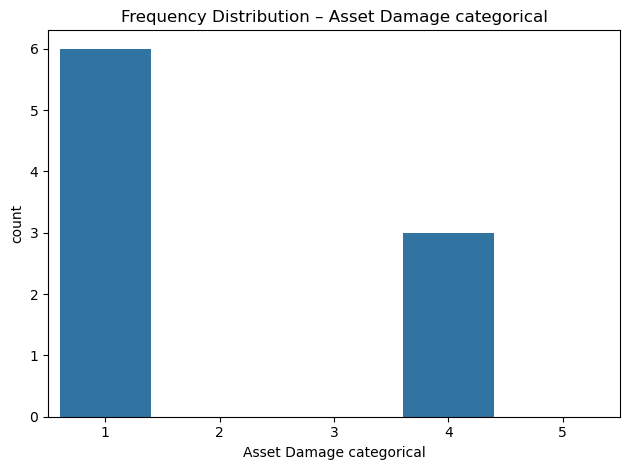

Third Party Damage categorical
4   0.44
1   0.33
3   0.11
5   0.11
Name: proportion, dtype: float64

TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : No
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 0
- Has Legend          : Yes
- Legend Needed       : No
- Grid Density        : 16.0
- Data Ink Ratio      : 0.0

--- Subplot 2 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 9.5
- Data Ink Ratio      : 0.0012



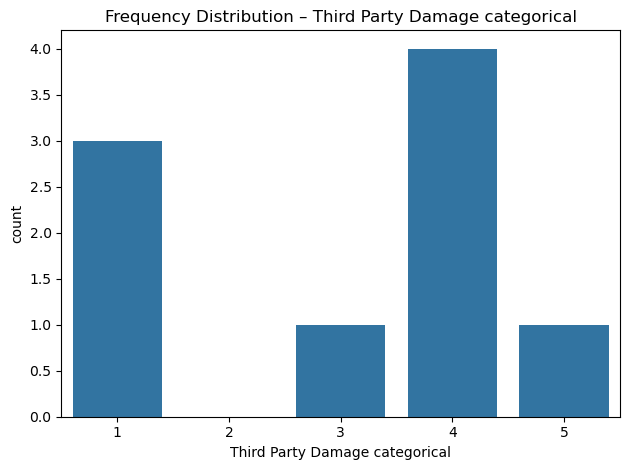

Third Party Injury (<=250k) categorical
1   0.56
4   0.22
3   0.22
Name: proportion, dtype: float64

TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : No
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 0
- Has Legend          : Yes
- Legend Needed       : No
- Grid Density        : 16.0
- Data Ink Ratio      : 0.0

--- Subplot 2 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 9.5
- Data Ink Ratio      : 0.0012



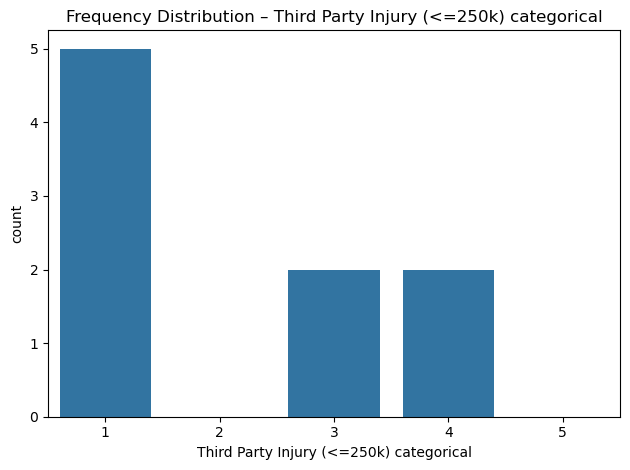

Third Party Injury (>250k) categorical
4   0.89
3   0.11
Name: proportion, dtype: float64

TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : No
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 0
- Has Legend          : Yes
- Legend Needed       : No
- Grid Density        : 16.0
- Data Ink Ratio      : 0.0

--- Subplot 2 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 9.5
- Data Ink Ratio      : 0.0012



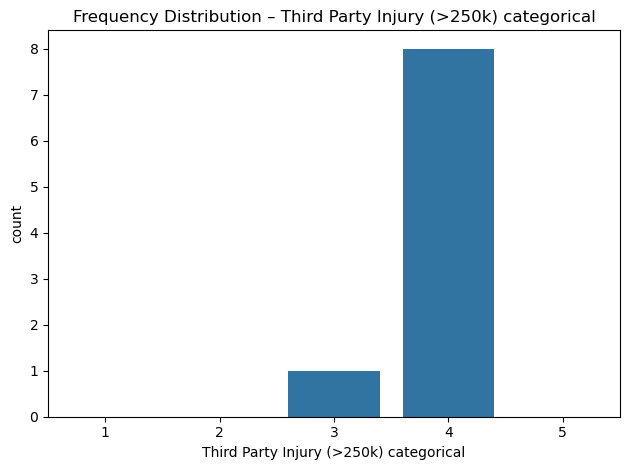

In [673]:
for i in categorical:
    #normalize = True to get absolute frequencies
    b = df_main_ordinal[i].value_counts(normalize=True)
    sns.countplot(x=i, data=df_main_ordinal, order=[1, 2, 3, 4, 5])
    plt.title(f'Frequency Distribution – {i}')
    print(b)
    axes, metrics_report = turf([ax1, ax2], title=f'Frequency Distribution – {i}', return_metrics=True)
    plt.show()

since the data is ordinal median, mode, and percentiles can be analized

In [674]:
categorical = ['Asset Damage categorical', 'Third Party Damage categorical', 'Third Party Injury (<=250k) categorical', 'Third Party Injury (>250k) categorical']
cat_stats_list = ['median', lambda x: x.mode().iloc[0] if not x.mode().empty else np.nan, lambda x: x.quantile(0.25),lambda x: x.quantile(0.75)]
df_statistics_pre = df_main_ordinal[categorical].agg(cat_stats_list).T
new_col_names = ['median', 'mode', 'q25', 'q75']
df_statistics_pre.columns = new_col_names
df_statistics_pre.index.name = 'Feature'
df_statistics_pre = df_statistics_pre.reset_index() 
df_statistics_pre

,Feature,median,mode,q25,q75
0,Asset Damage categorical,1.00,1.00,1.00,4.00
1,Third Party Damage categorical,4.00,4.00,1.00,4.00
2,Third Party Injury (<=250k) categorical,1.00,1.00,1.00,3.00
3,Third Party Injury (>250k) categorical,4.00,4.00,4.00,4.00


In [675]:
df_statistics = pd.concat([df_statistics, df_statistics_pre], ignore_index=True) 
df_statistics

,Feature,mean,min,max,std,median,mode,q25,q75,range,skew,kurtosis,var,Distribution
0,Vehicles Licenced,2848978.89,2624958.00,3143356.00,164374.31,2860984.00,2624958.00,2717722.00,2919005.00,518398.00,0.32,-0.73,27018913963.11,Negative binomial
1,Km Driven - (MM),45694.22,36237.00,48754.00,4049.24,47296.00,36237.00,47072.00,47604.00,12517.00,-1.68,1.37,16396355.60,Beta
2,Premiums (€),340986376.61,296050495.60,395235230.40,33193038.29,334585248.00,296050495.60,330167746.20,339774078.00,99184734.80,0.70,-0.55,1101777790900174.12,Log-Normal
3,Fixed Charges (€),297444.33,273241.00,320350.00,14777.26,295457.00,273241.00,291217.00,309086.00,47109.00,-0.06,-0.83,218367424.75,Log-Normal
4,Asset Damage,142185397.09,98637367.13,208850392.30,44729008.38,118590016.70,98637367.13,111319504.10,195815056.40,110213025.17,0.63,-1.44,2000684190666531.50,Beta
5,Third Party Damage,86691402.07,60956202.28,117935076.50,21200085.94,79791184.19,60956202.28,70852196.12,111394939.50,56978874.22,0.46,-1.39,449443644008241.25,Beta
6,Third Party Injury (<=250k),303492629.44,240175216.00,371932928.60,56620282.35,281393289.10,240175216.00,258172667.00,353502069.40,131757712.60,0.15,-1.81,3205856373367222.00,Log-Normal
7,Third Party Injury (>250k),150286140.34,131662173.50,167725675.30,12229193.09,149246404.20,131662173.50,142081458.50,160289903.40,36063501.80,0.00,-1.25,149553163663704.09,Log-Normal
8,Direct_0_10000,8520709.98,6978455.45,11004433.36,1255752.82,8488453.94,6978455.45,7774558.04,9139722.74,4025977.91,0.57,-0.19,1576915157465.49,Beta
9,Direct_10001_15000,12215040.96,4573088.63,19902288.33,5343380.83,12951653.31,4573088.63,7246152.25,15965012.50,15329199.69,-0.12,-1.33,28551718706583.94,Beta


a code is going to be written to interpretate all data above

### Statistics analysis

In [676]:
analysis = []
for index, row in df_statistics.iterrows():
    feature = row['Feature']
    mean_an = row['mean']
    is_numeric = isinstance(mean_an, (int, float)) or pd.isna(mean_an)
    if not is_numeric or pd.isna(mean_an):
        a = 'Ordinal/Categorical Variable'
        b = 'Ordinal/Categorical Variable'
        c = 'Ordinal/Categorical Variable'
        d = 'Ordinal/Categorical Variable'
        cv = 'Ordinal/Categorical Variable'
    else:
        median_an = row['median']
        delta = mean_an - median_an
        if delta > 0:
            a = 'Positive Skew'
        elif delta < 0:
            a = 'Negative Skew'
        else:
            a = 'Symetric'
        skew_an = row['skew']
        if skew_an > 0.5:
            b = 'Right Skew (Long Tail to Right)'
        elif skew_an < -0.5:
            b = 'Left Skew (Long tail to left)'
        else:
            b = 'Symetric'
        kurt_an = row['kurtosis']
        if kurt_an > 0.5:
            c = 'Leptokurtic'
        elif kurt_an < 0.5:
            c = 'Platikurtic'
        else:
            c = 'Mesokurtic' 
        std_an = row['std']
        #Coefficient of variation
        cv = std_an/mean_an
        median_an = row['median']
        mode_an = row['mode']
        if mode_an < median_an:
            d = 'Data peak is left of the center'
        elif mode_an > median_an:
            d = 'Data peak is right of the center'
        else: 
            d = 'The most common value is the exact center'
        
    analysis.append([feature, a, b, c, d, cv])
analysis_df = pd.DataFrame(analysis, columns=['Feature', 'Skew from center', 'Skew from value', 'Kurtosis interpretation', 'Mode-Median', 'Coefficient of variation'])
analysis_df = analysis_df.merge(df_statistics[['Feature','Distribution']], on='Feature', how='left') 
analysis_df        

,Feature,Skew from center,Skew from value,Kurtosis interpretation,Mode-Median,Coefficient of variation,Distribution
0,Vehicles Licenced,Negative Skew,Symetric,Platikurtic,Data peak is left of the center,0.06,Negative binomial
1,Km Driven - (MM),Negative Skew,Left Skew (Long tail to left),Leptokurtic,Data peak is left of the center,0.09,Beta
2,Premiums (€),Positive Skew,Right Skew (Long Tail to Right),Platikurtic,Data peak is left of the center,0.10,Log-Normal
3,Fixed Charges (€),Positive Skew,Symetric,Platikurtic,Data peak is left of the center,0.05,Log-Normal
4,Asset Damage,Positive Skew,Right Skew (Long Tail to Right),Platikurtic,Data peak is left of the center,0.31,Beta
5,Third Party Damage,Positive Skew,Symetric,Platikurtic,Data peak is left of the center,0.24,Beta
6,Third Party Injury (<=250k),Positive Skew,Symetric,Platikurtic,Data peak is left of the center,0.19,Log-Normal
7,Third Party Injury (>250k),Positive Skew,Symetric,Platikurtic,Data peak is left of the center,0.08,Log-Normal
8,Direct_0_10000,Positive Skew,Right Skew (Long Tail to Right),Platikurtic,Data peak is left of the center,0.15,Beta
9,Direct_10001_15000,Negative Skew,Symetric,Platikurtic,Data peak is left of the center,0.44,Beta


### Statistics interpretation

In [677]:
distribution_list = analysis_df['Distribution'].unique().tolist()
distribution_list

['Negative binomial',
 'Beta',
 'Log-Normal',
 'poisson',
 'binom',
 'nbinom',
 'geom',
 'Binomial',
 nan]

In [678]:
stat_temp = df_statistics.merge(analysis_df[['Feature', 'Coefficient of variation']], on='Feature', how='left')
models_template = {'Negative binomial': 'Negative binomial regression / Bayesian count models','Beta': 'Beta regression / Tree-based proportion models',
                   'Log-Normal': 'Log-normal regression / Transformed-normal regression', 'poisson': 'Poisson regression / Poisson likelihood model',
                   'Poisson': 'Poisson regression / Poisson likelihood model', 'binom': 'Binomial regression / Logistic regression (binary)', 
                   'Binomial': 'Binomial regression / Logistic regression (binary)', 'nbinom': 'Negative binomial regression / Bayesian count models',
                   'geom': 'Geometric count regression'}
interpretation = []
for index, row in stat_temp.iterrows():
    feature = row['Feature']
    cv = row['Coefficient of variation']
    skew = row['skew']
    distribution = row['Distribution']
    # declate interpretation variables
    conclusion = ''
    model_suggestion = ''
    if cv == 'Ordinal/Categorical Variable':
        conclusion = 'Data needs to be encoded, use data from frequency analysis'
    else:
        if cv >= .3:
            conclusion =  'Highly disperse data. It can be unpredictible.'
            if skew > .5:
                conclusion += 'Skew value indicates a big number of outliers in the data'
            elif skew < -.5:
                conclusion += 'Data clustering can be pulling down the mean' 
            else:
                conclusion += 'Approximately symmetric spread of data'
        elif cv >= .1:
            conclusion = 'There is a noticeable variation on the data.'
            if skew > .5:
                conclusion += 'outliers might have am influencing on the mean. I chart is needed to check if there is a change on the trend'
            elif skew < -.5:
                conclusion += 'clustering of values at the high end, with extreme low-value outliers pulling the mean down.' 
            else:
                conclusion += 'symmetry suggest predictivility.'
        else:
            conclusion = 'Reliable feature, data is concentrated around the mean. Skew analysis is skept due to the great quality of data.'
    model_suggestion = models_template.get(distribution, 'No direct model suggestion found')
    interpretation.append({'Feature': feature, 'Distribution': distribution,'Conclusion': conclusion, 'Suggested model': model_suggestion})
interpretation_df = pd.DataFrame(interpretation)
interpretation_df

,Feature,Distribution,Conclusion,Suggested model
0,Vehicles Licenced,Negative binomial,"Reliable feature, data is concentrated around ...",Negative binomial regression / Bayesian count ...
1,Km Driven - (MM),Beta,"Reliable feature, data is concentrated around ...",Beta regression / Tree-based proportion models
2,Premiums (€),Log-Normal,"Reliable feature, data is concentrated around ...",Log-normal regression / Transformed-normal reg...
3,Fixed Charges (€),Log-Normal,"Reliable feature, data is concentrated around ...",Log-normal regression / Transformed-normal reg...
4,Asset Damage,Beta,Highly disperse data. It can be unpredictible....,Beta regression / Tree-based proportion models
5,Third Party Damage,Beta,There is a noticeable variation on the data.sy...,Beta regression / Tree-based proportion models
6,Third Party Injury (<=250k),Log-Normal,There is a noticeable variation on the data.sy...,Log-normal regression / Transformed-normal reg...
7,Third Party Injury (>250k),Log-Normal,"Reliable feature, data is concentrated around ...",Log-normal regression / Transformed-normal reg...
8,Direct_0_10000,Beta,There is a noticeable variation on the data.ou...,Beta regression / Tree-based proportion models
9,Direct_10001_15000,Beta,Highly disperse data. It can be unpredictible....,Beta regression / Tree-based proportion models


### Statistics actionables

In [679]:
actionables = []
for index, row in stat_temp.iterrows():
    feature = row['Feature']
    cv = row['Coefficient of variation']
    skew = row['skew']
    kurtosis = row['kurtosis']
    if pd.isna(cv):
        next_step = 'Use data from the encoding map (ordinal_map) from previos stages'
    else:
        if skew > .7:
            next_step = 'I charts are going to be used to confirm if outliers are indicating a trend shift. In this cases a moving average might be used for modeling' 
        elif skew < -.7:
            next_step = 'Cross-check raw data to identify miscalculations' 
        elif kurtosis > 1:
            next_step = 'High Kurtosis might negatively impact model performance. Consider data transformation' 
        elif kurtosis < 1:
            next_step = 'Low kurtosis might cause model overestimation of tail values. Consider scaling'
        else:
            next_step = 'No further action needed'
        actionables.append({'Feature': feature, 'Next Step': next_step})
df_actionable =  pd.DataFrame(actionables) 
df_actionable

,Feature,Next Step
0,Vehicles Licenced,Low kurtosis might cause model overestimation ...
1,Km Driven - (MM),Cross-check raw data to identify miscalculations
2,Premiums (€),Low kurtosis might cause model overestimation ...
3,Fixed Charges (€),Low kurtosis might cause model overestimation ...
4,Asset Damage,Low kurtosis might cause model overestimation ...
5,Third Party Damage,Low kurtosis might cause model overestimation ...
6,Third Party Injury (<=250k),Low kurtosis might cause model overestimation ...
7,Third Party Injury (>250k),Low kurtosis might cause model overestimation ...
8,Direct_0_10000,Low kurtosis might cause model overestimation ...
9,Direct_10001_15000,Low kurtosis might cause model overestimation ...


### I Charts

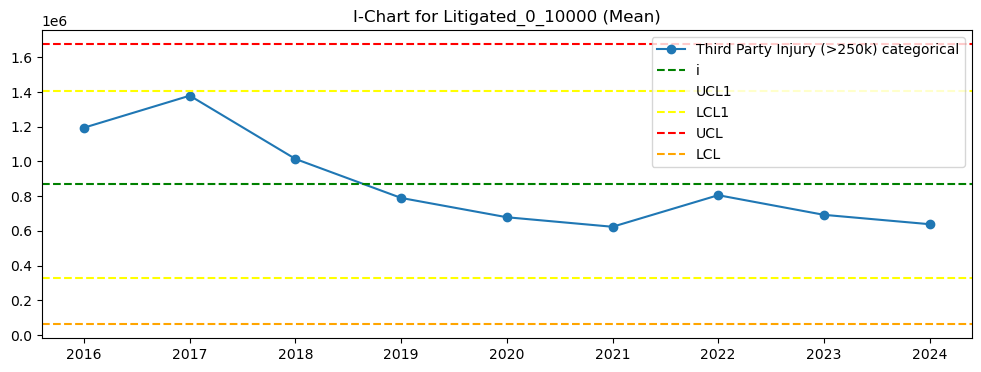

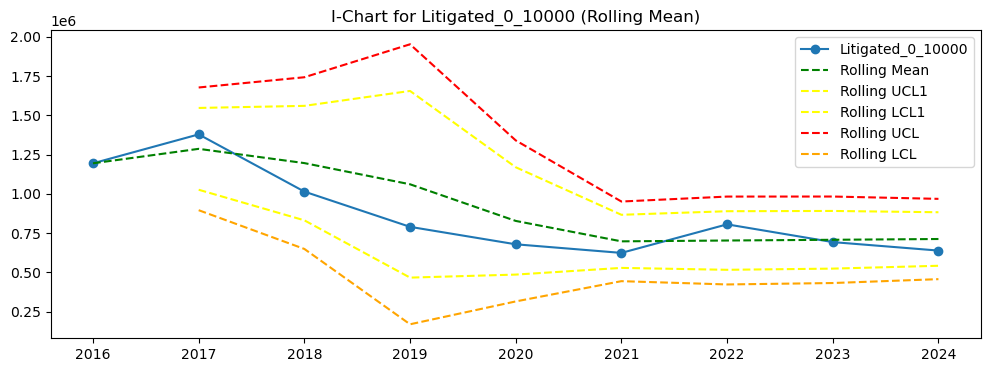

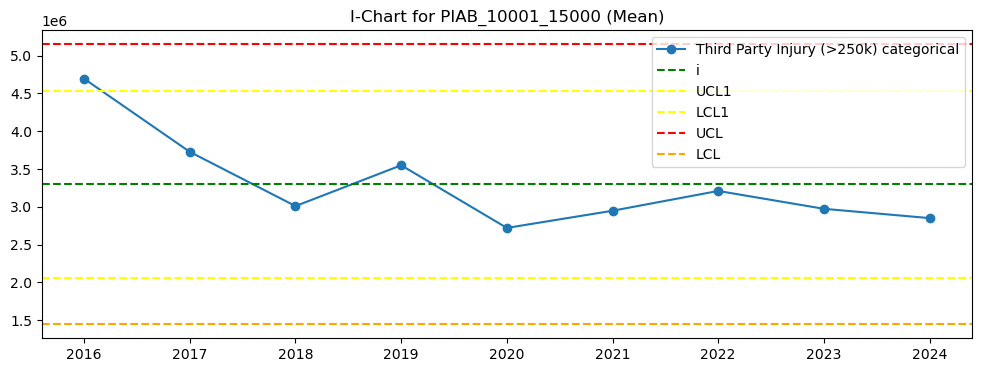

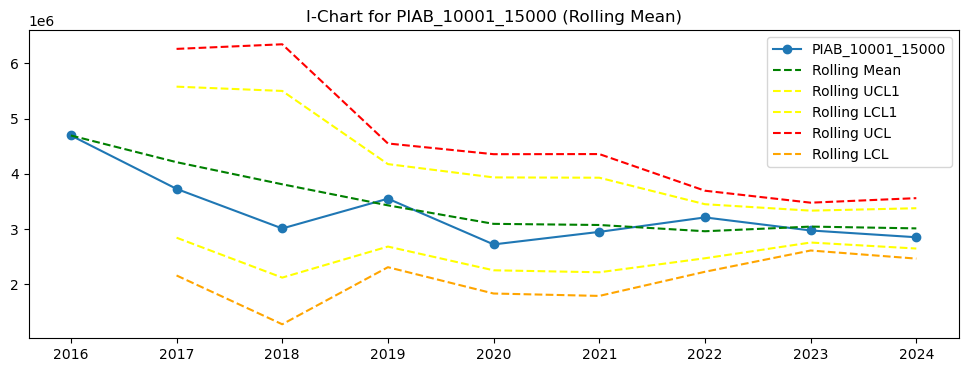

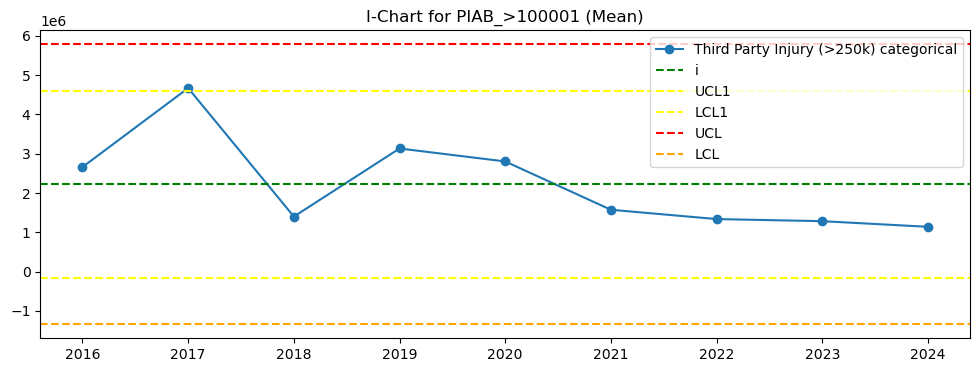

...

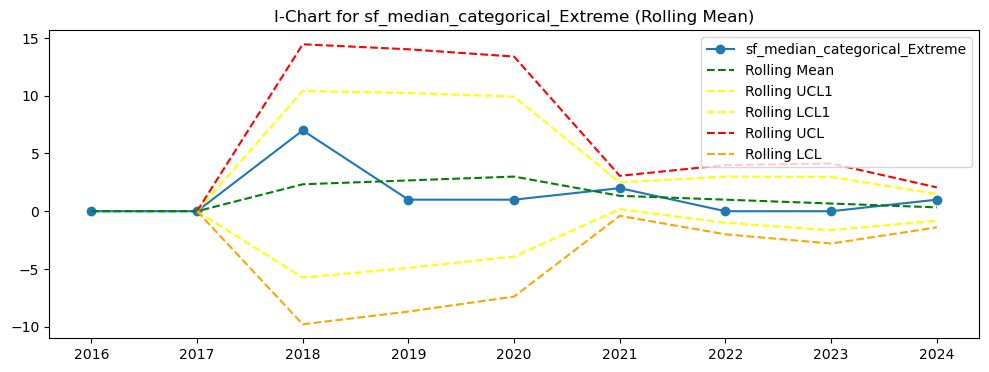

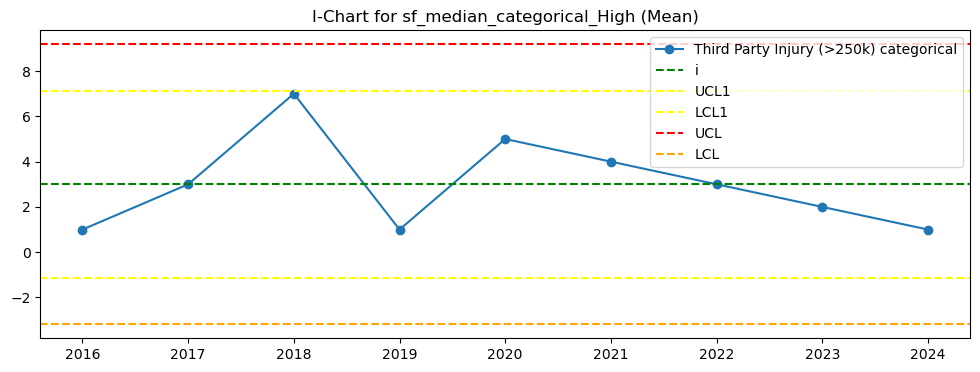

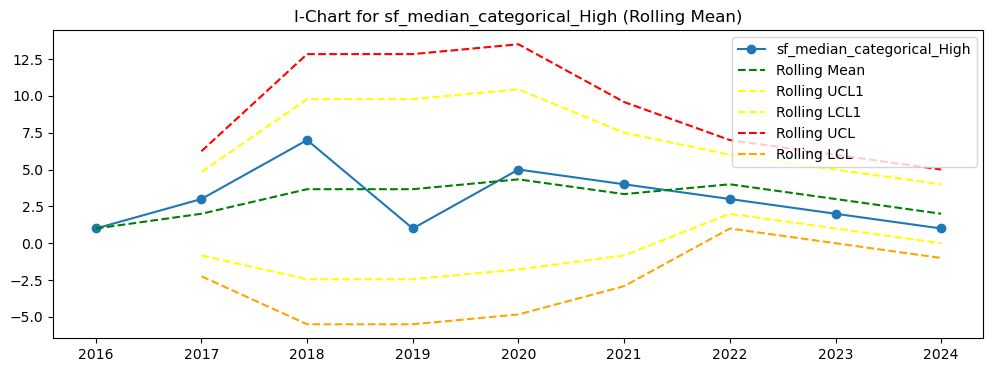

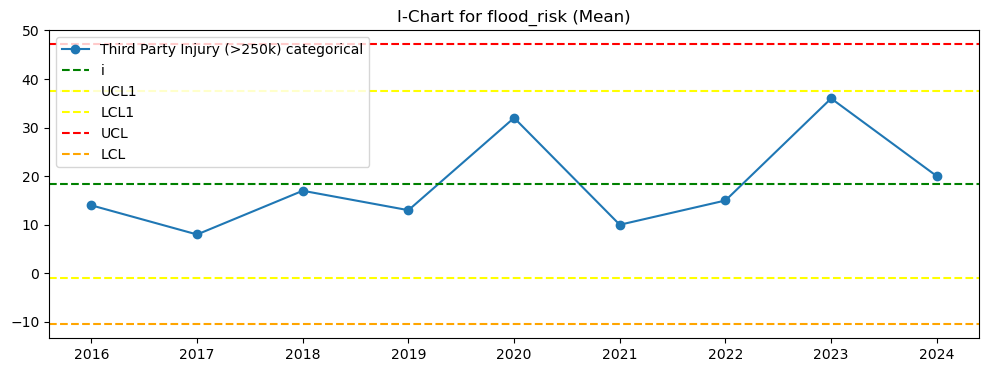

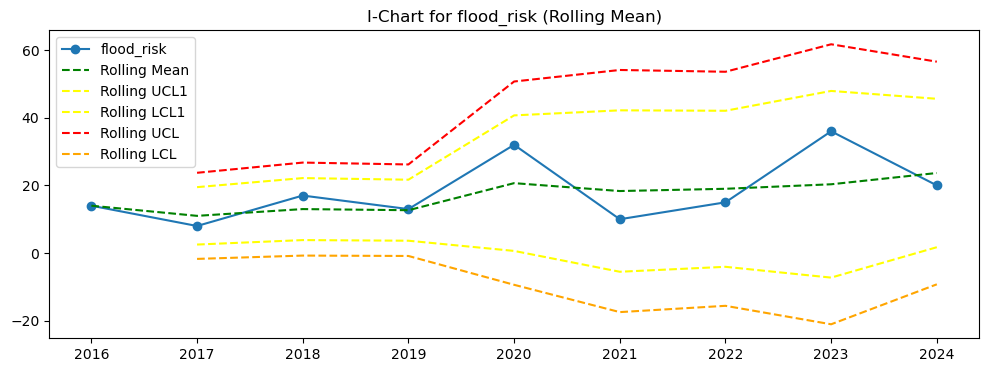

In [680]:
query = 'I charts are going to be used to confirm if outliers are indicating a trend shift. In this cases a moving average might be used for modeling' 
chart = df_actionable[df_actionable['Next Step'].str.contains(query, case=False)]
chart_list = chart['Feature'].tolist()
ichart_temp = df_main.copy() 

for i in chart_list:
    data = ichart_temp[i]
    year = ichart_temp['Year']
    # Standard I-chart using mean 
    mean = data.mean()
    std = data.std()
    ucl = mean + 3*std
    ucl1 = mean + 2*std
    lcl = mean - 3*std
    lcl1 = mean - 2*std
    plt.figure(figsize=(12, 4))
    plt.plot(year, data, marker='o', label=feature)
    plt.axhline(mean, color='green', linestyle='--', label='i')
    plt.axhline(ucl1, color='yellow', linestyle='--', label='UCL1')
    plt.axhline(lcl1, color='yellow', linestyle='--', label='LCL1')
    plt.axhline(ucl, color='red', linestyle='--', label='UCL')
    plt.axhline(lcl, color='orange', linestyle='--', label='LCL')
    plt.title(f'I-Chart for {i} (Mean)')
    plt.legend()
    plt.show()

    # Ichart using rolling/moving average
    # axhline function is designed to draw a perfectly straight,line across the entire plot at a single, fixed Y-value. it cannot be used for moving 
    # averages
    window_size = 3  
    rolling_mean = data.rolling(window=window_size, min_periods=1).mean()
    rolling_std = data.rolling(window=window_size, min_periods=1).std()
    rolling_ucl = rolling_mean + 3*rolling_std
    rolling_ucl1 = rolling_mean + 2*rolling_std
    rolling_lcl = rolling_mean - 3*rolling_std
    rolling_lcl1 = rolling_mean - 2*rolling_std
    plt.figure(figsize=(12, 4))
    plt.plot(year, data, marker='o', label=i)
    plt.plot(year, rolling_mean, color='green', linestyle='--', label='Rolling Mean')
    plt.plot(year, rolling_ucl1, color='yellow', linestyle='--', label='Rolling UCL1')
    plt.plot(year, rolling_lcl1, color='yellow', linestyle='--', label='Rolling LCL1')
    plt.plot(year, rolling_ucl, color='red', linestyle='--', label='Rolling UCL')
    plt.plot(year, rolling_lcl, color='orange', linestyle='--', label='Rolling LCL')
    plt.title(f'I-Chart for {i} (Rolling Mean)')
    plt.legend()
    plt.show()
    


As it can be noticed, most of the I charts identify a shift in the trend (uptrending or downtrending).
<p>For sf_median_categorical_ high and sf_median_categorical_extream, a special cause can be identify without a change in the trend.</p>
<p>This case is not going to be excluded since winter storms are cyclical factors, and events as the Beast From the East in 2018 happends from time to time</p>
<p>Outliear are not going to be modified for this category, so capping process is excluded from this analysis</p>

Low kurtosis might cause model overestimation of tail values. Consider scaling. For this category, it is going to be analyzed if transform the data is needed using Q-Q plots. this tool is selected instead of histograms given that histograms just give an idea of skewness that is needed to transform, while Q-Q plots shows how far away from a line representing normality the data is.

In [681]:
distis = interpretation_df['Distribution'].unique().tolist()
distis

['Negative binomial',
 'Beta',
 'Log-Normal',
 'poisson',
 'binom',
 'nbinom',
 'geom',
 'Binomial',
 nan]

### QQ Plot - rescaling

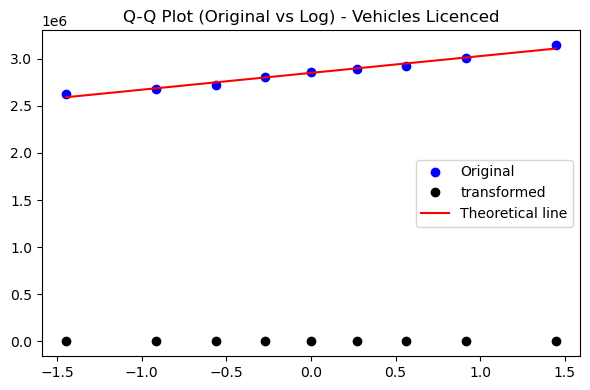

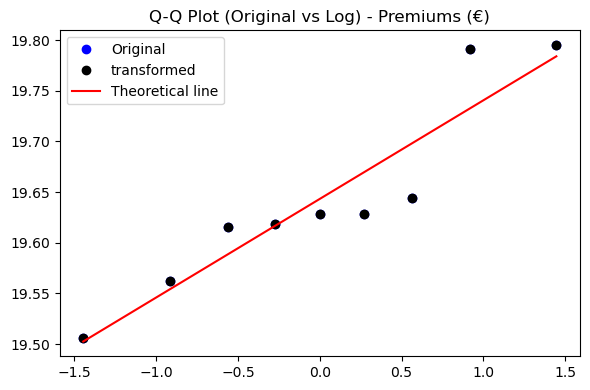

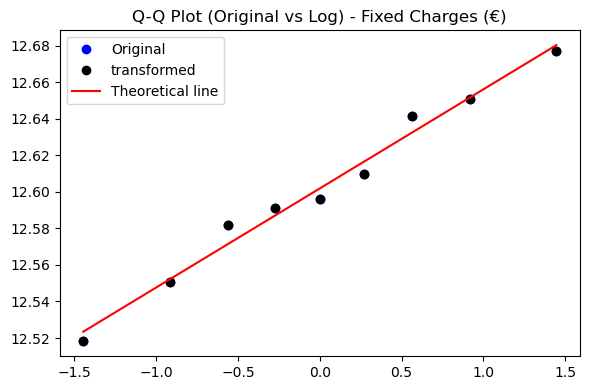

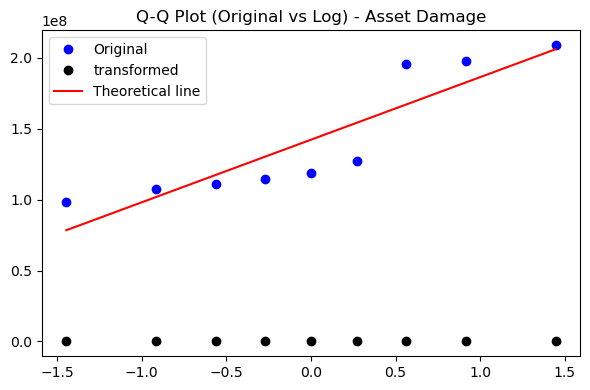

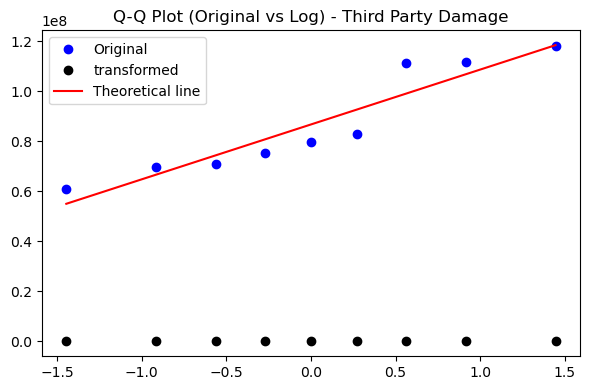

...

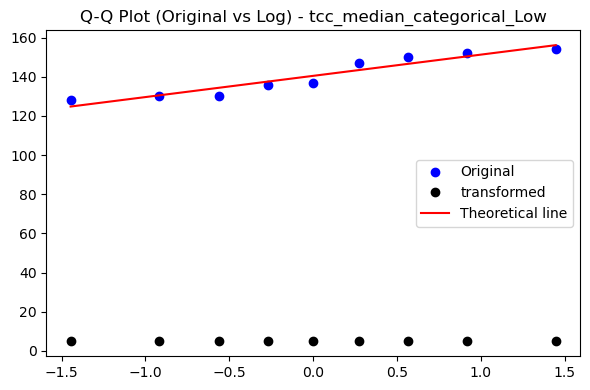

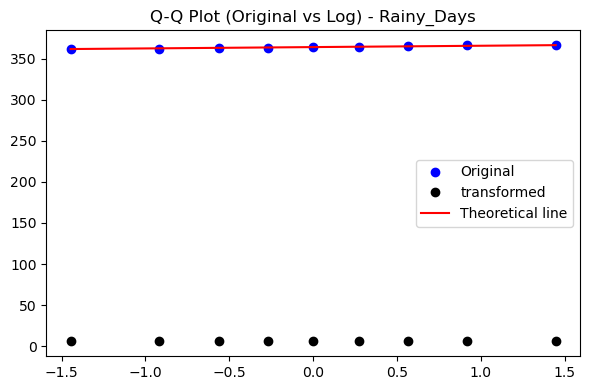

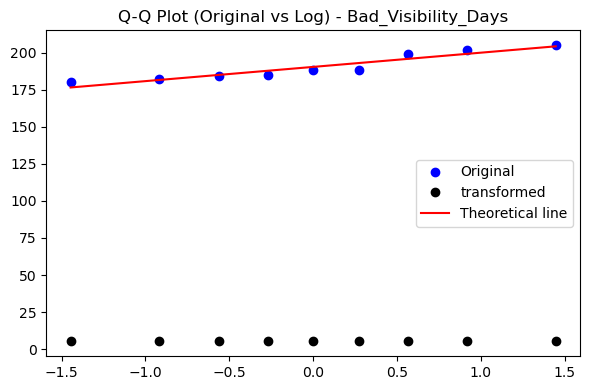

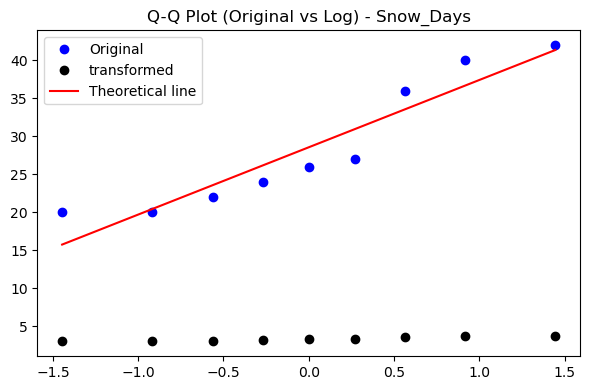

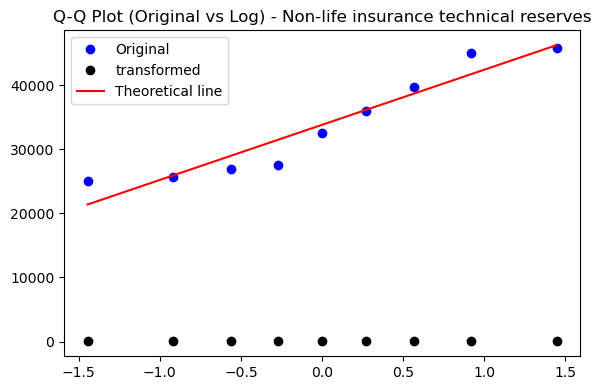

In [682]:
import scipy.stats as stats
query = 'Low kurtosis might cause model overestimation of tail values. Consider scaling' 
chart = df_actionable[df_actionable['Next Step'].str.contains(query, case=False)]
qq_list = chart['Feature'].tolist()
qq_temp = df_main.copy() 
for i in qq_list:
    data = qq_temp[i]
    distribution = interpretation_df.loc[interpretation_df['Feature'] == i, 'Distribution'].values[0]
    # data transformation. due to the distribution types in distis, only log-norm can be transformed
    if distribution in ['Log-Normal']:
        if data.min() > 0:
            a = np.log(data)
        else:
            a = np.log1p(data)
    else:
        a = data
    #transformation for comparison purposes
    if data.min() > 0:
        log_data = np.log(data)
    else:
        log_data = np.log1p(data)
    (theoretical_reg, sample_reg), (slope_reg, intercept_reg, r_reg) = stats.probplot(a, dist='norm', plot=None)
    (theoretical_log, sample_log), _ = stats.probplot(log_data, dist='norm', plot=None)
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.plot(theoretical_reg, sample_reg, 'o', color='blue', label='Original')
    ax.plot(theoretical_log, sample_log, 'o', color='black', label='transformed')
    ax.plot(theoretical_reg, slope_reg*theoretical_reg + intercept_reg, 'r-', label='Theoretical line')
    ax.set_title(f'Q-Q Plot (Original vs Log) - {i}')
    ax.legend()
    plt.tight_layout()
    plt.show()

based on the findings of Q-Q plot. some features are going to be log-transformed. the features are the following:
1. Premiums (€)
2. Fixed Charges (€) 
3. Third Party Injury (<=250K)
4. Third Party Injury (>250K)
<p>In the variable transformation section categorical values (change to ordinals) and these features are going to be transformed for modeling purposes</p>

### Descrete Distributions

in this section Poisson and binomial distributions are going to be analized to identify relevant information of the dataset

### Poisson

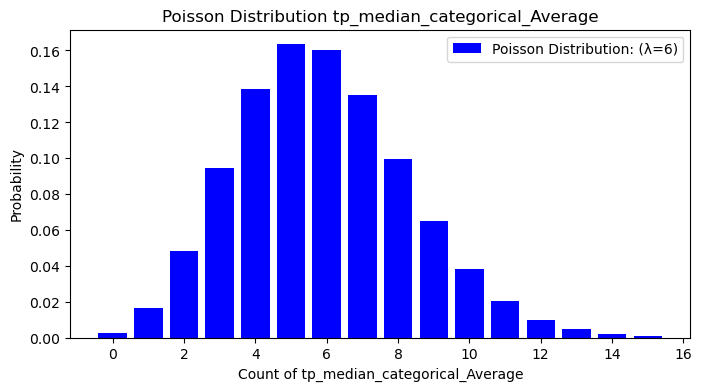

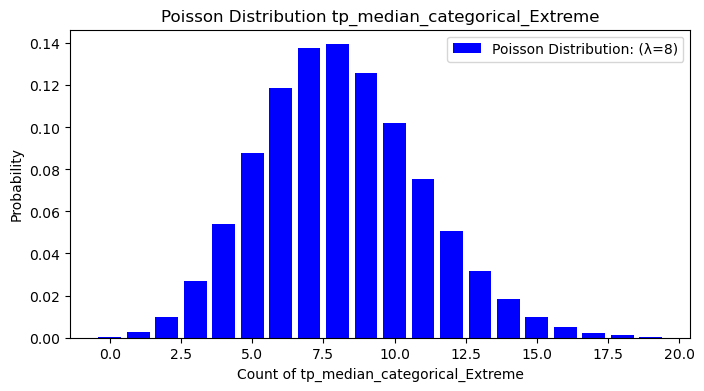

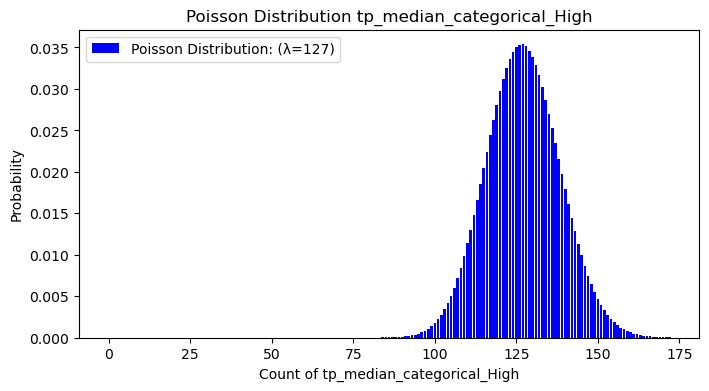

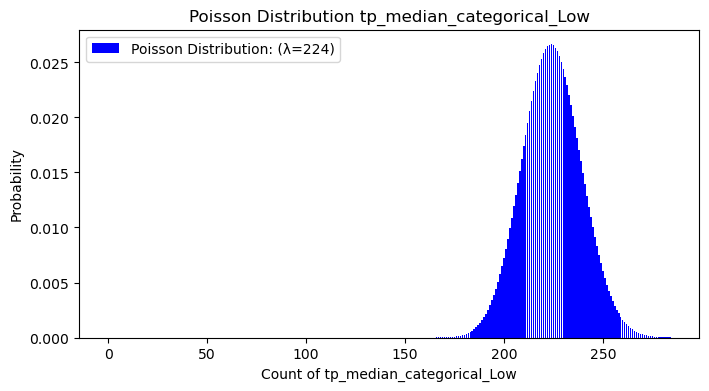

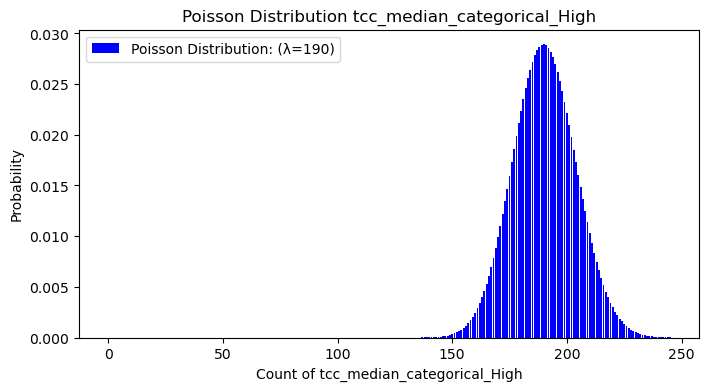

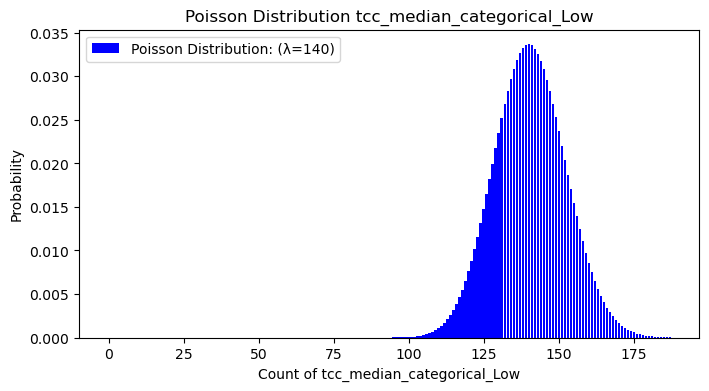

In [689]:
from scipy.stats import poisson

Poisson = df_main.copy() 
lists = df_actionable['Feature'].tolist()
results =[]
for i in lists:
    data = Poisson[i]
    distribution = interpretation_df.loc[interpretation_df['Feature'] == i, 'Distribution'].values[0]
    # data transformation. due to the distribution types in distis, only log-norm can be transformed
    if distribution == 'poisson':
        mean = data.mean()
        n = 365
        p = mean/n
        lambda_poisson = n*p
        k_max = max(int(lambda_poisson + 4*np.sqrt(lambda_poisson)), data.max()) 
        k = np.arange(0, k_max + 1)
        pmf = poisson.pmf(k, mu=lambda_poisson)
        plt.figure(figsize=(8,4))
        plt.bar(k, pmf, color='blue', label=f'Poisson Distribution: (λ={lambda_poisson:.0f})')
        plt.xlabel(f'Count of {i}')
        plt.ylabel('Probability')
        plt.title(f'Poisson Distribution {i}')
        plt.legend()
        plt.show()    

it can be seen in many plots that there's a mismatch between visual representation (Poisson is not fitting) vs AIC assessment. Poisson asumes an equidispersion, variance to mean ratio is going to help us to reasing poisson distributions properly.

In [688]:
Poisson = df_main.copy() 
lists = df_actionable['Feature'].tolist()
results =[]
for i in lists:
    distribution = interpretation_df.loc[interpretation_df['Feature'] == i, 'Distribution'].values[0]
    # data transformation. due to the distribution types in distis, only log-norm can be transformed
    if distribution == 'poisson':
        a = dist_type(Poisson, y_col=i)
        a['Feature'] = i  
        print(f'\n=== Feature: {i} ===')
        print(a[['Distribution', 'AIC', 'BIC', 'LogLik', 'Params']])



=== Feature: tp_median_categorical_Average ===
  Distribution   AIC   BIC  LogLik                  Params
0      poisson 40.78 40.98  -19.39    (5.888888888888889,)
1        binom 43.05 43.44  -19.52  (9, 0.654320987654321)
3         geom 50.29 50.49  -24.15  (0.16981132075471697,)
2       nbinom   NaN   NaN     NaN                    None

=== Feature: tp_median_categorical_Extreme ===
  Distribution   AIC   BIC  LogLik                    Params
0      poisson 45.66 45.86  -21.83       (8.11111111111111,)
1        binom 50.89 51.28  -23.44  (15, 0.5407407407407407)
3         geom 56.52 56.72  -27.26    (0.12328767123287672,)
2       nbinom   NaN   NaN     NaN                      None

=== Feature: tp_median_categorical_High ===
  Distribution    AIC    BIC  LogLik                     Params
0      poisson  70.94  71.14  -34.47      (127.11111111111111,)
1        binom  94.07  94.46  -45.03  (160, 0.7944444444444445)
3         geom 107.14 107.34  -52.57    (0.007867132867132866,)
2  

In [690]:
Poisson = df_main.copy() 
lists = df_actionable['Feature'].tolist()
results =[]
for i in lists:
    distribution = interpretation_df.loc[interpretation_df['Feature'] == i, 'Distribution'].values[0]
    if distribution == 'poisson':
        mean = Poisson[i].mean()
        variance = Poisson[i].var()
        ratio = variance / mean
        if ratio > 1.1:
            new_type = 'nbinom'
        elif ratio < 0.9:
            new_type = 'binomial'
        else:
            new_type = 'poisson'
        results.append(new_type)
print(results)

['binomial', 'poisson', 'nbinom', 'binomial', 'binomial', 'binomial']


As a conclusion, only 1 feature can be analyze as poisson (tp_median_categorical_extreme) all else are going to be considered as the result of the variance to mean ratio requalifies

now it is going to be tested using poisson analysis

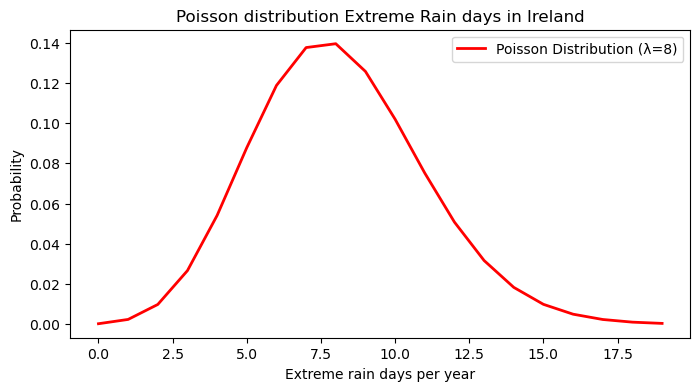

1.0616438356164386


In [696]:
from scipy.stats import poisson
feature = 'tp_median_categorical_Extreme'
df_poisson = Poisson[[feature]]
mean = df_poisson['tp_median_categorical_Extreme'].mean()
std = df_poisson['tp_median_categorical_Extreme'].std()
ratio = df_poisson['tp_median_categorical_Extreme'].var()/mean
# max number of days per year
n = 365
p = mean/n
lambda_poisson = n * p
data_max = int(df_poisson[feature].max())
k_max = int(lambda_poisson + 4 * np.sqrt(lambda_poisson))
k = np.arange(0, k_max + 1)
pmf = poisson.pmf(k, mu=lambda_poisson)
plt.figure(figsize=(8,4))
plt.plot(k, pmf, 'r-', lw=2, label=f'Poisson Distribution (λ={lambda_poisson:.0f})')
plt.xlabel('Extreme rain days per year')
plt.ylabel('Probability')
plt.title('Poisson distribution Extreme Rain days in Ireland')
plt.legend()
plt.show()
print(ratio)

Extream rain days have low probability of occurance based on poisson analysis. There's a probability of 14% of having 8 days of extream rain in ireland (above 3std  of the mean of rain in all the Irish territory). The probability quicly dropls having less than 5% of chances of having more than 12 days or less than 5.

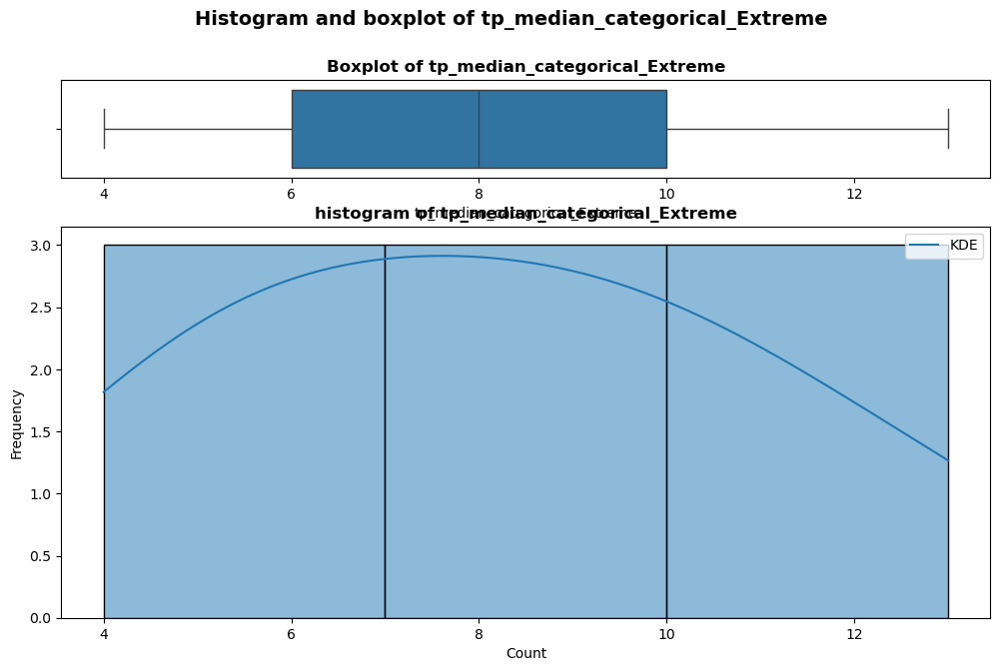

(<Figure size 1200x700 with 2 Axes>,
 (<Axes: title={'center': 'Boxplot of tp_median_categorical_Extreme'}, xlabel='tp_median_categorical_Extreme'>,
  <Axes: title={'center': 'histogram of tp_median_categorical_Extreme'}, xlabel='Count', ylabel='Frequency'>))

In [697]:
plot_histo(df_poisson, y_col='tp_median_categorical_Extreme' )

As it can be noticed, that the range .09-1.1 used to define poisson distributions is wider than it should be used. a Ratio of 1.06 fits in a grey area which fits poisson (AIC mislead this assumption too), but it breaks based on 3 arguments:
1. Kurtosis provides a platikurtic shape (as calculated in the statistical analysis) which makes Poisson rigid shape unfitable
2. The High Coefficient of dispersion makes data highly disperse.
3. low skewness which provides a symmetric spread of data (it can be noticiable in the box plot too)

Negative binomial should have been the distribution of choice for this distribution. it's going to be confirmed using 

large sample size - Poisson 

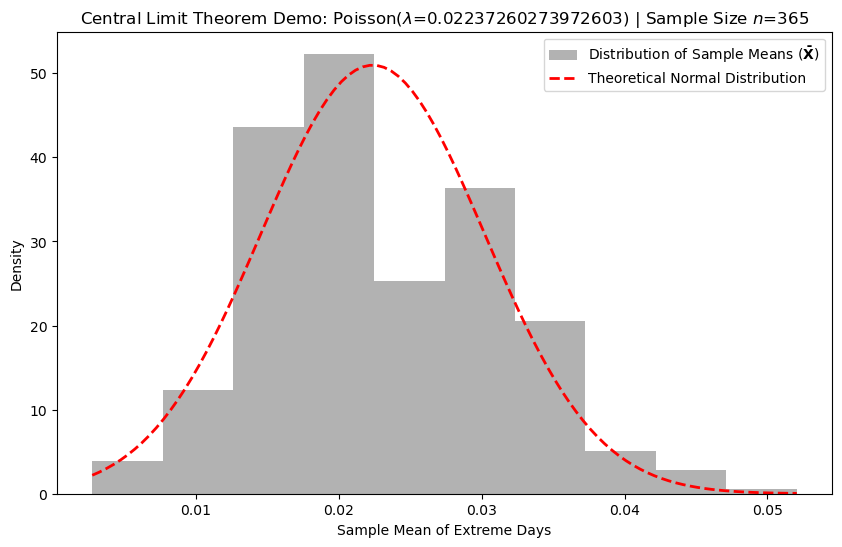

In [714]:
from scipy.stats import poisson, norm
#chosen as the highest probability for the distribution
#independet observations of the annual process, it doesn't mean 1000 years 
sample = 1000
sample_size = 365
mean_o = df_poisson['tp_median_categorical_Extreme'].mean()
std_o = df_poisson['tp_median_categorical_Extreme'].std()
lambda_poissoni= df_poisson['tp_median_categorical_Extreme'].mean()
sample_means = []
#simulate poisson
for _ in range(sample):
    sample_r = poisson.rvs(mu=lambda_poisson, size=sample_size)
    sample_means.append(np.mean(sample_r))
sample_means = np.array(sample_means)
clt_mean = lambda_poisson
clt_std = np.sqrt(lambda_poisson) / np.sqrt(sample_size)
plt.figure(figsize=(10, 6))
plt.hist(sample_means, density=True, alpha=0.6, color='gray', label='Distribution of Sample Means ($\mathbf{\\bar{X}}$)')
x = np.linspace(sample_means.min(), sample_means.max(), 100)
pdf_normal_clt = norm.pdf(x, loc=clt_mean, scale=clt_std)
plt.plot(x, pdf_normal_clt, 'r--', lw=2, label='Theoretical Normal Distribution')
plt.title(f'Central Limit Theorem Demo: Poisson($\lambda$={lambda_poisson}) | Sample Size $n$={sample_size}')
plt.xlabel('Sample Mean of Extreme Days')
plt.ylabel('Density')
plt.legend()
plt.show()


When the Poisson parameter lambda (which is both the mean and variance) becomes large, the Poisson distribution approaches a Normal distribution.as noticed in the graphic normal approximation plot fits the normal distriution, as stated by the definition.
central limit theorem is confirmed for poisson

### Binomial

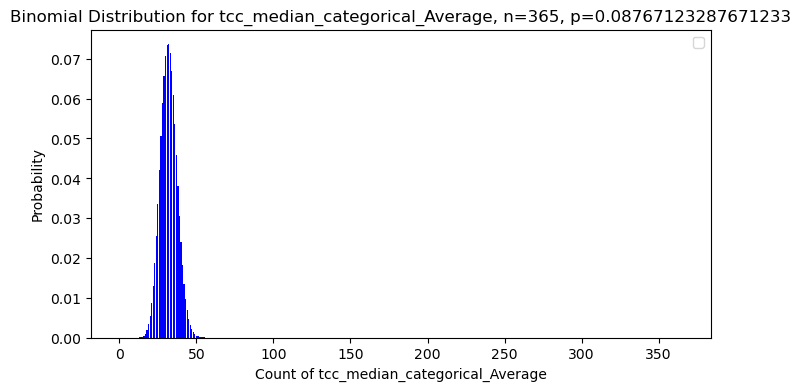

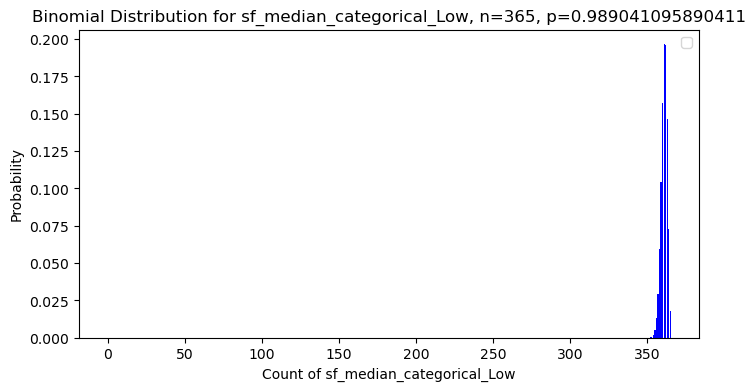

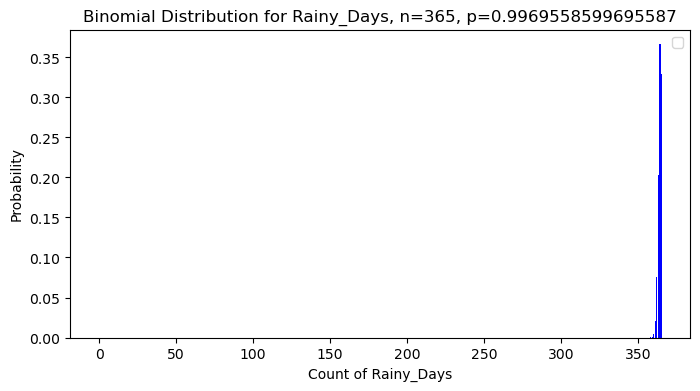

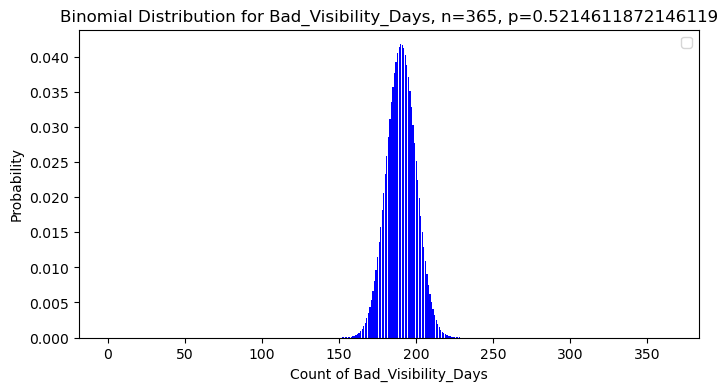

In [711]:
from scipy.stats import binom
Binomial = df_main.copy() 
lists = df_actionable['Feature'].tolist()
for i in lists:
    data = Binomial[i]
    distribution = interpretation_df.loc[interpretation_df['Feature'] == i, 'Distribution'].values[0]
    if distribution == 'binom' or distribution == 'Binomial' or distribution == 'binomial':
        n = 365
        # p is needed to be transformed.. data is highly concentrated (unless weather goes crazy, and that's not the analysis here) 
        p = data.mean() / n
        k = np.arange(0, n + 1)
        pmf = binom.pmf(k, n, p)
        plt.figure(figsize=(8,4))
        plt.bar(k, pmf, color='blue')
        plt.xlabel(f'Count of {i}')
        plt.ylabel('Probability')
        plt.title(f'Binomial Distribution for {i}, n={n}, p={p}')
        plt.legend()
        plt.show()    

in order to have a better perspective of the graphics, and identify potential AIC mismatch, var to mean ratio is going to be executed

In [712]:
Binomial = df_main.copy() 
lists = df_actionable['Feature'].tolist()
results =[]
for i in lists:
    distribution = interpretation_df.loc[interpretation_df['Feature'] == i, 'Distribution'].values[0]
    if distribution == 'binom' or distribution == 'Binomial' or distribution == 'binomial':
        mean = Poisson[i].mean()
        variance = Poisson[i].var()
        ratio = variance / mean
        if ratio > 1.05:
            new_type = 'nbinom'
        elif ratio < 0.95:
            new_type = 'binomial'
        else:
            new_type = 'poisson'
        results.append(new_type)
print(results)

['binomial', 'binomial', 'binomial', 'binomial']


Binomial analysis

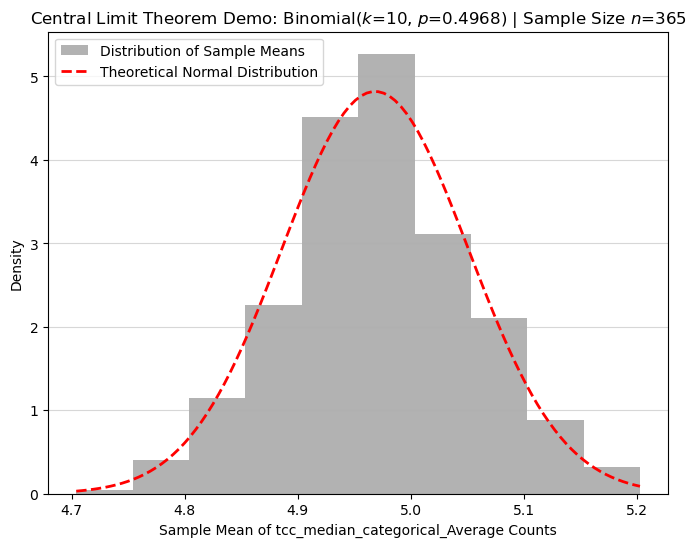

In [719]:
np.random.seed(42)
k_trials = 10
observed = binom.rvs(n=k_trials, p=0.5, size=10000)
df = pd.DataFrame({'tcc_median_categorical_Average': observed})
feature = 'tcc_median_categorical_Average'
mean_o = df[feature].mean()
p_success = mean_o / k_trials
sample = 1000 
sample_size = 365
clt_mean = mean_o
clt_std = np.sqrt(k_trials * p_success * (1 - p_success)) / np.sqrt(sample_size)
sample_means = []
for _ in range(sample):
    sample_r = binom.rvs(n=k_trials, p=p_success, size=sample_size)
    sample_means.append(np.mean(sample_r)) 
sample_means = np.array(sample_means)
plt.figure(figsize=(8, 6))
plt.hist(sample_means, density=True, alpha=0.6, color='grey', label='Distribution of Sample Means')
x = np.linspace(sample_means.min(), sample_means.max(), 100)
pdf_normal_clt = norm.pdf(x, loc=clt_mean, scale=clt_std)
plt.plot(x, pdf_normal_clt, 'r--', lw=2, label='Theoretical Normal Distribution')
plt.title(f'Central Limit Theorem Demo: Binomial($k$={k_trials}, $p$={p_success:.4f}) | Sample Size $n$={sample_size}')
plt.xlabel(f'Sample Mean of {feature} Counts')
plt.ylabel('Density')
plt.legend()
plt.grid(axis='y', alpha=0.5)
plt.show()

### Normal distribution

In [720]:
interpretation_df['Distribution'].unique()

array(['Negative binomial', 'Beta', 'Log-Normal', 'poisson', 'binom',
       'nbinom', 'geom', 'Binomial', nan], dtype=object)

In probability theory, a log-normal (or lognormal) distribution is a continuous probability distribution of a random variable whose logarithm is normally distributed. so let's normalized data in non-normalized world using transformation.
this section is only going to apply to Log-Normal distributions

data transformation

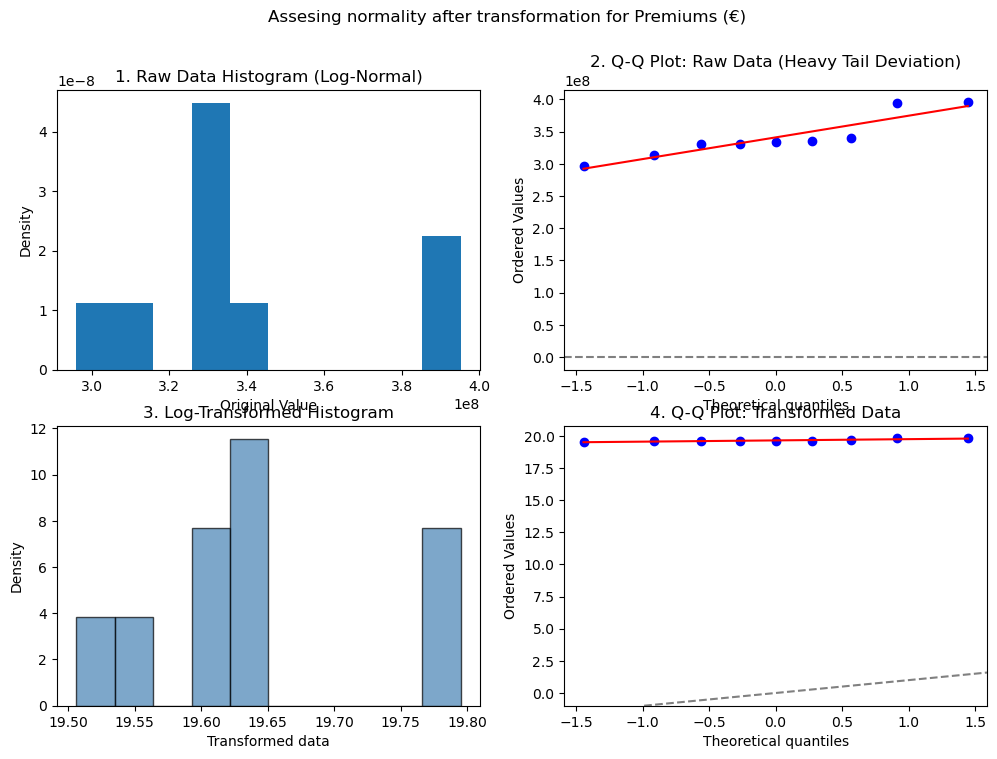

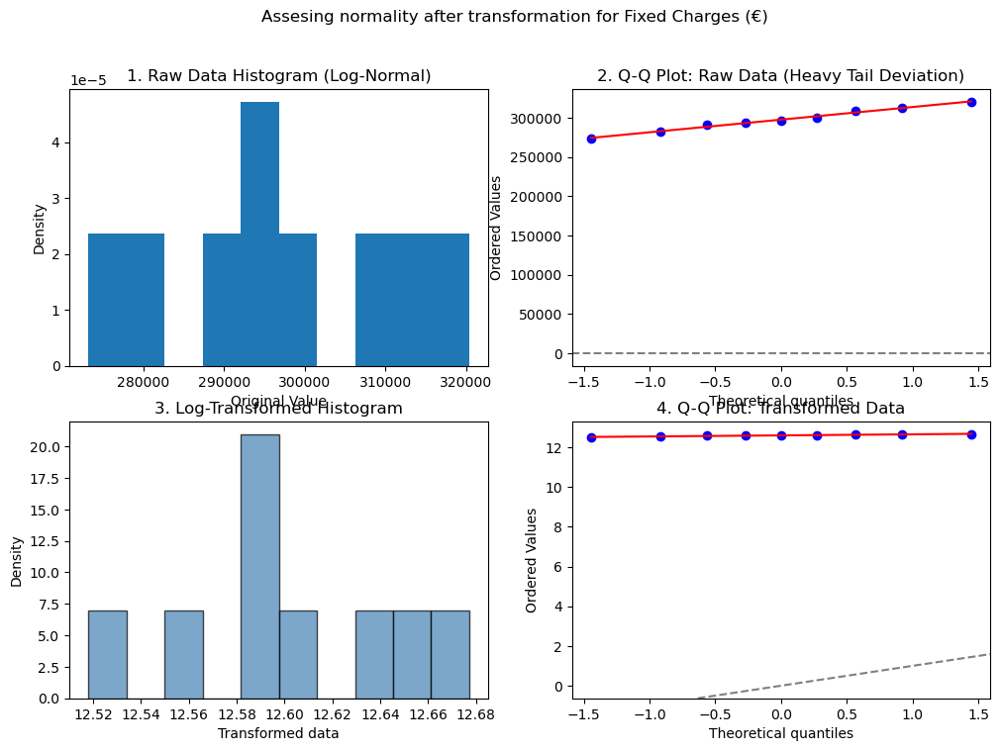

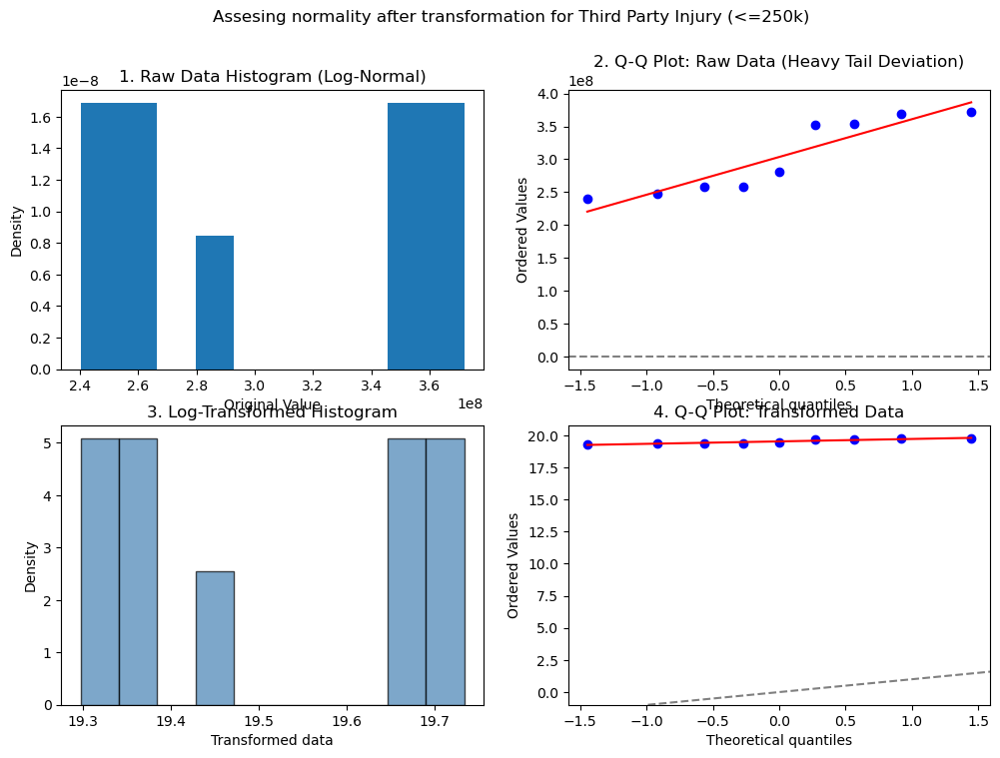

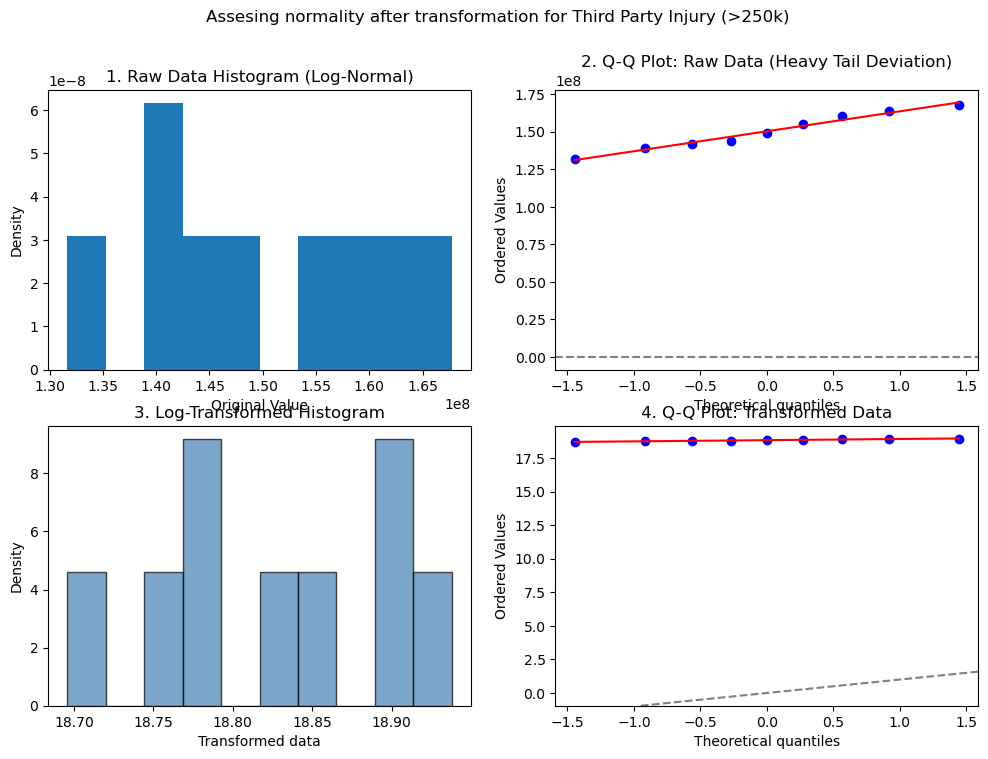

In [721]:
log_normal = df_main.copy() 
lists = df_actionable['Feature'].tolist()
results =[]
for i in lists:
    distribution = interpretation_df.loc[interpretation_df['Feature'] == i, 'Distribution'].values[0]
    if distribution == 'Log-Normal':
        data = log_normal[i] 
        data_transformed = np.log(data + 1e-9)
        fig, axes = plt.subplots(2, 2, figsize=(12, 8))
        fig.suptitle(f'Assesing normality after transformation for {i}')
        axes[0, 0].hist(data, bins=10, density=True)
        axes[0, 0].set_title(f'1. Raw Data Histogram (Log-Normal)')
        axes[0, 0].set_xlabel('Original Value')
        axes[0, 0].set_ylabel('Density')
        stats.probplot(data, dist='norm', plot=axes[0, 1])
        axes[0, 1].set_title(f'2. Q-Q Plot: Raw Data (Heavy Tail Deviation)')
        axes[0, 1].axline((0, 0), slope=1, color='gray', linestyle='--')
        axes[1, 0].hist(data_transformed, bins=10, density=True, color='#4682B4', alpha=0.7, edgecolor='black')
        axes[1, 0].set_title(f'3. Log-Transformed Histogram')
        axes[1, 0].set_xlabel('Transformed data')
        axes[1, 0].set_ylabel('Density')
        stats.probplot(data_transformed, dist='norm', plot=axes[1, 1])
        axes[1, 1].set_title('4. Q-Q Plot: Transformed Data')
        axes[1, 1].axline((0, 0), slope=1, color='gray', linestyle='--')
        plt.show()

as it can be seen in the Q-Q plot, the transformed data fits way better into the normal distribution. hence it can be analized as it is to identify information about the data

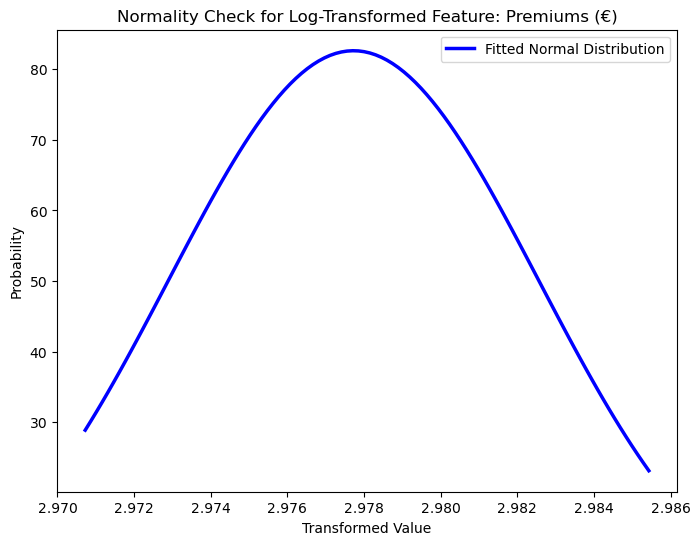

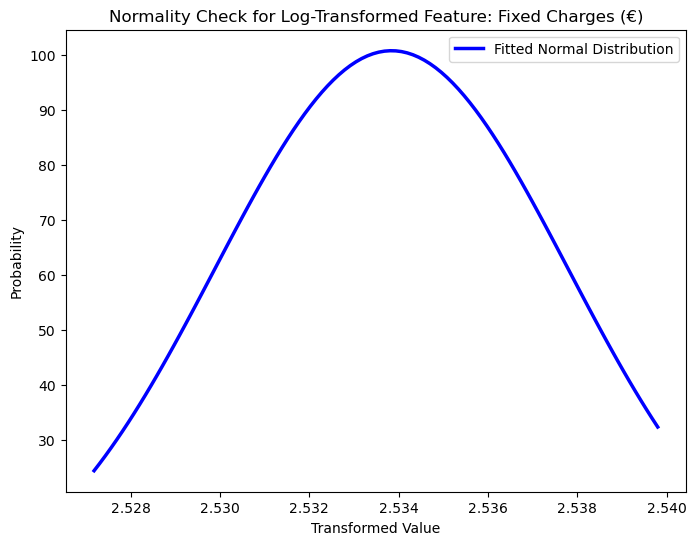

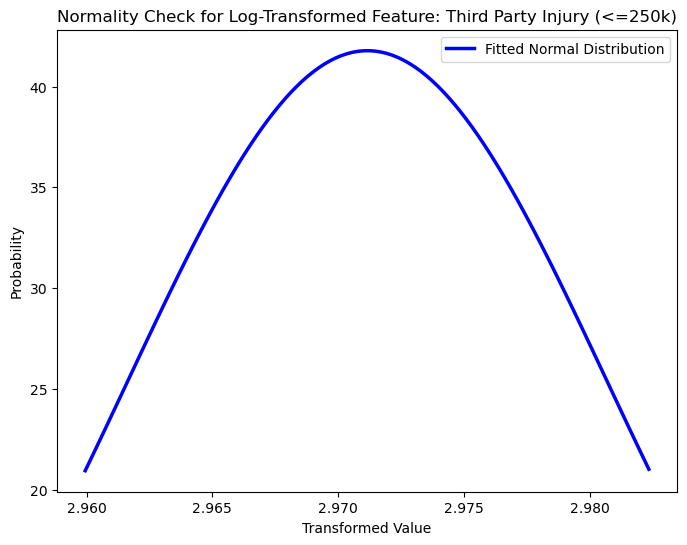

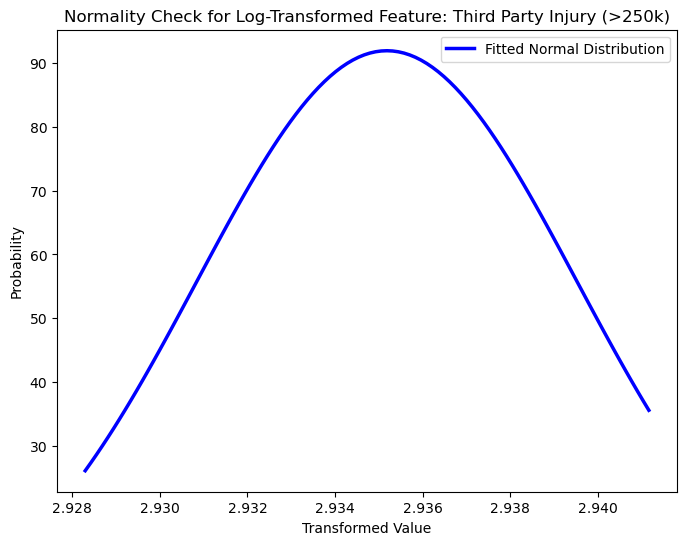

In [823]:
log_normal = df_main.copy() 
lists = df_actionable['Feature'].tolist()
results =[]
for i in lists:
    distribution = interpretation_df.loc[interpretation_df['Feature'] == i, 'Distribution'].values[0]
    if distribution == 'Log-Normal':
        data = log_normal[i] 
        data_transformed = np.log(data + 1e-9)
        mean = data_transformed.mean()
        std = data_transformed.std()
        fig, ax = plt.subplots(1, 1, figsize=(8, 6))
        xmin, xmax = data_transformed.min(), data_transformed.max()
        x_range = np.linspace(xmin, xmax, 100)
        pdf_fitted = norm.pdf(x_range, loc=mean, scale=std)
        ax.plot(x_range, pdf_fitted, 'b-', lw=2.5, label='Fitted Normal Distribution')
        ax.set_title(f'Normality Check for Log-Transformed Feature: {i}')
        ax.set_xlabel('Transformed Value')
        ax.set_ylabel('Probability')
        ax.legend()
        plt.show()
        

K-S is going to be used to confirm mathematically what it has discovered by QQ and normal distribution bell in most of the cases

In [723]:
from scipy.stats import kstest
log_normal = df_main.copy() 
lists = df_actionable['Feature'].tolist()
for i in lists:
    distribution = interpretation_df.loc[interpretation_df['Feature'] == i, 'Distribution'].values[0]
    if distribution == 'Log-Normal':
        data = log_normal[i] 
        data_transformed = np.log(data + 1e-9)
        mean = data_transformed.mean()
        std = data_transformed.std()
        ks_statistic = kstest(data_transformed, 'norm', args=(mean, std))[0]
        p_value = kstest(data_transformed, 'norm', args=(mean, std))[1]
        print(f'\n--- Results for {i} ---\nK-S P-Value: {p_value:.4f}')
      


--- Results for Premiums (€) ---
K-S P-Value: 0.4251

--- Results for Fixed Charges (€) ---
K-S P-Value: 0.9967

--- Results for Third Party Injury (<=250k) ---
K-S P-Value: 0.5260

--- Results for Third Party Injury (>250k) ---
K-S P-Value: 0.9817


there's strong evidence that log normal transformation can be manage as normal distribution. let's find out things

In [724]:
log_normal = df_main.copy() 
lists = df_actionable['Feature'].tolist()
results =[]
for i in lists:
    distribution = interpretation_df.loc[interpretation_df['Feature'] == i, 'Distribution'].values[0]
    if distribution == 'Log-Normal':
        feature = i
        data = log_normal[i] 
        data_transformed = np.log(data + 1e-9)
        mean = data_transformed.mean()
        std = data_transformed.std()
        skew = data_transformed.skew()
        kurtosis = data_transformed.kurt() 
        #identifying outliers
        ucl = mean + (std * 3)
        lcl = mean - (std * 3)
        outliers = data_transformed[(data_transformed > ucl) | (data_transformed < lcl)]
        outlier_count = outliers.shape[0]
        results.append({'Feature': feature, 'mean': mean, 'skew': skew, 'kurtosis': kurtosis, 'Outliers': outlier_count}) 
df_result = pd.DataFrame(results) 
df_result
                       
        

,Feature,mean,skew,kurtosis,Outliers
0,Premiums (€),19.64,0.67,0.07,0
1,Fixed Charges (€),12.60,-0.17,-0.38,0
2,Third Party Injury (<=250k),19.52,0.13,-2.28,0
3,Third Party Injury (>250k),18.83,-0.10,-1.16,0


In [725]:
df_statistics


,Feature,mean,min,max,std,median,mode,q25,q75,range,skew,kurtosis,var,Distribution
0,Vehicles Licenced,2848978.89,2624958.00,3143356.00,164374.31,2860984.00,2624958.00,2717722.00,2919005.00,518398.00,0.32,-0.73,27018913963.11,Negative binomial
1,Km Driven - (MM),45694.22,36237.00,48754.00,4049.24,47296.00,36237.00,47072.00,47604.00,12517.00,-1.68,1.37,16396355.60,Beta
2,Premiums (€),340986376.61,296050495.60,395235230.40,33193038.29,334585248.00,296050495.60,330167746.20,339774078.00,99184734.80,0.70,-0.55,1101777790900174.12,Log-Normal
3,Fixed Charges (€),297444.33,273241.00,320350.00,14777.26,295457.00,273241.00,291217.00,309086.00,47109.00,-0.06,-0.83,218367424.75,Log-Normal
4,Asset Damage,142185397.09,98637367.13,208850392.30,44729008.38,118590016.70,98637367.13,111319504.10,195815056.40,110213025.17,0.63,-1.44,2000684190666531.50,Beta
5,Third Party Damage,86691402.07,60956202.28,117935076.50,21200085.94,79791184.19,60956202.28,70852196.12,111394939.50,56978874.22,0.46,-1.39,449443644008241.25,Beta
6,Third Party Injury (<=250k),303492629.44,240175216.00,371932928.60,56620282.35,281393289.10,240175216.00,258172667.00,353502069.40,131757712.60,0.15,-1.81,3205856373367222.00,Log-Normal
7,Third Party Injury (>250k),150286140.34,131662173.50,167725675.30,12229193.09,149246404.20,131662173.50,142081458.50,160289903.40,36063501.80,0.00,-1.25,149553163663704.09,Log-Normal
8,Direct_0_10000,8520709.98,6978455.45,11004433.36,1255752.82,8488453.94,6978455.45,7774558.04,9139722.74,4025977.91,0.57,-0.19,1576915157465.49,Beta
9,Direct_10001_15000,12215040.96,4573088.63,19902288.33,5343380.83,12951653.31,4573088.63,7246152.25,15965012.50,15329199.69,-0.12,-1.33,28551718706583.94,Beta


In [726]:
lists_1 =  df_result['Feature'].tolist() 
stat = []
for col, row in df_statistics.iterrows():
    feature = row['Feature'] 
    if feature in lists_1:
        mean = row['mean']
        skew = row['skew']
        kurt = row['kurtosis']
        stat.append({'Feature': feature, 'mean_n': mean, 'skew_n': skew, 'kurtosis_n': kurtosis})
df_stat = pd.DataFrame(stat) 
df_norm_analysis = df_result.merge(df_stat, on='Feature', how='left')
df_norm_analysis            

,Feature,mean,skew,kurtosis,Outliers,mean_n,skew_n,kurtosis_n
0,Premiums (€),19.64,0.67,0.07,0,340986376.61,0.70,-1.16
1,Fixed Charges (€),12.60,-0.17,-0.38,0,297444.33,-0.06,-1.16
2,Third Party Injury (<=250k),19.52,0.13,-2.28,0,303492629.44,0.15,-1.16
3,Third Party Injury (>250k),18.83,-0.10,-1.16,0,150286140.34,0.00,-1.16


In [727]:
df_norm_analysis['delta skew'] = (df_norm_analysis['skew_n'] - df_norm_analysis['skew']) / df_norm_analysis['skew']
df_norm_analysis['delta kurtosis'] = (df_norm_analysis['kurtosis_n'] - df_norm_analysis['kurtosis']) / df_norm_analysis['kurtosis']
df_norm_analysis

,Feature,mean,skew,kurtosis,Outliers,mean_n,skew_n,kurtosis_n,delta skew,delta kurtosis
0,Premiums (€),19.64,0.67,0.07,0,340986376.61,0.70,-1.16,0.04,-17.67
1,Fixed Charges (€),12.60,-0.17,-0.38,0,297444.33,-0.06,-1.16,-0.67,2.06
2,Third Party Injury (<=250k),19.52,0.13,-2.28,0,303492629.44,0.15,-1.16,0.20,-0.49
3,Third Party Injury (>250k),18.83,-0.10,-1.16,0,150286140.34,0.00,-1.16,-1.03,-0.00


It is spotted in deltas than for some variables normalization is providing better outcomes:
1. Premiums (€): there's an increase in skewness which might not be appropiate. However the new Kurtosis is close to 0, which means that the tails are close to normal distribution, which validates all analyzed prior to this stage. (k-s result: .4251
2. Fixed Charges (€): skew and kurtosis are way better than before, this is backed by a p-value of .99 seen in the K-S analysis.
3. Third Party Injury (<=250k): skew is slightly higher, Kurtosis is close to 0 which, as in case 1 give validation to normal distribution (k-s result: .52)
4. Third Party Injury (>250k): slight increase in skew and same result for kurtosis, which is close to 0 (k-s result:.98)

## Variable transformation

Having strong evidence provided by Q-Q charts and normalization analysis, 4 variables are going to be transformed from Log-normal, and the categorical variables are going to be transform to ordinal variables in order to proceed with standarized data to the bivariate/multivariate analysis

In [728]:
df_main['Premiums (€)'] = np.log(df_main['Premiums (€)'] + 1e-9)
df_main['Fixed Charges (€)'] = np.log(df_main['Fixed Charges (€)'] + 1e-9)
df_main['Third Party Injury (<=250k)'] = np.log(df_main['Third Party Injury (<=250k)'] + 1e-9)
df_main['Third Party Injury (>250k)'] = np.log(df_main['Third Party Injury (>250k)'] + 1e-9)
categorical = ['Asset Damage categorical', 'Third Party Damage categorical', 'Third Party Injury (<=250k) categorical', 'Third Party Injury (>250k) categorical']
# an ordinal dictionary is created in order to assign numbers to each of the categories
ordinal_map = {'Low': 1, 'Slight': 2, 'Average': 3, 'High': 4, 'Extreme': 5}
for i in categorical:
    df_main[i] = df_main[i].map(ordinal_map)
df_main 

,Year,Vehicles Licenced,Km Driven - (MM),Premiums (€),Fixed Charges (€),Asset Damage,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (>250k),Asset Damage categorical,...,tcc_median_categorical_Low,tcc_median_categorical_Slight,sf_median_categorical_Extreme,sf_median_categorical_High,sf_median_categorical_Low,Rainy_Days,Bad_Visibility_Days,Snow_Days,flood_risk,Non-life insurance technical reserves
0,2016,2624958,47775.00,19.51,12.64,111319504.10,69625782.46,19.73,18.75,1,...,154,1,0,1,365,366,184,40,14,25118.23
1,2017,2675879,48754.00,19.63,12.60,107523428.10,70852196.12,19.73,18.78,1,...,130,1,0,3,362,364,205,26,8,26902.00
2,2018,2717722,47545.00,19.62,12.61,114164747.20,75381597.82,19.68,18.82,1,...,137,5,7,7,351,363,188,42,17,25687.00
3,2019,2805839,47072.00,19.63,12.59,118590016.70,82812573.43,19.68,18.70,1,...,147,2,1,1,363,362,182,20,13,27576.00
4,2020,2860984,36237.00,19.64,12.68,98637367.13,60956202.28,19.37,18.77,1,...,152,0,1,5,360,365,180,27,32,32569.00
5,2021,2890975,41878.00,19.62,12.65,127194140.30,79791184.19,19.30,18.86,1,...,128,2,2,4,359,363,202,36,10,36039.00
6,2022,2919005,47604.00,19.56,12.58,197573921.60,111473066.30,19.46,18.89,4,...,150,4,0,3,362,362,185,24,15,39658.00
7,2023,3002092,47296.00,19.79,12.52,195815056.40,111394939.50,19.37,18.91,4,...,136,7,0,2,363,364,188,20,36,44952.00
8,2024,3143356,47086.98,19.79,12.55,208850392.30,117935076.50,19.32,18.94,4,...,130,1,1,1,364,366,199,22,20,45862.00


Data Tranasformation/scaling is selected in order to reduce skewness/Krutosis of data in order to resamble a normal distribution. As proven by Q-Q plot visual method and normalization method, it provides a better quality of data.
Encoding (spicifically ordinal encoding) is used for categorical variables. Due to it's nature (slight to extreme) it is capable to translate labels into numerical factors that can be properly used to correlate data and model it.

In [729]:
# a back up of the dataframe is done in order to save all changes done during this stage.
df_main.to_csv('final_1.csv')

## Bivariate and multivariate analysis

In [730]:
url = 'https://docs.google.com/spreadsheets/d/e/2PACX-1vRwPhrvDVoW9G0LGdAS6rpdkIdcloggCo5lBpWCT5Uhyxr0HEtBUCKOdXRonw0NNvBb4CPgrtKTeFN3/pub?output=csv'
df_main_1 = pd.read_csv(url)
df_main_1

,Year,Vehicles Licenced,Km Driven - (MM),Premiums (€),Fixed Charges (€),Asset Damage,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (>250k),Asset Damage categorical,...,tcc_median_categorical_Low,tcc_median_categorical_Slight,sf_median_categorical_Extreme,sf_median_categorical_High,sf_median_categorical_Low,Rainy_Days,Bad_Visibility_Days,Snow_Days,flood_risk,Non-life insurance technical reserves
0,2016,2624958,47775.00,19.51,12.64,111319504.10,69625782.46,19.73,18.75,1,...,154,1,0,1,365,366,184,40,14,25118.23
1,2017,2675879,48754.00,19.63,12.60,107523428.10,70852196.12,19.73,18.78,1,...,130,1,0,3,362,364,205,26,8,26902.00
2,2018,2717722,47545.00,19.62,12.61,114164747.20,75381597.82,19.68,18.82,1,...,137,5,7,7,351,363,188,42,17,25687.00
3,2019,2805839,47072.00,19.63,12.59,118590016.70,82812573.43,19.68,18.70,1,...,147,2,1,1,363,362,182,20,13,27576.00
4,2020,2860984,36237.00,19.64,12.68,98637367.13,60956202.28,19.37,18.77,1,...,152,0,1,5,360,365,180,27,32,32569.00
5,2021,2890975,41878.00,19.62,12.65,127194140.30,79791184.19,19.30,18.86,1,...,128,2,2,4,359,363,202,36,10,36039.00
6,2022,2919005,47604.00,19.56,12.58,197573921.60,111473066.30,19.46,18.89,4,...,150,4,0,3,362,362,185,24,15,39658.00
7,2023,3002092,47296.00,19.79,12.52,195815056.40,111394939.50,19.37,18.91,4,...,136,7,0,2,363,364,188,20,36,44952.00
8,2024,3143356,47086.98,19.79,12.55,208850392.30,117935076.50,19.32,18.94,4,...,130,1,1,1,364,366,199,22,20,45862.00


In [731]:
#axes = pd.plotting.scatter_matrix(df_main_1, alpha=0.2, figsize=(30, 30)) 
#for ax in axes.flatten():
    #ax.xaxis.label.set_rotation(45)
    #ax.yaxis.label.set_rotation(45)
    #ax.yaxis.label.set_ha('right')
#plt.tight_layout()
#plt.gcf().subplots_adjust(wspace=0, hspace=0)
#plt.savefig("scatter_matrix.png", dpi=300, bbox_inches='tight')
#plt.show()


<p>as a reference the scatter matrix is showing some variables are positevily/negatively correlated. Additionally there are many showing ambiguous graphic results (use the PNG file to have a better outlook of the matrix).</p>
<p>This chart violates every single principle of Turf. it is used for references purposes to find heads and toes to this stage on the analysis</p>
<p>Using pearson correlation and sperman rank correlation it is going to be possible to understand the relationship between numerical variables</p>
<p>Using trends comparison it is going to be understand the relationship of categorical to numerical features</p>
<p>Using contingency tables it is going to be explore the relationship between categorical data</p>

Numerical to Numerical

### Pearson/Sperman

In [732]:
from scipy.stats import pearsonr, spearmanr
df_bivariate = df_main_1.copy()
df_bivariate = df_bivariate.drop(columns = 'Year')
features = df_bivariate.columns.tolist()
correlations = []
for i in features:
    main_feature = df_bivariate[i] 
    for j in features:
        secondary_feature = df_bivariate[j]
        if i == j:
            continue
        else:
            pearson_corr, _ = pearsonr(main_feature, secondary_feature)
            spearman_corr, _ = spearmanr(main_feature, secondary_feature)
            correlations.append({'Feature_1': i, 'Feature_2': j, 'Pearson': pearson_corr, 'Spearman': spearman_corr})
correlations_df = pd.DataFrame(correlations)
correlations_df            

,Feature_1,Feature_2,Pearson,Spearman
0,Vehicles Licenced,Km Driven - (MM),-0.15,-0.45
1,Vehicles Licenced,Premiums (€),0.78,0.52
2,Vehicles Licenced,Fixed Charges (€),-0.53,-0.57
3,Vehicles Licenced,Asset Damage,0.82,0.80
4,Vehicles Licenced,Third Party Damage,0.80,0.78
...,...,...,...,...
2347,Non-life insurance technical reserves,sf_median_categorical_Low,0.32,0.13
2348,Non-life insurance technical reserves,Rainy_Days,0.12,0.00
2349,Non-life insurance technical reserves,Bad_Visibility_Days,0.18,0.20
2350,Non-life insurance technical reserves,Snow_Days,-0.57,-0.65


In [733]:
# dropping duplicates (xy yx) and self pairs
filtered_corr = correlations_df.copy()
filtered_corr = filtered_corr[filtered_corr['Feature_1'] != filtered_corr['Feature_2']]
filtered_corr['Pair'] = filtered_corr.apply(lambda x: tuple(sorted([x['Feature_1'], x['Feature_2']])), axis=1)
filtered_corr = filtered_corr.drop_duplicates(subset='Pair').drop(columns='Pair')
filtered_corr = filtered_corr.reset_index(drop=True)
filtered_corr

,Feature_1,Feature_2,Pearson,Spearman
0,Vehicles Licenced,Km Driven - (MM),-0.15,-0.45
1,Vehicles Licenced,Premiums (€),0.78,0.52
2,Vehicles Licenced,Fixed Charges (€),-0.53,-0.57
3,Vehicles Licenced,Asset Damage,0.82,0.80
4,Vehicles Licenced,Third Party Damage,0.80,0.78
...,...,...,...,...
1171,Bad_Visibility_Days,flood_risk,-0.46,-0.38
1172,Bad_Visibility_Days,Non-life insurance technical reserves,0.18,0.20
1173,Snow_Days,flood_risk,-0.34,-0.22
1174,Snow_Days,Non-life insurance technical reserves,-0.57,-0.65


due to the small dataset methods like MIC or MI cannot be used to have an absolute value (results are going to be 0 based on the way those methods compute information). and absolute average is going to used to rank the top 10 and being able to present a graphical visualization

### Absolute correlation

In [734]:
filtered_corr['abs_Pearson'] = filtered_corr['Pearson'].abs()
filtered_corr['abs_Spearman'] = filtered_corr['Spearman'].abs()
filtered_corr['abs'] = (filtered_corr['abs_Pearson'] + filtered_corr['abs_Spearman']) / 2
filtered_corr_sorted = filtered_corr.sort_values(by='abs', ascending=False)
filtered_df = pd.DataFrame(filtered_corr_sorted)
filtered_df = filtered_df.reset_index(drop=True)
filtered_df.head(10)

,Feature_1,Feature_2,Pearson,Spearman,abs_Pearson,abs_Spearman,abs
0,tcc_median_categorical_High,Bad_Visibility_Days,1.00,1.00,1.00,1.00,1.00
1,PIAB_15001_30000,PIAB_30001_45000,1.00,1.00,1.00,1.00,1.00
2,Litigated_15001_30000,PIAB_30001_45000,0.99,1.00,0.99,1.00,0.99
3,Litigated_15001_30000,PIAB_15001_30000,0.98,1.00,0.98,1.00,0.99
4,Direct_10001_15000,PIAB_15001_30000,1.00,0.98,1.00,0.98,0.99
5,Direct_10001_15000,PIAB_30001_45000,0.99,0.98,0.99,0.98,0.99
6,Litigated_15001_30000,Non-life insurance technical reserves,-0.99,-0.98,0.99,0.98,0.99
7,Vehicles Licenced,Litigated_15001_30000,-0.97,-1.00,0.97,1.00,0.99
8,PIAB_30001_45000,Non-life insurance technical reserves,-0.98,-0.98,0.98,0.98,0.98
9,Direct_10001_15000,Litigated_15001_30000,0.98,0.98,0.98,0.98,0.98



TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : Yes
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 10.0
- Data Ink Ratio      : 0.0015

--- Subplot 2 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 10.0
- Data Ink Ratio      : 0.0015



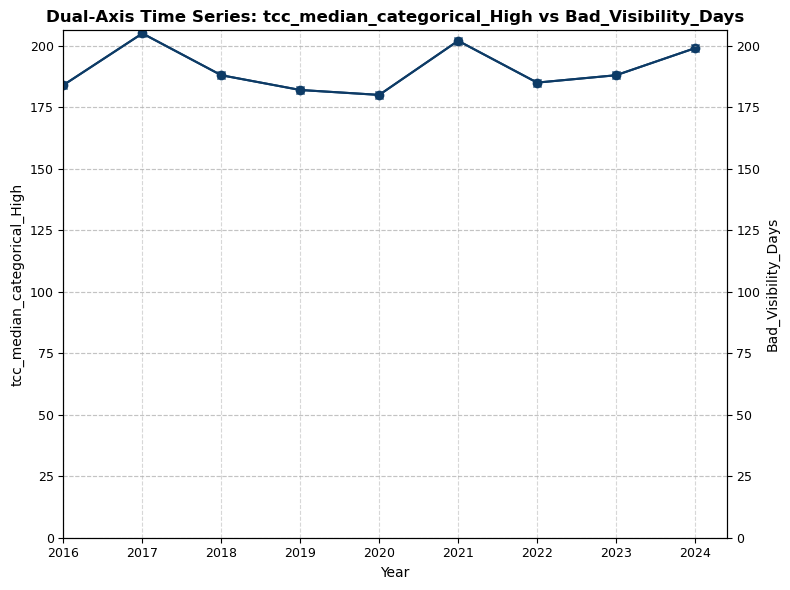


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : Yes
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 9.0
- Data Ink Ratio      : 0.0015

--- Subplot 2 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 9.0
- Data Ink Ratio      : 0.0015



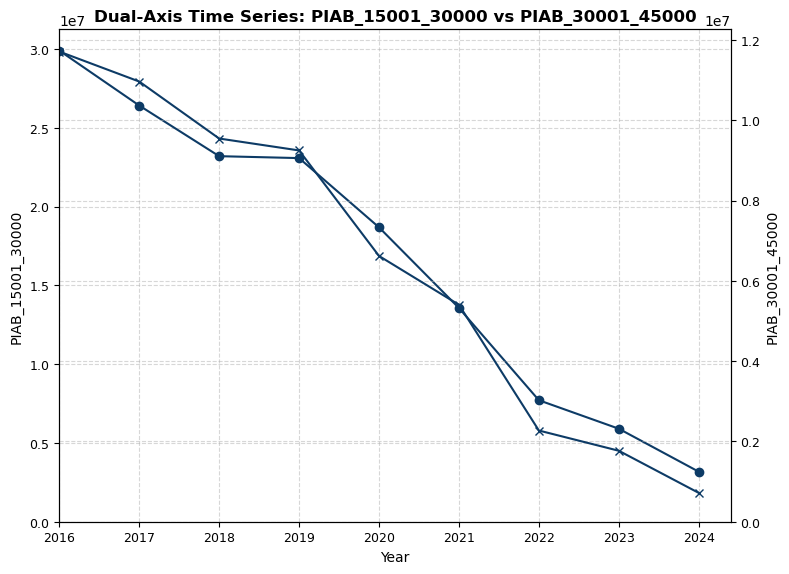


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : Yes
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 8.0
- Data Ink Ratio      : 0.0015

--- Subplot 2 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 9.0
- Data Ink Ratio      : 0.0015



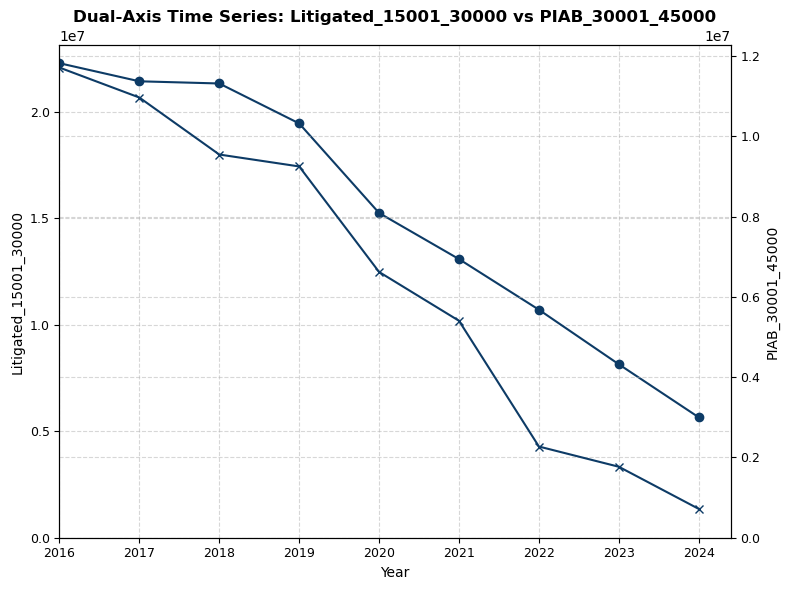


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : Yes
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 8.0
- Data Ink Ratio      : 0.0015

--- Subplot 2 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 9.0
- Data Ink Ratio      : 0.0015



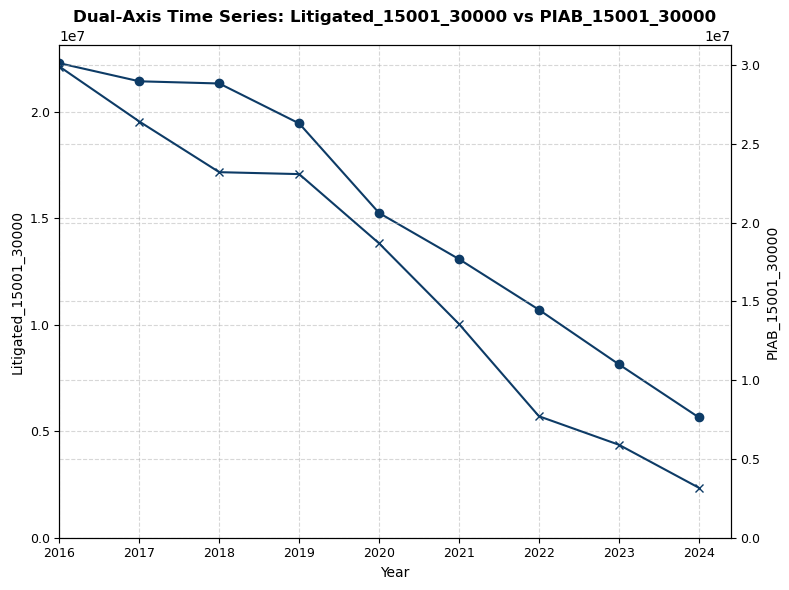


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : Yes
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 10.0
- Data Ink Ratio      : 0.0015

--- Subplot 2 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 9.0
- Data Ink Ratio      : 0.0015



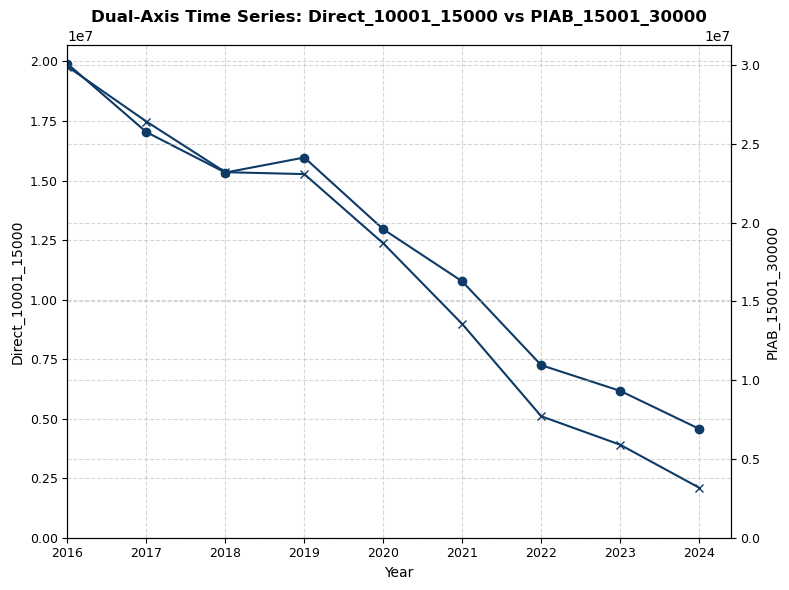


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : Yes
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 10.0
- Data Ink Ratio      : 0.0015

--- Subplot 2 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 9.0
- Data Ink Ratio      : 0.0015



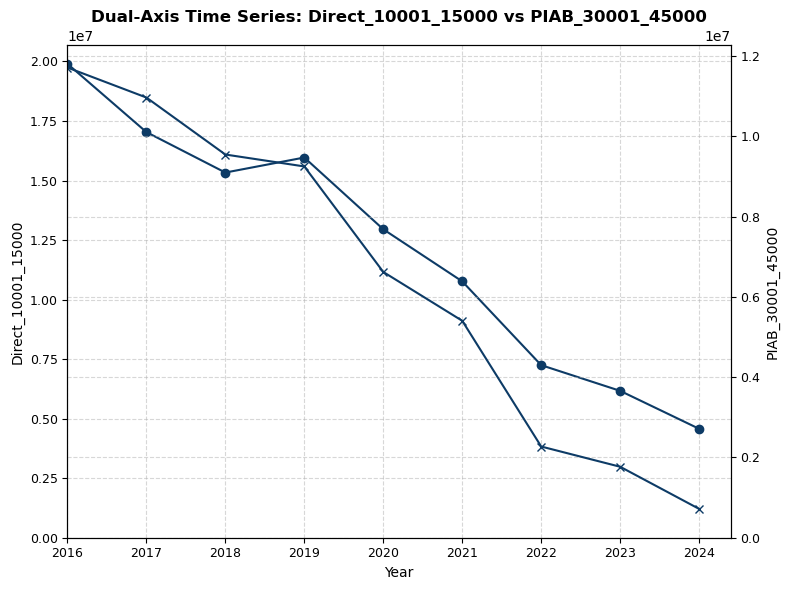


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : Yes
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 8.0
- Data Ink Ratio      : 0.0015

--- Subplot 2 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 8.0
- Data Ink Ratio      : 0.0015



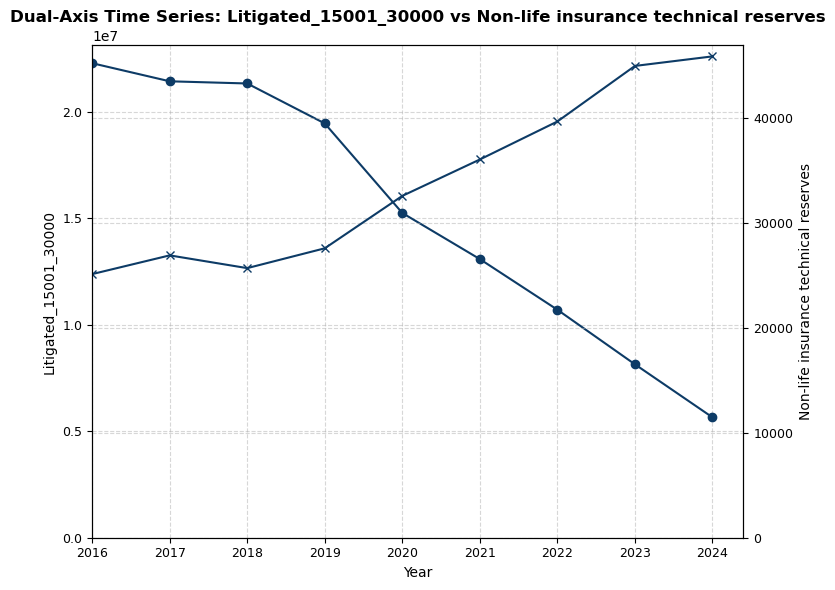


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : Yes
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 9.0
- Data Ink Ratio      : 0.0015

--- Subplot 2 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 8.0
- Data Ink Ratio      : 0.0015



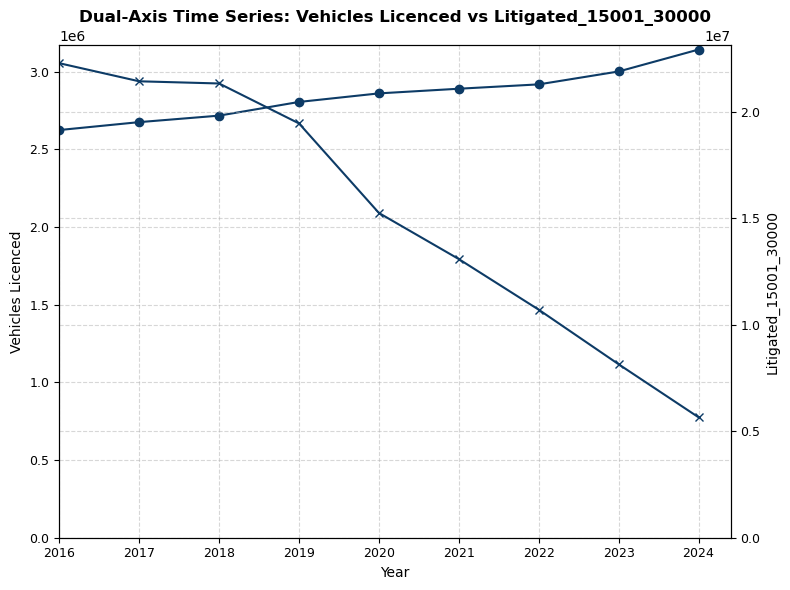


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : Yes
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 9.0
- Data Ink Ratio      : 0.0015

--- Subplot 2 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 8.0
- Data Ink Ratio      : 0.0015



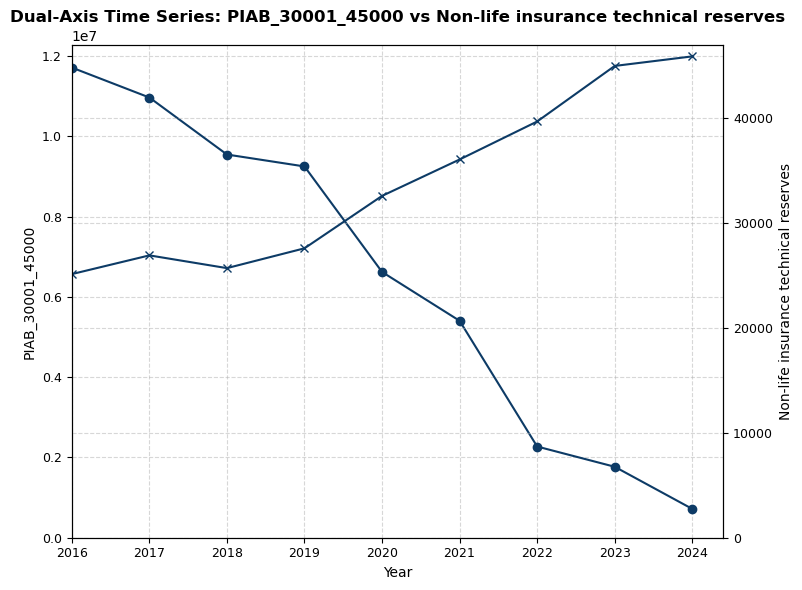


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : Yes
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 10.0
- Data Ink Ratio      : 0.0015

--- Subplot 2 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 8.0
- Data Ink Ratio      : 0.0015



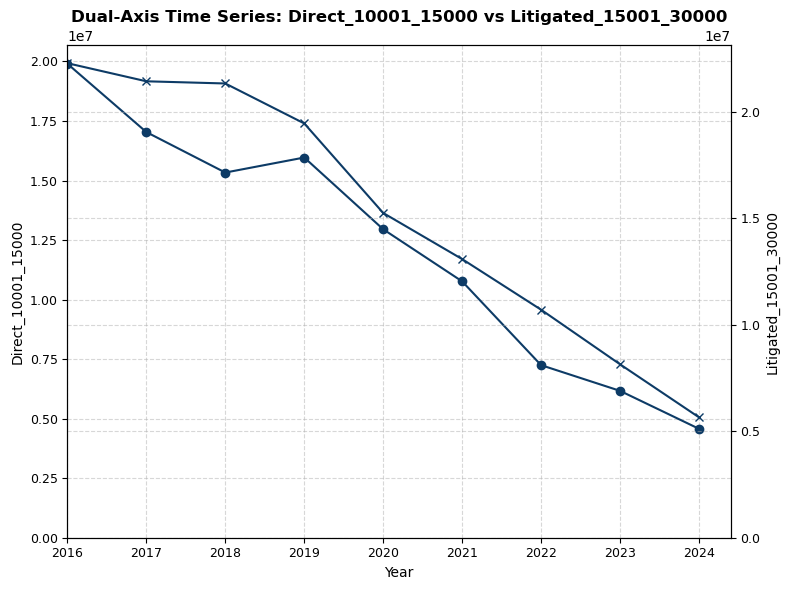

In [735]:
top10 = filtered_corr.sort_values(by='abs', ascending=False).head(10)
#Year column drop above, manually creates the range of years
year = list(range(2016, 2025)) 
for col, row in top10.iterrows():
    f1 = row['Feature_1']
    f2 = row['Feature_2']
    fig, ax1 = plt.subplots(figsize=(8, 6))
    ax1.plot(year, df_bivariate[f1], marker='o', label=f1)
    ax1.set_xlabel('Year')
    ax1.set_ylabel(f1)
    ax2 = ax1.twinx()
    ax2.plot(year, df_bivariate[f2], color='red', marker='x', label=f2)
    ax2.set_ylabel(f2)
    axes, metrics_report = turf([ax1, ax2], title=f'Dual-Axis Time Series: {f1} vs {f2}', return_metrics=True)
    plt.show()
    


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 10.0
- Data Ink Ratio      : 0.0013



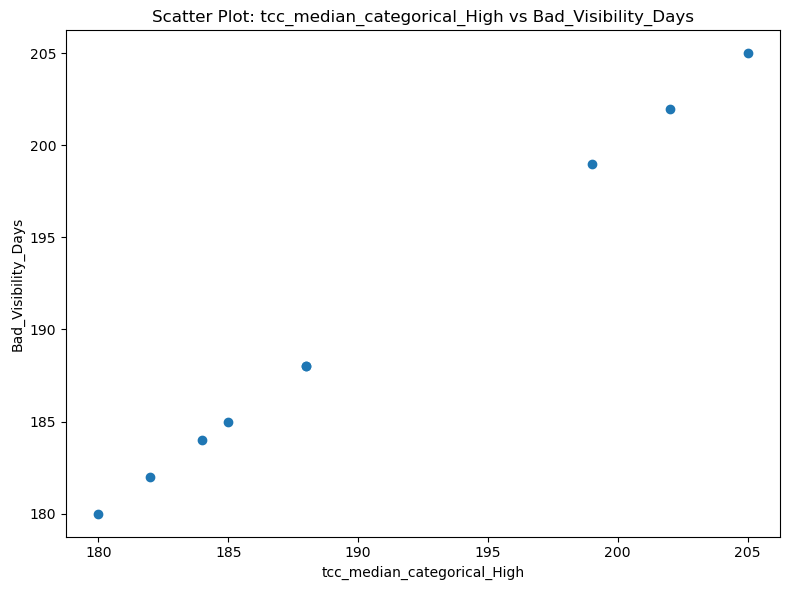


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 10.0
- Data Ink Ratio      : 0.0013



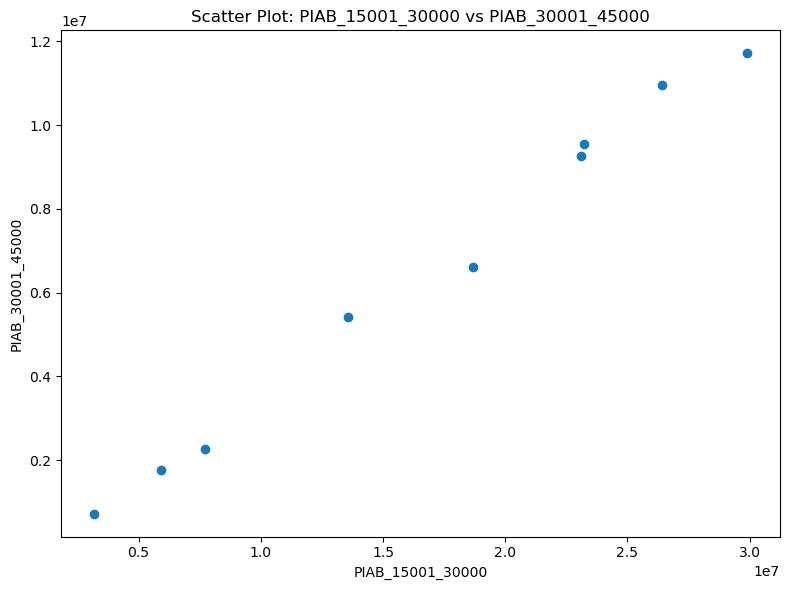


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 10.0
- Data Ink Ratio      : 0.0013



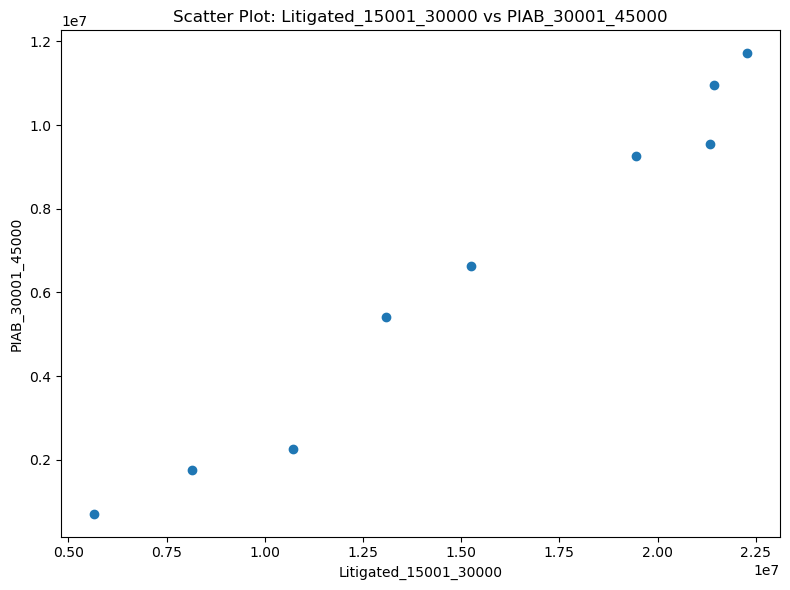


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 10.0
- Data Ink Ratio      : 0.0013



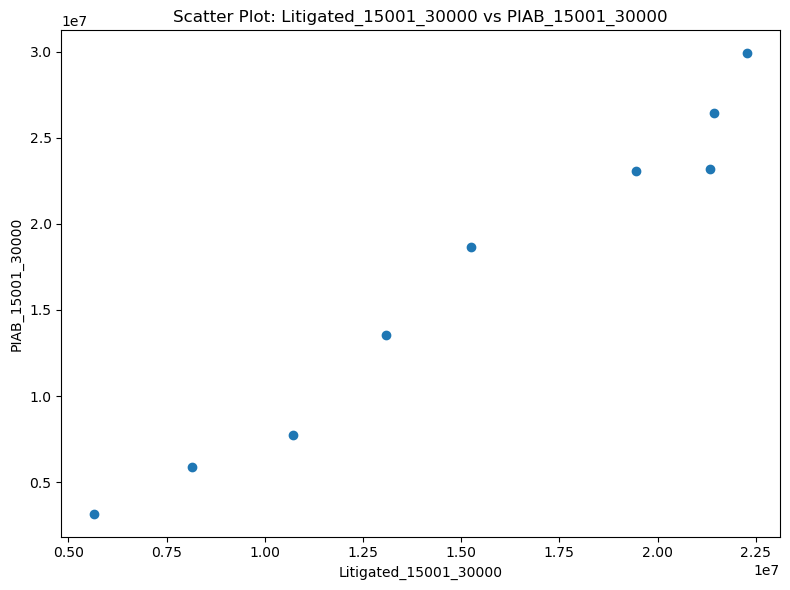


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 10.0
- Data Ink Ratio      : 0.0013



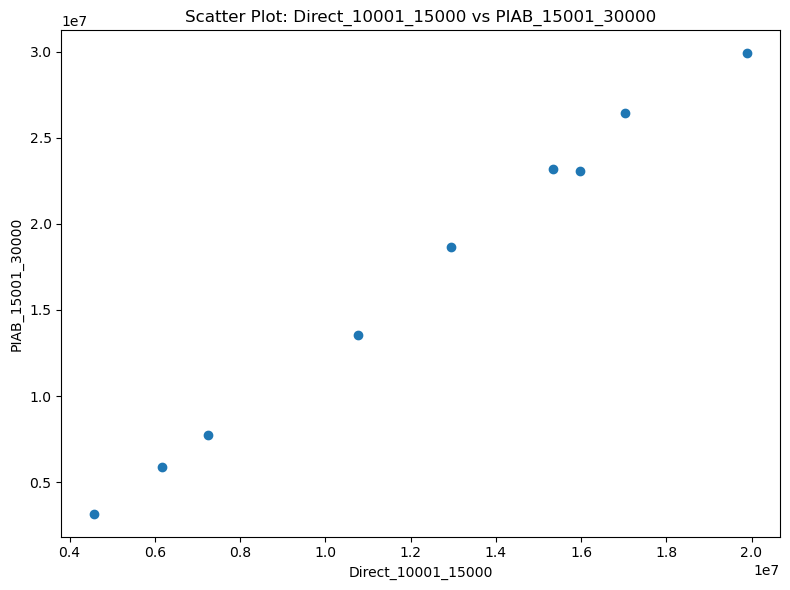


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 10.0
- Data Ink Ratio      : 0.0013



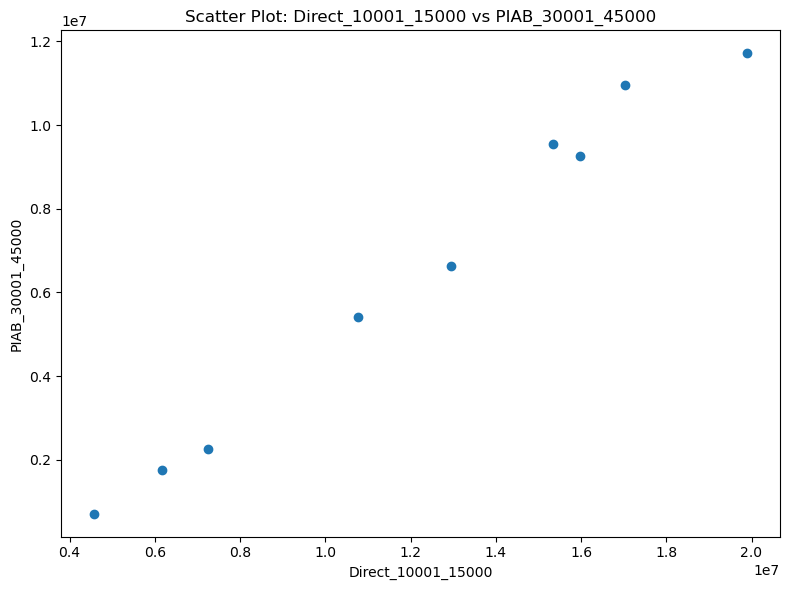


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 10.0
- Data Ink Ratio      : 0.0013



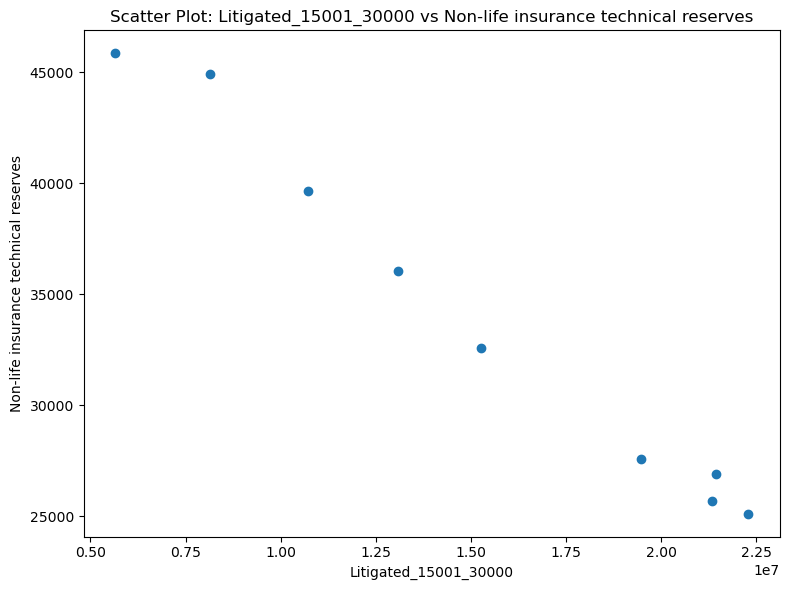


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 10.0
- Data Ink Ratio      : 0.0013



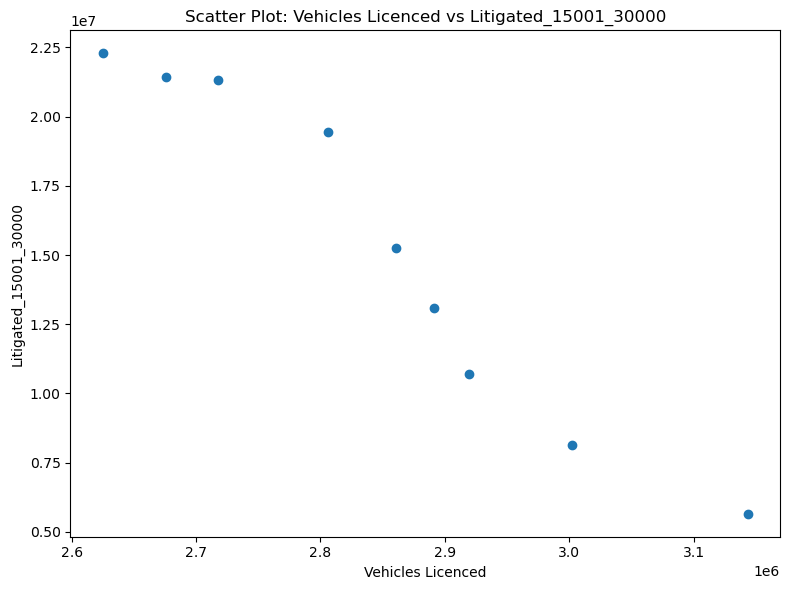


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 10.0
- Data Ink Ratio      : 0.0013



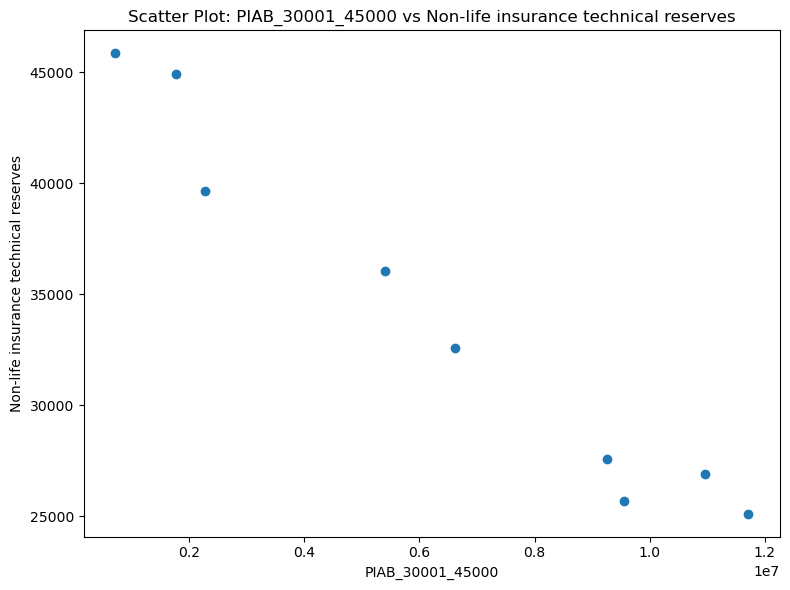


TURF Compliance Metrics

--- Subplot 1 ---
- Set Ymin Zero       : Yes
- Restricted X Axis   : No
- Has Title           : Yes
- Has Xlabel          : Yes
- Has Ylabel          : Yes
- N Lines             : 1
- Has Legend          : No
- Legend Needed       : No
- Grid Density        : 10.0
- Data Ink Ratio      : 0.0013



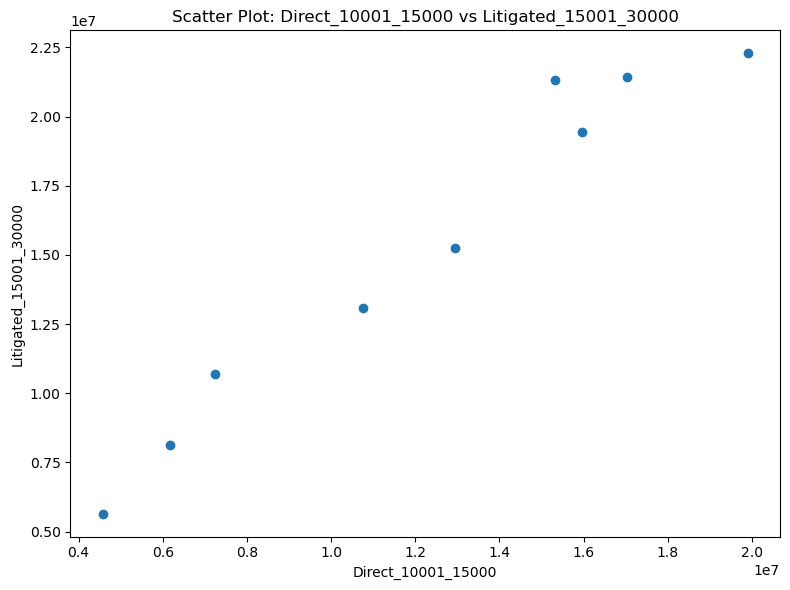

In [736]:
for col, row in top10.iterrows():
    f1 = row['Feature_1']
    f2 = row['Feature_2']
    plt.figure(figsize=(8, 6))
    plt.scatter(df_bivariate[f1], df_bivariate[f2])
    plt.xlabel(f1)
    plt.ylabel(f2)
    ax1.set_xlabel('Year')
    plt.title(f'Scatter Plot: {f1} vs {f2}')
    axes, metrics_report = turf(ax1, return_metrics=True)
    plt.show()

The results of Pearson and Sperman can be visually confirmed among the top 10 of pairings

some variables might have a lag impact on other variables (bad weather producing more accidents on december are impacting claims on january, for example). it is going to be evaluated if this is the case for this dataset using cross-correlation

### Cross-Correlation Magnitudes

In [869]:
df_bivariate = df_main_1.copy()
df_bivariate = df_bivariate.drop(columns = 'Year')
features = df_bivariate.columns.tolist()
cross_correlation = []
for i in features:
    main_feature = df_bivariate[i] 
    for j in features:
        secondary_feature = df_bivariate[j]
        if i == j:
            continue
        else:
            f1 = main_feature.values
            f2 = secondary_feature.values
            # values are needed to be normilezed, if not some correlations are above/below the range
            x = (f1 - np.mean(f1)) / np.std(f1)
            y = (f2 - np.mean(f2)) / np.std(f2)
            lag = np.arange(-len(x)+1, len(x)) 
            cc = np.correlate(y, x, mode='full') / len(f1)
            #cc is an array, hence we need to identify the index of the max to get the value
            #dropping no lag values lag = 0
            lag_nonzero = lag[lag != 0]
            cc_nonzero = cc[lag != 0]
            max_ind = np.argmax(np.abs(cc_nonzero))
            max_cc = cc_nonzero[max_ind]
            lag_at_c = lag_nonzero[max_ind]
            #dropping no lag values lag = 0
            cross_correlation.append({'Feature 1': i, 'Feature 2': j,'Max Cross-Correlation': max_cc,'Lag at Max': lag_at_c})
df_cross_correlation = pd.DataFrame(cross_correlation)
df_cross_correlation.sort_values(by='Max Cross-Correlation', ascending=False, inplace=True)
df_cross_correlation.reset_index(drop=True, inplace=True)
df_cross_correlation

,Feature 1,Feature 2,Max Cross-Correlation,Lag at Max
0,Third Party Injury (<=250k) categorical,Litigated_30001_45000,0.89,1
1,Litigated_30001_45000,Third Party Injury (<=250k) categorical,0.89,-1
2,Litigated_45001_60000,Litigated_60001_100000,0.87,-1
3,Litigated_60001_100000,Litigated_45001_60000,0.87,1
4,sf_median_categorical_Low,Third Party Injury (>250k) categorical,0.87,1
...,...,...,...,...
2347,Km Driven - (MM),sf_median_categorical_Extreme,-0.80,-2
2348,PIAB_>100001,sf_median_categorical_Low,-0.83,1
2349,sf_median_categorical_Low,PIAB_>100001,-0.83,-1
2350,sf_median_categorical_Extreme,Third Party Injury (>250k) categorical,-0.94,1


In [870]:
# dropping duplicates (xy yx) and self pairs
filtered_cross_corr = df_cross_correlation.copy()
filtered_cross_corr = filtered_cross_corr[filtered_cross_corr['Feature 1'] != filtered_cross_corr['Feature 2']]
filtered_cross_corr['Pair'] = filtered_cross_corr.apply(lambda x: tuple(sorted([x['Feature 1'], x['Feature 2']])), axis=1)
filtered_cross_corr = filtered_cross_corr.drop_duplicates(subset='Pair').drop(columns='Pair')
filtered_cross_corr = filtered_cross_corr.reset_index(drop=True)
filtered_cross_corr

,Feature 1,Feature 2,Max Cross-Correlation,Lag at Max
0,Third Party Injury (<=250k) categorical,Litigated_30001_45000,0.89,1
1,Litigated_45001_60000,Litigated_60001_100000,0.87,-1
2,sf_median_categorical_Low,Third Party Injury (>250k) categorical,0.87,1
3,Third Party Injury (>250k) categorical,Km Driven - (MM),0.85,1
4,Litigated_60001_100000,Litigated_30001_45000,0.85,1
...,...,...,...,...
1171,Direct_0_10000,Third Party Injury (>250k),-0.79,3
1172,Litigated_60001_100000,PIAB_0_10000,-0.79,1
1173,sf_median_categorical_Extreme,Km Driven - (MM),-0.80,2
1174,PIAB_>100001,sf_median_categorical_Low,-0.83,1


now we are going to visualize the lag effect on the top 10 of the pairs

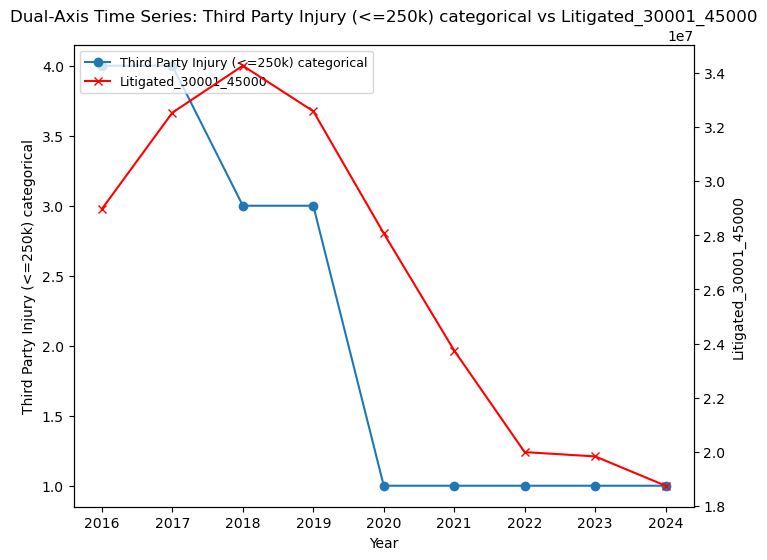

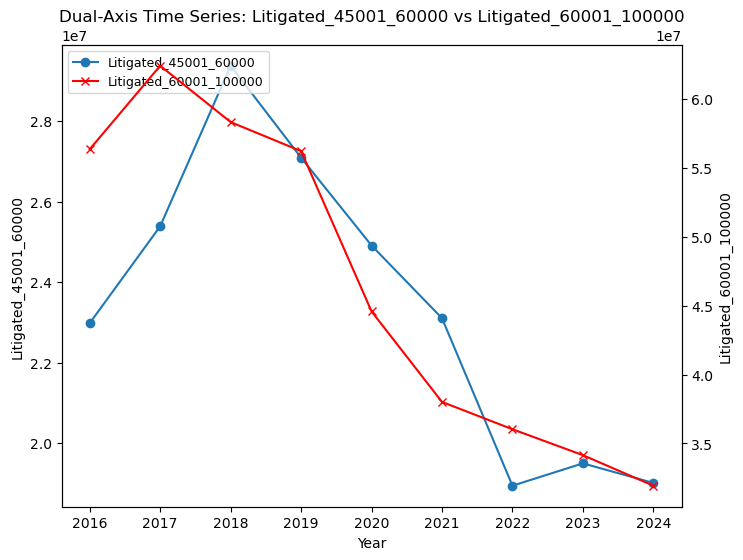

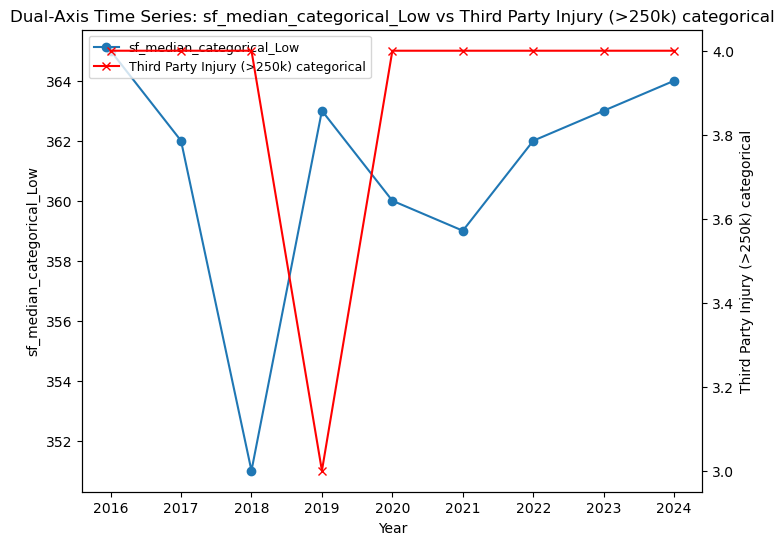

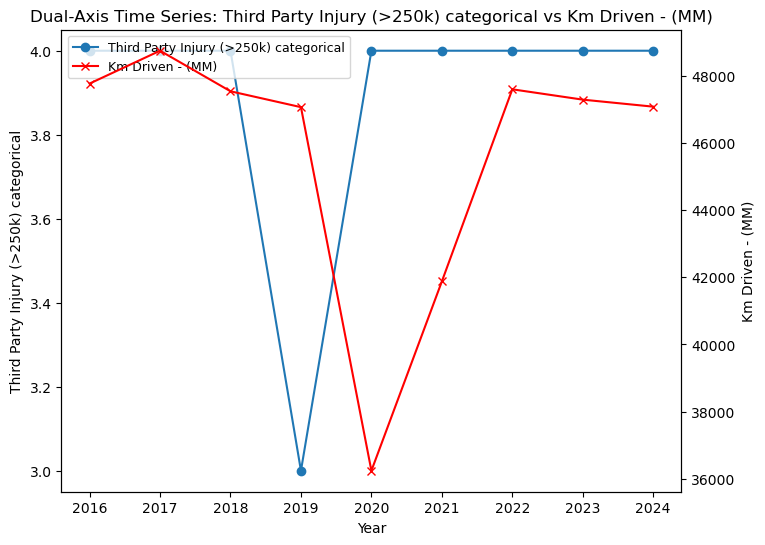

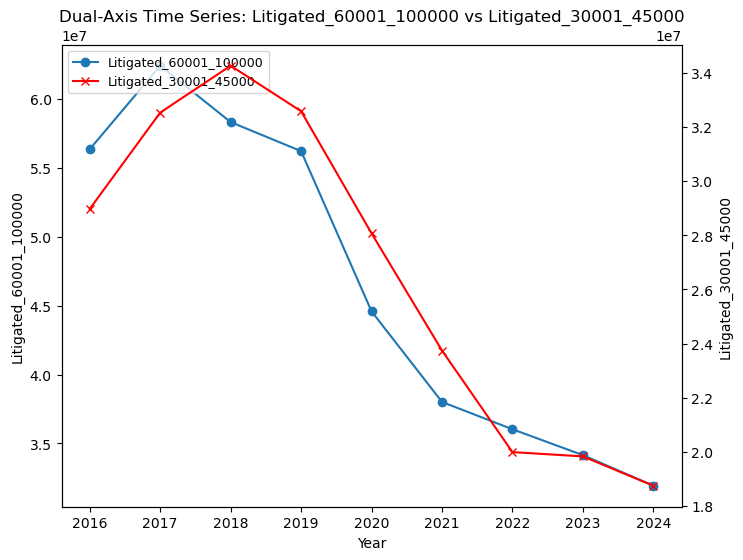

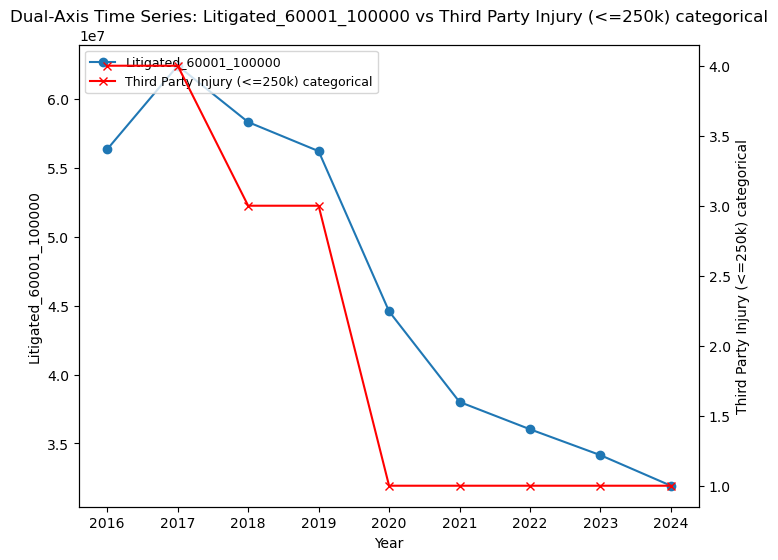

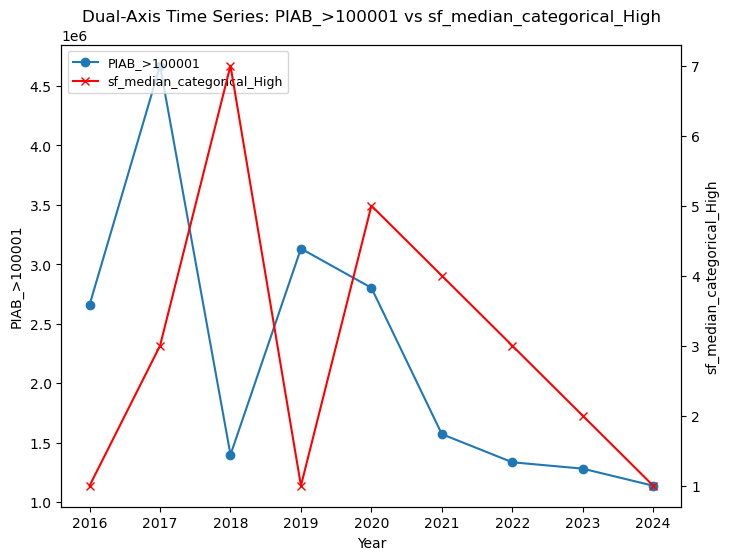

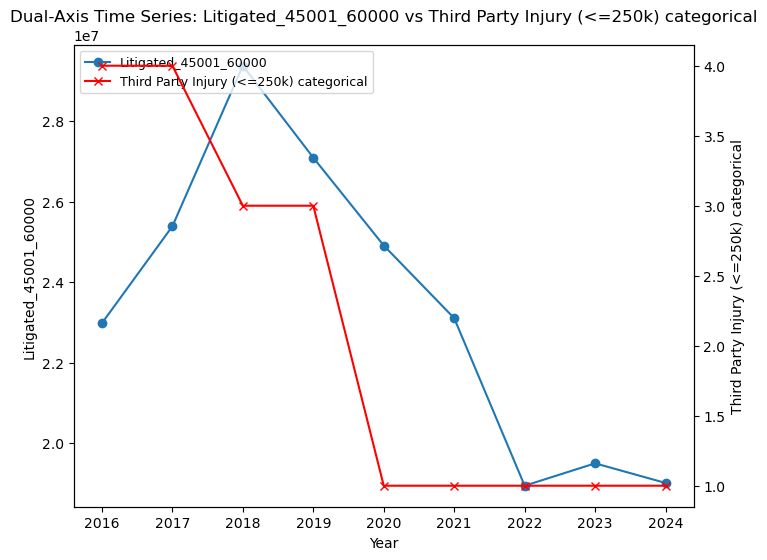

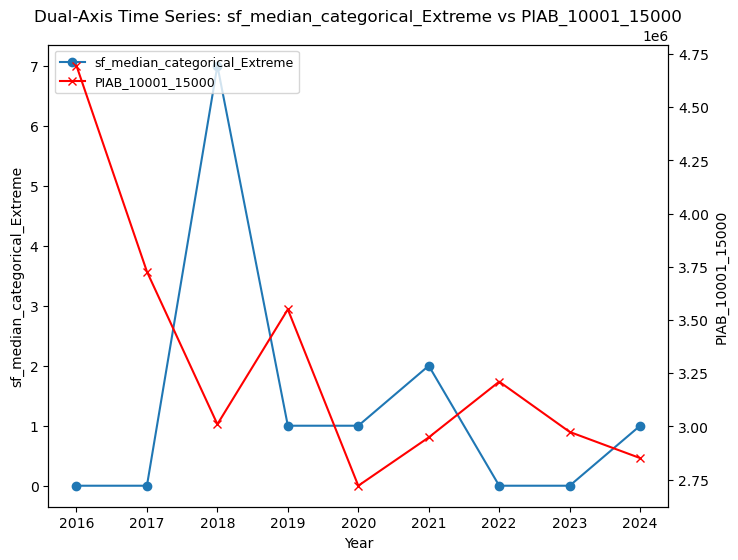

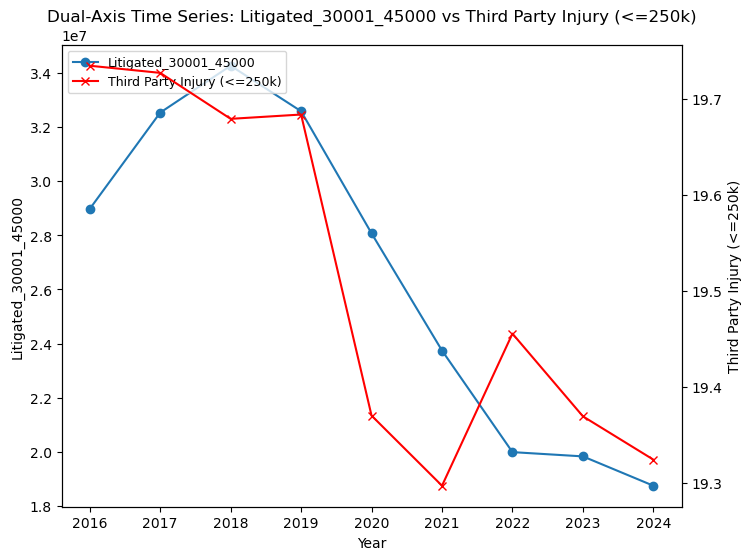

In [739]:
top10_cc = filtered_cross_corr.sort_values(by='Max Cross-Correlation', ascending=False).head(10)
#Year column drop above, manually creates the range of years
year = list(range(2016, 2025)) 
for col, row in top10_cc.iterrows():
    f1 = row['Feature 1']
    f2 = row['Feature 2']
    fig, ax1 = plt.subplots(figsize=(8, 6))
    ax1.plot(year, df_bivariate[f1], marker='o', label=f1)
    ax1.set_xlabel('Year')
    ax1.set_ylabel(f1)
    ax2 = ax1.twinx()
    ax2.plot(year, df_bivariate[f2], color='red', marker='x', label=f2)
    ax2.set_ylabel(f2)
    plt.title(f'Dual-Axis Time Series: {f1} vs {f2}')
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left', fontsize=9)
    plt.show()

it is evident that many pairings have cross correlation, this kind of behaviour might affect the outcome of the modeling section and it needs to be address before executing any model

the code above is analysing simple linear associations between variable's magnitudes. It provides a glance of impact of lags among the features. However if the same analysis is perform using derivates instead of magnitudes, it is possible to shocks in the data series. 
To proof this the analysis is going to be done and delta is calculated to check if there's an improvement.

### Cross-Correlation Levels

In [740]:
df_bivariate = df_main_1.copy()
df_bivariate = df_bivariate.drop(columns = 'Year')
features = df_bivariate.columns.tolist()
cross_correlation = []
for i in features:
    main_feature = df_bivariate[i]
    for j in features:
        secondary_feature = df_bivariate[j]
        if i == j: 
            continue
        else:
            f1 = main_feature.values
            f2 = secondary_feature.values
            # goal (delta)f(t) = f(t) - f(t-1) derivate function cannot be used in this case np.diff is needed instead
            f1_diff = np.diff(f1)
            f2_diff = np.diff(f2)
            x = (f1_diff - np.mean(f1_diff)) / np.std(f1_diff)
            y = (f2_diff - np.mean(f2_diff)) / np.std(f2_diff)
            n_diff = len(x)
            lag = np.arange(-n_diff + 1, n_diff)
            cc = np.correlate(y, x, mode='full') / n_diff
            lag_nonzero = lag[lag != 0]
            cc_nonzero = cc[lag != 0]
            max_ind = np.argmax(np.abs(cc_nonzero)) 
            max_cc = cc_nonzero[max_ind]
            lag_at_c = lag_nonzero[max_ind]
            cross_correlation.append({'Feature 1': i, 'Feature 2': j, 'Max Cross-Correlation': max_cc, 'Lag at Max': lag_at_c})
df_cross_correlation_d = pd.DataFrame(cross_correlation)
df_cross_correlation_d.sort_values(by='Max Cross-Correlation', ascending=False, inplace=True)
df_cross_correlation_d.reset_index(drop=True, inplace=True)
df_cross_correlation_d

,Feature 1,Feature 2,Max Cross-Correlation,Lag at Max
0,Km Driven - (MM),Third Party Injury (>250k),0.97,-1
1,Third Party Injury (>250k),Km Driven - (MM),0.97,1
2,sf_median_categorical_Low,Third Party Injury (>250k) categorical,0.95,1
3,Third Party Injury (>250k) categorical,sf_median_categorical_Low,0.95,-1
4,sf_median_categorical_High,PIAB_>100001,0.95,-1
...,...,...,...,...
2347,PIAB_45001_60000,Third Party Damage categorical,-0.92,-1
2348,PIAB_>100001,sf_median_categorical_Low,-0.93,1
2349,sf_median_categorical_Low,PIAB_>100001,-0.93,-1
2350,sf_median_categorical_Extreme,Third Party Injury (>250k) categorical,-0.96,1


In [741]:
filtered_cross_corr_d = df_cross_correlation_d.copy()
filtered_cross_corr_d = filtered_cross_corr_d[filtered_cross_corr_d['Feature 1'] != filtered_cross_corr_d['Feature 2']]
filtered_cross_corr_d['Pair'] = filtered_cross_corr_d.apply(lambda x: tuple(sorted([x['Feature 1'], x['Feature 2']])), axis=1)
filtered_cross_corr_d = filtered_cross_corr_d.drop_duplicates(subset='Pair').drop(columns='Pair')
filtered_cross_corr_d = filtered_cross_corr_d.reset_index(drop=True)
filtered_cross_corr_d

,Feature 1,Feature 2,Max Cross-Correlation,Lag at Max
0,Km Driven - (MM),Third Party Injury (>250k),0.97,-1
1,sf_median_categorical_Low,Third Party Injury (>250k) categorical,0.95,1
2,sf_median_categorical_High,PIAB_>100001,0.95,-1
3,tp_median_categorical_Extreme,PIAB_45001_60000,0.93,1
4,PIAB_60001_100000,Fixed Charges (€),0.92,1
...,...,...,...,...
1171,sf_median_categorical_Extreme,Third Party Damage categorical,-0.91,2
1172,Asset Damage categorical,Third Party Injury (>250k),-0.92,-3
1173,Third Party Damage categorical,PIAB_45001_60000,-0.92,1
1174,PIAB_>100001,sf_median_categorical_Low,-0.93,1


In [742]:
df_comparison = pd.merge(df_cross_correlation[['Feature 1', 'Feature 2', 'Max Cross-Correlation', 'Lag at Max']], df_cross_correlation_d[['Feature 1', 'Feature 2', 'Max Cross-Correlation', 'Lag at Max']],
                         on=['Feature 1', 'Feature 2'], how='inner')
df_comparison

,Feature 1,Feature 2,Max Cross-Correlation_x,Lag at Max_x,Max Cross-Correlation_y,Lag at Max_y
0,Third Party Injury (<=250k) categorical,Litigated_30001_45000,0.89,1,-0.61,-3
1,Litigated_30001_45000,Third Party Injury (<=250k) categorical,0.89,-1,-0.61,3
2,Litigated_45001_60000,Litigated_60001_100000,0.87,-1,0.71,-1
3,Litigated_60001_100000,Litigated_45001_60000,0.87,1,0.71,1
4,sf_median_categorical_Low,Third Party Injury (>250k) categorical,0.87,1,0.95,1
...,...,...,...,...,...,...
2347,Km Driven - (MM),sf_median_categorical_Extreme,-0.80,-2,-0.85,-2
2348,PIAB_>100001,sf_median_categorical_Low,-0.83,1,-0.93,1
2349,sf_median_categorical_Low,PIAB_>100001,-0.83,-1,-0.93,-1
2350,sf_median_categorical_Extreme,Third Party Injury (>250k) categorical,-0.94,1,-0.96,1


In [743]:
df_comparison['delta'] = abs(df_comparison['Max Cross-Correlation_x'] - df_comparison['Max Cross-Correlation_y'])
df_comparison = df_comparison.sort_values(by='delta', ascending=False)
df_comparison

,Feature 1,Feature 2,Max Cross-Correlation_x,Lag at Max_x,Max Cross-Correlation_y,Lag at Max_y,delta
262,Asset Damage categorical,Third Party Injury (>250k),0.70,-1,-0.92,-3,1.62
263,Third Party Injury (>250k),Asset Damage categorical,0.70,1,-0.92,3,1.62
10,Litigated_60001_100000,Third Party Injury (<=250k) categorical,0.85,-1,-0.75,3,1.60
11,Third Party Injury (<=250k) categorical,Litigated_60001_100000,0.85,1,-0.75,-3,1.60
62,Direct_60001_100000,Third Party Injury (<=250k),0.79,-1,-0.80,1,1.59
...,...,...,...,...,...,...,...
1872,tcc_median_categorical_Slight,Direct_>100001,-0.55,1,-0.55,-3,0.00
2206,Third Party Injury (>250k) categorical,tcc_median_categorical_Slight,-0.70,4,-0.70,4,0.00
2207,tcc_median_categorical_Slight,Third Party Injury (>250k) categorical,-0.70,-4,-0.70,-4,0.00
681,Vehicles Licenced,flood_risk,0.54,-1,0.54,-1,0.00


it is noticed that the correlation changed all across the board. for modeling purposes, option B is going to be considered, since it provides a better insight of the impact of change in the variables

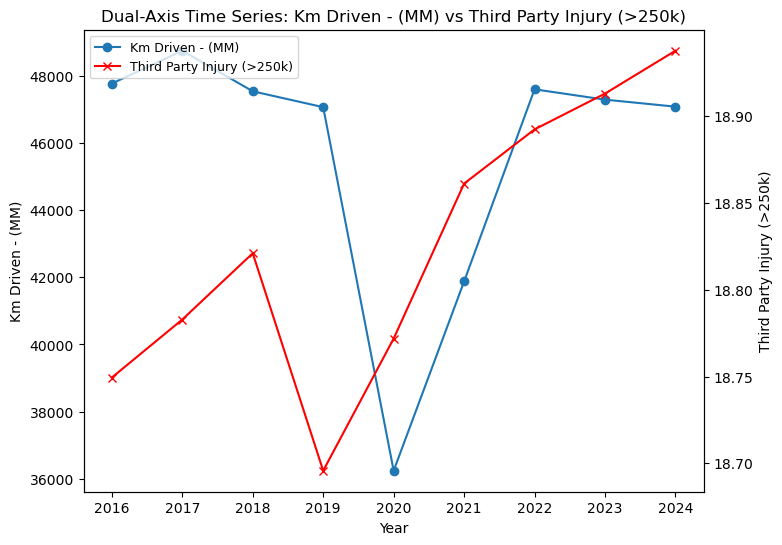

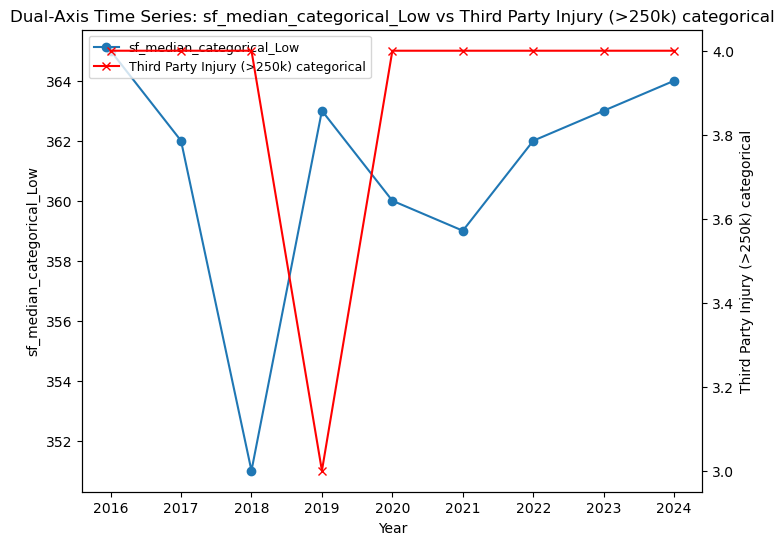

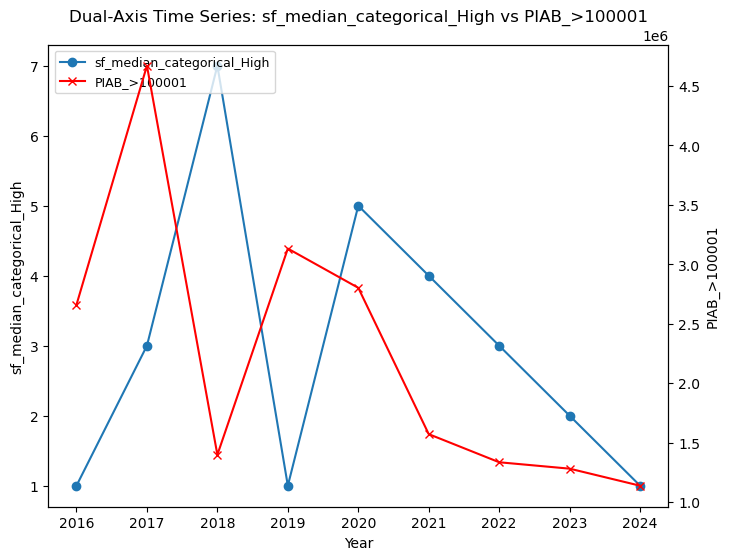

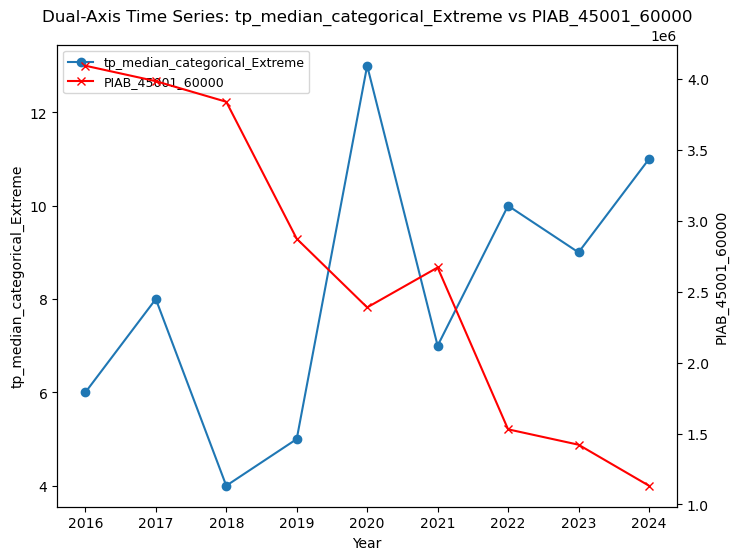

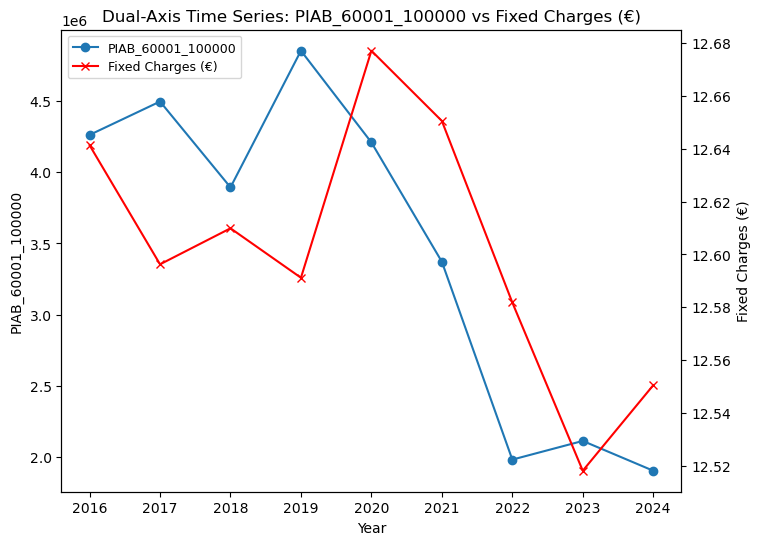

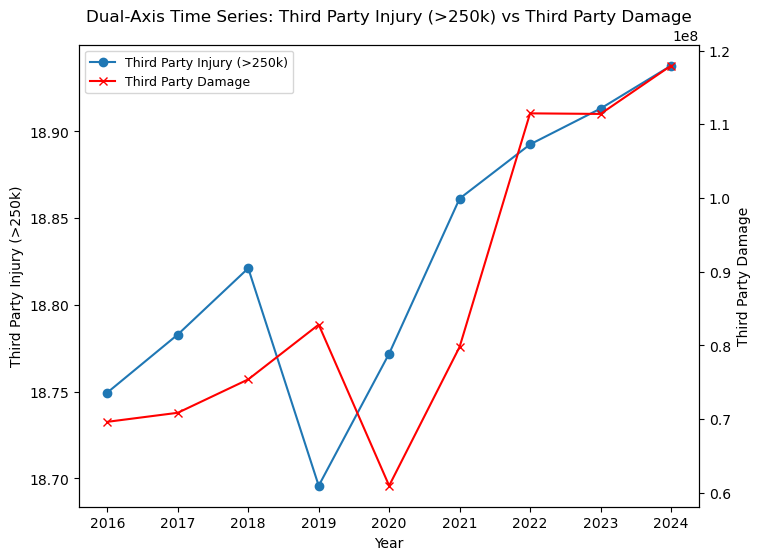

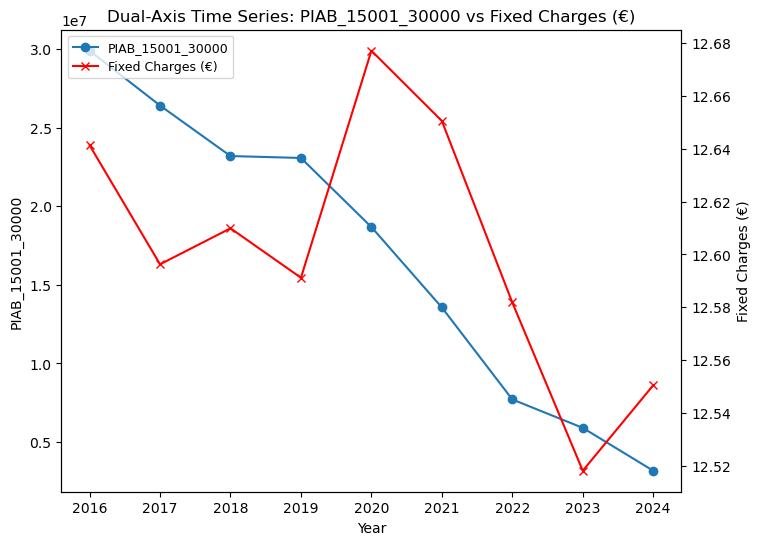

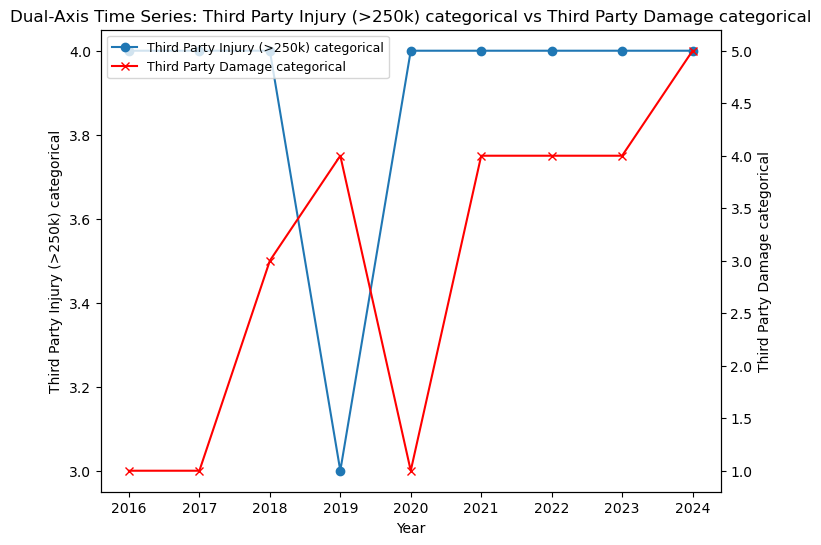

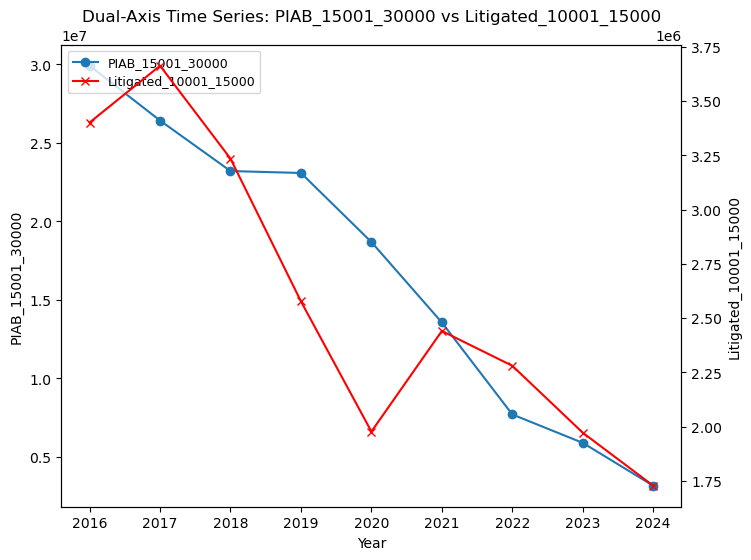

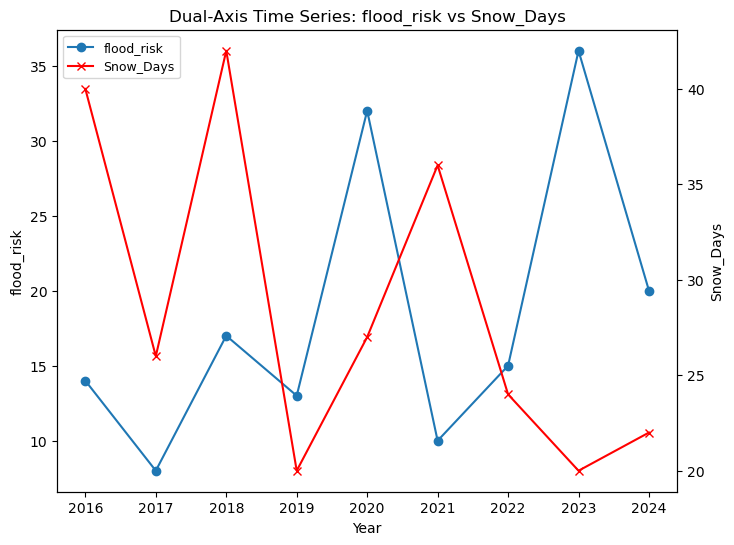

In [744]:
top10_cc_d = filtered_cross_corr_d.sort_values(by='Max Cross-Correlation', ascending=False).head(10)
#Year column drop above, manually creates the range of years
year = list(range(2016, 2025)) 
for col, row in top10_cc_d.iterrows():
    f1 = row['Feature 1']
    f2 = row['Feature 2']
    fig, ax1 = plt.subplots(figsize=(8, 6))
    ax1.plot(year, df_bivariate[f1], marker='o', label=f1)
    ax1.set_xlabel('Year')
    ax1.set_ylabel(f1)
    ax2 = ax1.twinx()
    ax2.plot(year, df_bivariate[f2], color='red', marker='x', label=f2)
    ax2.set_ylabel(f2)
    plt.title(f'Dual-Axis Time Series: {f1} vs {f2}')
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left', fontsize=9)
    plt.show()

### Categorical to numerical

Categorical variables were modified to ordinal in the data transformation section. it is important to consider than numerical analysis might mislead some information due to the category composition. Hence, correlation coeficients is going to be used to detect the categorical variables with higher correlation to numerical variables. An assessment is going to be perform to identify if there's valuable data for this features 

In [745]:
categorical_variables = ['Asset Damage categorical', 'Third Party Damage categorical', 'Third Party Injury (<=250k) categorical', 'Third Party Injury (>250k) categorical']
top5_corr_categorical = {}
for i in categorical_variables:
    #checking both columns is needed, i might b in 2 not only in 1
    temp_df = filtered_df[(filtered_df['Feature_1'] == i)| (filtered_df['Feature_2'] == i)].copy()
    temp_df = temp_df.sort_values(by='abs', ascending=False)
    top_5 = temp_df.head(5) 
    top_5['Categorical_Variable'] = i
    top5_corr_categorical[i] = top_5
top5_all = pd.concat(top5_corr_categorical.values(), ignore_index=True)
top5_all

,Feature_1,Feature_2,Pearson,Spearman,abs_Pearson,abs_Spearman,abs,Categorical_Variable
0,Asset Damage categorical,PIAB_0_10000,0.98,0.82,0.98,0.82,0.90,Asset Damage categorical
1,Asset Damage,Asset Damage categorical,0.98,0.82,0.98,0.82,0.90,Asset Damage categorical
2,Asset Damage categorical,Direct_45001_60000,-0.95,-0.82,0.95,0.82,0.89,Asset Damage categorical
3,Third Party Damage,Asset Damage categorical,0.95,0.82,0.95,0.82,0.89,Asset Damage categorical
4,Asset Damage categorical,Direct_15001_30000,-0.95,-0.82,0.95,0.82,0.88,Asset Damage categorical
5,Third Party Damage,Third Party Damage categorical,0.81,0.94,0.81,0.94,0.88,Third Party Damage categorical
6,Asset Damage,Third Party Damage categorical,0.75,0.94,0.75,0.94,0.84,Third Party Damage categorical
7,Third Party Damage categorical,PIAB_15001_30000,-0.76,-0.82,0.76,0.82,0.79,Third Party Damage categorical
8,Vehicles Licenced,Third Party Damage categorical,0.76,0.82,0.76,0.82,0.79,Third Party Damage categorical
9,Third Party Damage categorical,PIAB_30001_45000,-0.73,-0.82,0.73,0.82,0.78,Third Party Damage categorical


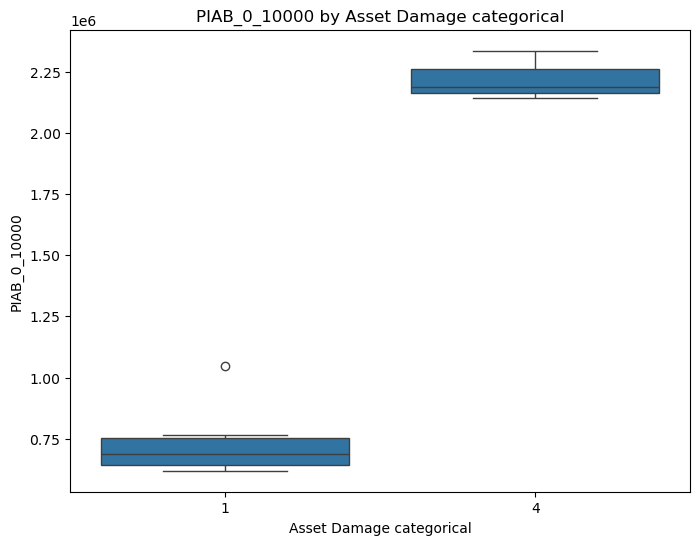

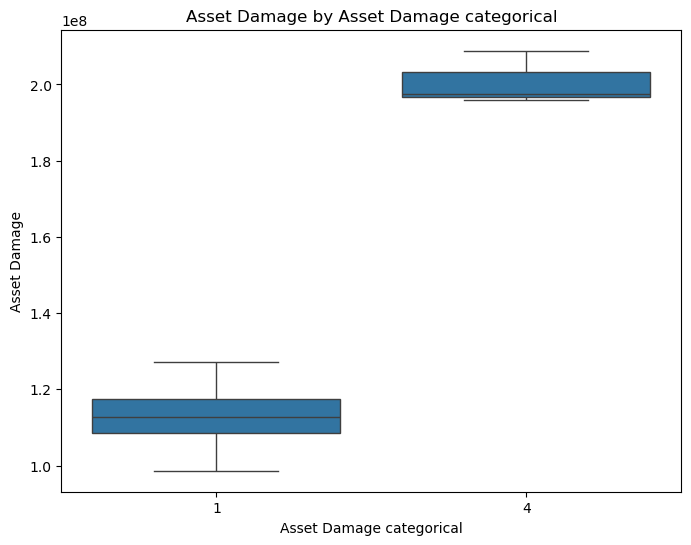

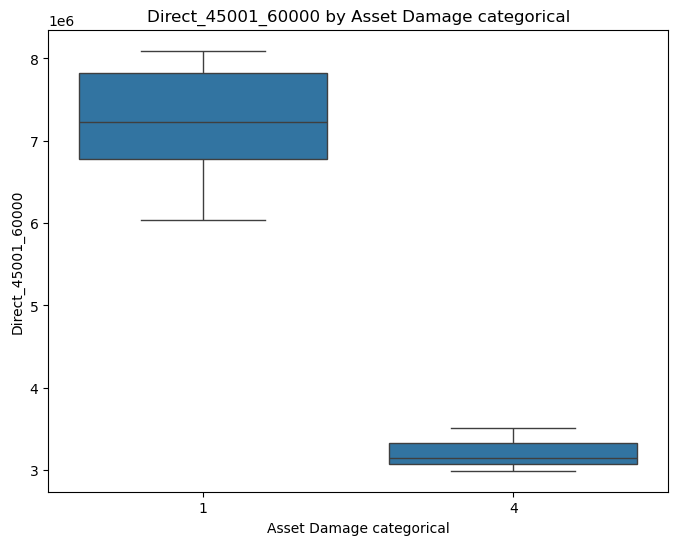

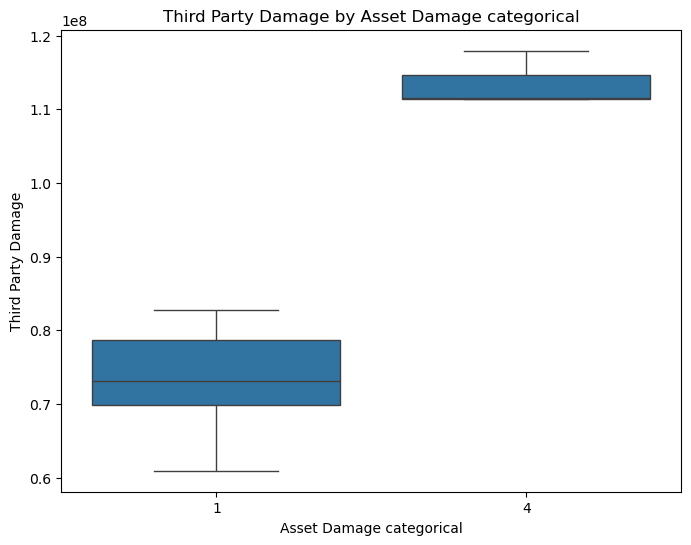

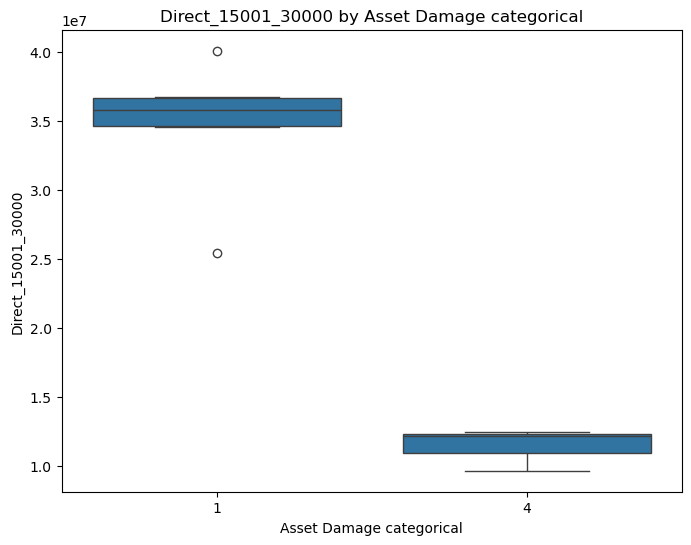

...

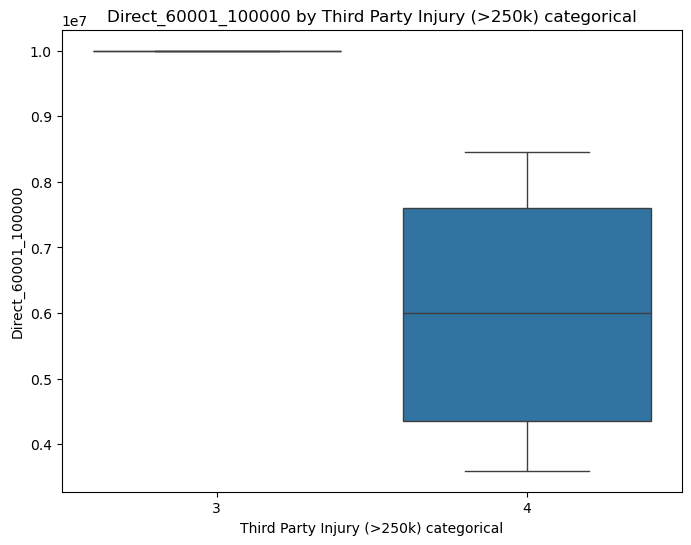

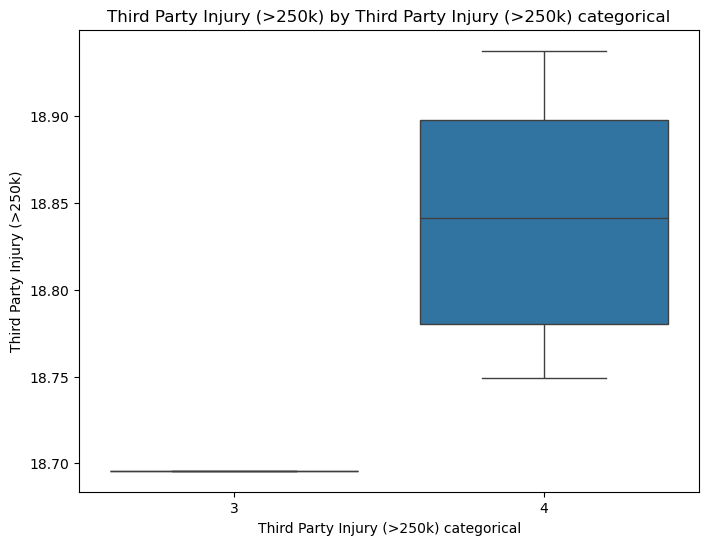

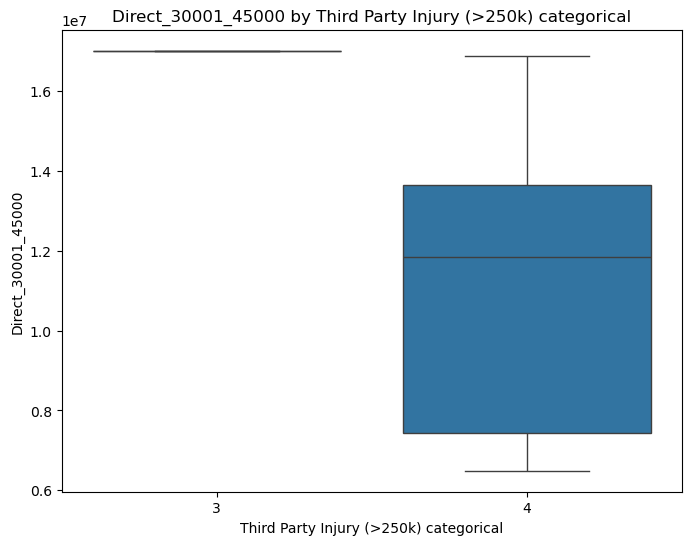

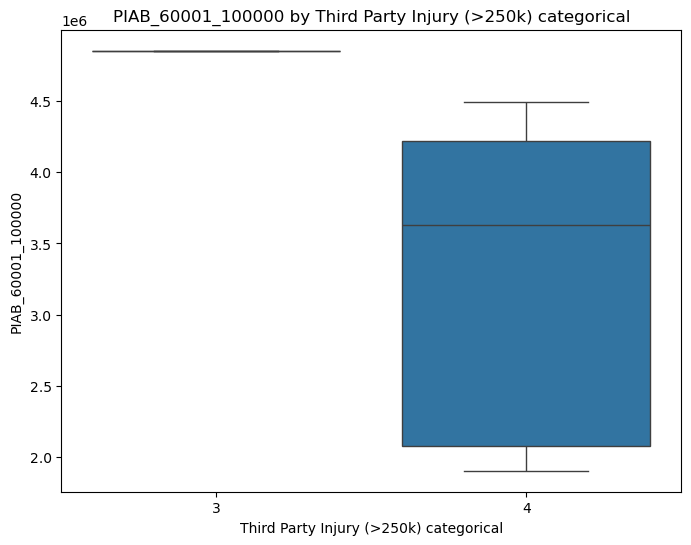

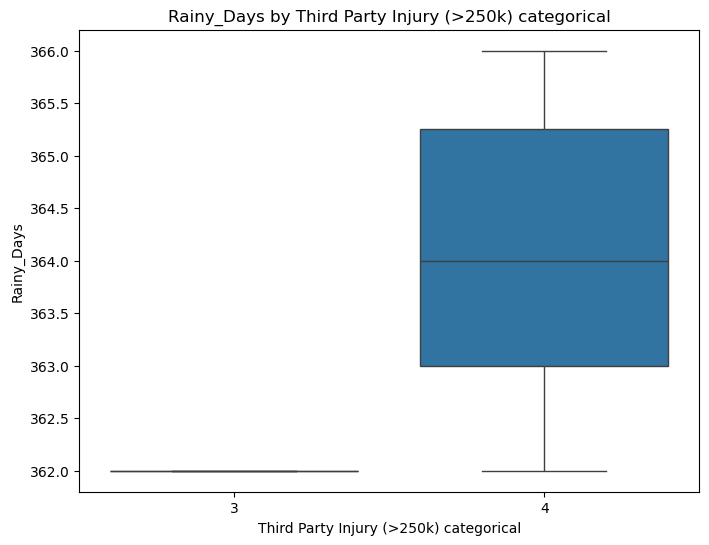

In [746]:
df_bivariate = df_main_1.copy()
categorical_variables = ['Asset Damage categorical', 'Third Party Damage categorical', 'Third Party Injury (<=250k) categorical', 'Third Party Injury (>250k) categorical']
for column, row in top5_all.iterrows():
    f1 = row['Feature_1']
    f2 = row['Feature_2']
    if f1 in categorical_variables:
        categorical = f1
        numerical = f2
    else:
        categorical = f2 
        numerical = f1 
    plt.figure(figsize=(8, 6))
    sns.boxplot(x=df_bivariate[categorical], y=df_bivariate[numerical])
    plt.title(f'{numerical} by {categorical}')
    plt.xlabel(categorical)
    plt.ylabel(numerical)
    plt.show()

<p>it is important to notice that most of the boxplots are telling the same story, the higher category (slight to extream) the higher the claim. some cases are the opposite, and it can be told that is in low monetary ranges that the behaviuor is spotted. </p>
<p>Some outliers are spotted but it might be to specific cases since is not a generalized behaviour</p>
<p>only rainy days can be spotted as weather having an impact of the degree of the categorical variable. Since the data is highly clustered and there's no access to regional data, it is not possible to make a deeper analysis of the feature interaction</p>


due to the size of the dataset, it is not possible to make a ANOVA analysis to deeply analyze this findings.

### Categorical vs Categorical

In [747]:
df_bivariate = df_main_1.copy()
categorical_variables = ['Asset Damage categorical', 'Third Party Damage categorical', 'Third Party Injury (<=250k) categorical', 'Third Party Injury (>250k) categorical'] 
cross_tabulation = {} 
for i in range(len(categorical_variables)):
    for j in range(i + 1, len(categorical_variables)):
        category1 = categorical_variables[i]
        category2 = categorical_variables[j]
        c = pd.crosstab(df_bivariate[category1], df_bivariate[category2])
        cross_tabulation[(category1, category2)] = c
        print(f'\n Cross-tabulation: {category1} vs {category2}')
        c_norm = c.div(c.sum(axis=1), axis=0) 
        dominant_col = c_norm.idxmax(axis=1)
        dominant_val = c_norm.max(axis=1)
        interpretation = pd.DataFrame({f'{category1} Category': c_norm.index, 'Dominant Category': dominant_col.values, 'Proportion': dominant_val.values})
        print(f'\n Cross-tabulation: {category1} vs {category2} (counts)')
        display(c)
        print(f'\n Row proportions (normalized)')
        display(c_norm.round(2))
        print(f'\n Dominant category per {category1}')
        display(interpretation)



 Cross-tabulation: Asset Damage categorical vs Third Party Damage categorical

 Cross-tabulation: Asset Damage categorical vs Third Party Damage categorical (counts)


Third Party Damage categorical,1,3,4,5
Asset Damage categorical,,,,
1,3,1,2,0
4,0,0,2,1



 Row proportions (normalized)


Third Party Damage categorical,1,3,4,5
Asset Damage categorical,,,,
1,0.50,0.17,0.33,0.00
4,0.00,0.00,0.67,0.33



 Dominant category per Asset Damage categorical


,Asset Damage categorical Category,Dominant Category,Proportion
0,1,1,0.50
1,4,4,0.67



 Cross-tabulation: Asset Damage categorical vs Third Party Injury (<=250k) categorical

 Cross-tabulation: Asset Damage categorical vs Third Party Injury (<=250k) categorical (counts)


Third Party Injury (<=250k) categorical,1,3,4
Asset Damage categorical,,,
1,2,2,2
4,3,0,0



 Row proportions (normalized)


Third Party Injury (<=250k) categorical,1,3,4
Asset Damage categorical,,,
1,0.33,0.33,0.33
4,1.00,0.00,0.00



 Dominant category per Asset Damage categorical


,Asset Damage categorical Category,Dominant Category,Proportion
0,1,1,0.33
1,4,1,1.00



 Cross-tabulation: Asset Damage categorical vs Third Party Injury (>250k) categorical

 Cross-tabulation: Asset Damage categorical vs Third Party Injury (>250k) categorical (counts)


Third Party Injury (>250k) categorical,3,4
Asset Damage categorical,,
1,1,5
4,0,3



 Row proportions (normalized)


Third Party Injury (>250k) categorical,3,4
Asset Damage categorical,,
1,0.17,0.83
4,0.00,1.00



 Dominant category per Asset Damage categorical


,Asset Damage categorical Category,Dominant Category,Proportion
0,1,4,0.83
1,4,4,1.00



 Cross-tabulation: Third Party Damage categorical vs Third Party Injury (<=250k) categorical

 Cross-tabulation: Third Party Damage categorical vs Third Party Injury (<=250k) categorical (counts)


Third Party Injury (<=250k) categorical,1,3,4
Third Party Damage categorical,,,
1,1,0,2
3,0,1,0
4,3,1,0
5,1,0,0



 Row proportions (normalized)


Third Party Injury (<=250k) categorical,1,3,4
Third Party Damage categorical,,,
1,0.33,0.00,0.67
3,0.00,1.00,0.00
4,0.75,0.25,0.00
5,1.00,0.00,0.00



 Dominant category per Third Party Damage categorical


,Third Party Damage categorical Category,Dominant Category,Proportion
0,1,4,0.67
1,3,3,1.00
2,4,1,0.75
3,5,1,1.00



 Cross-tabulation: Third Party Damage categorical vs Third Party Injury (>250k) categorical

 Cross-tabulation: Third Party Damage categorical vs Third Party Injury (>250k) categorical (counts)


Third Party Injury (>250k) categorical,3,4
Third Party Damage categorical,,
1,0,3
3,0,1
4,1,3
5,0,1



 Row proportions (normalized)


Third Party Injury (>250k) categorical,3,4
Third Party Damage categorical,,
1,0.00,1.00
3,0.00,1.00
4,0.25,0.75
5,0.00,1.00



 Dominant category per Third Party Damage categorical


,Third Party Damage categorical Category,Dominant Category,Proportion
0,1,4,1.00
1,3,4,1.00
2,4,4,0.75
3,5,4,1.00



 Cross-tabulation: Third Party Injury (<=250k) categorical vs Third Party Injury (>250k) categorical

 Cross-tabulation: Third Party Injury (<=250k) categorical vs Third Party Injury (>250k) categorical (counts)


Third Party Injury (>250k) categorical,3,4
Third Party Injury (<=250k) categorical,,
1,0,5
3,1,1
4,0,2



 Row proportions (normalized)


Third Party Injury (>250k) categorical,3,4
Third Party Injury (<=250k) categorical,,
1,0.00,1.00
3,0.50,0.50
4,0.00,1.00



 Dominant category per Third Party Injury (<=250k) categorical


,Third Party Injury (<=250k) categorical Category,Dominant Category,Proportion
0,1,4,1.00
1,3,3,0.50
2,4,4,1.00


it is important to notice that in most of the cases the dominant categories are 1 and 4 which means that the most common severity is low or high, having a low dominance of Extreme incidents (it might be related to injuries and casualty numbers). important to have into consideration for modeling purposes  

### Correlation target feature to many

Now to have a clear view of what is going on, the study is going to inspect solely the interaction of all features with the target feature

In [748]:
df_main_1.columns

Index(['Year', 'Vehicles Licenced', 'Km Driven - (MM)', 'Premiums (€)',
       'Fixed Charges (€)', 'Asset Damage', 'Third Party Damage',
       'Third Party Injury (<=250k)', 'Third Party Injury (>250k)',
       'Asset Damage categorical', 'Third Party Damage categorical',
       'Third Party Injury (<=250k) categorical',
       'Third Party Injury (>250k) categorical', 'Direct_0_10000',
       'Direct_10001_15000', 'Direct_15001_30000', 'Direct_30001_45000',
       'Direct_45001_60000', 'Direct_60001_100000', 'Direct_>100001',
       'Litigated_0_10000', 'Litigated_10001_15000', 'Litigated_15001_30000',
       'Litigated_30001_45000', 'Litigated_45001_60000',
       'Litigated_60001_100000', 'Litigated_>100001', 'PIAB_0_10000',
       'PIAB_10001_15000', 'PIAB_15001_30000', 'PIAB_30001_45000',
       'PIAB_45001_60000', 'PIAB_60001_100000', 'PIAB_>100001',
       'tp_median_categorical_Average', 'tp_median_categorical_Extreme',
       'tp_median_categorical_High', 'tp_median_categori

In [749]:
df_bivariate = df_main_1.copy()
df_bivariate = df_bivariate.drop(columns = 'Year')
features = df_bivariate.columns.tolist()
t_feature = 'Non-life insurance technical reserves'
correlations = []
for i in features:
    if i == t_feature:
        for j in features:
            secondary_feature = df_bivariate[j]
            if i == j:
                continue
            else:
                pearson_corr, _ = pearsonr(main_feature, secondary_feature)
                spearman_corr, _ = spearmanr(main_feature, secondary_feature)
                correlations.append({'Feature_1': t_feature, 'Feature_2': j, 'Pearson': pearson_corr, 'Spearman': spearman_corr})
correlations_df = pd.DataFrame(correlations)
correlations_df            

,Feature_1,Feature_2,Pearson,Spearman
0,Non-life insurance technical reserves,Vehicles Licenced,0.95,0.98
1,Non-life insurance technical reserves,Km Driven - (MM),-0.05,-0.40
2,Non-life insurance technical reserves,Premiums (€),0.73,0.55
3,Non-life insurance technical reserves,Fixed Charges (€),-0.60,-0.58
4,Non-life insurance technical reserves,Asset Damage,0.90,0.77
5,Non-life insurance technical reserves,Third Party Damage,0.85,0.77
6,Non-life insurance technical reserves,Third Party Injury (<=250k),-0.84,-0.82
7,Non-life insurance technical reserves,Third Party Injury (>250k),0.87,0.80
8,Non-life insurance technical reserves,Asset Damage categorical,0.88,0.82
9,Non-life insurance technical reserves,Third Party Damage categorical,0.68,0.79


In [750]:
filtered_corr = correlations_df 
filtered_corr['abs_Pearson'] = filtered_corr['Pearson'].abs()
filtered_corr['abs_Spearman'] = filtered_corr['Spearman'].abs()
filtered_corr['abs'] = (filtered_corr['abs_Pearson'] + filtered_corr['abs_Spearman']) / 2
filtered_corr_sorted = filtered_corr.sort_values(by='abs', ascending=False)
filtered_df = pd.DataFrame(filtered_corr_sorted)
filtered_df = filtered_df.reset_index(drop=True)
filtered_df.head(10)

,Feature_1,Feature_2,Pearson,Spearman,abs_Pearson,abs_Spearman,abs
0,Non-life insurance technical reserves,Litigated_15001_30000,-0.99,-0.98,0.99,0.98,0.99
1,Non-life insurance technical reserves,PIAB_30001_45000,-0.98,-0.98,0.98,0.98,0.98
2,Non-life insurance technical reserves,PIAB_15001_30000,-0.98,-0.98,0.98,0.98,0.98
3,Non-life insurance technical reserves,Vehicles Licenced,0.95,0.98,0.95,0.98,0.97
4,Non-life insurance technical reserves,Direct_10001_15000,-0.97,-0.95,0.97,0.95,0.96
5,Non-life insurance technical reserves,PIAB_45001_60000,-0.95,-0.97,0.95,0.97,0.96
6,Non-life insurance technical reserves,PIAB_0_10000,0.94,0.95,0.94,0.95,0.95
7,Non-life insurance technical reserves,Litigated_60001_100000,-0.95,-0.93,0.95,0.93,0.94
8,Non-life insurance technical reserves,Litigated_30001_45000,-0.95,-0.88,0.95,0.88,0.91
9,Non-life insurance technical reserves,Litigated_10001_15000,-0.84,-0.90,0.84,0.90,0.87


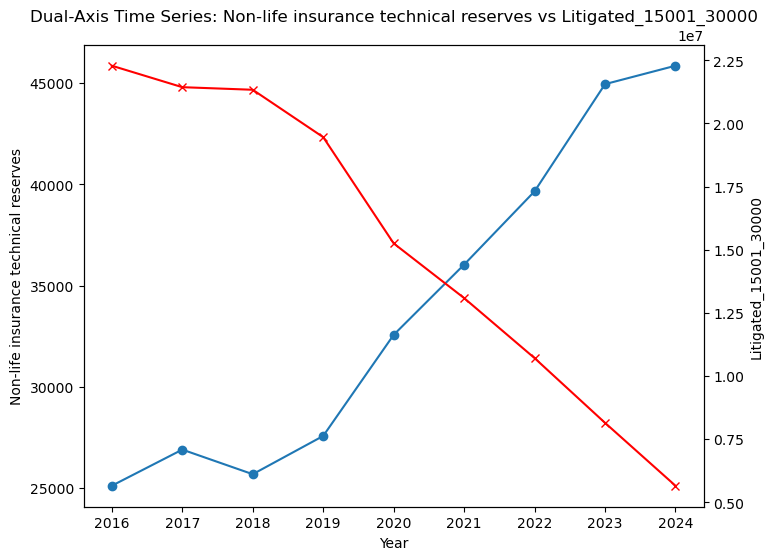

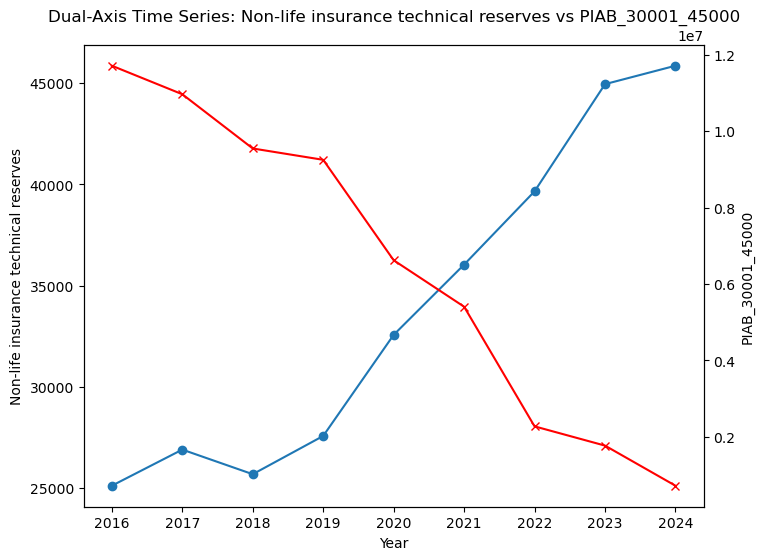

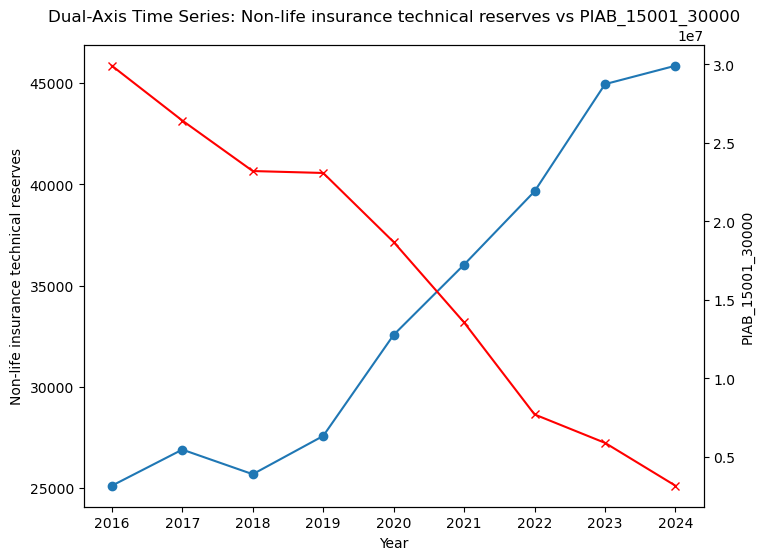

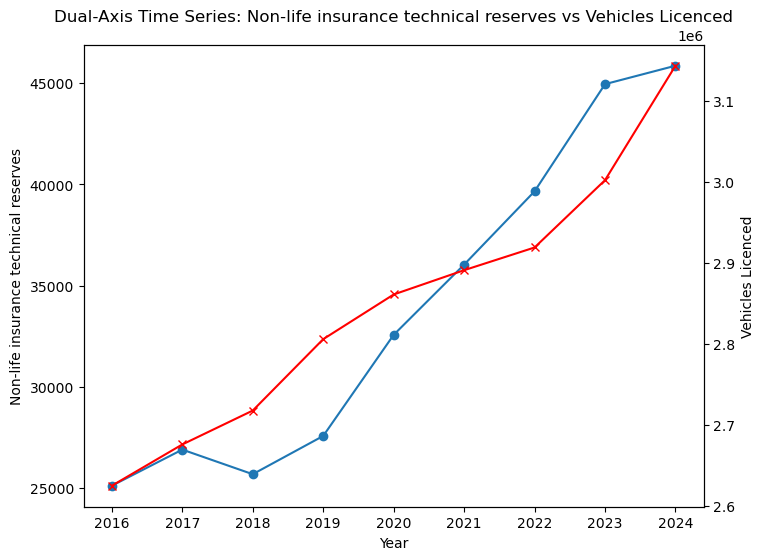

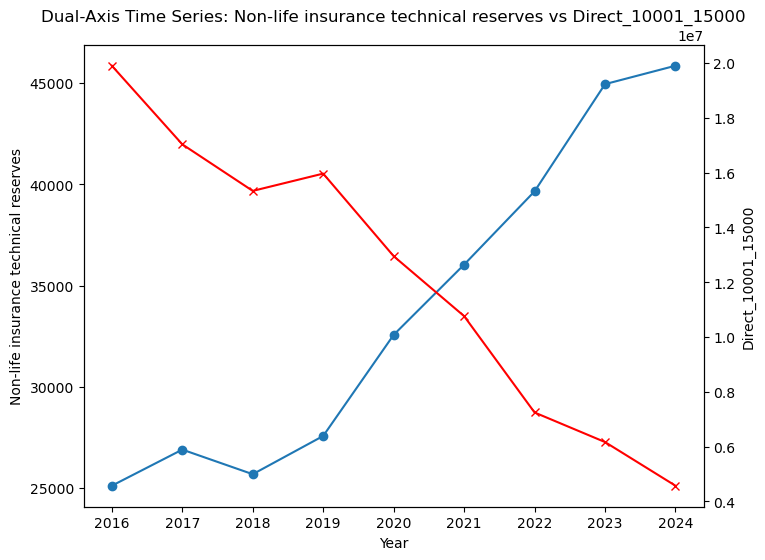

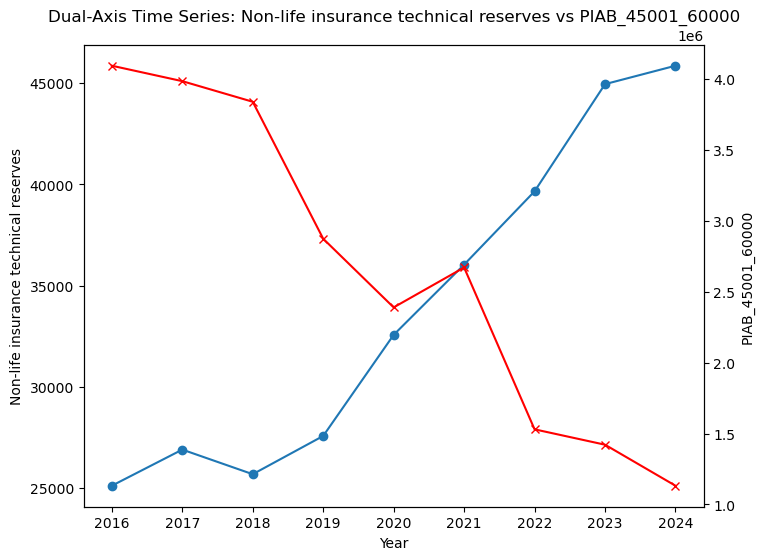

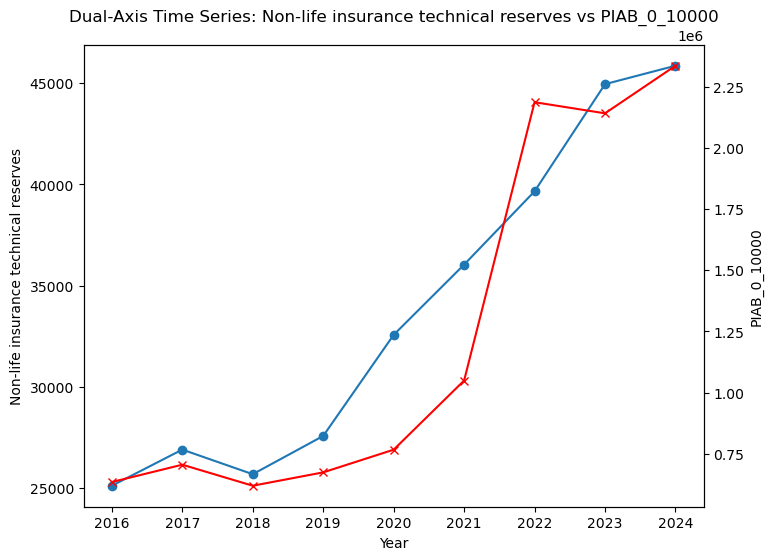

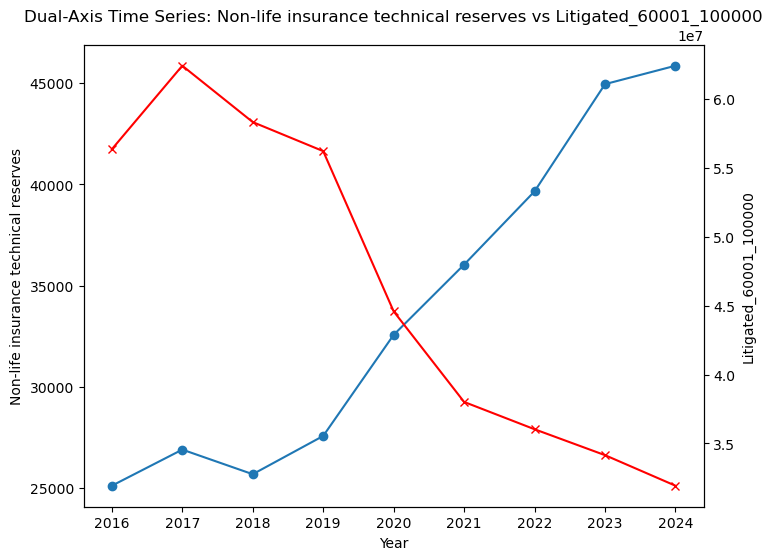

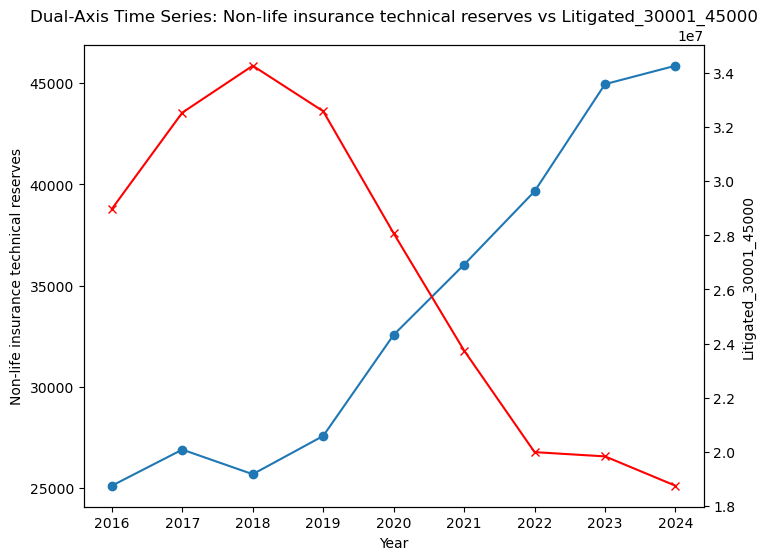

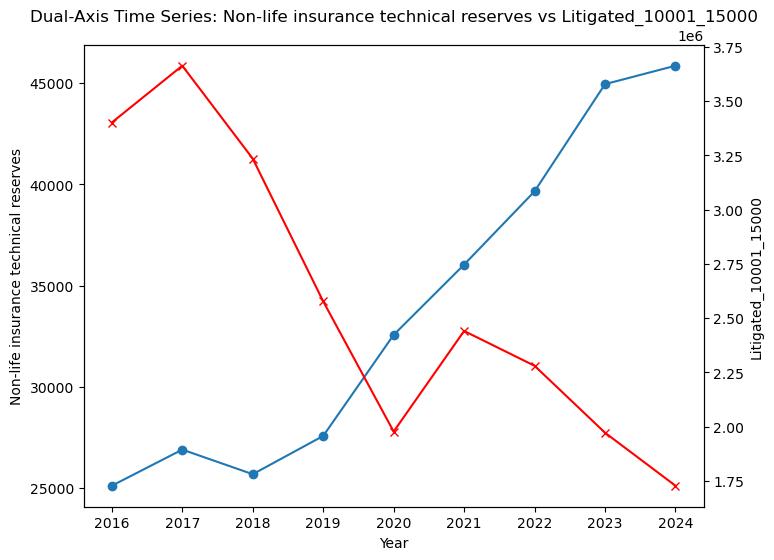

In [751]:
filtered_corr = filtered_df
top10 = filtered_corr.sort_values(by='abs', ascending=False).head(10)
#Year column drop above, manually creates the range of years
year = list(range(2016, 2025)) 
for col, row in top10.iterrows():
    f1 = row['Feature_1']
    f2 = row['Feature_2']
    fig, ax1 = plt.subplots(figsize=(8, 6))
    ax1.plot(year, df_bivariate[f1], marker='o', label=f1)
    ax1.set_xlabel('Year')
    ax1.set_ylabel(f1)
    ax2 = ax1.twinx()
    ax2.plot(year, df_bivariate[f2], color='red', marker='x', label=f2)
    ax2.set_ylabel(f2)
    plt.title(f'Dual-Axis Time Series: {f1} vs {f2}')
    plt.show()


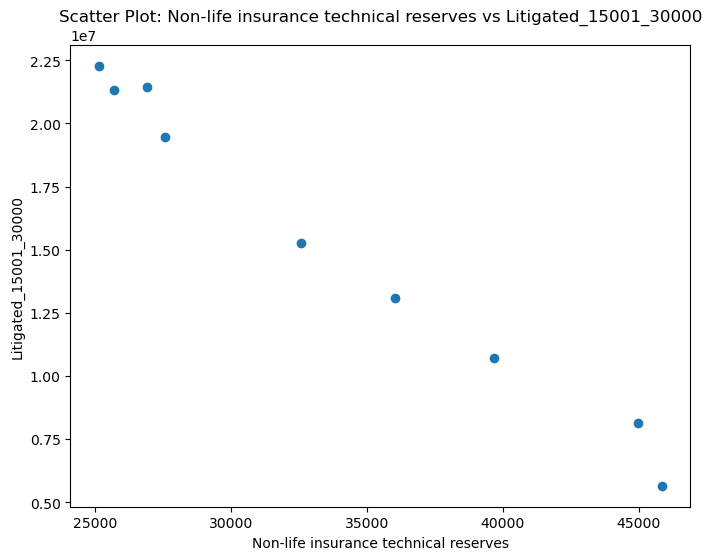

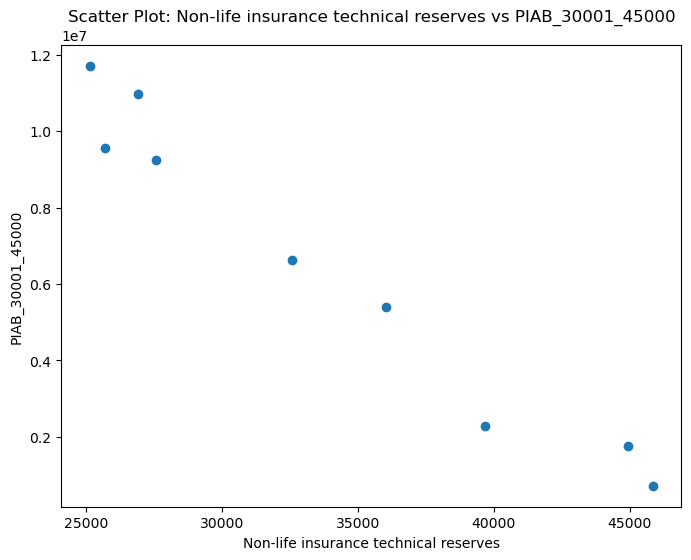

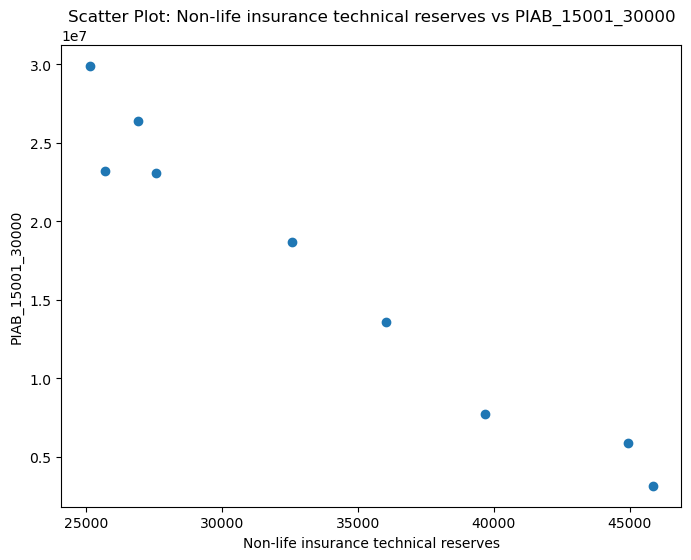

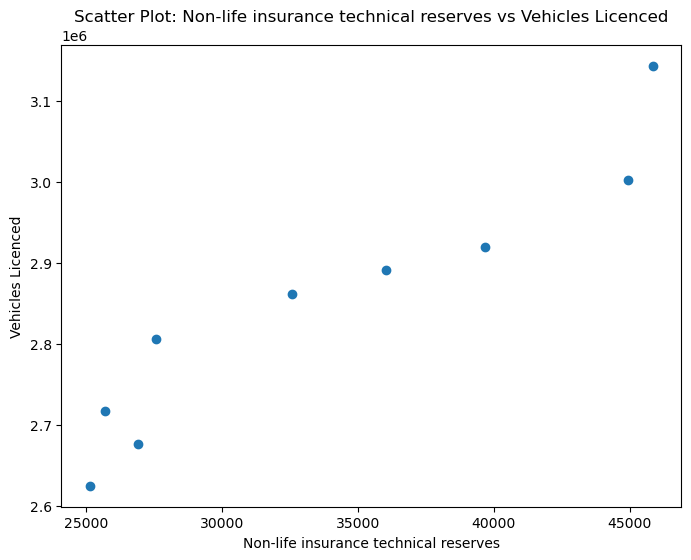

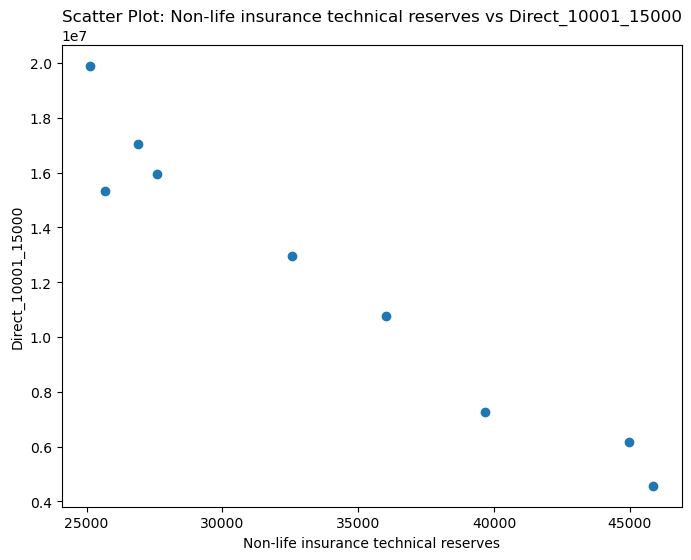

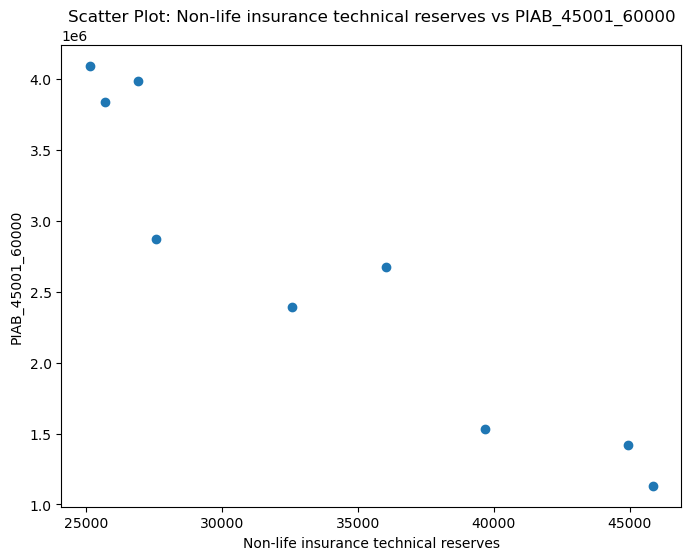

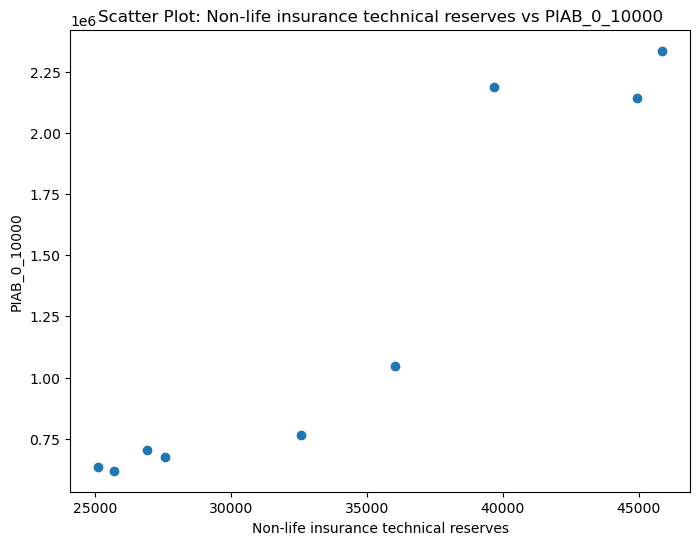

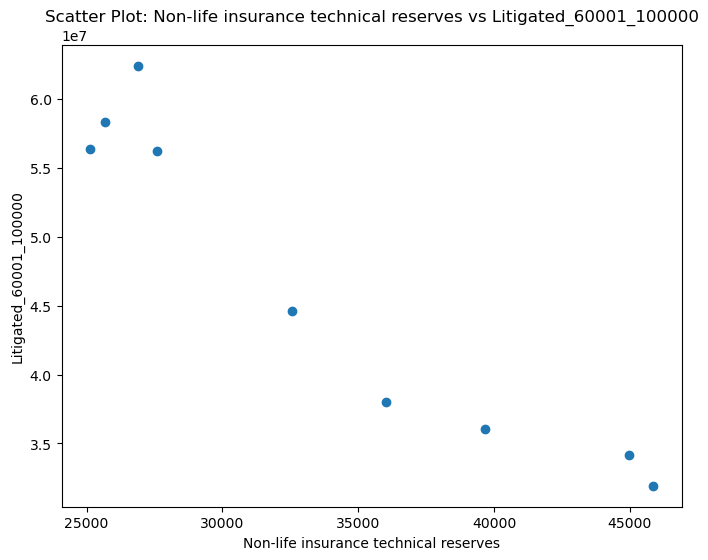

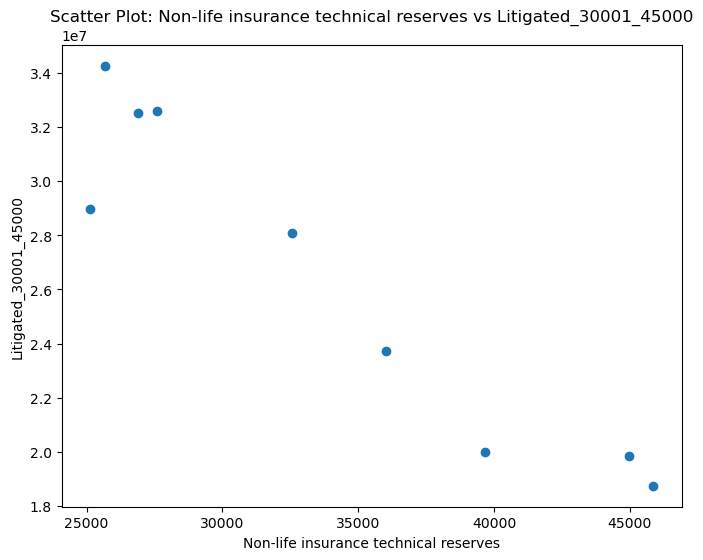

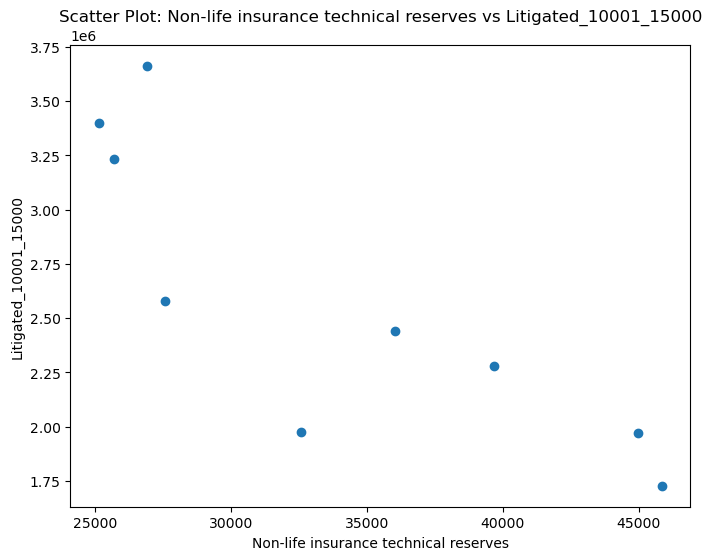

In [752]:
for col, row in top10.iterrows():
    f1 = row['Feature_1']
    f2 = row['Feature_2']
    plt.figure(figsize=(8, 6))
    plt.scatter(df_bivariate[f1], df_bivariate[f2])
    plt.xlabel(f1)
    plt.ylabel(f2)
    ax1.set_xlabel('Year')
    plt.title(f'Scatter Plot: {f1} vs {f2}')
    plt.show()

In [753]:
features = df_bivariate.columns.tolist()
cross_correlation = []
for i in features:
    if i == t_feature:
        main_feature = df_bivariate[i]
        for j in features:
            secondary_feature = df_bivariate[j]
            if i == j: 
                continue
            else:
                f1 = main_feature.values
                f2 = secondary_feature.values
                # goal (delta)f(t) = f(t) - f(t-1) derivate function cannot be used in this case np.diff is needed instead
                f1_diff = np.diff(f1)
                f2_diff = np.diff(f2)
                x = (f1_diff - np.mean(f1_diff)) / np.std(f1_diff)
                y = (f2_diff - np.mean(f2_diff)) / np.std(f2_diff)
                n_diff = len(x)
                lag = np.arange(-n_diff + 1, n_diff)
                cc = np.correlate(y, x, mode='full') / n_diff
                lag_nonzero = lag[lag != 0]
                cc_nonzero = cc[lag != 0]
                max_ind = np.argmax(np.abs(cc_nonzero)) 
                max_cc = cc_nonzero[max_ind]
                lag_at_c = lag_nonzero[max_ind]
                cross_correlation.append({'Feature 1': i, 'Feature 2': j, 'Max Cross-Correlation': max_cc, 'Lag at Max': lag_at_c})
df_cross_correlation_dt = pd.DataFrame(cross_correlation)
df_cross_correlation_dt.sort_values(by='Max Cross-Correlation', ascending=False, inplace=True)
df_cross_correlation_dt.reset_index(drop=True, inplace=True)
df_cross_correlation_dt


,Feature 1,Feature 2,Max Cross-Correlation,Lag at Max
0,Non-life insurance technical reserves,tp_median_categorical_Average,0.74,-1
1,Non-life insurance technical reserves,PIAB_10001_15000,0.73,-1
2,Non-life insurance technical reserves,Third Party Injury (<=250k),0.73,2
3,Non-life insurance technical reserves,Direct_0_10000,0.72,-1
4,Non-life insurance technical reserves,Third Party Injury (>250k),0.69,1
5,Non-life insurance technical reserves,tcc_median_categorical_Low,0.69,-1
6,Non-life insurance technical reserves,Third Party Damage,0.65,2
7,Non-life insurance technical reserves,Km Driven - (MM),0.65,2
8,Non-life insurance technical reserves,Third Party Injury (<=250k) categorical,0.64,2
9,Non-life insurance technical reserves,Litigated_10001_15000,0.60,1


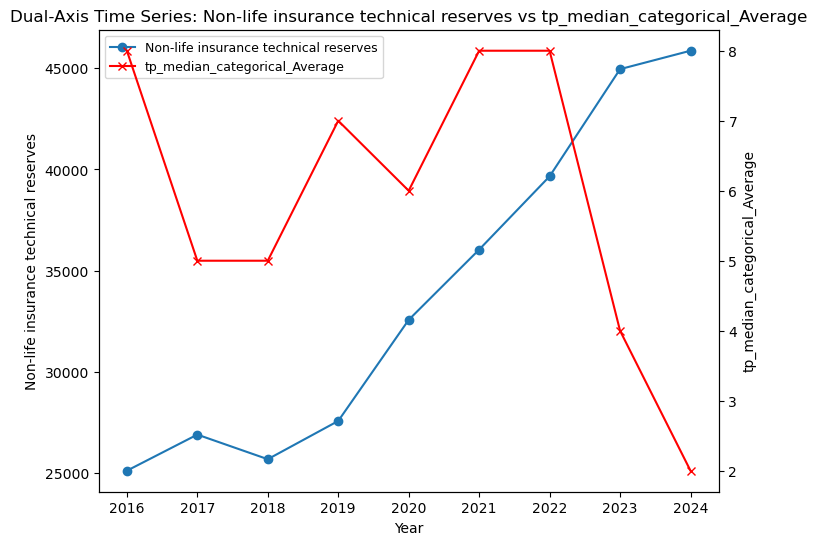

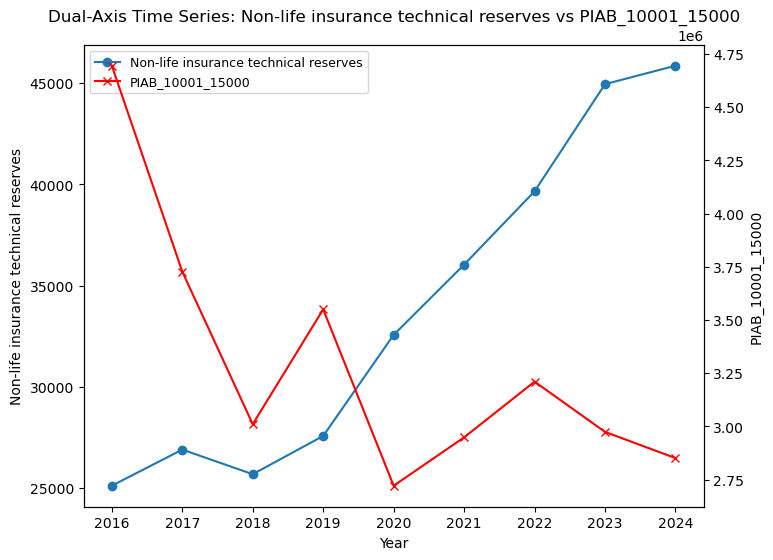

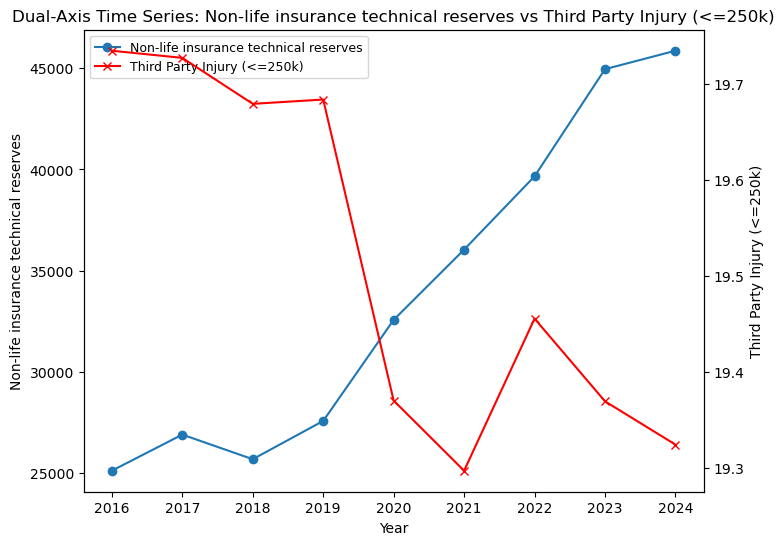

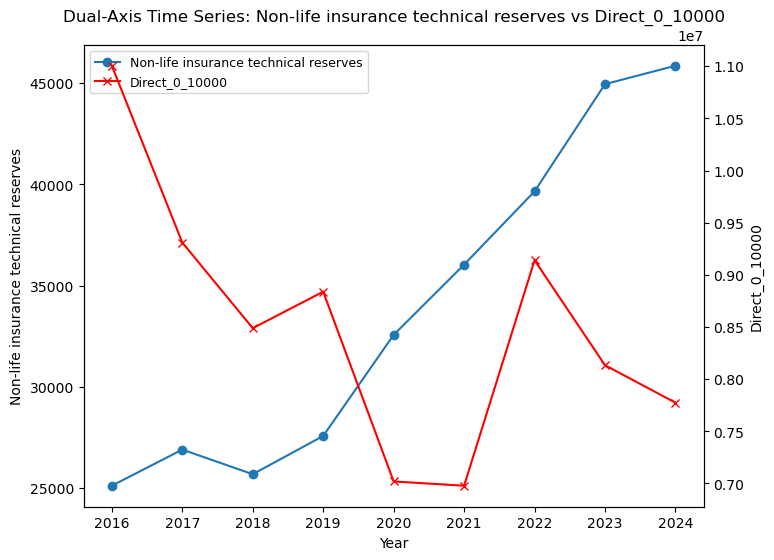

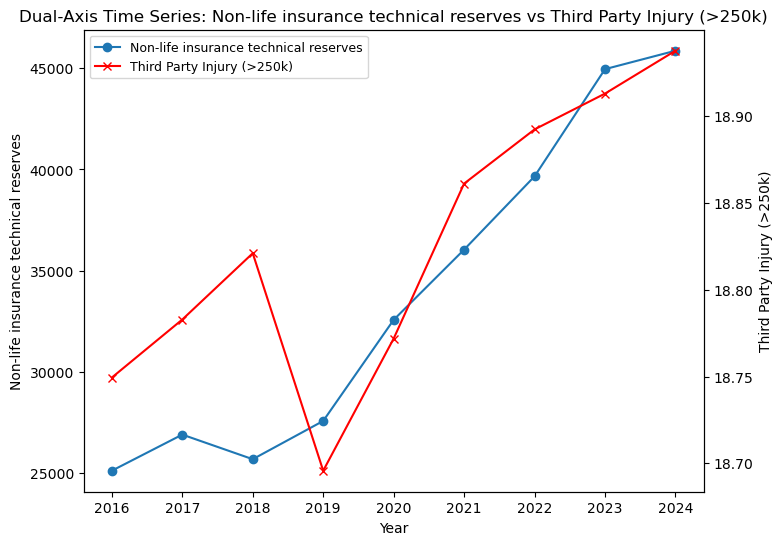

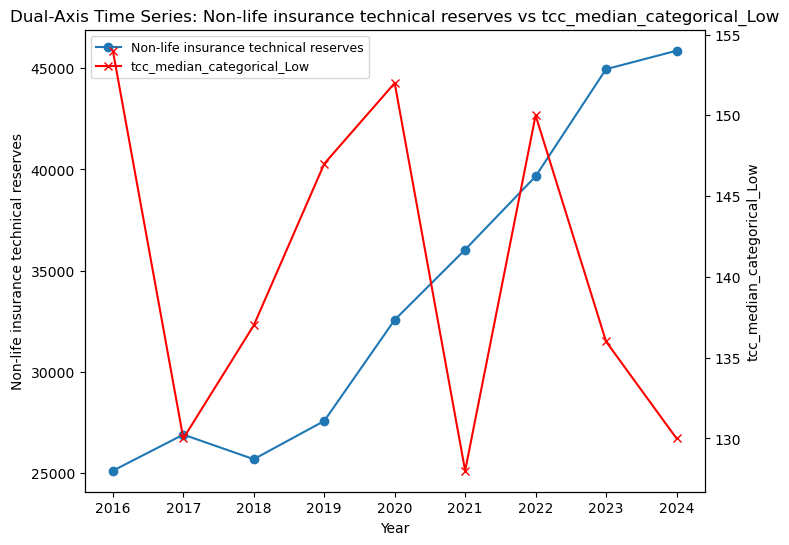

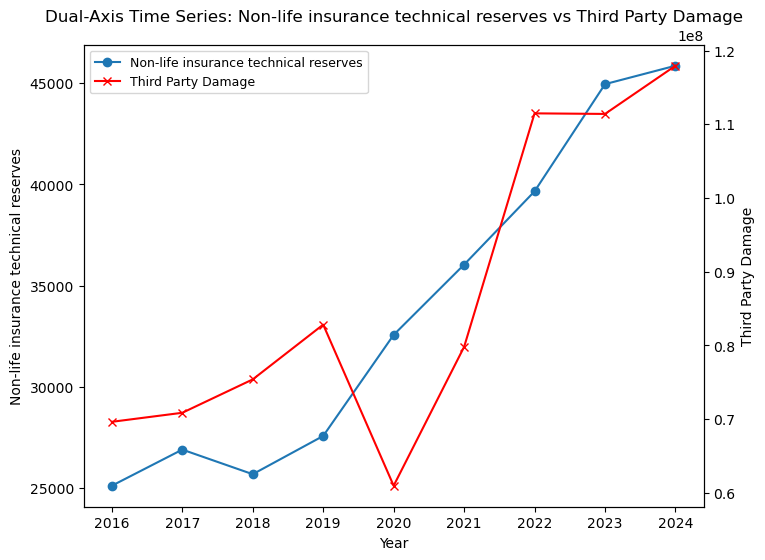

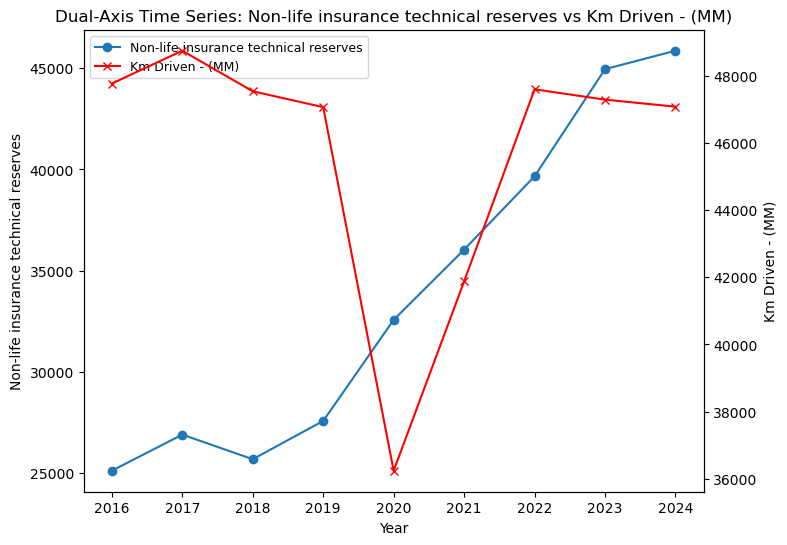

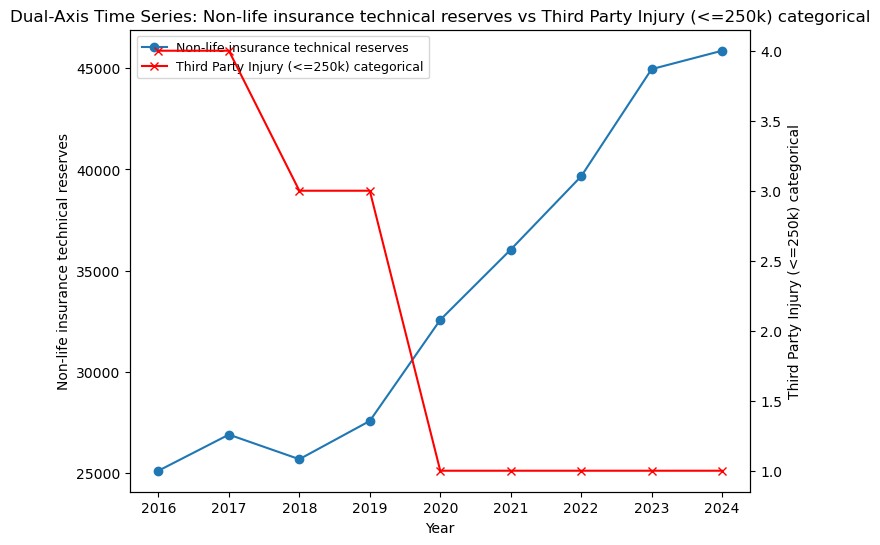

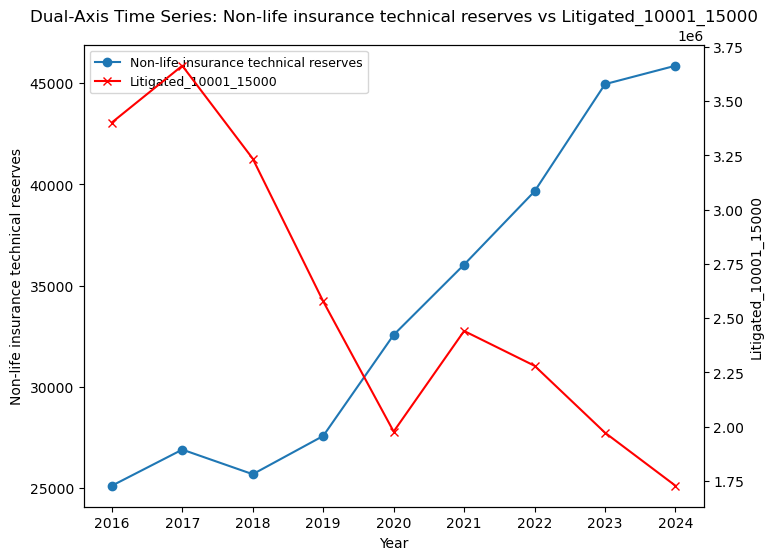

In [754]:
top10_cc_d = df_cross_correlation_dt.sort_values(by='Max Cross-Correlation', ascending=False).head(10)
#Year column drop above, manually creates the range of years
year = list(range(2016, 2025)) 
for col, row in top10_cc_d.iterrows():
    f1 = row['Feature 1']
    f2 = row['Feature 2']
    fig, ax1 = plt.subplots(figsize=(8, 6))
    ax1.plot(year, df_bivariate[f1], marker='o', label=f1)
    ax1.set_xlabel('Year')
    ax1.set_ylabel(f1)
    ax2 = ax1.twinx()
    ax2.plot(year, df_bivariate[f2], color='red', marker='x', label=f2)
    ax2.set_ylabel(f2)
    plt.title(f'Dual-Axis Time Series: {f1} vs {f2}')
    lines1, labels1 = ax1.get_legend_handles_labels()
    lines2, labels2 = ax2.get_legend_handles_labels()
    ax1.legend(lines1 + lines2, labels1 + labels2, loc='upper left', fontsize=9)
    plt.show()


2 things can be identify in the numerical results and graphical results: 
1. Covid restriction are misleading 2020 data. this can have a huge impact at the time of the modeling and needs to be verified on the outliers section and addressed in the feature engineering section.
2. it is evident in the positive correlated variables, that the impact is seen with a lag. this might be due to risk management policies. and the model section will proof this theory.

Heatmap

In [755]:
top6_cc_d = df_cross_correlation_dt.sort_values(by='Max Cross-Correlation', ascending=False).head(20)
heatmap_data = top6_cc_d.pivot(index='Feature 1', columns='Feature 2', values='Max Cross-Correlation')
heatmap_data

Feature 2,Asset Damage,Direct_0_10000,Km Driven - (MM),Litigated_10001_15000,PIAB_10001_15000,PIAB_>100001,Rainy_Days,Snow_Days,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (<=250k) categorical,Third Party Injury (>250k),Vehicles Licenced,flood_risk,sf_median_categorical_Extreme,tcc_median_categorical_Low,tp_median_categorical_Average,tp_median_categorical_Extreme,tp_median_categorical_High,tp_median_categorical_Low
Feature 1,,,,,,,,,,,,,,,,,,,,
Non-life insurance technical reserves,0.59,0.72,0.65,0.60,0.73,0.44,0.41,0.46,0.65,0.73,0.64,0.69,0.58,0.43,0.52,0.69,0.74,0.46,0.41,-0.40


### Heatmap - cross correlation target feature to many

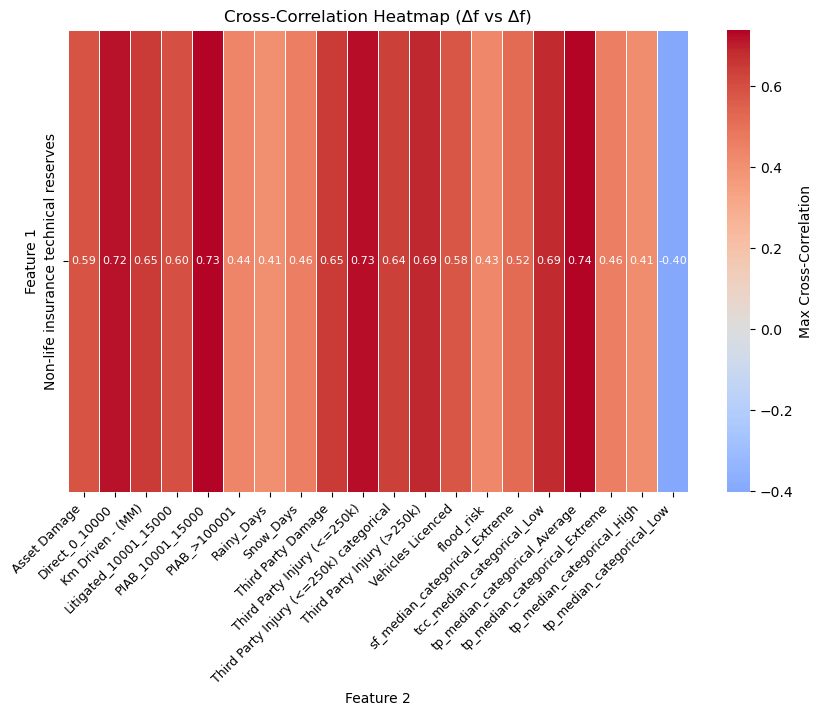

In [756]:
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', center=0, fmt='.2f', linewidths=0.5, cbar_kws={'label': 'Max Cross-Correlation'}, annot_kws={"size": 8})
plt.title('Cross-Correlation Heatmap (Δf vs Δf)')
plt.xlabel('Feature 2')
plt.ylabel('Feature 1')
plt.xticks(rotation=45, ha='right', fontsize=9)

plt.show()

### heatmap many to many

In [757]:
heatmap_lag_all = df_cross_correlation_d.pivot(index='Feature 1', columns='Feature 2', values='Max Cross-Correlation').fillna(0)



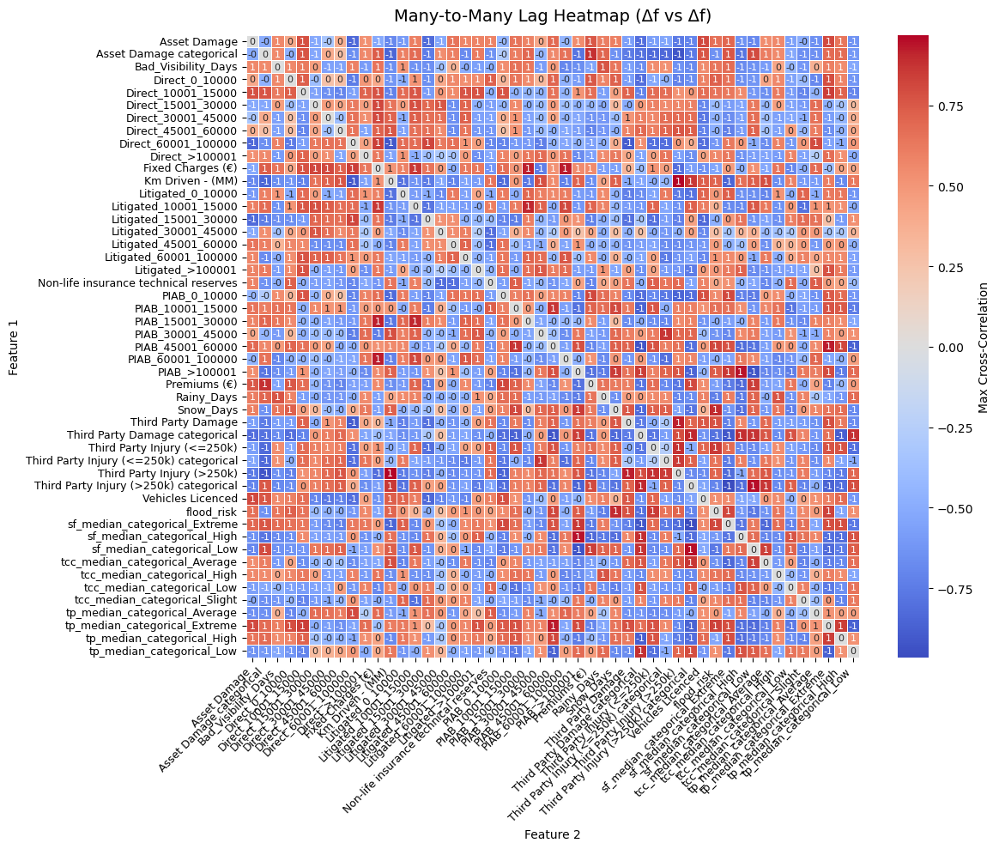

In [758]:
plt.figure(figsize=(12, 10))
sns.heatmap(heatmap_lag_all, cmap='coolwarm', center=0, annot=True, fmt='.0f', linewidths=0.6, cbar_kws={'label': 'Max Cross-Correlation'}, annot_kws={'size': 8})
plt.title('Many-to-Many Lag Heatmap (Δf vs Δf)', fontsize=14, pad=12)
plt.xticks(rotation=45, ha='right', fontsize=9)
plt.yticks(rotation=0, fontsize=9)
plt.tight_layout()
plt.show()


as it can be seen based on the cross correlation matrix levels, many variables has a soft impact on the target variable (non life insurance technical reserves), however are highly influencing the bihaviour of high impact variables. a feature (name of the technique to select the best variables for a model) is going to be run before modeling in order to select high influence variables to target featuare and influential variables for the model as a whole. additionally in the feature ingineer section, a Covid dummy is going to be added in orger to mitigate the impact on covid in this dataseries identified in this section

## outliers 

in this section z-score is going to be used as a method to identify outliers based on statitical algorithms to easily perform the task. Many outliers were detected using box plots in previous sections of this study, now it is going to be identify the year for each variable and make decisions based on z-score results

In [759]:
from scipy import stats
df_outliers =  df_main_1.copy() 
df_outliers = df_outliers.drop(columns= 'Year')  
z_scores = np.abs(stats.zscore(df_outliers, nan_policy='omit'))
z_scores_df = pd.DataFrame(z_scores, columns=df_outliers.columns, index=df_outliers.index)
mask = (z_scores_df > 2)
outliers_long = mask.stack().reset_index()
outliers_long.columns = ['Year_Index', 'Feature', 'Is_Outlier']
# is outlier column is true or false
# filter the df by boolean column
outliers_long = outliers_long[outliers_long['Is_Outlier']]
outliers_long

,Year_Index,Feature,Is_Outlier
12,0,Direct_0_10000,True
27,0,PIAB_10001_15000,True
68,1,Litigated_0_10000,True
81,1,PIAB_>100001,True
139,2,sf_median_categorical_Extreme,True
140,2,sf_median_categorical_High,True
141,2,sf_median_categorical_Low,True
158,3,Third Party Injury (>250k) categorical,True
197,4,Km Driven - (MM),True
383,7,tcc_median_categorical_Slight,True


1. weather related features (sf_median_categorical_Extreme, sf_median_categorical_High, sf_median_categorical_Low, tcc_median_categorical_Slight) as analyzed by I charts, are influenced either by a trend change (which justifies the outlier).
2. Km driven is a consequance of Covid restrictions. Feature engineer is intended to create a dummy covid feature to help the model minimize the impact of changes in trends, cross correlation influence produce by covid lags, and/or outliers (as this case)
3. Due to the high correlation of  Direct_0_10000, PIAB_10001_15000, litigated_0_10000 and PIAB > 100001 (all of those being a top 10 in the abs assessment, are going to be kept as outliers due to the capacity to explain the target variable

## Feature engineering

<p>Feature engineer has been already implemented in this project creating the feature "Flood risk" to have a better understanding of the weather related features. As proven by the cross correlation analysis a new feature is needed to provide strenght to the model due to the impact of COVID in this dataset.</p> 
<p>Since the dataframe is time series, it is important to some models don't have the capability to understand years as we do, it is important to implicitely tell the model this using a linear growth trend. this feature is going to be added in this section too.</p>
<p>A lagged version of the variables is going to be created to measure the impact of the cross correlation into the model</p>
<p></p>if the model is not capable of perform the objectives of this study, this section is going to be redone in order to get more insights and a better get a better understanding of the data.</p>

In [760]:
year = list(range(2016, 2025))
covid_dummy = [0, 0, 0, 0, 1, 1, 0, 0, 0] 
covid_dummy_df = pd.DataFrame({'Year': year, 'Covid_dummy': covid_dummy}) 
covid_dummy_df

,Year,Covid_dummy
0,2016,0
1,2017,0
2,2018,0
3,2019,0
4,2020,1
5,2021,1
6,2022,0
7,2023,0
8,2024,0


In [761]:
df_fe_f = df_main_1.copy()
df_fe_f['Time_Index'] = df_fe_f.index

In [762]:
#the pivot table needs to be transposed to be able to create the dictionary
cross_corr_dummy = (df_cross_correlation_dt.pivot(index='Feature 1', columns='Feature 2', values='Lag at Max')).T
target_variable = 'Non-life insurance technical reserves' 
lag_series = cross_corr_dummy[target_variable]
lag_dict = lag_series.to_dict()
lag_dict

{'Asset Damage': 2,
 'Asset Damage categorical': 4,
 'Bad_Visibility_Days': -1,
 'Direct_0_10000': -1,
 'Direct_10001_15000': 1,
 'Direct_15001_30000': 1,
 'Direct_30001_45000': 1,
 'Direct_45001_60000': -1,
 'Direct_60001_100000': 1,
 'Direct_>100001': -1,
 'Fixed Charges (€)': 2,
 'Km Driven - (MM)': 2,
 'Litigated_0_10000': -2,
 'Litigated_10001_15000': 1,
 'Litigated_15001_30000': -1,
 'Litigated_30001_45000': -1,
 'Litigated_45001_60000': -1,
 'Litigated_60001_100000': -1,
 'Litigated_>100001': -1,
 'PIAB_0_10000': 4,
 'PIAB_10001_15000': -1,
 'PIAB_15001_30000': 1,
 'PIAB_30001_45000': -1,
 'PIAB_45001_60000': -1,
 'PIAB_60001_100000': 1,
 'PIAB_>100001': -6,
 'Premiums (€)': -1,
 'Rainy_Days': 3,
 'Snow_Days': -2,
 'Third Party Damage': 2,
 'Third Party Damage categorical': -3,
 'Third Party Injury (<=250k)': 2,
 'Third Party Injury (<=250k) categorical': 2,
 'Third Party Injury (>250k)': 1,
 'Third Party Injury (>250k) categorical': -4,
 'Vehicles Licenced': 4,
 'flood_risk': 3

In [763]:
lag_map = {}
for feature, lag in lag_dict.items():
    if pd.notna(lag) and int(lag) > 0: 
        lag_map[feature] = int(lag) 
lag_map

{'Asset Damage': 2,
 'Asset Damage categorical': 4,
 'Direct_10001_15000': 1,
 'Direct_15001_30000': 1,
 'Direct_30001_45000': 1,
 'Direct_60001_100000': 1,
 'Fixed Charges (€)': 2,
 'Km Driven - (MM)': 2,
 'Litigated_10001_15000': 1,
 'PIAB_0_10000': 4,
 'PIAB_15001_30000': 1,
 'PIAB_60001_100000': 1,
 'Rainy_Days': 3,
 'Third Party Damage': 2,
 'Third Party Injury (<=250k)': 2,
 'Third Party Injury (<=250k) categorical': 2,
 'Third Party Injury (>250k)': 1,
 'Vehicles Licenced': 4,
 'flood_risk': 3,
 'tcc_median_categorical_Slight': 4,
 'tp_median_categorical_High': 3,
 'tp_median_categorical_Low': 3}

In [764]:
for feature, lag in lag_map.items():
    col_name = f'{feature}_L{lag}'
    df_fe_f[col_name] = df_fe_f[feature].shift(lag)
lagged_col_names = [f'{feat}_L{lag_map[feat]}' for feat in lag_map]
df_fe_f['lag_indicator'] = ~df_fe_f[lagged_col_names].isnull().all(axis=1)
df_fe_f = df_fe_f.fillna(0)

In [765]:
covid_dummy_df

,Year,Covid_dummy
0,2016,0
1,2017,0
2,2018,0
3,2019,0
4,2020,1
5,2021,1
6,2022,0
7,2023,0
8,2024,0


In [766]:
df_fe_f = df_fe_f.merge(covid_dummy_df, on='Year', how='left') 
df_fe_f

,Year,Vehicles Licenced,Km Driven - (MM),Premiums (€),Fixed Charges (€),Asset Damage,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (>250k),Asset Damage categorical,...,Third Party Injury (<=250k)_L2,Third Party Injury (<=250k) categorical_L2,Third Party Injury (>250k)_L1,Vehicles Licenced_L4,flood_risk_L3,tcc_median_categorical_Slight_L4,tp_median_categorical_High_L3,tp_median_categorical_Low_L3,lag_indicator,Covid_dummy
0,2016,2624958,47775.00,19.51,12.64,111319504.10,69625782.46,19.73,18.75,1,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,False,0
1,2017,2675879,48754.00,19.63,12.60,107523428.10,70852196.12,19.73,18.78,1,...,0.00,0.00,18.75,0.00,0.00,0.00,0.00,0.00,True,0
2,2018,2717722,47545.00,19.62,12.61,114164747.20,75381597.82,19.68,18.82,1,...,19.73,4.00,18.78,0.00,0.00,0.00,0.00,0.00,True,0
3,2019,2805839,47072.00,19.63,12.59,118590016.70,82812573.43,19.68,18.70,1,...,19.73,4.00,18.82,0.00,14.00,0.00,126.00,226.00,True,0
4,2020,2860984,36237.00,19.64,12.68,98637367.13,60956202.28,19.37,18.77,1,...,19.68,3.00,18.70,2624958.00,8.00,1.00,117.00,235.00,True,1
5,2021,2890975,41878.00,19.62,12.65,127194140.30,79791184.19,19.30,18.86,1,...,19.68,3.00,18.77,2675879.00,17.00,1.00,138.00,218.00,True,1
6,2022,2919005,47604.00,19.56,12.58,197573921.60,111473066.30,19.46,18.89,4,...,19.37,1.00,18.86,2717722.00,13.00,5.00,133.00,220.00,True,0
7,2023,3002092,47296.00,19.79,12.52,195815056.40,111394939.50,19.37,18.91,4,...,19.30,1.00,18.89,2805839.00,32.00,2.00,138.00,209.00,True,0
8,2024,3143356,47086.98,19.79,12.55,208850392.30,117935076.50,19.32,18.94,4,...,19.46,1.00,18.91,2860984.00,10.00,0.00,119.00,231.00,True,0


## Principal Component Analysis

In [767]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
to_exclude = ['Year', 'Non-life insurance technical reserves'] 
features = [col for col in df_fe_f.columns if col not in to_exclude]
X = df_fe_f[features]
y = df_fe_f['Non-life insurance technical reserves']
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
#fit PCA 
# not droping components yet
pca = PCA(n_components=None)
X_pca = pca.fit_transform(X_scaled)
var = np.cumsum(pca.explained_variance_ratio_) * 100
var

array([ 44.86979447,  66.14787879,  75.36585463,  82.72261566,
        88.8448603 ,  94.01711678,  97.80432866, 100.        ,
       100.        ])

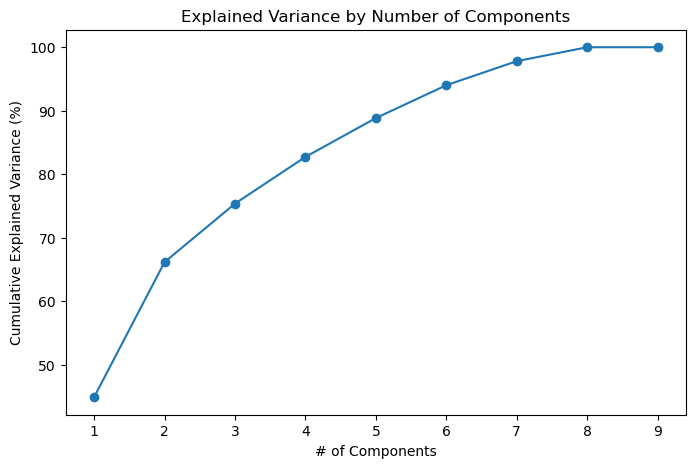

In [768]:
plt.figure(figsize=(8,5))
plt.plot(range(1, len(var)+1),var, marker='o')
plt.xlabel('# of Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.title('Explained Variance by Number of Components')
plt.show()

In [769]:
components = pd.DataFrame(pca.components_, columns=features, index=[f'PC{i+1}' for i in range(pca.n_components_)])
df_pca = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(X_pca.shape[1])])
df_pca['Year'] = df_fe_f['Year']
df_pca['Target'] = y.values
df_pca

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,Year,Target
0,7.57,-7.90,3.33,0.09,0.97,0.20,-0.98,0.17,-0.00,2016,25118.23
1,7.37,-0.96,-4.55,-2.58,-0.83,-1.48,1.83,0.16,-0.00,2017,26902.00
2,4.56,3.75,-1.85,3.77,3.27,1.60,0.09,-0.60,-0.00,2018,25687.00
3,3.32,3.39,0.83,2.37,-4.52,-1.00,-1.59,-0.17,-0.00,2019,27576.00
4,-0.25,5.07,4.60,-2.19,0.97,-1.12,1.90,-0.86,-0.00,2020,32569.00
5,-1.93,3.25,-0.55,-3.06,1.07,1.18,-2.63,1.92,-0.00,2021,36039.00
6,-5.09,-2.14,-0.38,-0.84,-2.04,4.26,1.11,-0.96,-0.00,2022,39658.00
7,-7.23,-1.95,0.27,2.62,0.02,-1.22,1.91,2.25,-0.00,2023,44952.00
8,-8.32,-2.52,-1.70,-0.18,1.09,-2.43,-1.64,-1.89,-0.00,2024,45862.00


In [770]:
components

,Vehicles Licenced,Km Driven - (MM),Premiums (€),Fixed Charges (€),Asset Damage,Third Party Damage,Third Party Injury (<=250k),Third Party Injury (>250k),Asset Damage categorical,Third Party Damage categorical,...,Third Party Injury (<=250k)_L2,Third Party Injury (<=250k) categorical_L2,Third Party Injury (>250k)_L1,Vehicles Licenced_L4,flood_risk_L3,tcc_median_categorical_Slight_L4,tp_median_categorical_High_L3,tp_median_categorical_Low_L3,lag_indicator,Covid_dummy
PC1,-0.17,0.03,-0.12,0.09,-0.15,-0.15,0.15,-0.15,-0.15,-0.13,...,-0.12,0.01,-0.08,-0.16,-0.13,-0.09,-0.14,-0.14,-0.08,-0.02
PC2,0.01,-0.15,0.03,0.09,-0.10,-0.09,-0.05,-0.05,-0.10,0.02,...,0.16,0.22,0.18,0.02,0.02,-0.03,0.07,0.08,0.18,0.14
PC3,-0.02,-0.23,-0.10,0.18,-0.09,-0.11,-0.06,-0.13,-0.06,-0.11,...,0.05,0.07,-0.18,0.07,0.04,0.03,0.10,0.11,-0.18,0.16
PC4,-0.00,0.20,0.10,-0.21,0.07,0.11,0.14,-0.02,0.07,0.14,...,0.12,0.14,-0.00,-0.14,0.07,-0.06,-0.05,-0.06,-0.01,-0.26
PC5,-0.01,-0.11,0.05,0.12,-0.05,-0.09,-0.09,0.16,-0.05,-0.09,...,-0.01,0.00,-0.08,0.06,-0.13,-0.13,-0.18,-0.18,-0.08,0.12
PC6,-0.10,0.05,-0.31,0.10,0.04,0.04,0.02,0.07,0.04,0.06,...,0.09,0.06,-0.02,0.03,-0.03,0.36,0.01,-0.03,-0.02,0.00
PC7,-0.06,-0.04,0.07,-0.10,0.01,-0.03,0.04,0.03,0.12,-0.27,...,-0.09,-0.18,0.12,0.05,0.03,0.22,-0.08,-0.08,0.12,-0.07
PC8,-0.08,-0.01,0.06,-0.06,-0.07,-0.06,-0.10,0.04,-0.09,0.01,...,-0.06,-0.02,-0.04,0.06,0.45,0.03,0.11,-0.00,-0.04,0.18
PC9,-0.11,0.45,0.44,0.26,0.03,-0.01,-0.16,-0.11,0.02,0.07,...,-0.01,-0.04,-0.05,-0.04,0.02,0.01,0.08,0.00,-0.01,0.01


the variance of the model tops at 8 components. Hence these features are going to be the ones use to test and run the model 

In [771]:
top_selections = components.T.abs().sort_values(by='PC1', ascending=False).head(8)
top_selections

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
PIAB_30001_45000,0.17,0.01,0.02,0.01,0.00,0.02,0.02,0.03,0.12
Time_Index,0.17,0.02,0.03,0.00,0.02,0.03,0.02,0.02,0.01
PIAB_15001_30000,0.17,0.01,0.05,0.01,0.00,0.02,0.00,0.01,0.03
Litigated_15001_30000,0.17,0.02,0.01,0.04,0.00,0.04,0.01,0.00,0.02
Direct_10001_15000,0.17,0.00,0.06,0.01,0.01,0.01,0.03,0.02,0.09
PIAB_45001_60000,0.17,0.00,0.03,0.00,0.08,0.02,0.03,0.07,0.06
Litigated_60001_100000,0.17,0.02,0.05,0.07,0.03,0.04,0.04,0.06,0.06
Vehicles Licenced,0.17,0.01,0.02,0.00,0.01,0.10,0.06,0.08,0.11


Now the most relevant features are selected based on the PCA section

CPA was run before adding the lag dummy. The feature selection didn't change. It only had an influence on the variance reducing the number of features from 9 to 8

## Model

once the features are selected is time to select the best fitting model for this time series. 

<p>The nature of the data (8 years) makes the modeling part restrictive. with a small sample, many models tend to underperform.</p>
<p>2 models are going to be used to predict the target variable. afterwards, based on error analysis the best fitting model will be selected as the final selection for this study</p>


In [772]:
selected_features = top_selections.index.tolist()
target_variable = 'Non-life insurance technical reserves'
df_model = df_fe_f[selected_features + [target_variable]]
df_model

,PIAB_30001_45000,Time_Index,PIAB_15001_30000,Litigated_15001_30000,Direct_10001_15000,PIAB_45001_60000,Litigated_60001_100000,Vehicles Licenced,Non-life insurance technical reserves
0,11713886.06,0,29907409.05,22286045.80,19902288.33,4092672.45,56357572.33,2624958,25118.23
1,10967412.31,1,26418833.63,21436328.17,17033164.86,3983826.42,62420394.12,2675879,26902.00
2,9547363.01,2,23203473.85,21333925.72,15333433.05,3838584.58,58329174.82,2717722,25687.00
3,9250335.83,3,23081000.71,19457181.70,15965012.50,2873159.36,56219803.97,2805839,27576.00
4,6621599.05,4,18685512.34,15251397.64,12951653.31,2389131.50,44588791.35,2860984,32569.00
5,5404586.18,5,13566149.11,13085546.23,10763745.91,2670470.18,38013864.08,2890975,36039.00
6,2272077.95,6,7711265.97,10707821.73,7246152.25,1529690.86,36031101.90,2919005,39658.00
7,1767893.53,7,5902879.71,8144733.94,6166829.79,1421254.05,34150335.23,3002092,44952.00
8,717973.01,8,3174730.54,5654088.44,4573088.63,1132190.93,31932224.58,3143356,45862.00


In [804]:
!pip install scikit-lego


[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: python.exe -m pip install --upgrade pip


In [773]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.svm import SVR 
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
y = df_model[['Non-life insurance technical reserves']]	
#time index must be remove from x since it is only a split criterion
X = df_model.drop(columns=['Non-life insurance technical reserves', 'Time_Index'])
split_year = 5
y_train = y.loc[df_model['Time_Index'] < split_year]
y_test = y.loc[df_model['Time_Index'] >= split_year]
X_train = X.loc[df_model['Time_Index'] < split_year]
X_test = X.loc[df_model['Time_Index'] >= split_year]
n_neighbors = min(7, len(X_train))
models = {
    'Linear Regression': LinearRegression(),
    'Linear Regression Lasso': Lasso(alpha=0.1),
    'Linear Regression Ridge': Ridge(alpha=1),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(n_estimators=100, random_state=42),
    'k-Nearest Neighbour': KNeighborsRegressor(n_neighbors = n_neighbors),
    'Support Vector Machine': SVR()}
# Store results
results = []

# Train and evaluate models
for name, model in models.items():
    # Train the model
    model.fit(X_train, y_train)
    
    # Predict on the test set
    y_pred = model.predict(X_test)

    y_test_flat = y_test.values.flatten()
    y_pred_flat = y_pred.flatten() 
    # Calculate performance metrics
    mae = mean_absolute_error(y_test_flat, y_pred_flat)
    mse = mean_squared_error(y_test_flat, y_pred_flat)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((y_test_flat - y_pred_flat) / np.where(y_test_flat == 0, 1, y_test_flat))) * 100
    r2 = r2_score(y_test_flat, y_pred_flat)
    
    # Append results to the list
    results.append([name, mae, mse, rmse, mape, r2])

# Create a DataFrame to display the results
results_df = pd.DataFrame(results, columns=['Model', 'MAE', 'MSE', 'RMSE', 'MAPE', 'R2 Score'])
print(results_df)

                     Model      MAE          MSE     RMSE  MAPE  R2 Score
0        Linear Regression  3642.94  14798434.65  3846.87  8.64      0.08
1  Linear Regression Lasso  1675.76   3760681.91  1939.25  3.91      0.77
2  Linear Regression Ridge  3642.94  14798434.65  3846.87  8.64      0.08
3            Decision Tree  9058.75  98084339.75  9903.75 21.01     -5.12
4            Random Forest 11095.37 138664603.38 11775.59 25.96     -7.65
5      k-Nearest Neighbour 14057.30 213631156.72 14616.13 33.13    -12.33
6   Support Vector Machine 14725.18 232854248.36 15259.56 34.75    -13.53


  File "C:\Users\dmoli\anaconda3\Lib\site-packages\joblib\externals\loky\backend\context.py", line 257, in _count_physical_cores
    cpu_info = subprocess.run(
        "wmic CPU Get NumberOfCores /Format:csv".split(),
        capture_output=True,
        text=True,
    )
  File "C:\Users\dmoli\anaconda3\Lib\subprocess.py", line 554, in run
    with Popen(*popenargs, **kwargs) as process:
         ~~~~~^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\dmoli\anaconda3\Lib\subprocess.py", line 1039, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
    ~~~~~~~~~~~~~~~~~~~^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
                        pass_fds, cwd, env,
                        ^^^^^^^^^^^^^^^^^^^
    ...<5 lines>...
                        gid, gids, uid, umask,
                        ^^^^^^^^^^^^^^^^^^^^^^
                        start_new_session, process_group)
                        ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\dmoli\anaconda3\Lib\subprocess.

In [774]:
results = []
split_year = 6
y_train = y.loc[df_model['Time_Index'] < split_year]
y_test = y.loc[df_model['Time_Index'] >= split_year]
X_train = X.loc[df_model['Time_Index'] < split_year]
X_test = X.loc[df_model['Time_Index'] >= split_year]
# Train and evaluate models using cross-validation for R² Score
for name, model in models.items():
    # Perform cross-validation
    cv_scores = cross_val_score(model, X, y, cv=3, scoring='r2')
    mean_cv_score = cv_scores.mean()  # Mean R² score
    
    # Train the model on the full dataset for predictions
    model.fit(X, y)
    y_pred = model.predict(X_test)
    y_test_flat = y_test.values.flatten()
    y_pred_flat = y_pred.flatten() 
    # Calculate performance metrics
    mae = mean_absolute_error(y_test_flat, y_pred_flat)
    mse = mean_squared_error(y_test_flat, y_pred_flat)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((y_test_flat - y_pred_flat) / np.where(y_test_flat == 0, 1, y_test_flat))) * 100
    test_r2 = r2_score(y_test, y_pred)
    
    # Store results
    results.append([name, mean_cv_score, mae, mse, rmse, mape, test_r2])

# Create a DataFrame to display the results
results_df = pd.DataFrame(results, columns=["Model", "Mean CV R² Score", 'MAE', 'MSE', 'RMSE', 'MAPE', 'test_r2'])
print("\nModel Performance Metrics using Cross-Validation for R² Score:")
print(results_df)


Model Performance Metrics using Cross-Validation for R² Score:
                     Model  Mean CV R² Score      MAE          MSE     RMSE  \
0        Linear Regression            -19.32   589.83    402047.11   634.07   
1  Linear Regression Lasso             -4.72   732.59    547724.09   740.08   
2  Linear Regression Ridge            -19.32   589.83    402047.11   634.07   
3            Decision Tree             -4.44     0.00         0.00     0.00   
4            Random Forest            -11.19   812.48    783835.04   885.34   
5      k-Nearest Neighbour            -72.08  3780.00  20985858.67  4581.03   
6   Support Vector Machine            -97.72 10919.55 126718166.59 11256.92   

   MAPE  test_r2  
0  1.36     0.95  
1  1.69     0.93  
2  1.36     0.95  
3  0.00     1.00  
4  1.83     0.90  
5  8.34    -1.80  
6 24.80   -15.93  


In [775]:
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.metrics import r2_score

param_grid = {
    'Linear Regression': {},
    'Lasso': {'model__alpha': [0.001, 0.01, 0.1]},
    'Ridge': {'model__alpha': [0.001, 0.01, 0.1]},
    'Decision Tree': {'model__max_depth': [2, 3, None]},
    'Random Forest': {'model__n_estimators': [10, 50], 'model__max_depth': [2, 3, None]},
    'kNN': {'model__n_neighbors': [2, 3]},
    'SVR': {'model__C': [0.1, 1, 10]}
}


models = {
    'Linear Regression': LinearRegression(),
    'Lasso': Lasso(random_state=42, max_iter=5000),
    'Ridge': Ridge(random_state=42),
    'Decision Tree': DecisionTreeRegressor(random_state=42),
    'Random Forest': RandomForestRegressor(random_state=42),
    'kNN': KNeighborsRegressor(),
    'SVR': SVR(kernel='linear')
}

results = []
predictions = {}
split_year = 6
# Use your predefined time-based split
X_train = X.loc[df_model['Time_Index'] < split_year]
X_test = X.loc[df_model['Time_Index'] >= split_year]
y_train = y.loc[df_model['Time_Index'] < split_year]
y_test = y.loc[df_model['Time_Index'] >= split_year]

for name, model in models.items():
    print(f"Training {name}...")
    
    pipe = Pipeline([
        ('scaler', StandardScaler()),
        ('model', model)
    ])
    
    grid_search = GridSearchCV(
        pipe,
        param_grid=param_grid[name],
        cv=2,
        n_jobs=-1,  # Parallel processing
        scoring='r2'
    )
    
    grid_search.fit(X_train, y_train)
    
    best_model = grid_search.best_estimator_
    y_pred = best_model.predict(X_test)
    y_test_flat = y_test.values.flatten()
    y_pred_flat = y_pred.flatten() 
    # Calculate performance metrics
    mae = mean_absolute_error(y_test_flat, y_pred_flat)
    mse = mean_squared_error(y_test_flat, y_pred_flat)
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((y_test_flat - y_pred_flat) / np.where(y_test_flat == 0, 1, y_test_flat))) * 100
    test_r2 = r2_score(y_test, y_pred)
    
    results.append([
        name, grid_search.best_params_, grid_search.best_score_, test_r2,  mae, mse, rmse, mape
    ])
    
    predictions[name] = y_pred

results_df = pd.DataFrame(results, columns=["Model", "Best Parameters", "Best CV R²", "Test R²", 'mae', 'mse', 'rmse', 'mape'])
print(results_df)

Training Linear Regression...
Training Lasso...
Training Ridge...
Training Decision Tree...
Training Random Forest...
Training kNN...
Training SVR...
               Model                                    Best Parameters  \
0  Linear Regression                                                 {}   
1              Lasso                             {'model__alpha': 0.01}   
2              Ridge                            {'model__alpha': 0.001}   
3      Decision Tree                            {'model__max_depth': 2}   
4      Random Forest  {'model__max_depth': 2, 'model__n_estimators':...   
5                kNN                          {'model__n_neighbors': 2}   
6                SVR                                   {'model__C': 10}   

   Best CV R²  Test R²      mae          mse     rmse  mape  
0       -9.63     0.21  2198.03   5943807.47  2437.99  5.12  
1       -5.52     0.32  2246.55   5052930.33  2247.87  5.20  
2       -9.63     0.20  2206.79   5957586.30  2440.82  5.13  
3

Ploting forecast 

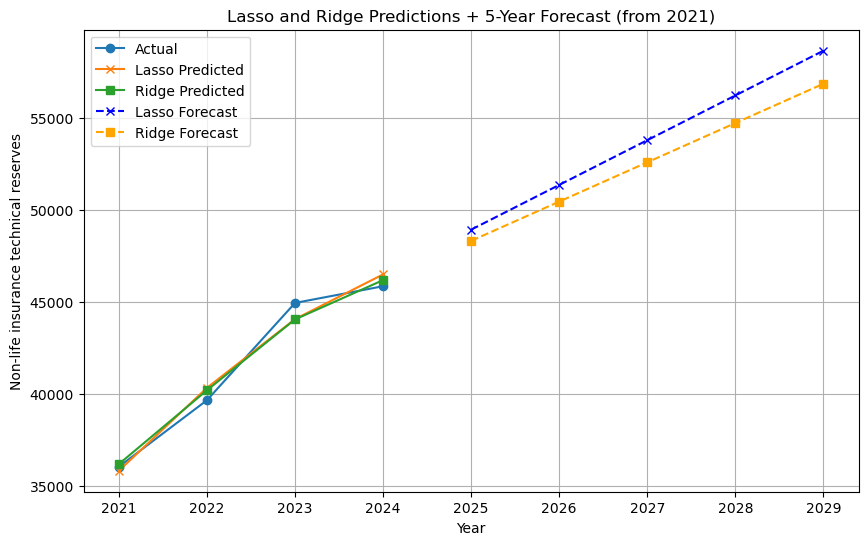

In [777]:
split_year = 5
y_train = y.loc[df_model['Time_Index'] < split_year]
y_test = y.loc[df_model['Time_Index'] >= split_year]
X_train = X.loc[df_model['Time_Index'] < split_year]
X_test = X.loc[df_model['Time_Index'] >= split_year]
lasso = Lasso(alpha=0.1)
ridge = Ridge(alpha=1)
lasso.fit(X, y)
ridge.fit(X, y)

# Predictions on historical data
y_pred_lasso = lasso.predict(X_test)
y_pred_ridge = ridge.predict(X_test)

years_test = 2016 + df_model.loc[df_model['Time_Index'] >= split_year, 'Time_Index'].values
plt.figure(figsize=(10,6))
plt.plot(years_test, y_test, marker='o', label='Actual')
plt.plot(years_test, y_pred_lasso, marker='x', label='Lasso Predicted')
plt.plot(years_test, y_pred_ridge, marker='s', label='Ridge Predicted')
slope_lasso = y_pred_lasso[-1] - y_pred_lasso[-2]
slope_ridge = y_pred_ridge[-1] - y_pred_ridge[-2]
future_lasso = y_pred_lasso[-1] + slope_lasso * np.arange(1, 6)
future_ridge = y_pred_ridge[-1] + slope_ridge * np.arange(1, 6)
future_years = np.arange(years_test.max()+1, years_test.max()+6)
plt.plot(future_years, future_lasso, 'x--', color='blue', label='Lasso Forecast')
plt.plot(future_years, future_ridge, 's--', color='orange', label='Ridge Forecast')

plt.xlabel('Year')
plt.ylabel('Non-life insurance technical reserves')
plt.title('Lasso and Ridge Predictions + 5-Year Forecast (from 2021)')
plt.legend()
plt.grid(True)
plt.show()

Real Life applications of model

An Financial Acid Test based on forecasted data is going to be performed in order to identify if the insurance companies needs to increase their assets to achieve liquidity during the forecaste years 

In [847]:
assets = [393242, 388291, 386651, 404636, 417774, 408271, 413766, 435577, 443769]
df_a = pd.DataFrame({'Time_Index': list(range(0, 9)), 'Assets': assets})

In [848]:
df_model_1 = df_model.copy() 
df_model_1 = df_model_1.merge(df_a, on='Time_Index', how='left')
df_model_1

,PIAB_30001_45000,Time_Index,PIAB_15001_30000,Litigated_15001_30000,Direct_10001_15000,PIAB_45001_60000,Litigated_60001_100000,Vehicles Licenced,Non-life insurance technical reserves,Assets
0,11713886.06,0,29907409.05,22286045.80,19902288.33,4092672.45,56357572.33,2624958,25118.23,393242
1,10967412.31,1,26418833.63,21436328.17,17033164.86,3983826.42,62420394.12,2675879,26902.00,388291
2,9547363.01,2,23203473.85,21333925.72,15333433.05,3838584.58,58329174.82,2717722,25687.00,386651
3,9250335.83,3,23081000.71,19457181.70,15965012.50,2873159.36,56219803.97,2805839,27576.00,404636
4,6621599.05,4,18685512.34,15251397.64,12951653.31,2389131.50,44588791.35,2860984,32569.00,417774
5,5404586.18,5,13566149.11,13085546.23,10763745.91,2670470.18,38013864.08,2890975,36039.00,408271
6,2272077.95,6,7711265.97,10707821.73,7246152.25,1529690.86,36031101.90,2919005,39658.00,413766
7,1767893.53,7,5902879.71,8144733.94,6166829.79,1421254.05,34150335.23,3002092,44952.00,435577
8,717973.01,8,3174730.54,5654088.44,4573088.63,1132190.93,31932224.58,3143356,45862.00,443769


In [851]:
y_pred_2025 = lasso.predict(X_test)[1]
y_pred_2026 = lasso.predict(X_test)[2] 
y_pred_2027 = lasso.predict(X_test)[3] 
y_pred_2028 = lasso.predict(X_test)[4]
x_2024 
acid_test_2025 = #operation
acid_test_2026 = #operation
acid_test_2027 = #operation 
acid_test_2028 = #operation
# dataframe storing results
# plot showing results

SyntaxError: invalid syntax (934454837.py, line 6)

In [854]:
from sklearn.linear_model import LinearRegression, Lasso, Ridge
y = df_model[['Non-life insurance technical reserves']]	
#time index must be remove from x since it is only a split criterion
X = df_model.drop(columns=['Non-life insurance technical reserves', 'Time_Index'])
split_year = 5
y_train = y.loc[df_model['Time_Index'] < split_year]
y_test = y.loc[df_model['Time_Index'] >= split_year]
X_train = X.loc[df_model['Time_Index'] < split_year]
X_test = X.loc[df_model['Time_Index'] >= split_year]
model = Lasso(alpha=0.1)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
y_pred

array([35921.22554402, 37190.48638319, 42412.35402502, 47440.11016417])

In [857]:
y_pred_2025 = y_pred[0]
y_pred_2026 = y_pred[1]
y_pred_2027 = y_pred[2]
y_pred_2028 = y_pred[3] 
mask = df_model_1['Time_Index'] == 8 
asset_2024 = df_model_1.loc[df_model_1['Time_Index'] == 8, 'Assets'].values[0] 
asset_2024

np.int64(443769)

In [861]:
pred = [y_pred_2025, y_pred_2026, y_pred_2027, y_pred_2028] 
resulst = []
j = 2024
for i in pred:
    coverage_diff = asset_2024 - i
    coverage_ratio = asset_2024 / i 
    year = j + 1
    j = year 
    resulst.append({'Year': year, 'Difference': coverage_diff, 'Ratio': coverage_ratio})
df_ratio = pd.DataFrame(resulst) 
df_ratio

,Year,Difference,Ratio
0,2025,407847.77,12.35
1,2026,406578.51,11.93
2,2027,401356.65,10.46
3,2028,396328.89,9.35


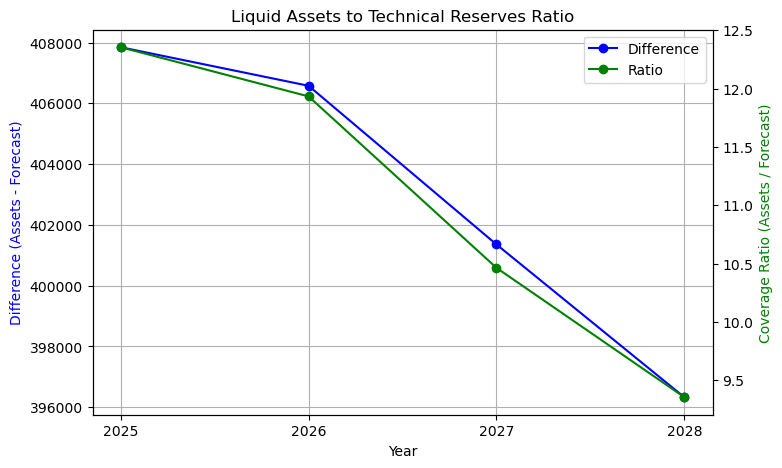

In [865]:
fig, ax1 = plt.subplots(figsize=(8,5))
ax1.set_xlabel('Year')
ax1.set_ylabel('Difference (Assets - Forecast)', color='b')
ax1.plot(df_ratio['Year'], df_ratio['Difference'], marker='o', color='b', label='Difference')
ax1.tick_params(axis='y')
ax1.set_xticks(df_ratio['Year'])
ax2 = ax1.twinx()
ax2.set_ylabel('Coverage Ratio (Assets / Forecast)', color='g')
ax2.plot(df_ratio['Year'], df_ratio['Ratio'], marker='o', color='g', label='Ratio')
ax2.tick_params(axis='y')
plt.title('Liquid Assets to Technical Reserves Ratio')
ax1.grid(True) 
lines, labels = ax1.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax1.legend(lines + lines2, labels + labels2, loc='upper right')
plt.show()